In [1]:
import math
import xarray as xr
import cartopy.crs as ccrs
import matplotlib as mpl
from matplotlib import pyplot as plt 
import matplotlib.pylab as plt
import matplotlib.path as mpath
from matplotlib.pyplot import figure
import numpy as np
import cartopy.feature as cfeature
from matplotlib.cm import get_cmap
import pyproj
import utm
import pandas as pd 
import traceback 
from pathlib import Path  
import os  
import numpy.ma as ma
import netCDF4 as nc
from netCDF4 import Dataset
import glob
import datetime as dt
import metpy.calc as mpcalc
from metpy.units import units
from metpy.cbook import get_test_data
from metpy.io import metar
from metpy.plots.declarative import (BarbPlot, ContourPlot, FilledContourPlot, MapPanel,
                                     PanelContainer, PlotObs)
from netCDF4 import date2num,num2date
import wrf
from wrf import (getvar, interplevel, to_np, latlon_coords, get_cartopy,
                 cartopy_xlim, cartopy_ylim)
from wrf import getvar, interplevel, to_np, get_basemap, latlon_coords

In [2]:
sstRun_6 = xr.open_dataset('/Users/Anna/Desktop/WRF/shortRunSST/wrfout_d03_2018-03-25_06_00_00')
sstRun_7 = xr.open_dataset('/Users/Anna/Desktop/WRF/shortRunSST/wrfout_d03_2018-03-25_07_00_00') 
sstRun_8 = xr.open_dataset('/Users/Anna/Desktop/WRF/shortRunSST/wrfout_d03_2018-03-25_08_00_00') 
sstRun_9 = xr.open_dataset('/Users/Anna/Desktop/WRF/shortRunSST/wrfout_d03_2018-03-25_09_00_00') 
sstRun_10 = xr.open_dataset('/Users/Anna/Desktop/WRF/shortRunSST/wrfout_d03_2018-03-25_10_00_00') 
sstRun_11 = xr.open_dataset('/Users/Anna/Desktop/WRF/shortRunSST/wrfout_d03_2018-03-25_11_00_00') 
sstRun_12 = xr.open_dataset('/Users/Anna/Desktop/WRF/shortRunSST/wrfout_d03_2018-03-25_12_00_00') 
sstRun_13 = xr.open_dataset('/Users/Anna/Desktop/WRF/shortRunSST/wrfout_d03_2018-03-25_13_00_00') 
sstRun_14 = xr.open_dataset('/Users/Anna/Desktop/WRF/shortRunSST/wrfout_d03_2018-03-25_14_00_00') 
sstRun_15 = xr.open_dataset('/Users/Anna/Desktop/WRF/shortRunSST/wrfout_d03_2018-03-25_15_00_00') 
sstRun_16 = xr.open_dataset('/Users/Anna/Desktop/WRF/shortRunSST/wrfout_d03_2018-03-25_16_00_00') 
sstRun_17 = xr.open_dataset('/Users/Anna/Desktop/WRF/shortRunSST/wrfout_d03_2018-03-25_17_00_00') 
sstRun_18 = xr.open_dataset('/Users/Anna/Desktop/WRF/shortRunSST/wrfout_d03_2018-03-25_18_00_00') 
sstRun_19 = xr.open_dataset('/Users/Anna/Desktop/WRF/shortRunSST/wrfout_d03_2018-03-25_19_00_00') 
sstRun_20 = xr.open_dataset('/Users/Anna/Desktop/WRF/shortRunSST/wrfout_d03_2018-03-25_20_00_00') 
sstRun_21 = xr.open_dataset('/Users/Anna/Desktop/WRF/shortRunSST/wrfout_d03_2018-03-25_21_00_00') 
sstRun_22 = xr.open_dataset('/Users/Anna/Desktop/WRF/shortRunSST/wrfout_d03_2018-03-25_22_00_00') 
sstRun_23 = xr.open_dataset('/Users/Anna/Desktop/WRF/shortRunSST/wrfout_d03_2018-03-25_23_00_00') 
sstRun_24 = xr.open_dataset('/Users/Anna/Desktop/WRF/shortRunSST/wrfout_d03_2018-03-26_00_00_00') 


In [ ]:
#print(sstRun_12.variables)

#XLAT, XLONG, ZNU, W, QVAPOR, LH, HFX, PBLH, SST_INPUT, UST
#QVAPOR and W have eta levels

#calc: wind speed, temperature, potential temperature, virtual temperature, tau

#XLAT_U, XLONG_U, XLAT_V, XLONG_V, U, V, V10, U10

#print('eta levels: ', sstRun_6.ZNU.values, '\neta shape: ', sstRun_6.ZNU.shape)
#print('sfc = 9.96907353e-01', sstRun_6.ZNU[0,0], 'PBL = 9.58004236e-01', sstRun_6.ZNU[0,5], 'free atmo = 5.52296400e-01', sstRun_6.ZNU[0,26])


In [3]:
xlat = sstRun_6.XLAT.values
xlon = sstRun_6.XLONG.values
sst_in = sstRun_6.SST_INPUT.values
print('xlat shape:', xlat.shape, 'xlon shape: ', xlon.shape, 'sst_in shape: ', sst_in.shape)

#PBLH
pblh_6 = sstRun_6.PBLH.values
pblh_7 = sstRun_7.PBLH.values
pblh_8 = sstRun_8.PBLH.values
pblh_9 = sstRun_9.PBLH.values
pblh_10 = sstRun_10.PBLH.values
pblh_11 = sstRun_11.PBLH.values
pblh_12 = sstRun_12.PBLH.values
pblh_13 = sstRun_13.PBLH.values
pblh_14 = sstRun_14.PBLH.values
pblh_15 = sstRun_15.PBLH.values
pblh_16 = sstRun_16.PBLH.values
pblh_17 = sstRun_17.PBLH.values 
pblh_18 = sstRun_18.PBLH.values
pblh_19 = sstRun_19.PBLH.values
pblh_20 = sstRun_20.PBLH.values
pblh_21 = sstRun_21.PBLH.values
pblh_22 = sstRun_22.PBLH.values
pblh_23 = sstRun_23.PBLH.values
pblh_24 = sstRun_24.PBLH.values
print('pblh shape: ', pblh_6.shape)

#W
w_6 = sstRun_6.W.values
w_7 = sstRun_7.W.values
w_8 = sstRun_8.W.values
w_9 = sstRun_9.W.values
w_10 = sstRun_10.W.values
w_11 = sstRun_11.W.values
w_12 = sstRun_12.W.values
w_13 = sstRun_13.W.values
w_14 = sstRun_14.W.values
w_15 = sstRun_15.W.values
w_16 = sstRun_16.W.values
w_17 = sstRun_17.W.values
w_18 = sstRun_18.W.values
w_19 = sstRun_19.W.values
w_20 = sstRun_20.W.values
w_21 = sstRun_21.W.values
w_22 = sstRun_22.W.values
w_23 = sstRun_23.W.values
w_24 = sstRun_24.W.values
print('w shape: ', w_6.shape)

#QAPOR
qv_6 = sstRun_6.QVAPOR.values
qv_7 = sstRun_7.QVAPOR.values
qv_8 = sstRun_8.QVAPOR.values
qv_9 = sstRun_9.QVAPOR.values
qv_10 = sstRun_10.QVAPOR.values
qv_11 = sstRun_11.QVAPOR.values
qv_12 = sstRun_12.QVAPOR.values
qv_13 = sstRun_13.QVAPOR.values
qv_14 = sstRun_14.QVAPOR.values
qv_15 = sstRun_15.QVAPOR.values
qv_16 = sstRun_16.QVAPOR.values
qv_17 = sstRun_17.QVAPOR.values
qv_18 = sstRun_18.QVAPOR.values
qv_19 = sstRun_19.QVAPOR.values
qv_20 = sstRun_20.QVAPOR.values
qv_21 = sstRun_21.QVAPOR.values
qv_22 = sstRun_22.QVAPOR.values
qv_23 = sstRun_23.QVAPOR.values
qv_24 = sstRun_24.QVAPOR.values
print('qv shape: ', qv_6.shape)

#LH
lhf_6 = sstRun_6.LH.values
lhf_7 = sstRun_7.LH.values
lhf_8 = sstRun_8.LH.values
lhf_9 = sstRun_9.LH.values
lhf_10 = sstRun_10.LH.values
lhf_11 = sstRun_11.LH.values
lhf_12 = sstRun_12.LH.values
lhf_13 = sstRun_13.LH.values
lhf_14 = sstRun_14.LH.values
lhf_15 = sstRun_15.LH.values
lhf_16 = sstRun_16.LH.values
lhf_17 = sstRun_17.LH.values
lhf_18 = sstRun_18.LH.values
lhf_19 = sstRun_19.LH.values
lhf_20 = sstRun_20.LH.values
lhf_21 = sstRun_21.LH.values
lhf_22 = sstRun_22.LH.values
lhf_23 = sstRun_23.LH.values
lhf_24 = sstRun_24.LH.values
print('lhf shape: ', lhf_6.shape)

#HFX
shf_6 = sstRun_6.HFX.values
shf_7 = sstRun_7.HFX.values
shf_8 = sstRun_8.HFX.values
shf_9 = sstRun_9.HFX.values
shf_10 = sstRun_10.HFX.values
shf_11 = sstRun_11.HFX.values
shf_12 = sstRun_12.HFX.values
shf_13 = sstRun_13.HFX.values
shf_14 = sstRun_14.HFX.values
shf_15 = sstRun_15.HFX.values
shf_16 = sstRun_16.HFX.values
shf_17 = sstRun_17.HFX.values
shf_18 = sstRun_18.HFX.values
shf_19 = sstRun_19.HFX.values
shf_20 = sstRun_20.HFX.values
shf_21 = sstRun_21.HFX.values
shf_22 = sstRun_22.HFX.values
shf_23 = sstRun_23.HFX.values
shf_24 = sstRun_24.HFX.values
print('shf shape: ', shf_6.shape)

#UST
ustar_6 = sstRun_6.UST.values
ustar_7 = sstRun_7.UST.values
ustar_8 = sstRun_8.UST.values
ustar_9 = sstRun_9.UST.values
ustar_10 = sstRun_10.UST.values
ustar_11 = sstRun_11.UST.values
ustar_12 = sstRun_12.UST.values
ustar_13 = sstRun_13.UST.values
ustar_14 = sstRun_14.UST.values
ustar_15 = sstRun_15.UST.values
ustar_16 = sstRun_16.UST.values
ustar_17 = sstRun_17.UST.values
ustar_18 = sstRun_18.UST.values
ustar_19 = sstRun_19.UST.values
ustar_20 = sstRun_20.UST.values
ustar_21 = sstRun_21.UST.values
ustar_22 = sstRun_22.UST.values
ustar_23 = sstRun_23.UST.values
ustar_24 = sstRun_24.UST.values
print('ustar shape: ', ustar_6.shape)


#U10
u10_6 = sstRun_6.U10.values
u10_7 = sstRun_7.U10.values
u10_8 = sstRun_8.U10.values
u10_9 = sstRun_9.U10.values
u10_10 = sstRun_10.U10.values
u10_11 = sstRun_11.U10.values
u10_12 = sstRun_12.U10.values
u10_13 = sstRun_13.U10.values
u10_14 = sstRun_14.U10.values
u10_15 = sstRun_15.U10.values
u10_16 = sstRun_16.U10.values
u10_17 = sstRun_17.U10.values
u10_18 = sstRun_18.U10.values
u10_19 = sstRun_19.U10.values
u10_20 = sstRun_20.U10.values
u10_21 = sstRun_21.U10.values
u10_22 = sstRun_22.U10.values
u10_23 = sstRun_23.U10.values
u10_24 = sstRun_24.U10.values
print('u10 shape: ', u10_22.shape)

#V10
v10_6 = sstRun_6.V10.values
v10_7 = sstRun_7.V10.values
v10_8 = sstRun_8.V10.values
v10_9 = sstRun_9.V10.values
v10_10 = sstRun_10.V10.values
v10_11 = sstRun_11.V10.values
v10_12 = sstRun_12.V10.values
v10_13 = sstRun_13.V10.values
v10_14 = sstRun_14.V10.values
v10_15 = sstRun_15.V10.values
v10_16 = sstRun_16.V10.values
v10_17 = sstRun_17.V10.values
v10_18 = sstRun_18.V10.values
v10_19 = sstRun_19.V10.values
v10_20 = sstRun_20.V10.values
v10_21 = sstRun_21.V10.values
v10_22 = sstRun_22.V10.values
v10_23 = sstRun_23.V10.values
v10_24 = sstRun_24.V10.values
print('v10 shape: ', u10_22.shape)

xlat shape: (1, 474, 639) xlon shape:  (1, 474, 639) sst_in shape:  (1, 474, 639)
pblh shape:  (1, 474, 639)
w shape:  (1, 100, 474, 639)
qv shape:  (1, 99, 474, 639)
lhf shape:  (1, 474, 639)
shf shape:  (1, 474, 639)
ustar shape:  (1, 474, 639)
u10 shape:  (1, 474, 639)
v10 shape:  (1, 474, 639)


In [4]:
#wind speed
speed10_6 = np.sqrt(u10_6**2 + v10_6**2)
speed10_7 = np.sqrt(u10_7**2 + v10_7**2)
speed10_8 = np.sqrt(u10_8**2 + v10_8**2)
speed10_9 = np.sqrt(u10_9**2 + v10_9**2)
speed10_10 = np.sqrt(u10_10**2 + v10_10**2)
speed10_11 = np.sqrt(u10_11**2 + v10_11**2)
speed10_12 = np.sqrt(u10_12**2 + v10_12**2)
speed10_13 = np.sqrt(u10_13**2 + v10_13**2)
speed10_14 = np.sqrt(u10_14**2 + v10_14**2)
speed10_15 = np.sqrt(u10_15**2 + v10_15**2)
speed10_16 = np.sqrt(u10_16**2 + v10_16**2)
speed10_17 = np.sqrt(u10_17**2 + v10_17**2)
speed10_18 = np.sqrt(u10_18**2 + v10_18**2)
speed10_19 = np.sqrt(u10_19**2 + v10_19**2)
speed10_20 = np.sqrt(u10_20**2 + v10_20**2)
speed10_21 = np.sqrt(u10_21**2 + v10_21**2)
speed10_22 = np.sqrt(u10_22**2 + v10_22**2)
speed10_23 = np.sqrt(u10_23**2 + v10_23**2)
speed10_24 = np.sqrt(u10_24**2 + v10_24**2)


C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


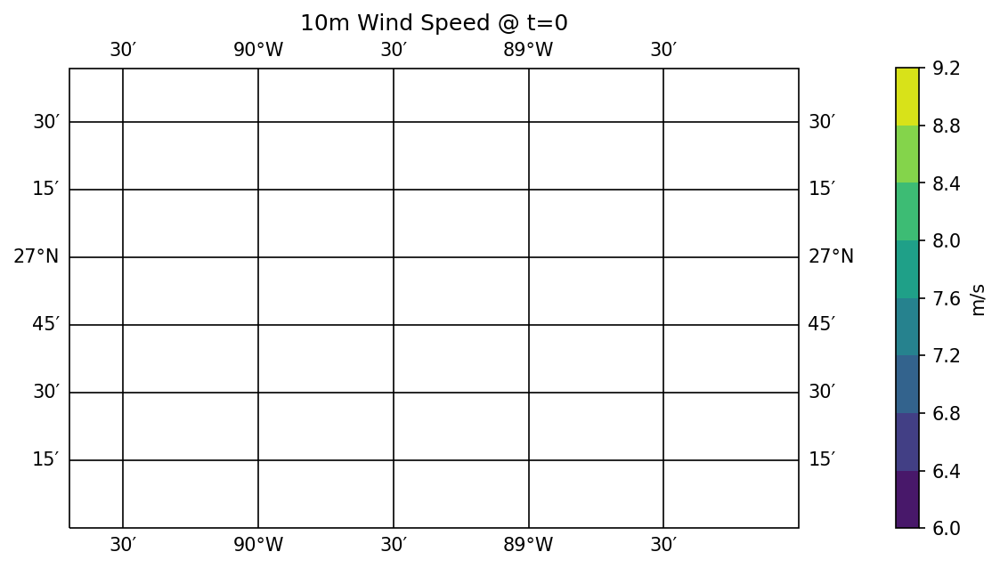

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


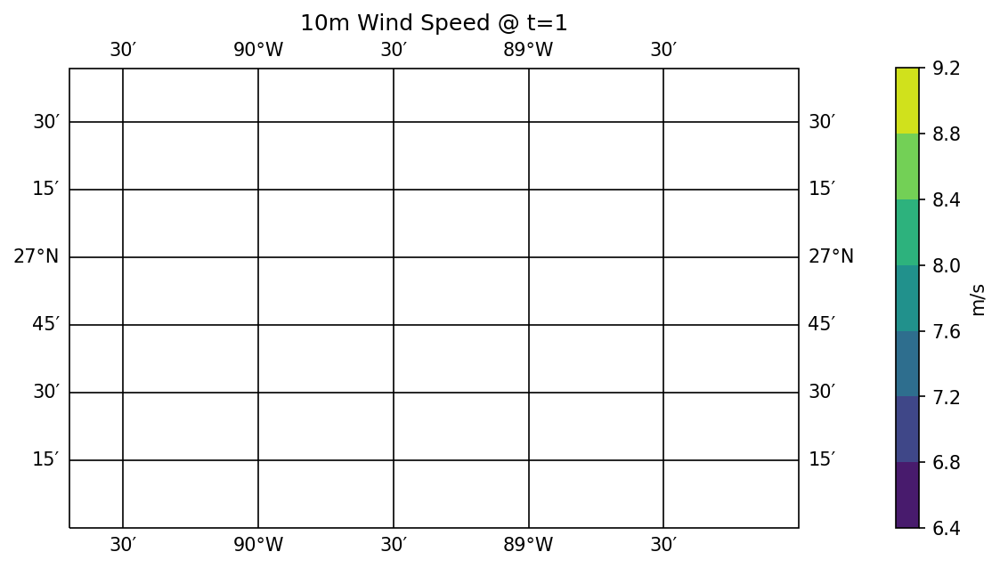

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


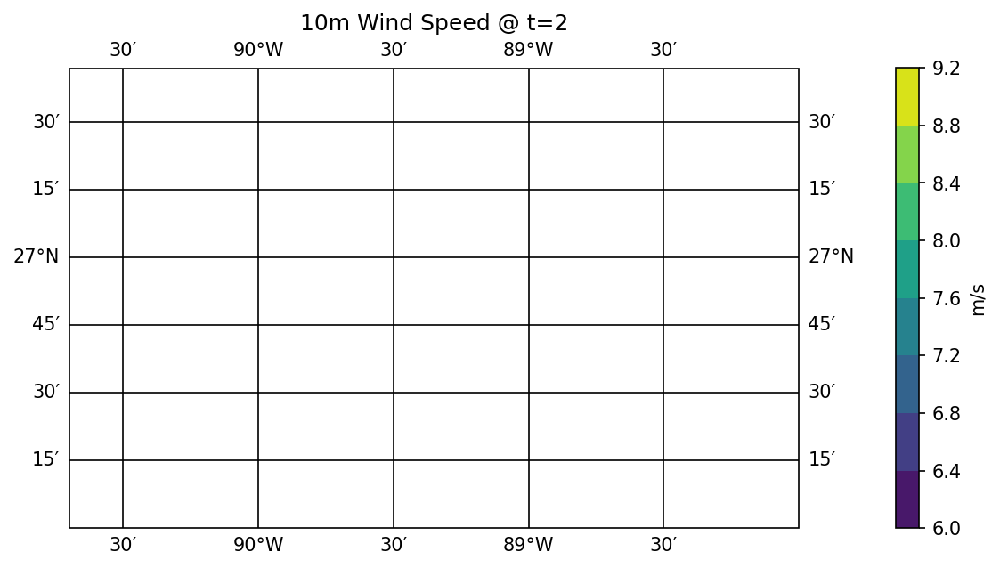

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


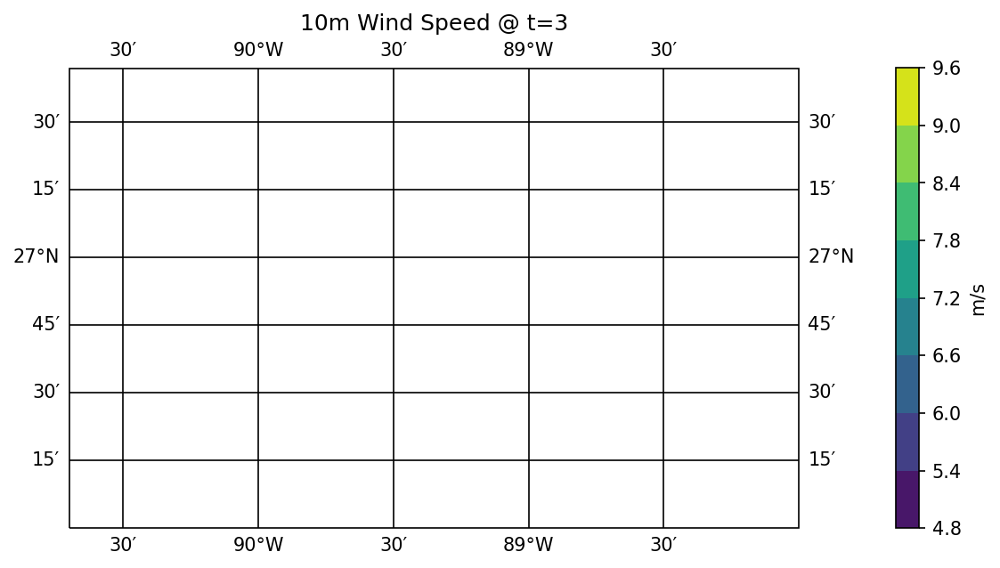

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


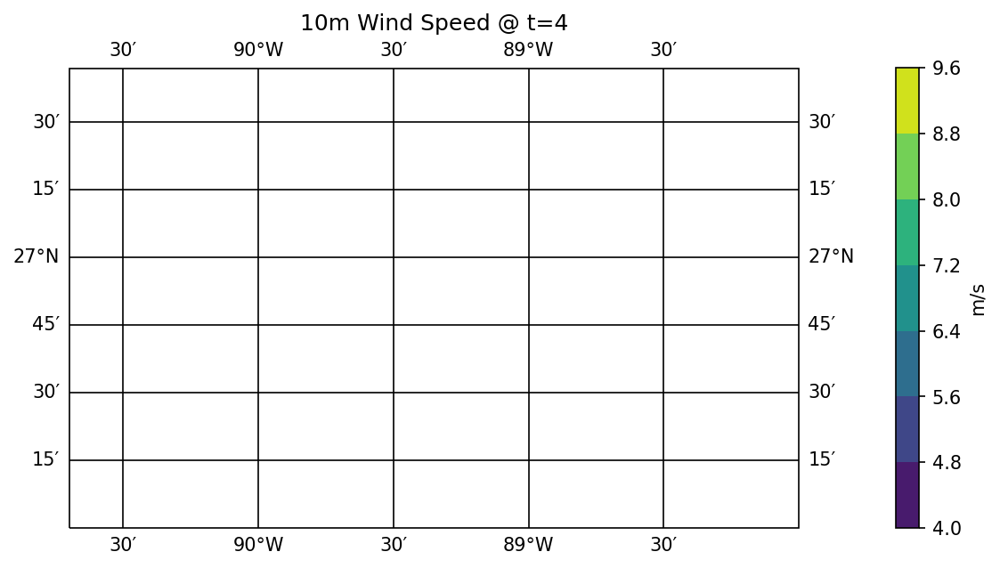

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


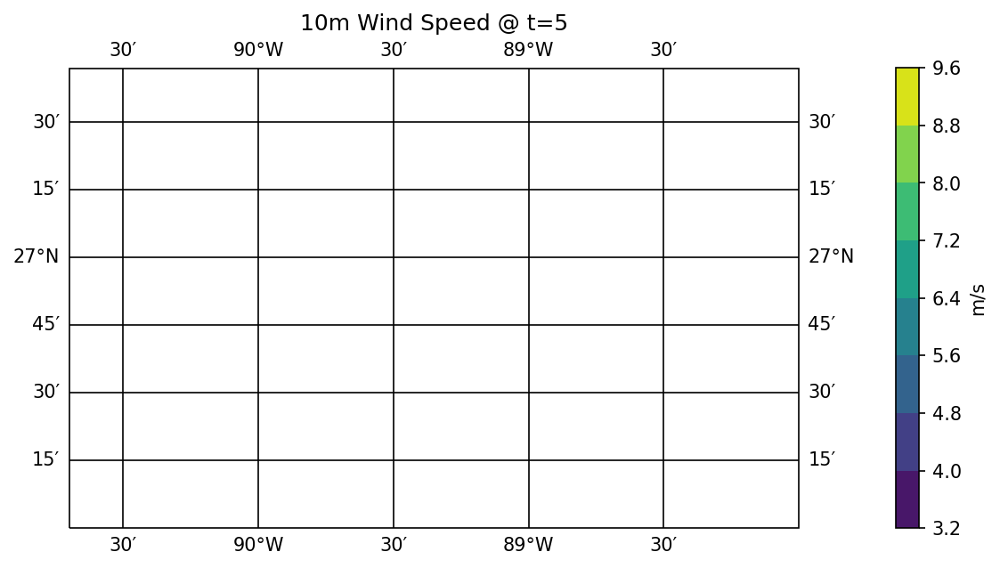

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


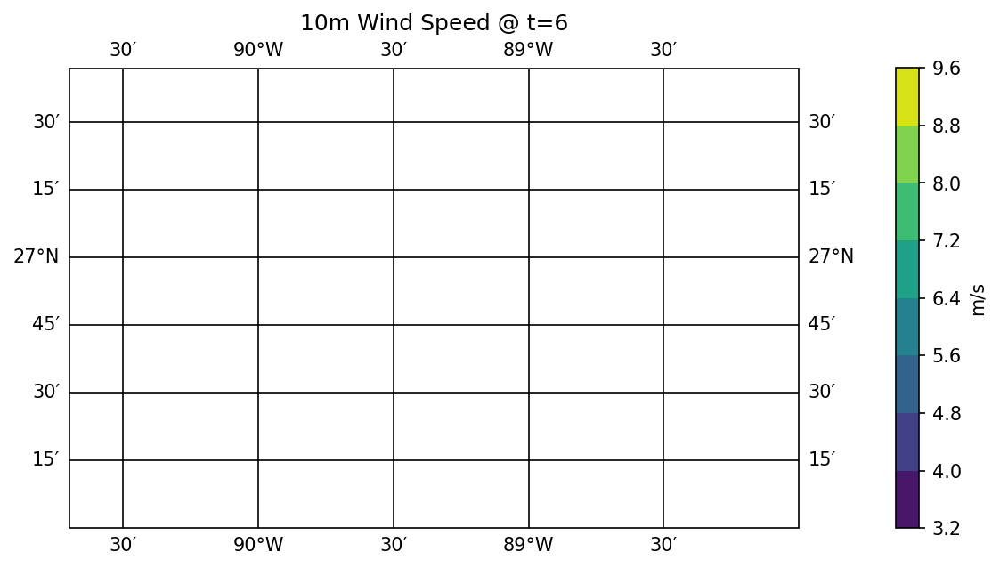

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


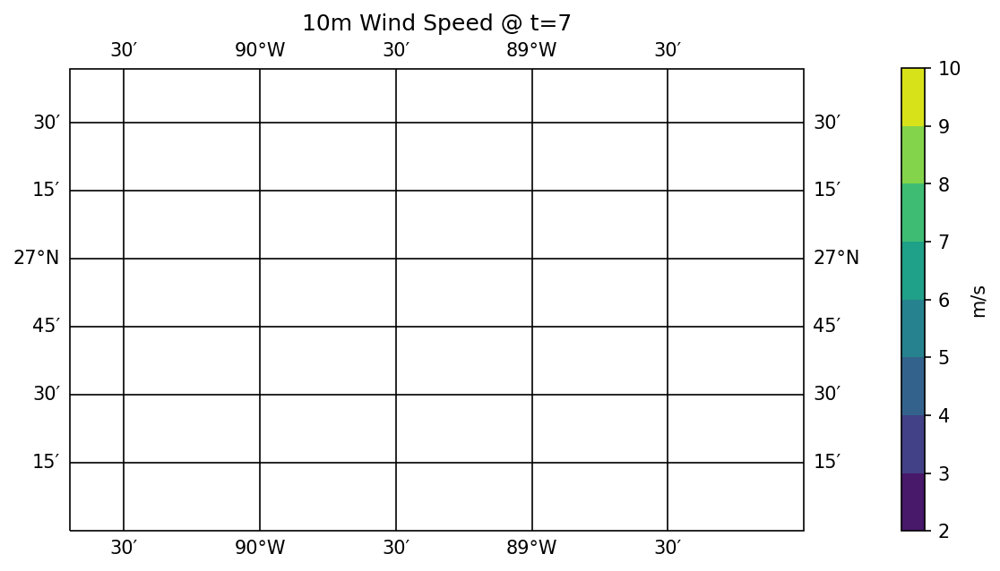

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


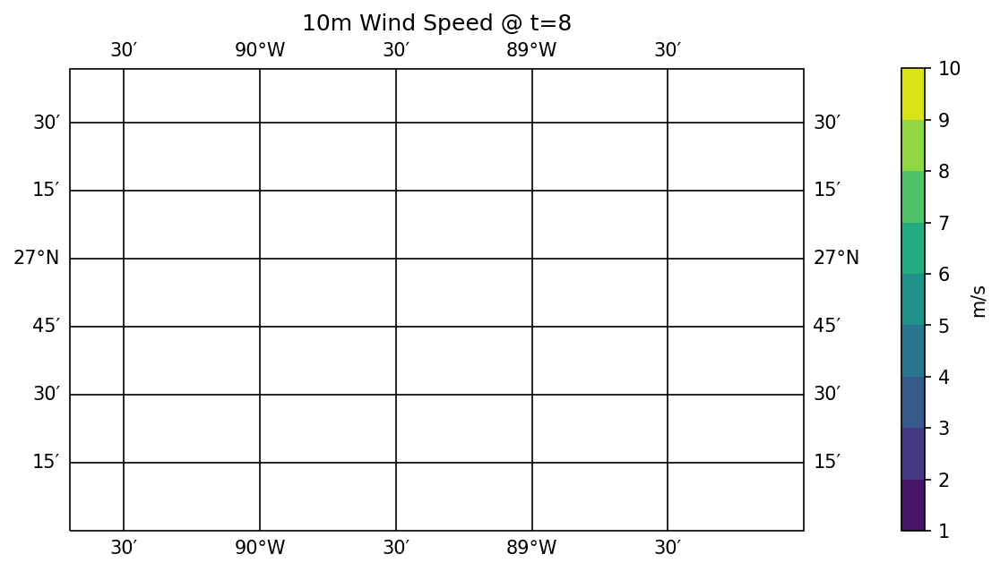

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


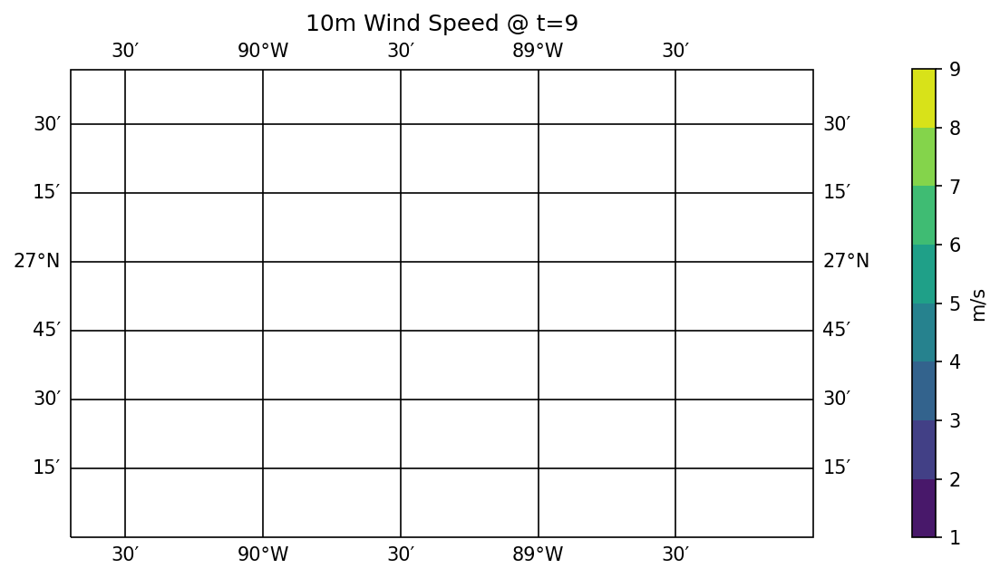

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


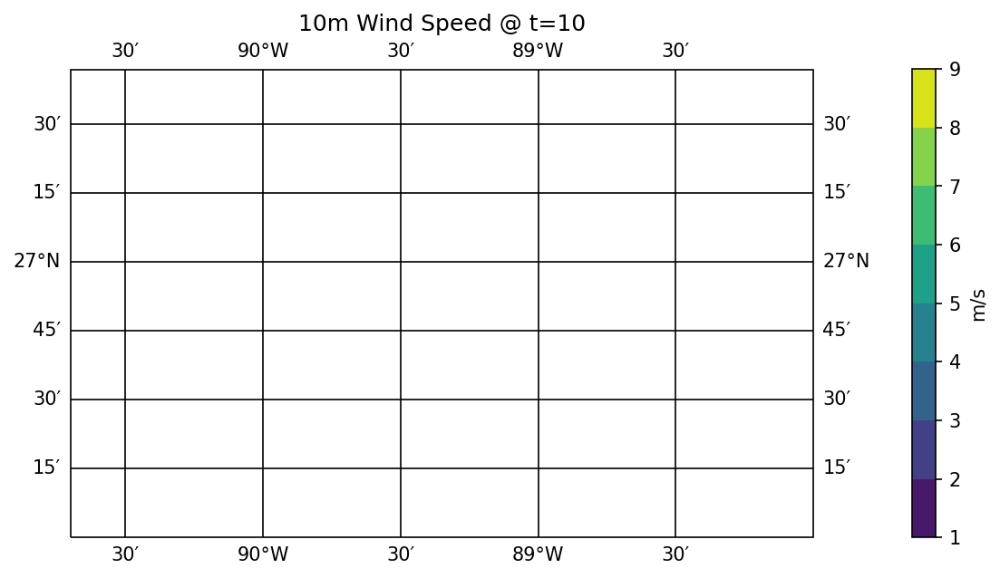

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


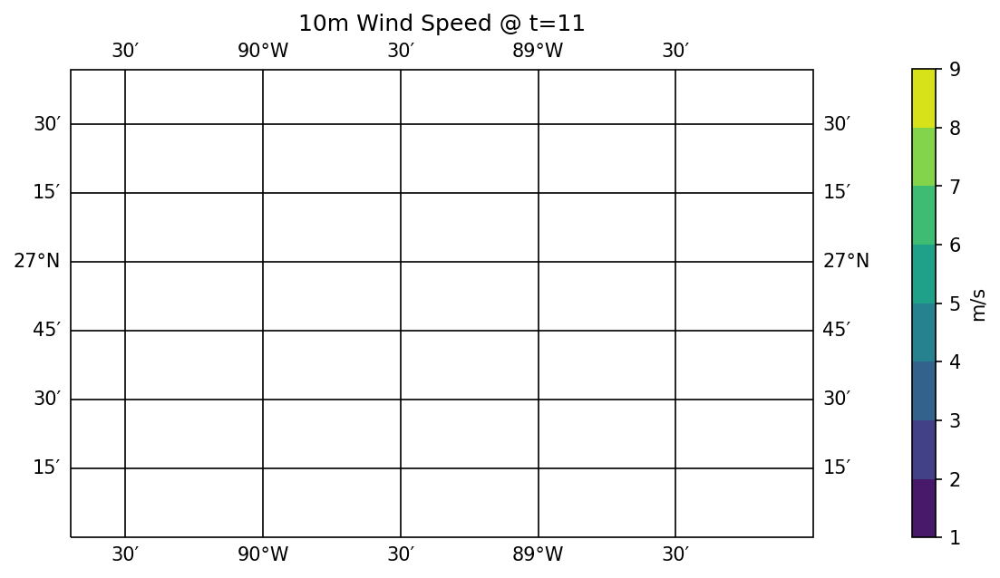

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


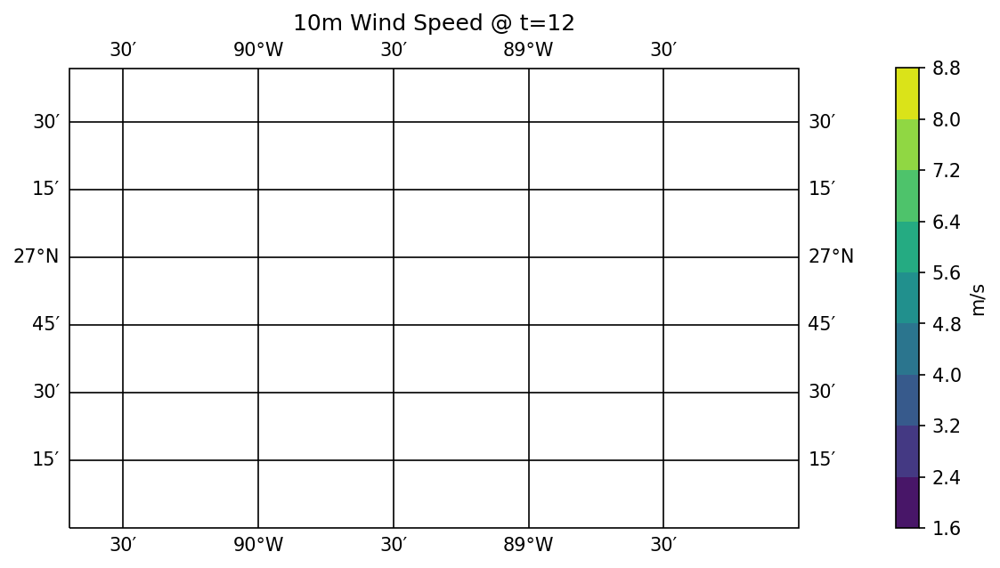

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


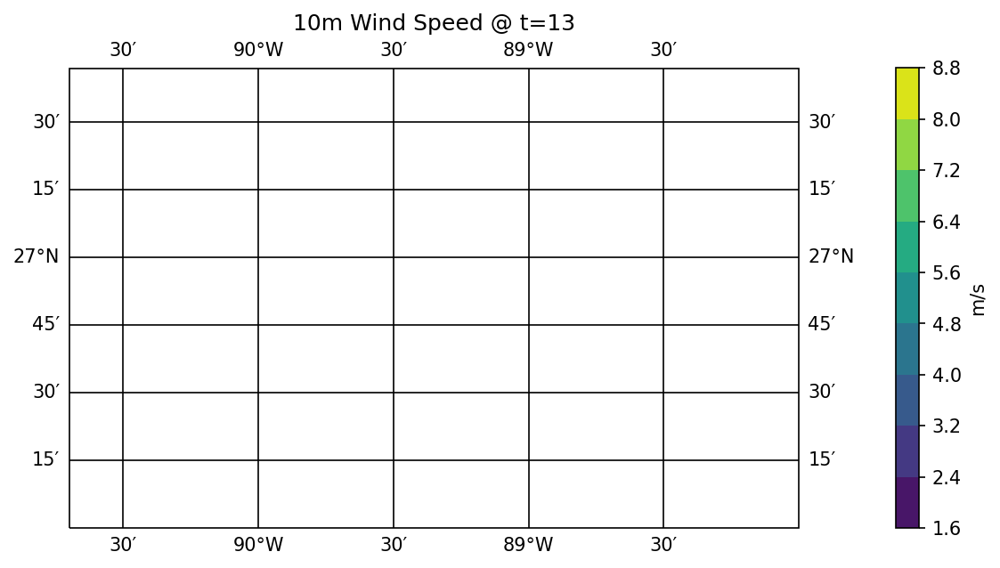

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


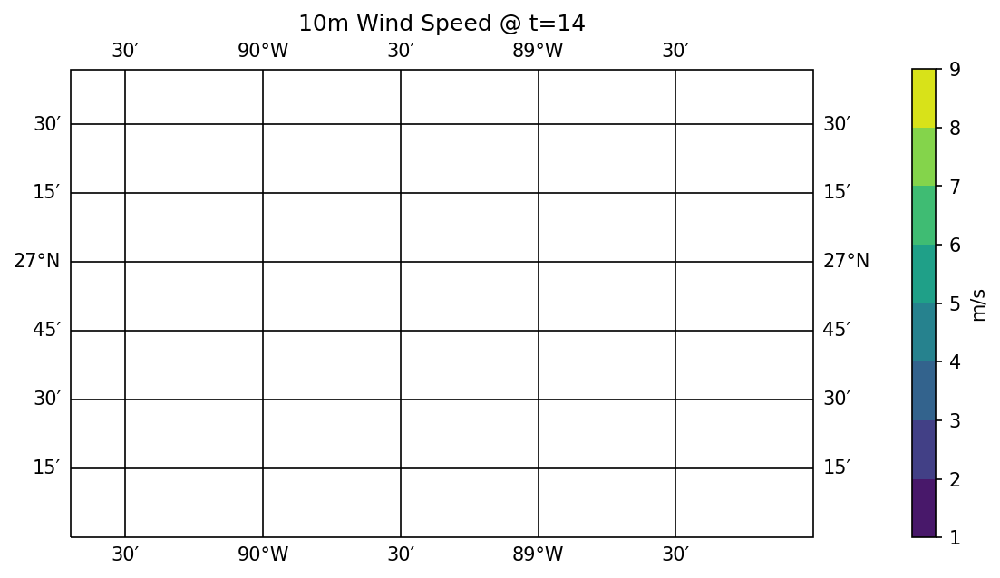

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


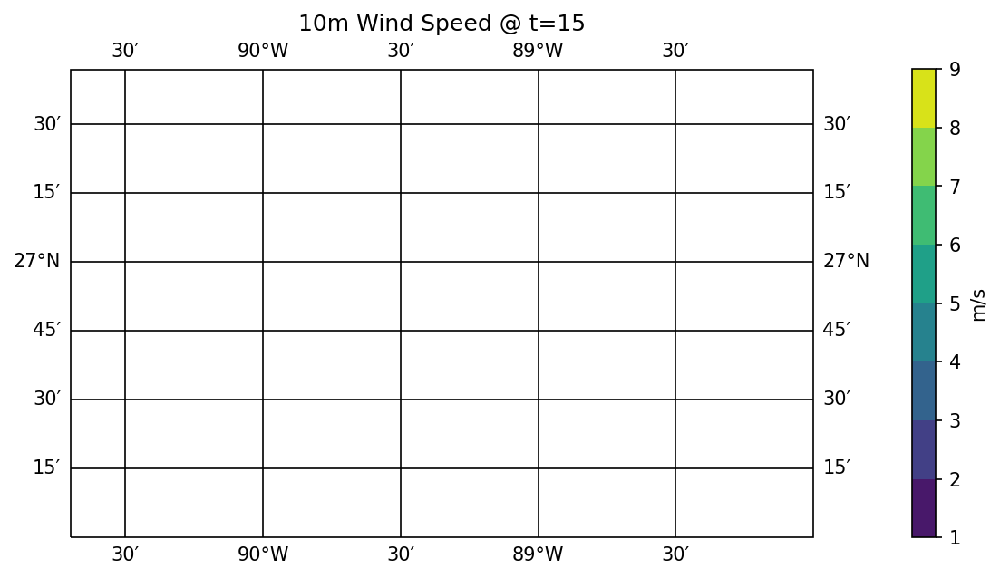

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


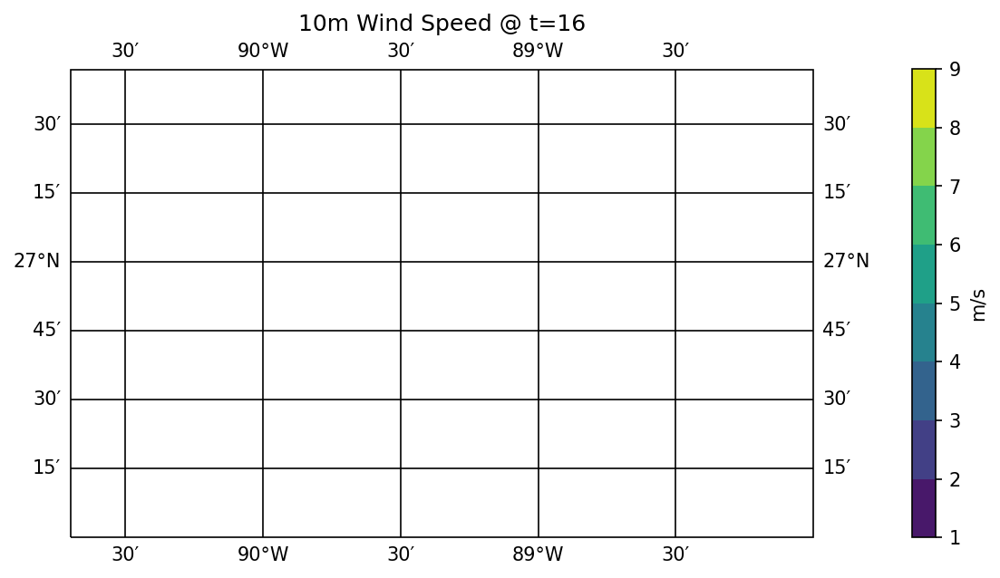

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


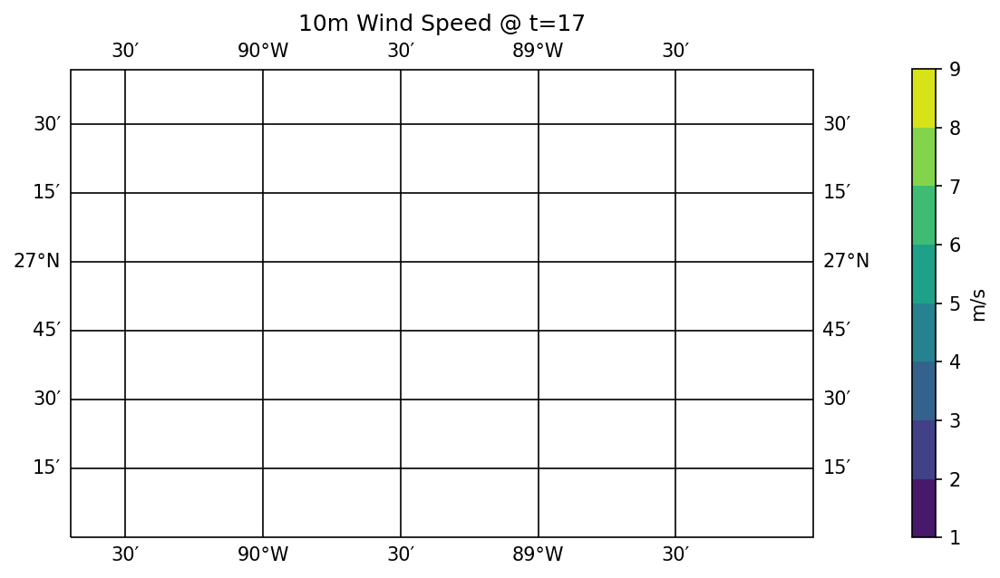

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


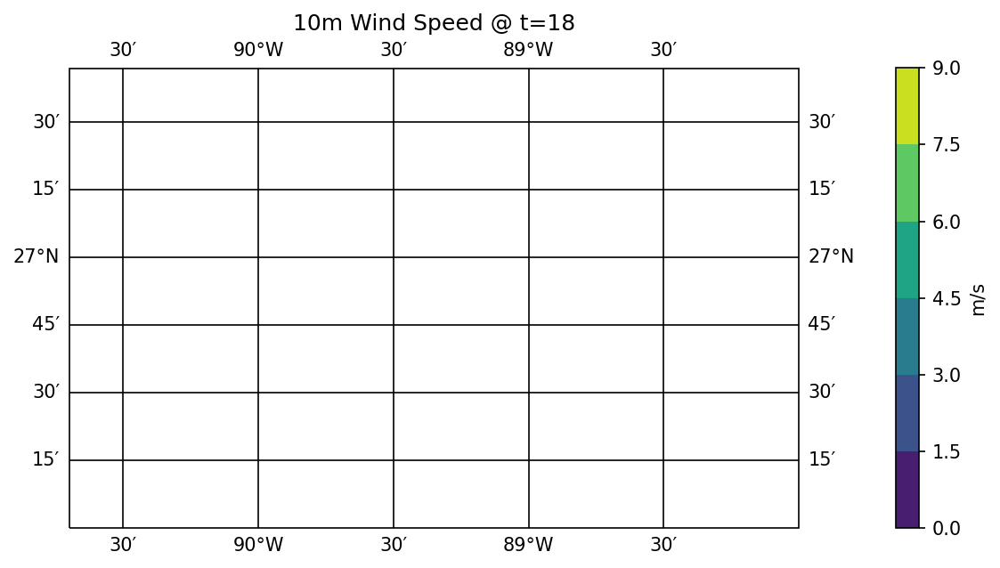

In [7]:
#10m wind
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
ax.set_extent([-90.7, -88.0, 26.0, 27.7], crs=mapcrs)
PCM=ax.get_children()[2]
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], speed10_6[0,:,:])
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('10m Wind Speed @ t=0')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + '10mSpeed_time0.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.set_extent([-90.7, -88.0, 26.0, 27.7], crs=mapcrs)
ax.coastlines()
PCM=ax.get_children()[2]
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], speed10_7[0,:,:])
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('10m Wind Speed @ t=1')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + '10mSpeed_time1.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.set_extent([-90.7, -88.0, 26.0, 27.7], crs=mapcrs)
ax.coastlines()
PCM=ax.get_children()[2]
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], speed10_8[0,:,:])
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('10m Wind Speed @ t=2')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + '10mSpeed_time2.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.set_extent([-90.7, -88.0, 26.0, 27.7], crs=mapcrs)
ax.coastlines()
PCM=ax.get_children()[2]
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], speed10_9[0,:,:])
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('10m Wind Speed @ t=3')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + '10mSpeed_time3.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.set_extent([-90.7, -88.0, 26.0, 27.7], crs=mapcrs)
ax.coastlines()
PCM=ax.get_children()[2]
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], speed10_10[0,:,:])
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('10m Wind Speed @ t=4')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + '10mSpeed_time4.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.set_extent([-90.7, -88.0, 26.0, 27.7], crs=mapcrs)
ax.coastlines()
PCM=ax.get_children()[2]
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], speed10_11[0,:,:])
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('10m Wind Speed @ t=5')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + '10mSpeed_time5.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.set_extent([-90.7, -88.0, 26.0, 27.7], crs=mapcrs)
ax.coastlines()
PCM=ax.get_children()[2]
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], speed10_11[0,:,:])
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('10m Wind Speed @ t=6')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + '10mSpeed_time6.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.set_extent([-90.7, -88.0, 26.0, 27.7], crs=mapcrs)
ax.coastlines()
PCM=ax.get_children()[2]
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], speed10_13[0,:,:])
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('10m Wind Speed @ t=7')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + '10mSpeed_time7.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.set_extent([-90.7, -88.0, 26.0, 27.7], crs=mapcrs)
ax.coastlines()
PCM=ax.get_children()[2]
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], speed10_14[0,:,:])
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('10m Wind Speed @ t=8')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + '10mSpeed_time8.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.set_extent([-90.7, -88.0, 26.0, 27.7], crs=mapcrs)
ax.coastlines()
PCM=ax.get_children()[2]
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], speed10_15[0,:,:])
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('10m Wind Speed @ t=9')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + '10mSpeed_time9.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.set_extent([-90.7, -88.0, 26.0, 27.7], crs=mapcrs)
ax.coastlines()
PCM=ax.get_children()[2]
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], speed10_16[0,:,:])
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('10m Wind Speed @ t=10')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + '10mSpeed_time10.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.set_extent([-90.7, -88.0, 26.0, 27.7], crs=mapcrs)
ax.coastlines()
PCM=ax.get_children()[2]
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], speed10_17[0,:,:])
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('10m Wind Speed @ t=11')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + '10mSpeed_time11.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.set_extent([-90.7, -88.0, 26.0, 27.7], crs=mapcrs)
ax.coastlines()
PCM=ax.get_children()[2]
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], speed10_18[0,:,:])
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('10m Wind Speed @ t=12')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + '10mSpeed_time12.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.set_extent([-90.7, -88.0, 26.0, 27.7], crs=mapcrs)
ax.coastlines()
PCM=ax.get_children()[2]
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], speed10_19[0,:,:])
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('10m Wind Speed @ t=13')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + '10mSpeed_time13.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.set_extent([-90.7, -88.0, 26.0, 27.7], crs=mapcrs)
ax.coastlines()
PCM=ax.get_children()[2]
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], speed10_20[0,:,:])
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('10m Wind Speed @ t=14')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + '10mSpeed_time14.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.set_extent([-90.7, -88.0, 26.0, 27.7], crs=mapcrs)
ax.coastlines()
PCM=ax.get_children()[2]
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], speed10_21[0,:,:])
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('10m Wind Speed @ t=15')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + '10mSpeed_time15.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.set_extent([-90.7, -88.0, 26.0, 27.7], crs=mapcrs)
ax.coastlines()
PCM=ax.get_children()[2]
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], speed10_22[0,:,:])
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('10m Wind Speed @ t=16')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + '10mSpeed_time16.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.set_extent([-90.7, -88.0, 26.0, 27.7], crs=mapcrs)
ax.coastlines()
PCM=ax.get_children()[2]
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], speed10_23[0,:,:])
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('10m Wind Speed @ t=17')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + '10mSpeed_time17.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.set_extent([-90.7, -88.0, 26.0, 27.7], crs=mapcrs)
ax.coastlines()
PCM=ax.get_children()[2]
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], speed10_24[0,:,:])
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('10m Wind Speed @ t=18')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + '10mSpeed_time18.png', bbox_inches = 'tight',dpi = 150)
plt.show()


C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


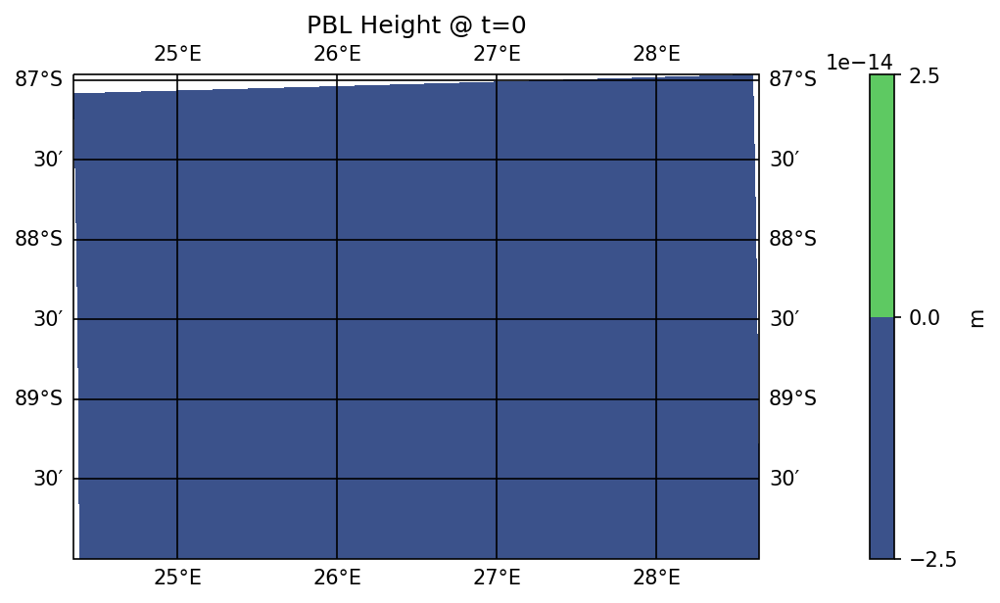

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


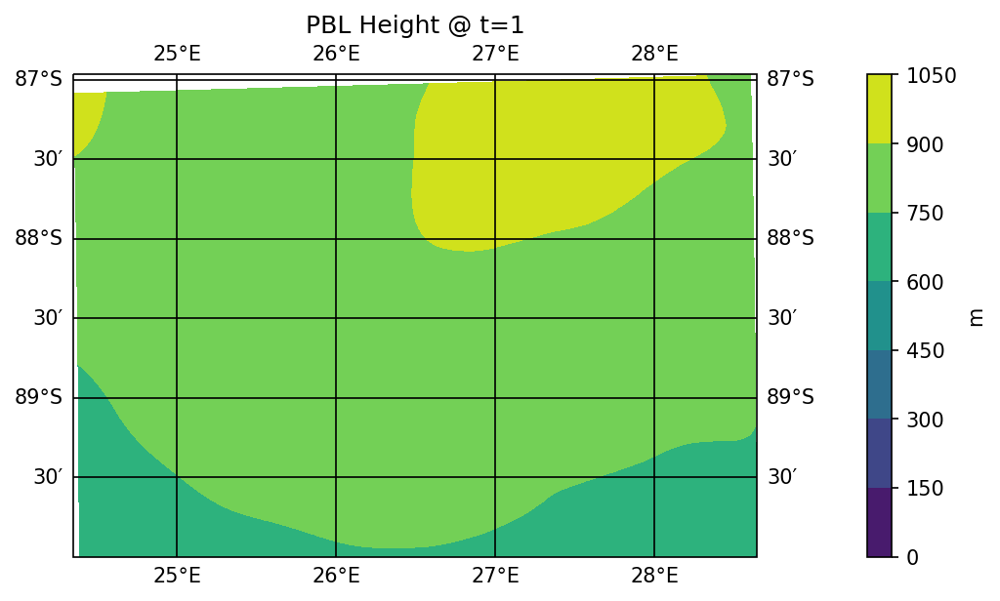

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


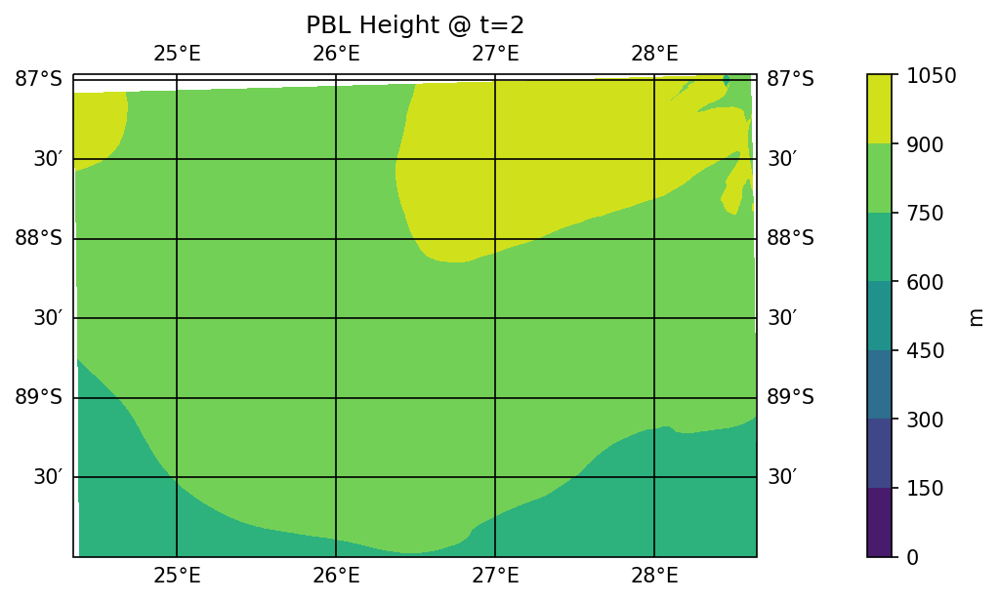

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


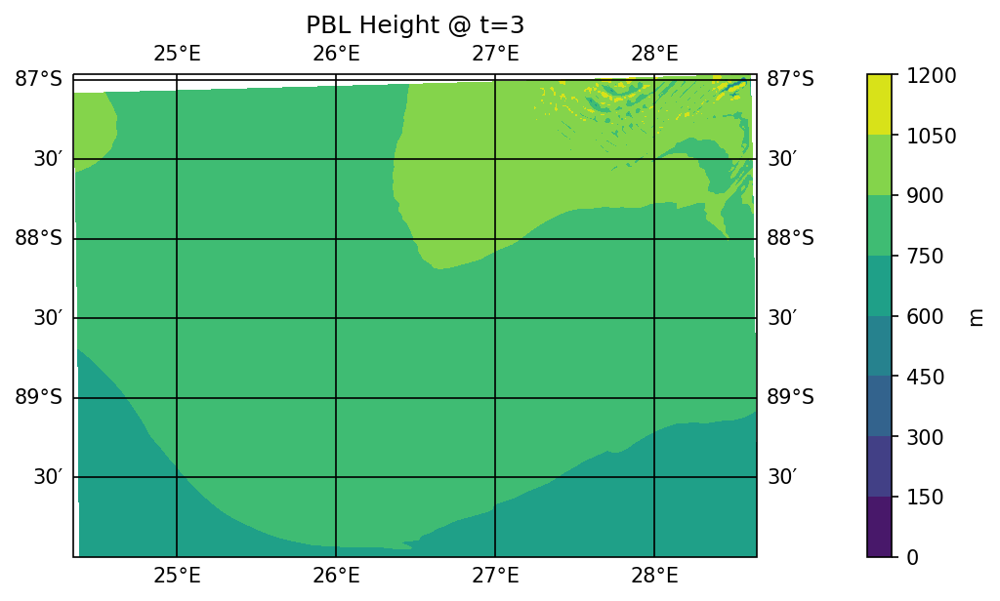

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


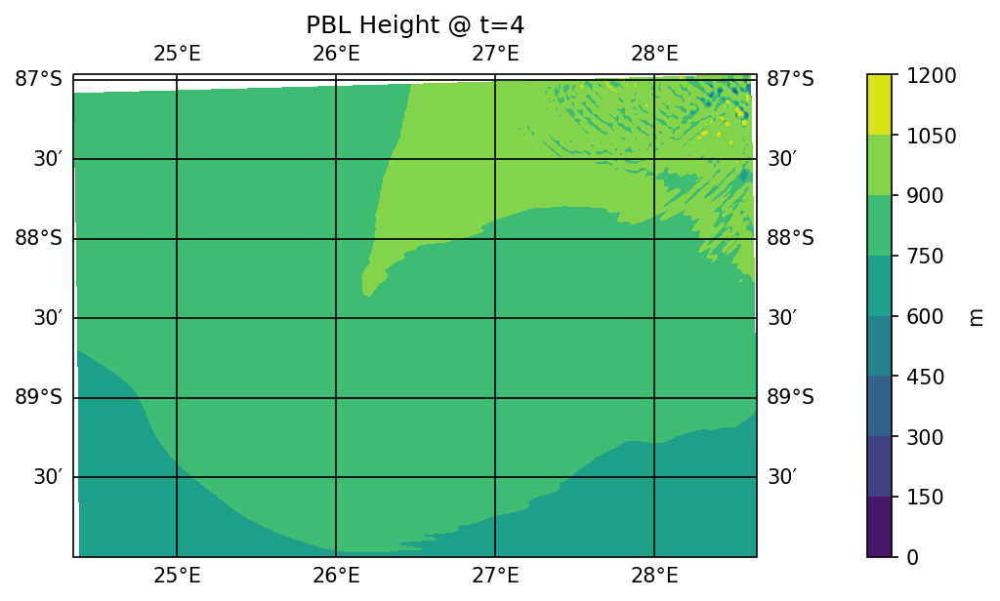

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


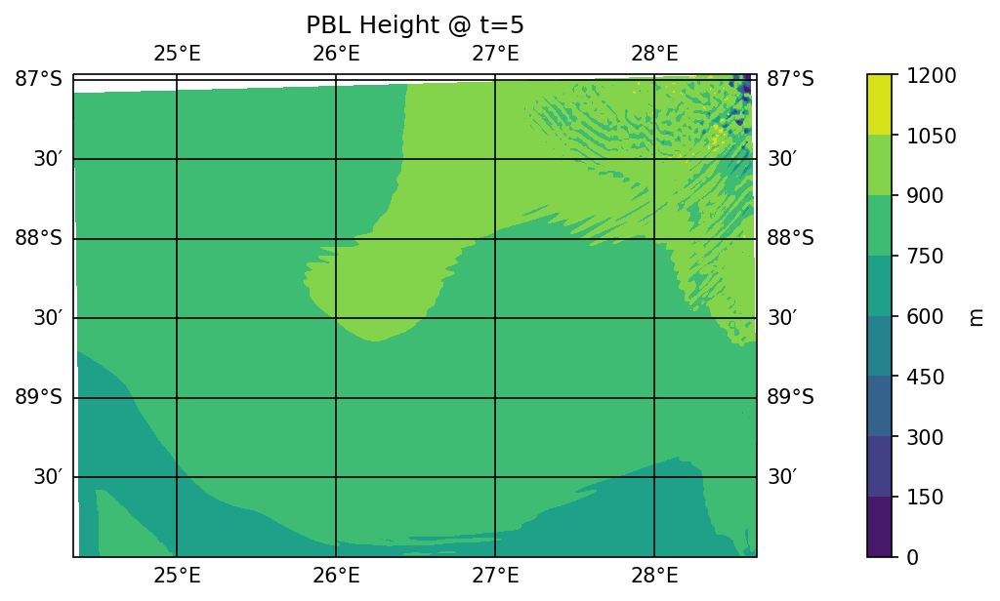

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


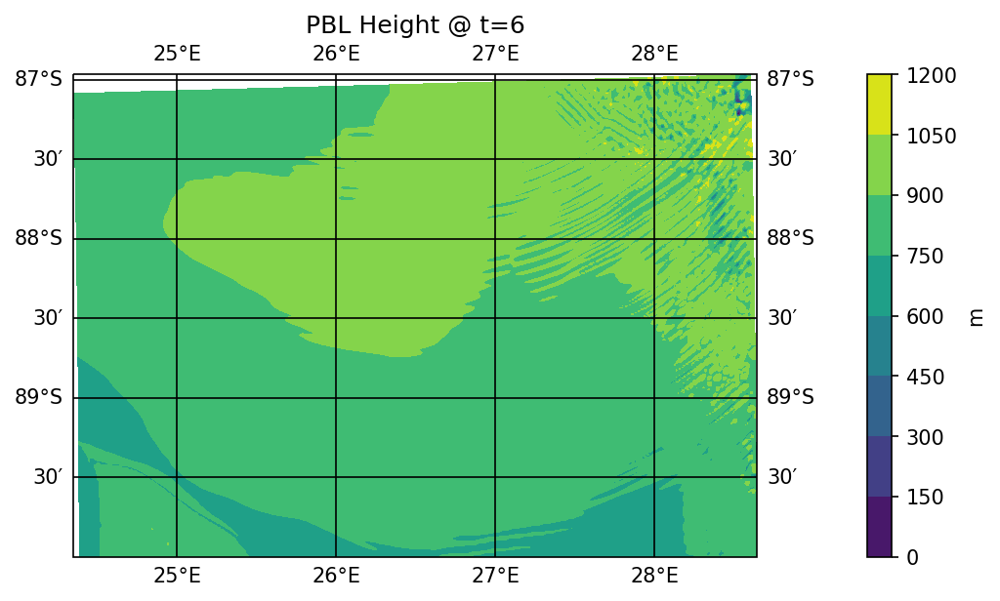

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


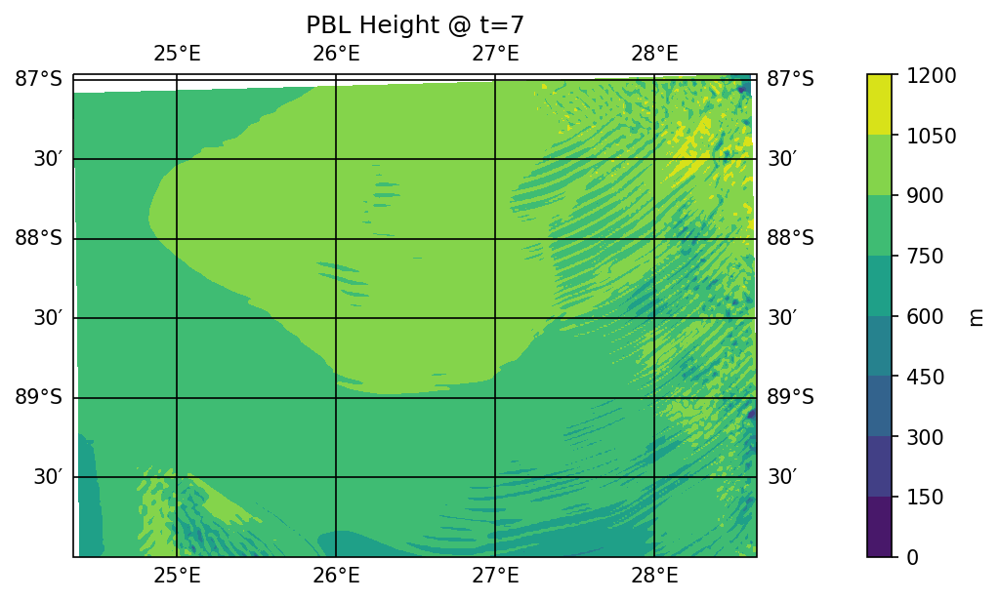

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


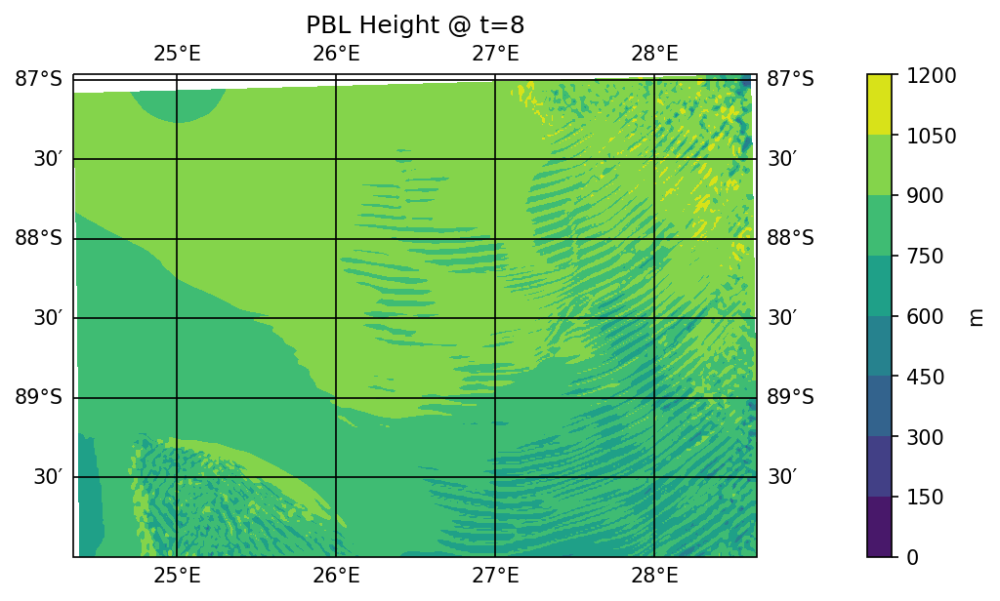

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


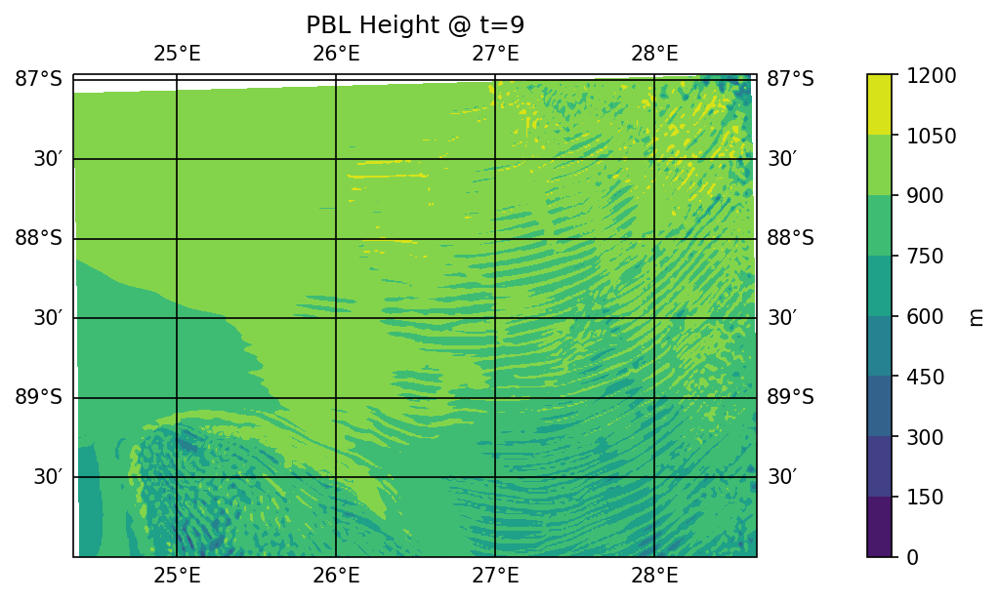

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


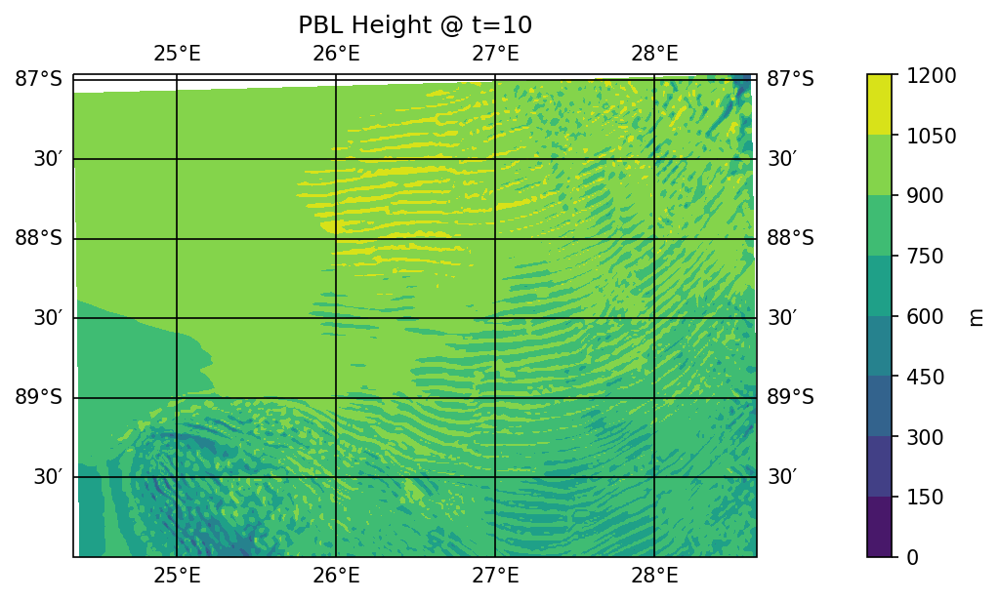

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


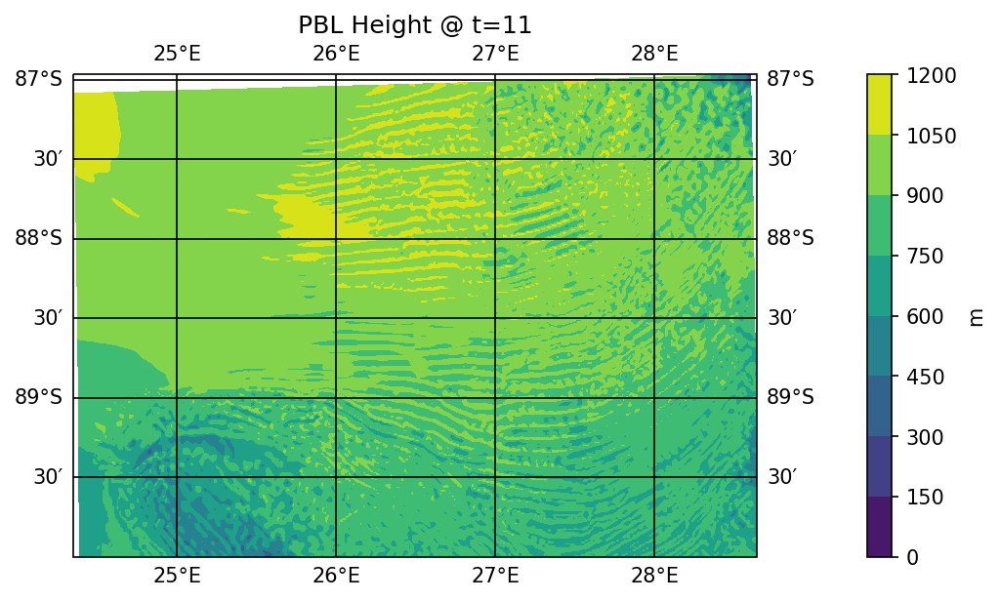

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


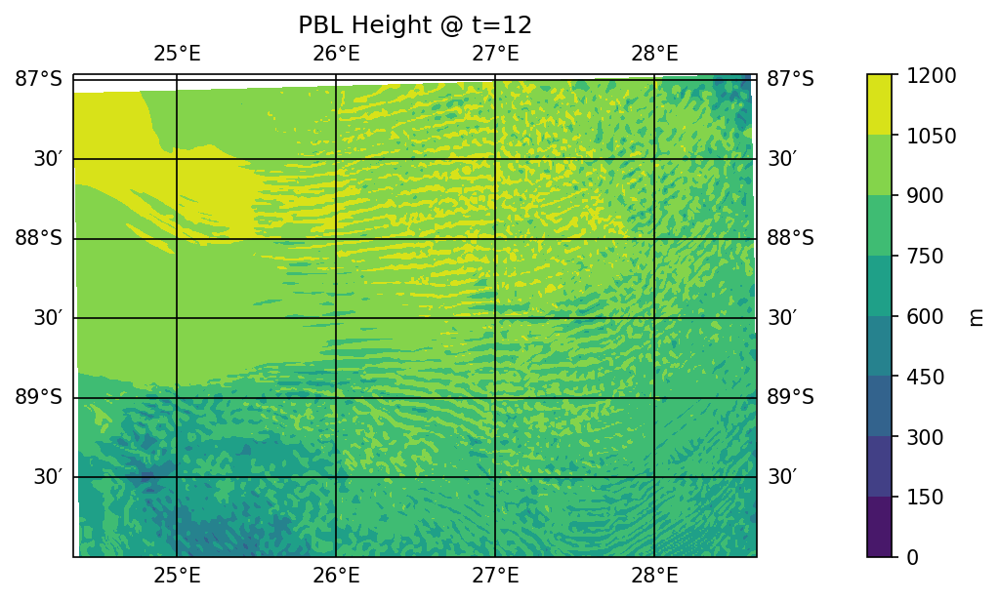

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


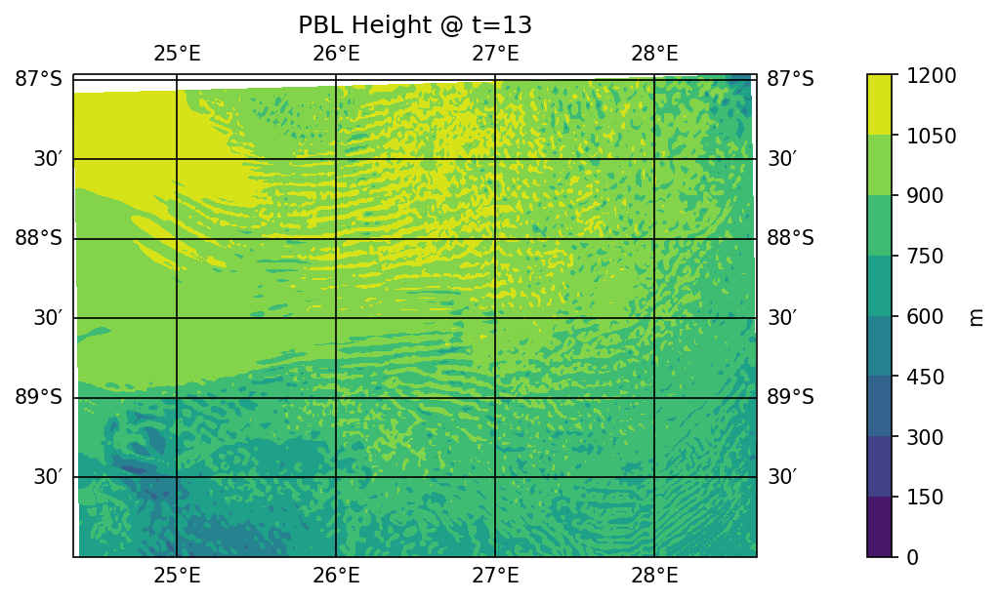

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


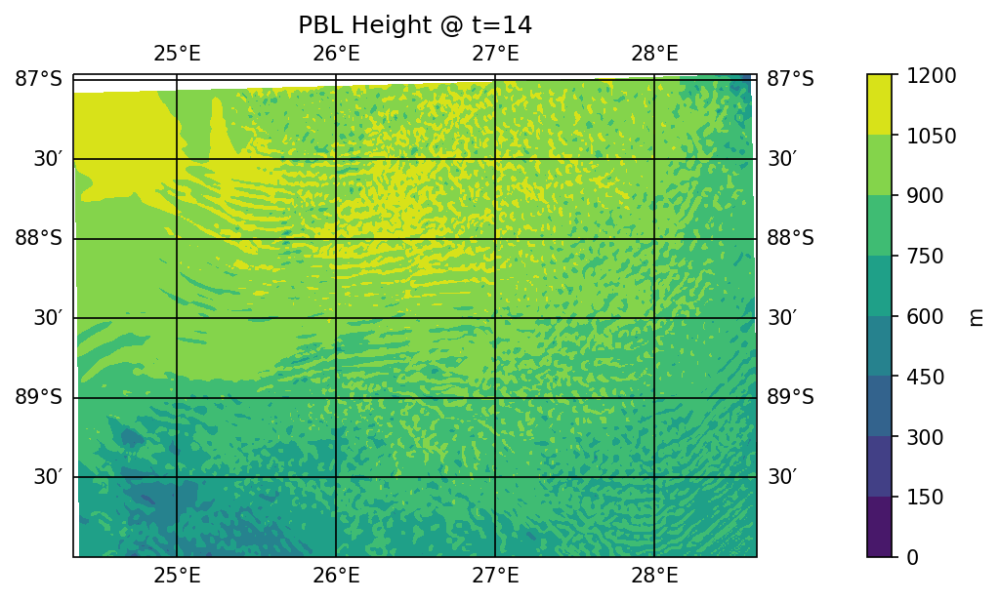

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


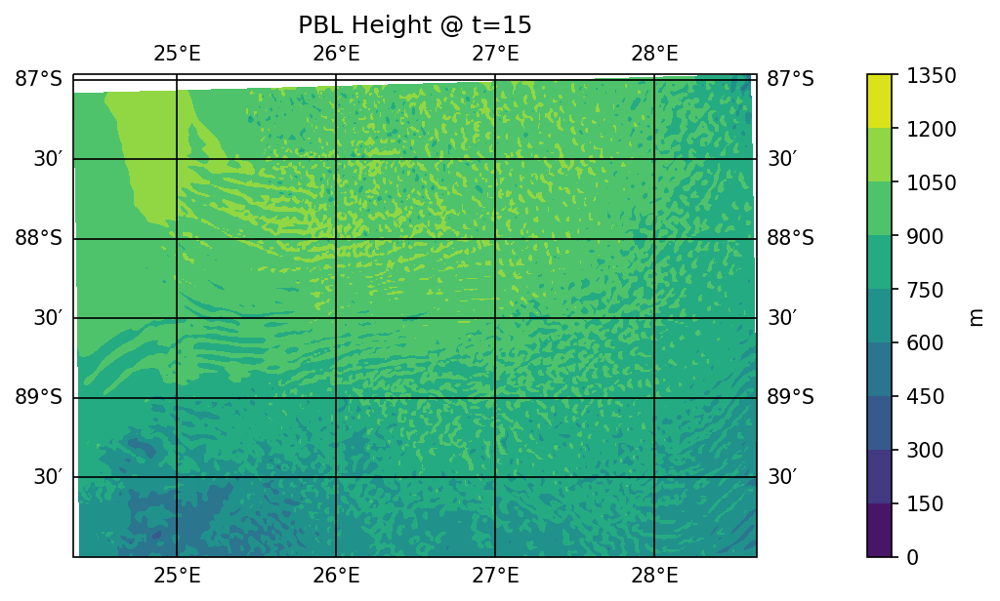

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


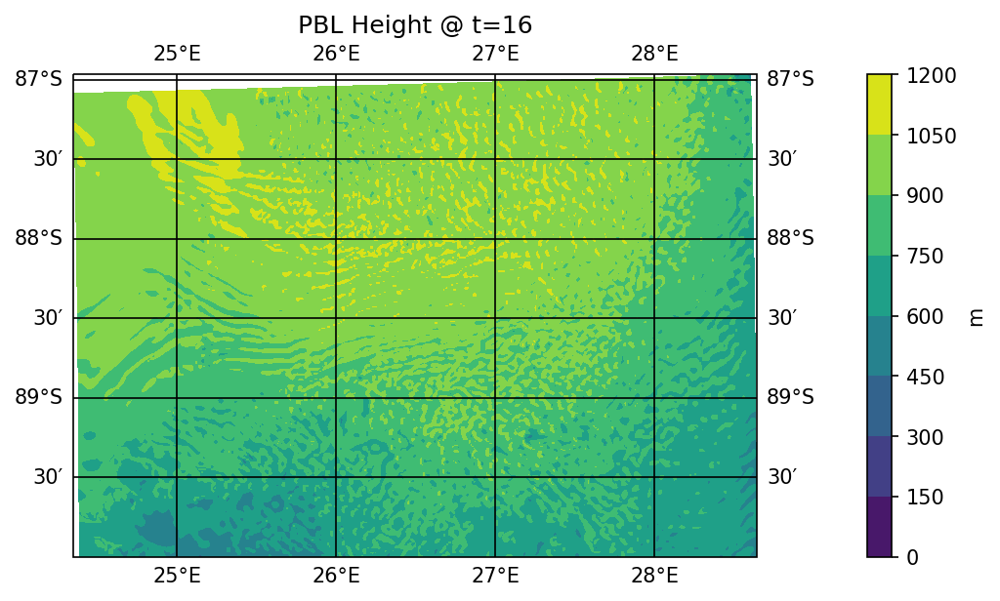

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


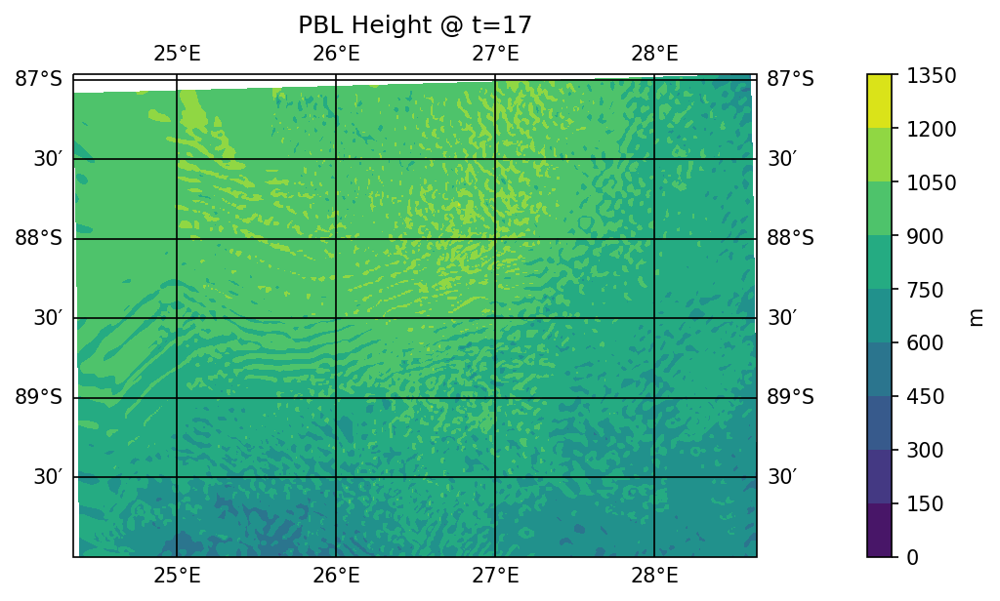

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


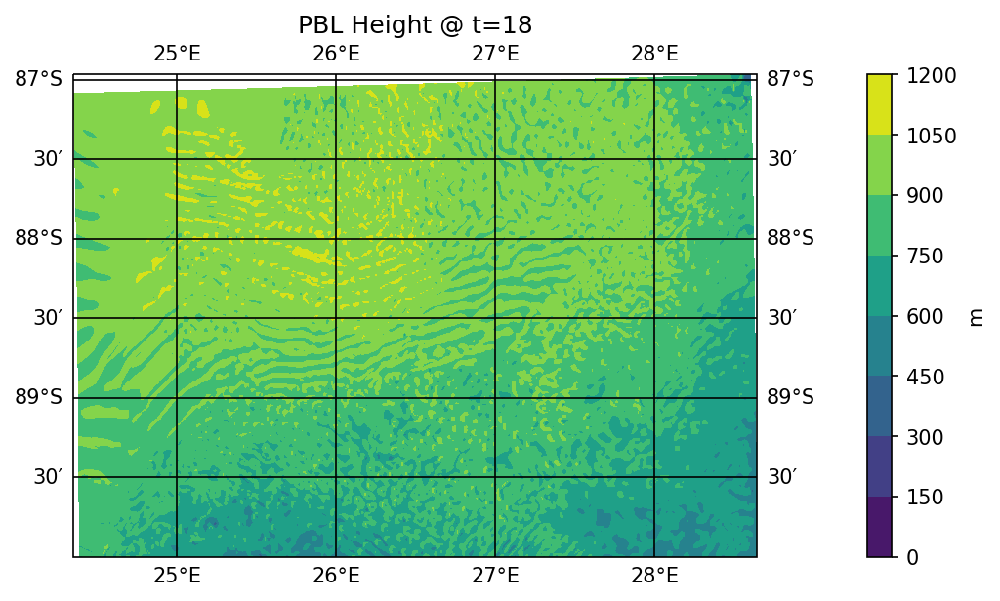

In [4]:
# PBL plots 
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], pblh_6[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('PBL Height @ t=0')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'PBLH_time0.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], pblh_7[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('PBL Height @ t=1')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'PBLH_time1.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], pblh_8[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('PBL Height @ t=2')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'PBLH_time2.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], pblh_9[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('PBL Height @ t=3')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'PBLH_time3.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], pblh_10[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('PBL Height @ t=4')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'PBLH_time4.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], pblh_11[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('PBL Height @ t=5')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'PBLH_time5.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], pblh_12[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('PBL Height @ t=6')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'PBLH_time6.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], pblh_13[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('PBL Height @ t=7')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'PBLH_time7.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], pblh_14[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('PBL Height @ t=8')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'PBLH_time8.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], pblh_15[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('PBL Height @ t=9')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'PBLH_time9.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], pblh_16[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('PBL Height @ t=10')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'PBLH_time10.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], pblh_17[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('PBL Height @ t=11')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'PBLH_time11.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], pblh_18[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('PBL Height @ t=12')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'PBLH_time12.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], pblh_19[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('PBL Height @ t=13')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'PBLH_time13.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], pblh_20[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('PBL Height @ t=14')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'PBLH_time14.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], pblh_21[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('PBL Height @ t=15')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'PBLH_time15.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], pblh_22[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('PBL Height @ t=16')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'PBLH_time16.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], pblh_23[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('PBL Height @ t=17')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'PBLH_time17.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], pblh_24[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('PBL Height @ t=18')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'PBLH_time18.png', bbox_inches = 'tight',dpi = 150)
plt.show()

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


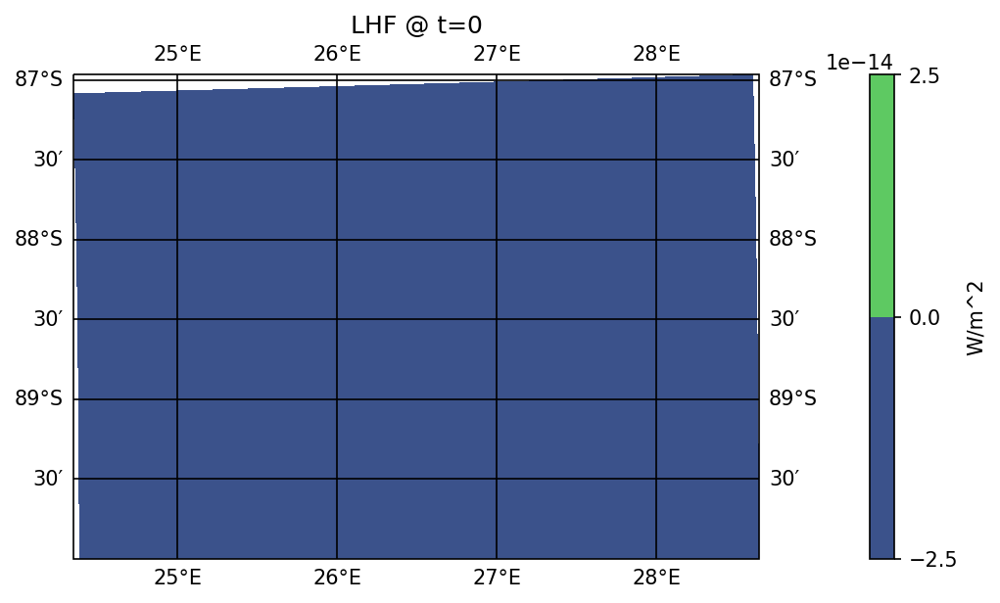

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


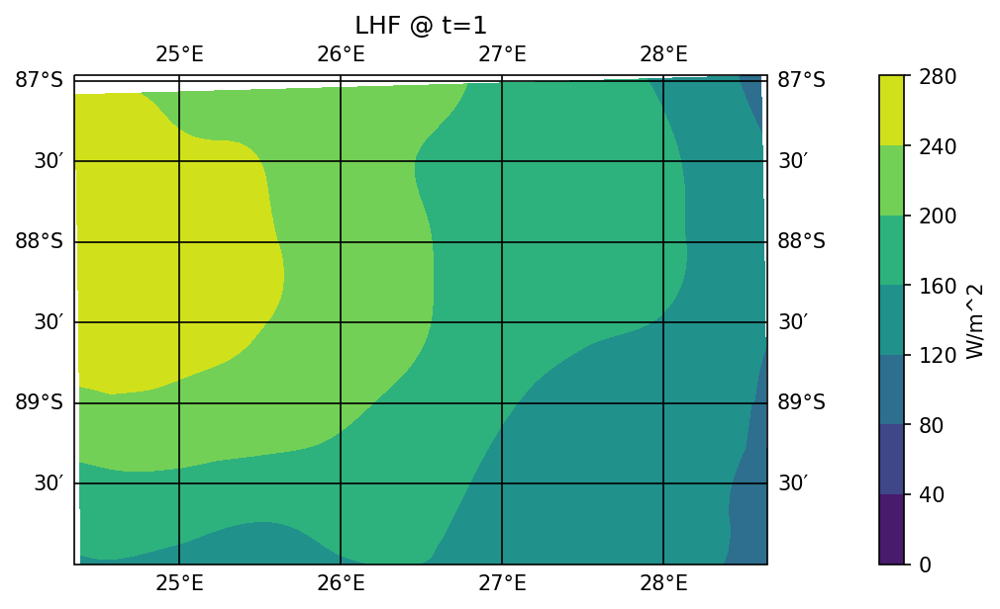

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


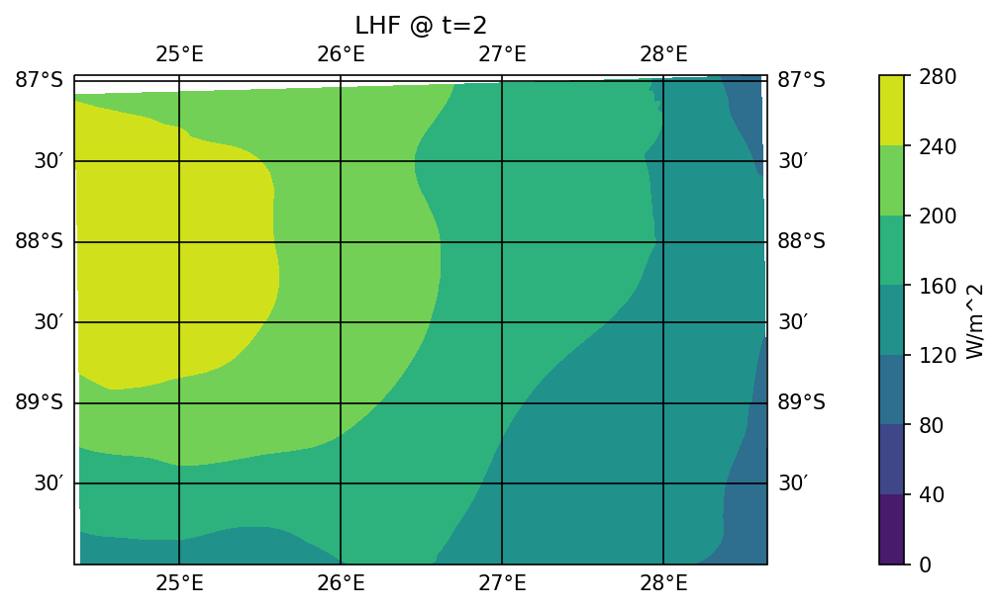

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


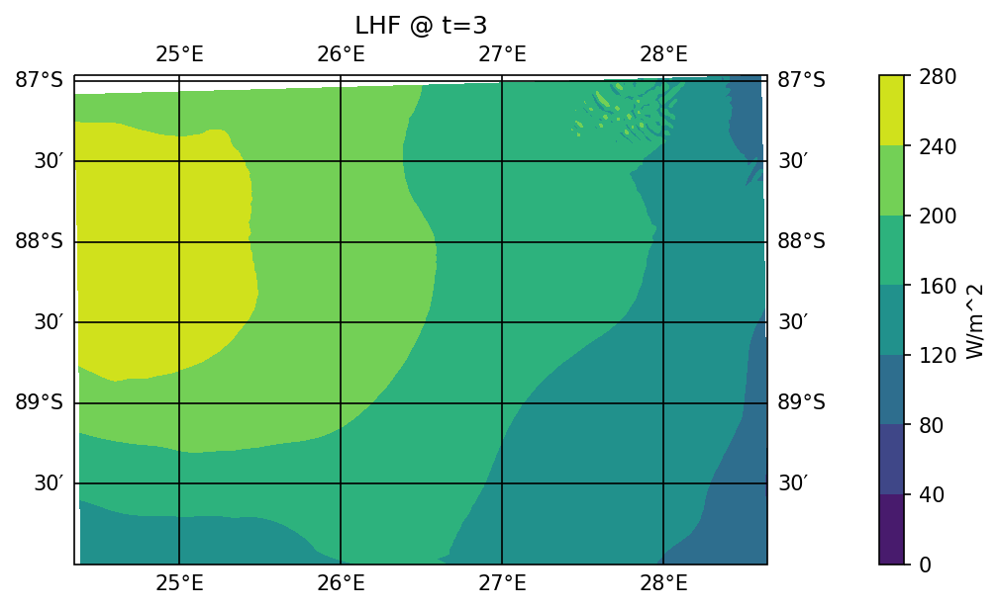

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


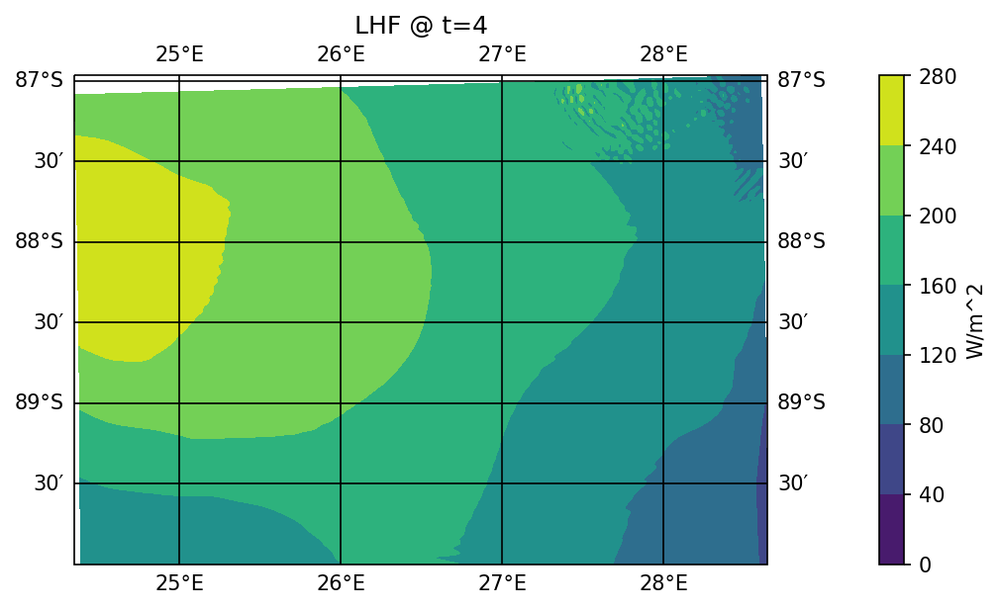

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


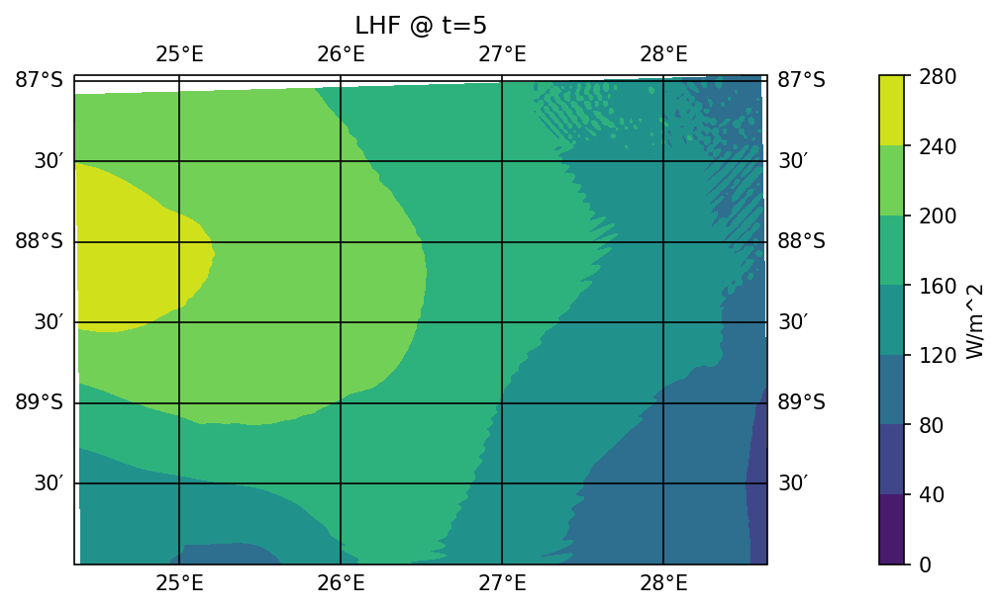

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


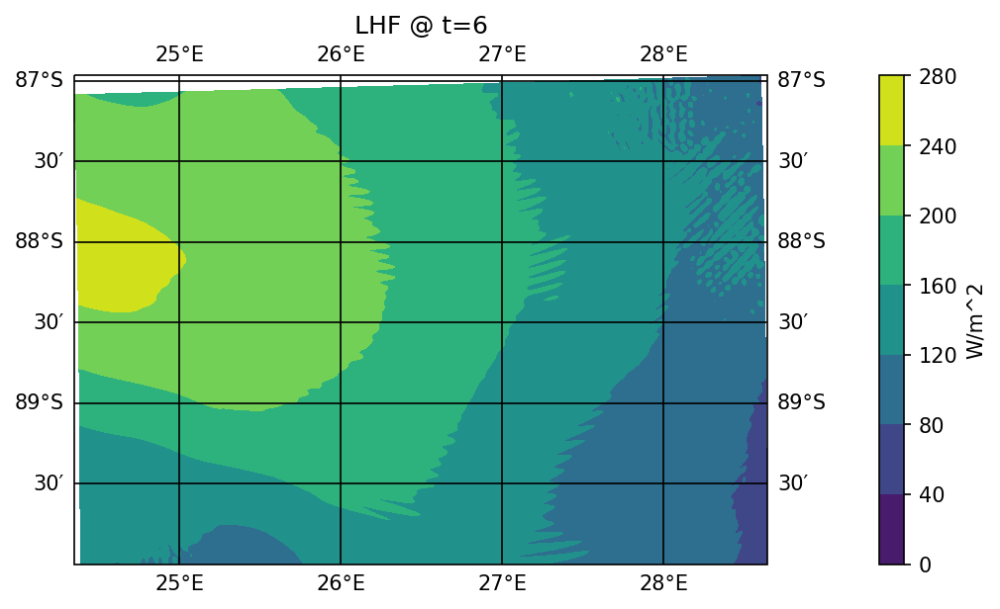

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


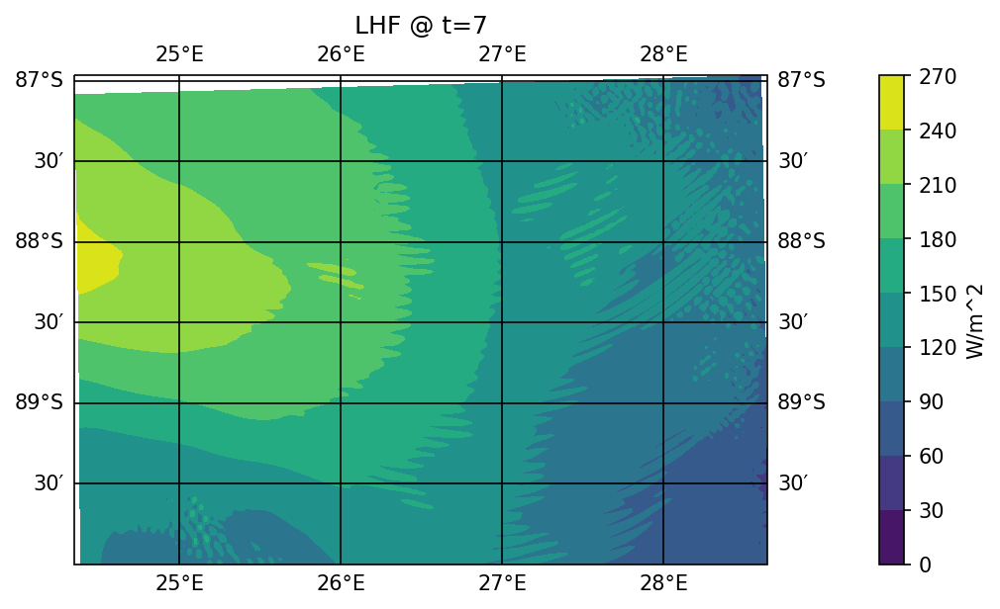

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


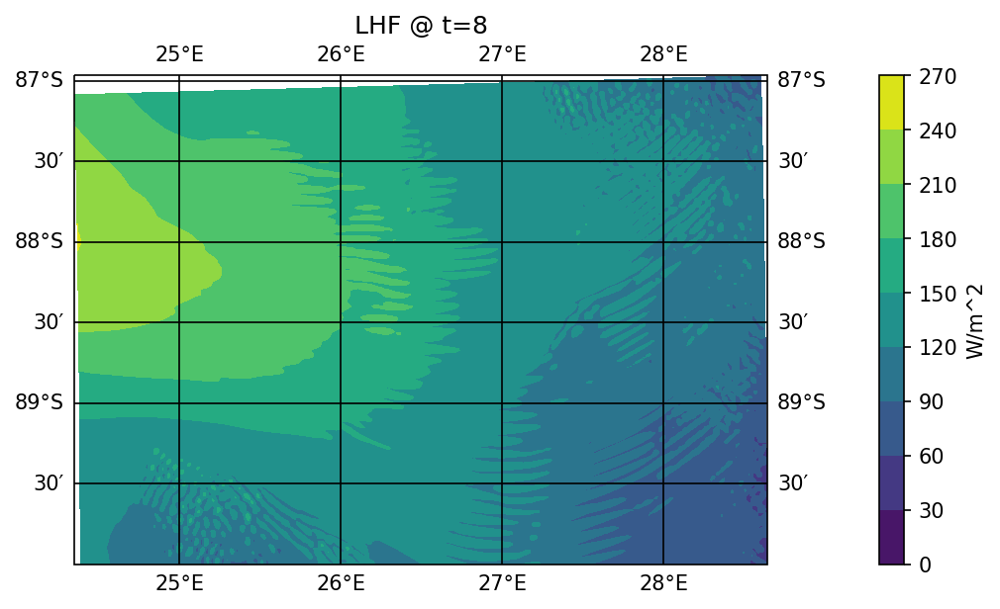

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


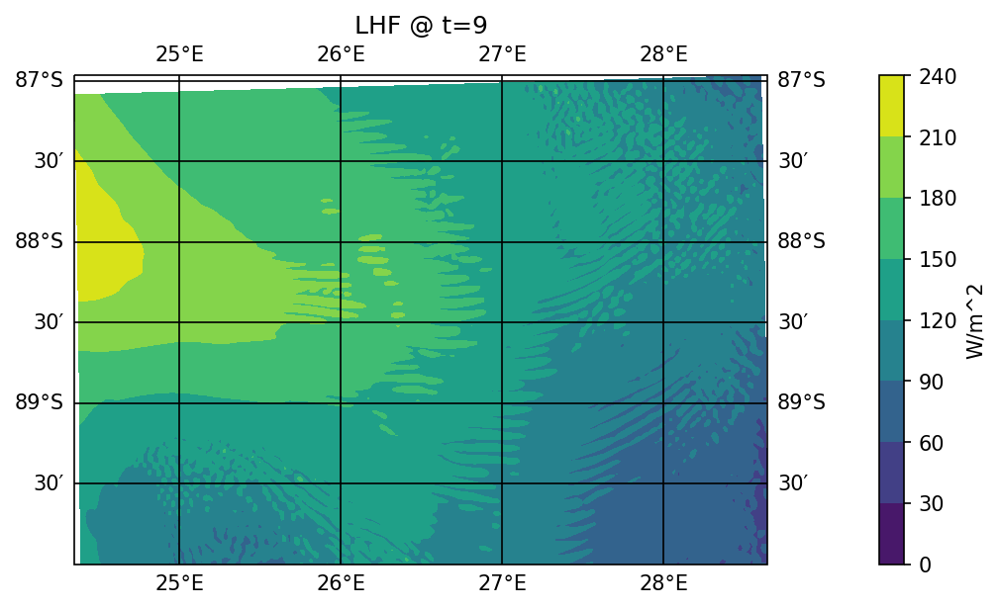

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


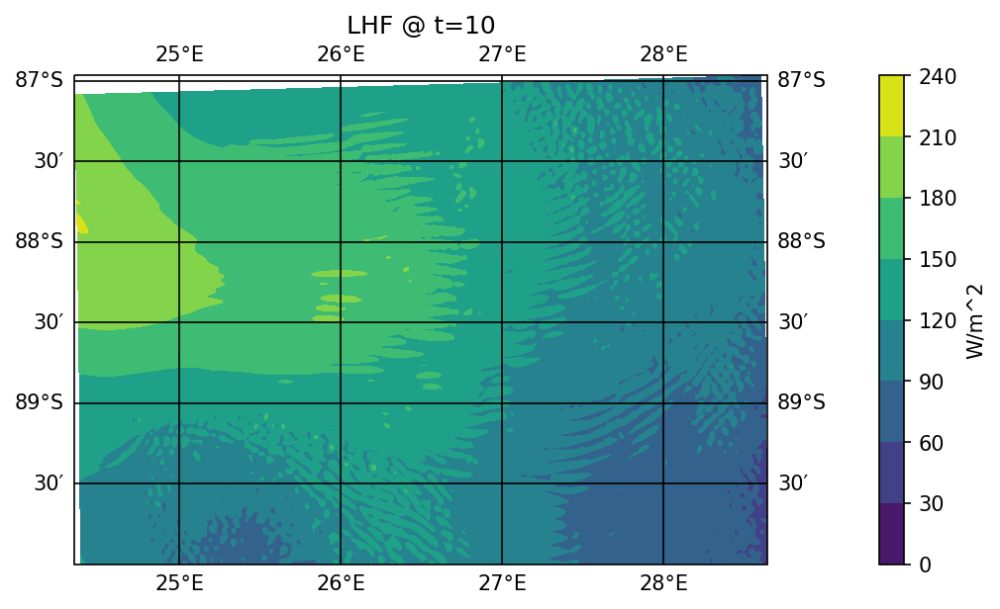

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


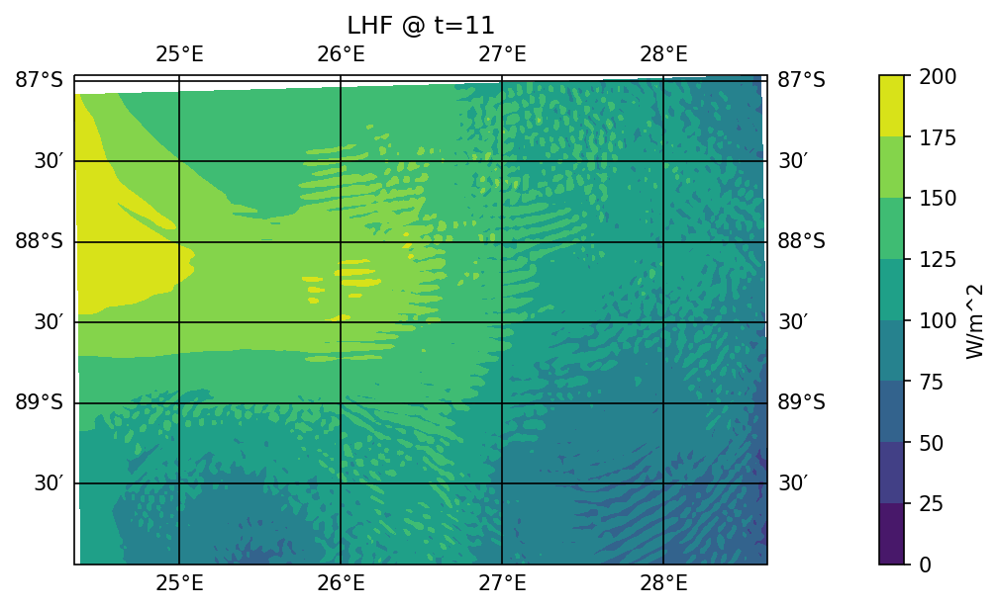

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


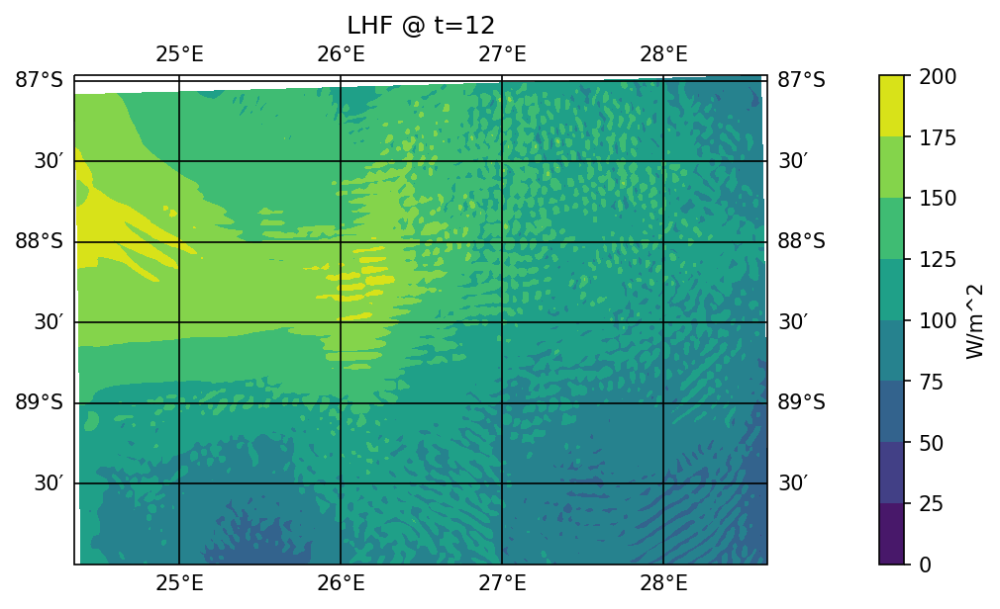

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


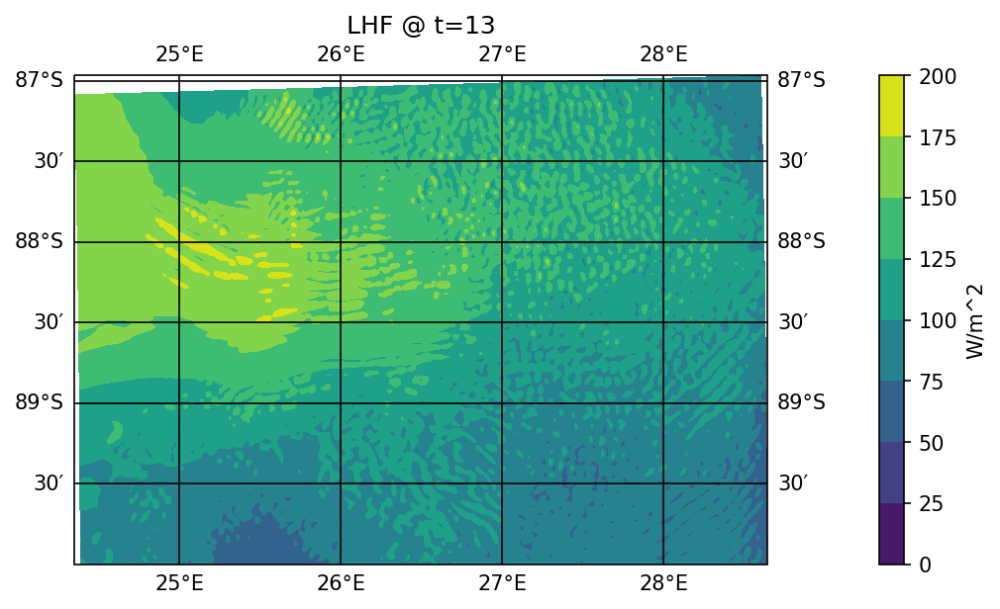

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


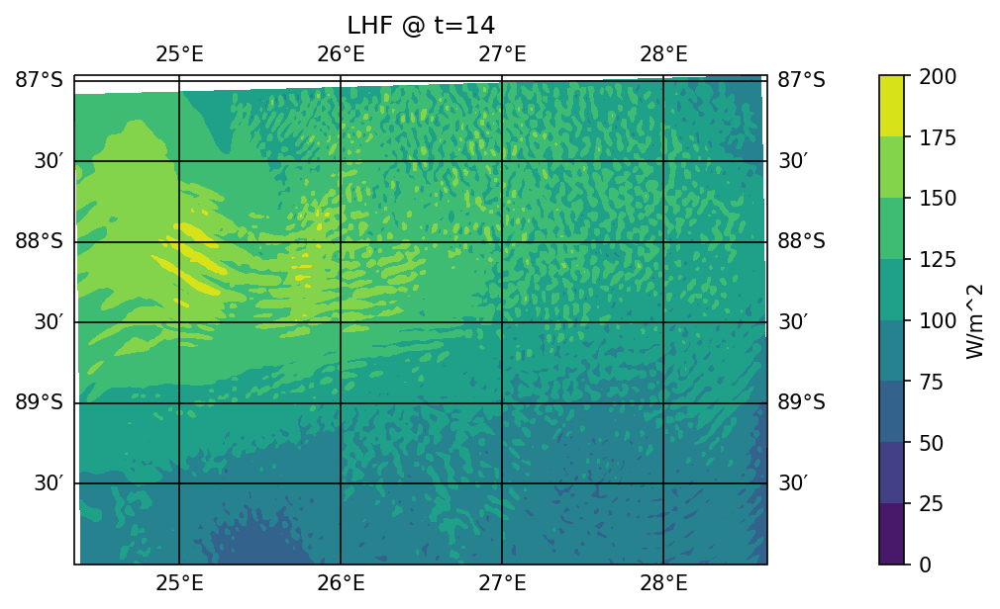

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


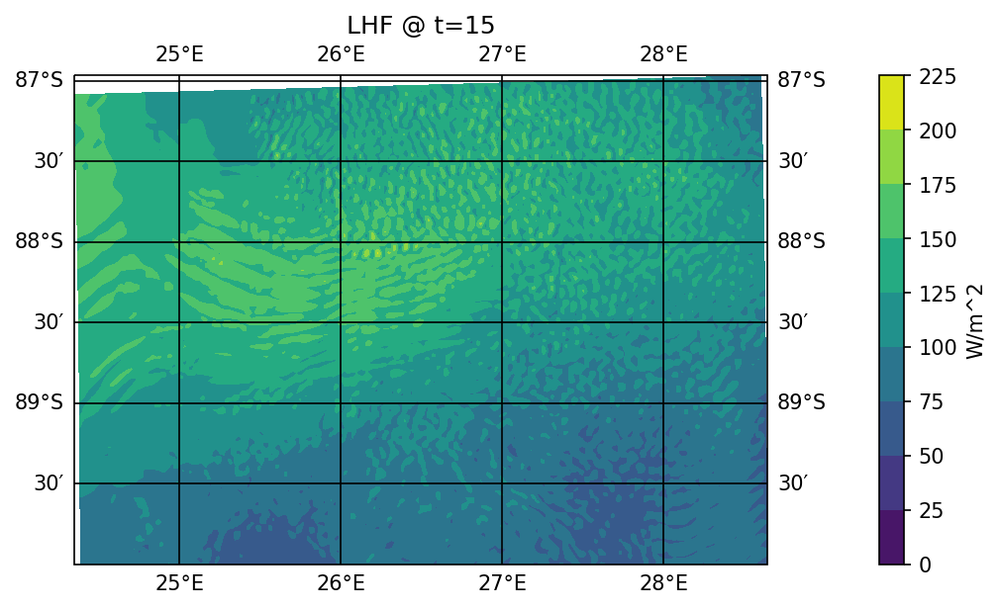

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


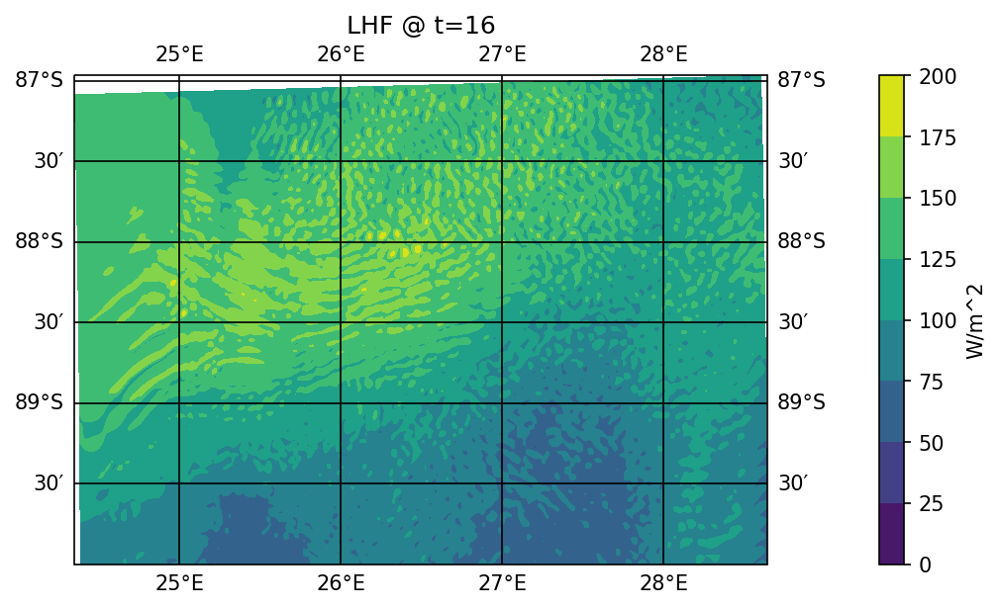

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


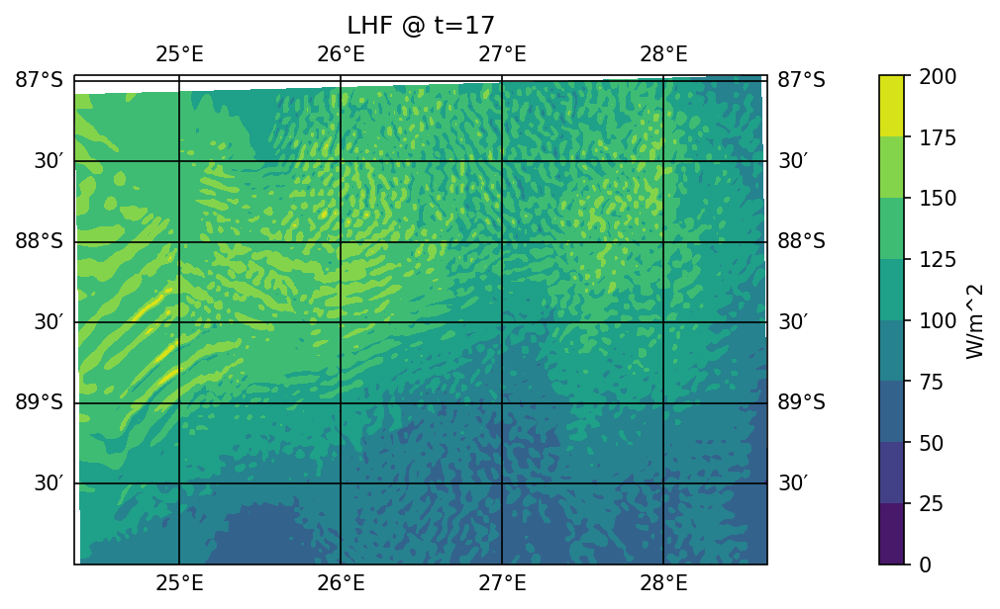

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


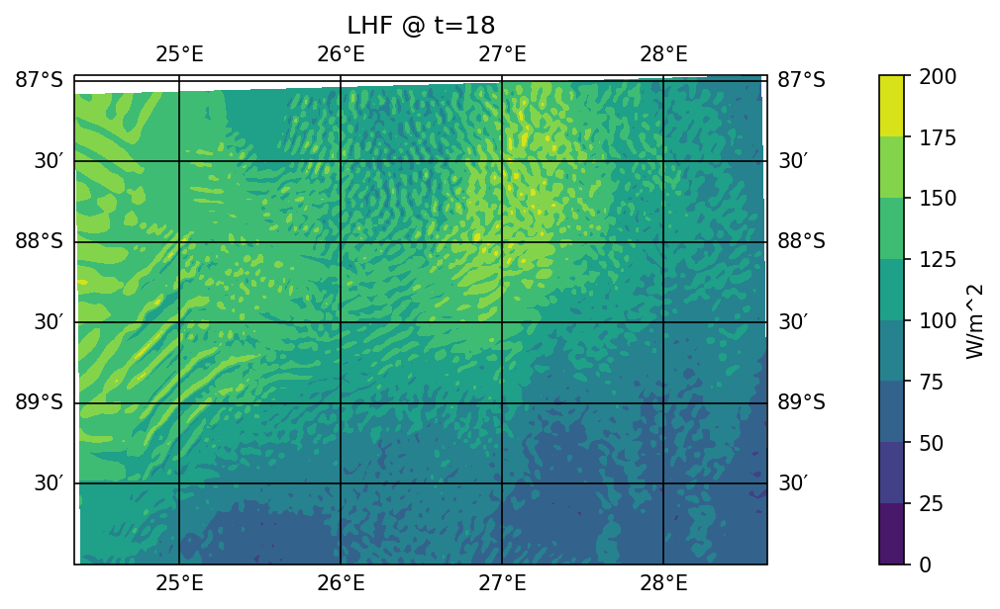

In [5]:
#LHF plots
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], lhf_6[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'W/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('LHF @ t=0')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'LHF_time0.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], lhf_7[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'W/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('LHF @ t=1')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'LHF_time1.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], lhf_8[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'W/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('LHF @ t=2')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'LHF_time2.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], lhf_9[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'W/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('LHF @ t=3')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'LHF_time3.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], lhf_10[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'W/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('LHF @ t=4')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'LHF_time4.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], lhf_11[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'W/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('LHF @ t=5')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'LHF_time5.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], lhf_12[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'W/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('LHF @ t=6')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'LHF_time6.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], lhf_13[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'W/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('LHF @ t=7')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'LHF_time7.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], lhf_14[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'W/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('LHF @ t=8')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'LHF_time8.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], lhf_15[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'W/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('LHF @ t=9')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'LHF_time9.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], lhf_16[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'W/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('LHF @ t=10')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'LHF_time10.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], lhf_17[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'W/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('LHF @ t=11')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'LHF_time11.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], lhf_18[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'W/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('LHF @ t=12')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'LHF_time12.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], lhf_19[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'W/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('LHF @ t=13')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'LHF_time13.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], lhf_20[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'W/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('LHF @ t=14')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'LHF_time14.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], lhf_21[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'W/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('LHF @ t=15')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'LHF_time15.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], lhf_22[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'W/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('LHF @ t=16')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'LHF_time16.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], lhf_23[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'W/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('LHF @ t=17')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'LHF_time17.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], lhf_24[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'W/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('LHF @ t=18')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'LHF_time18.png', bbox_inches = 'tight',dpi = 150)
plt.show()


C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


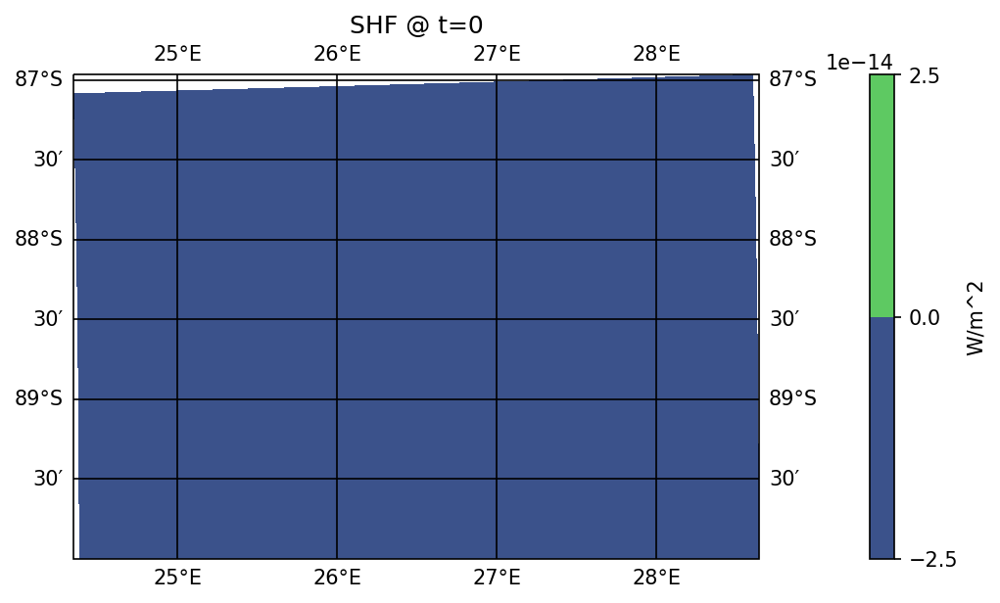

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


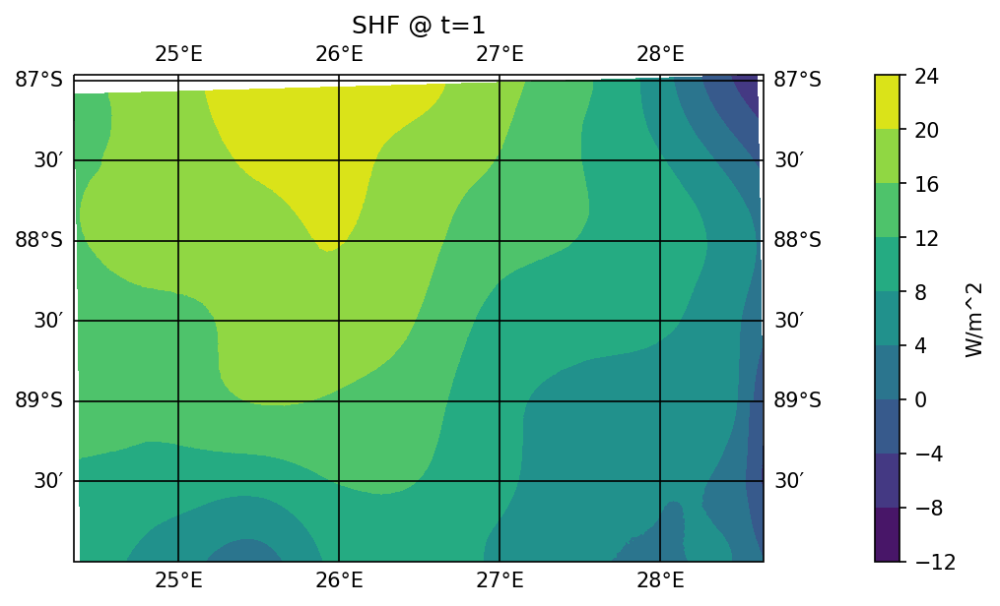

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


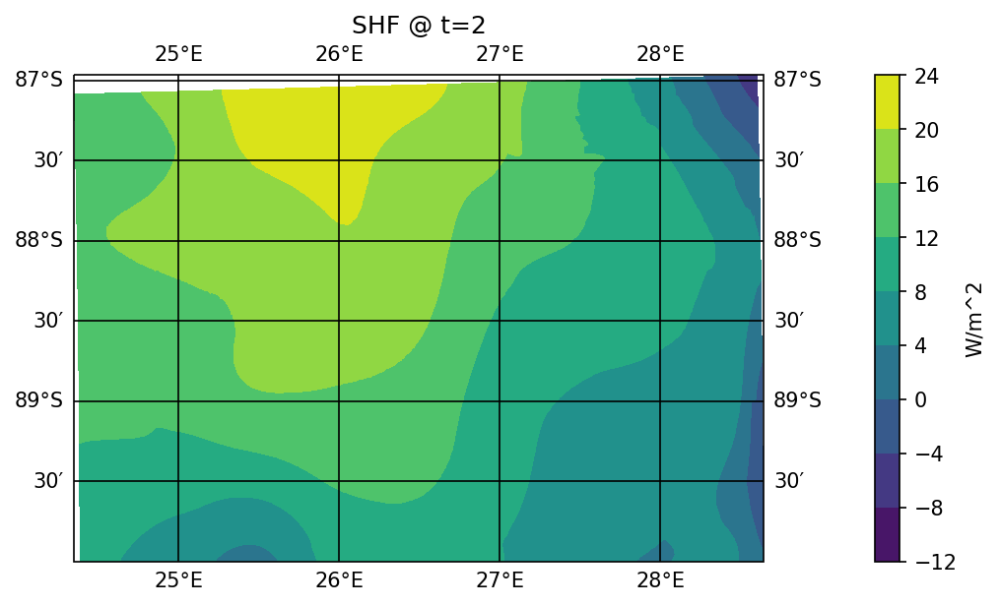

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


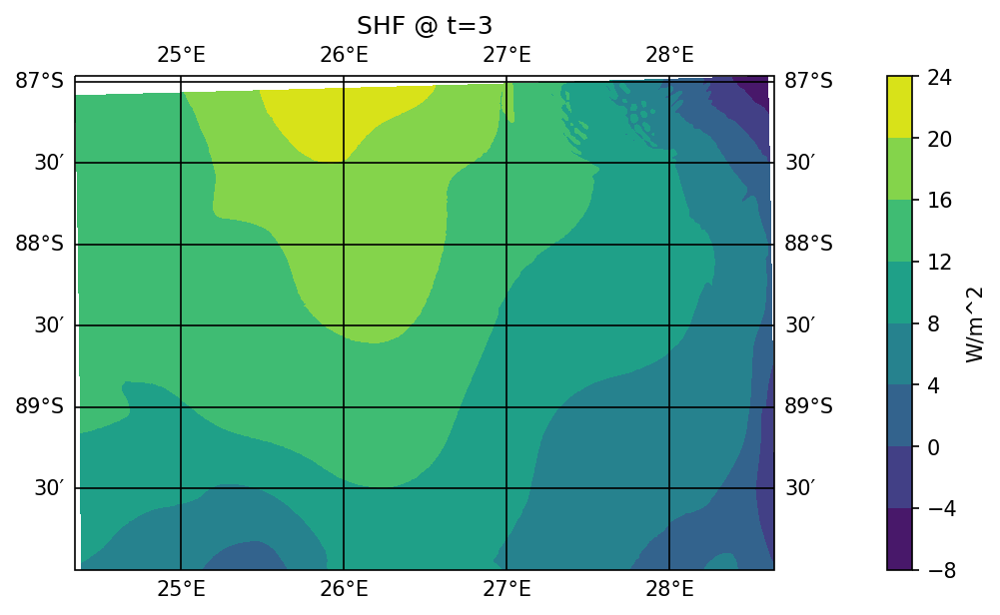

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


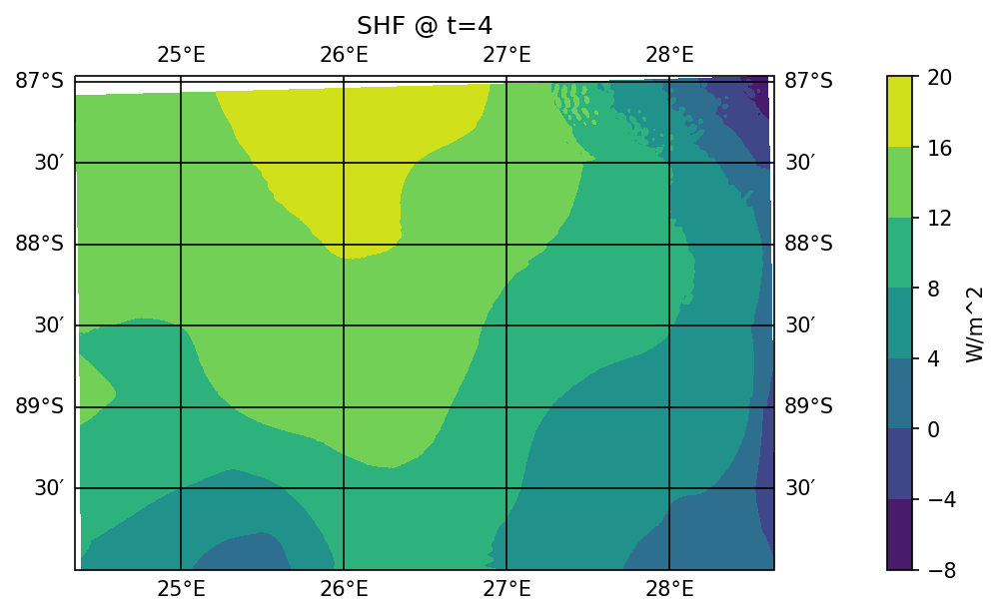

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


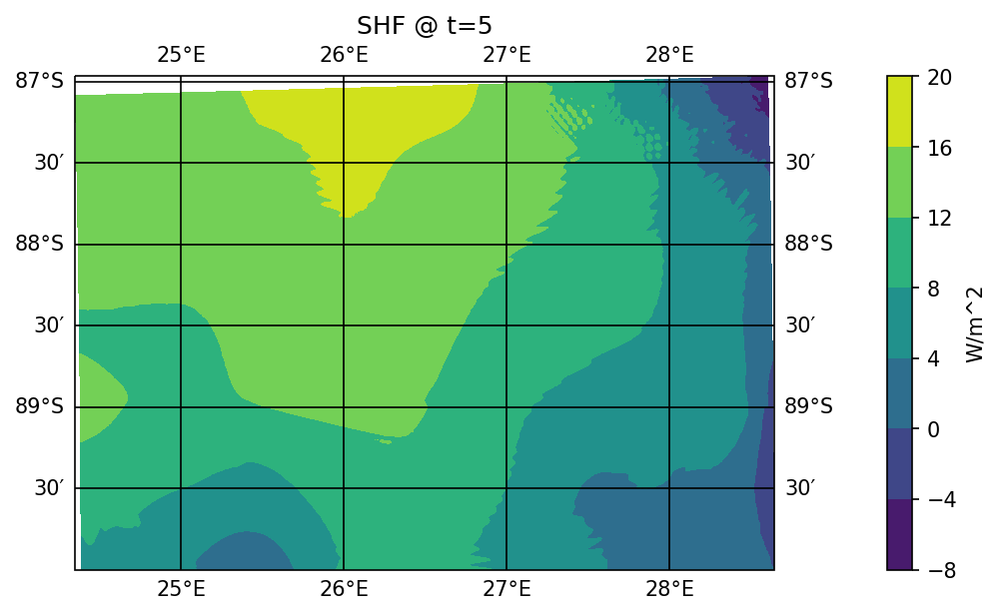

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


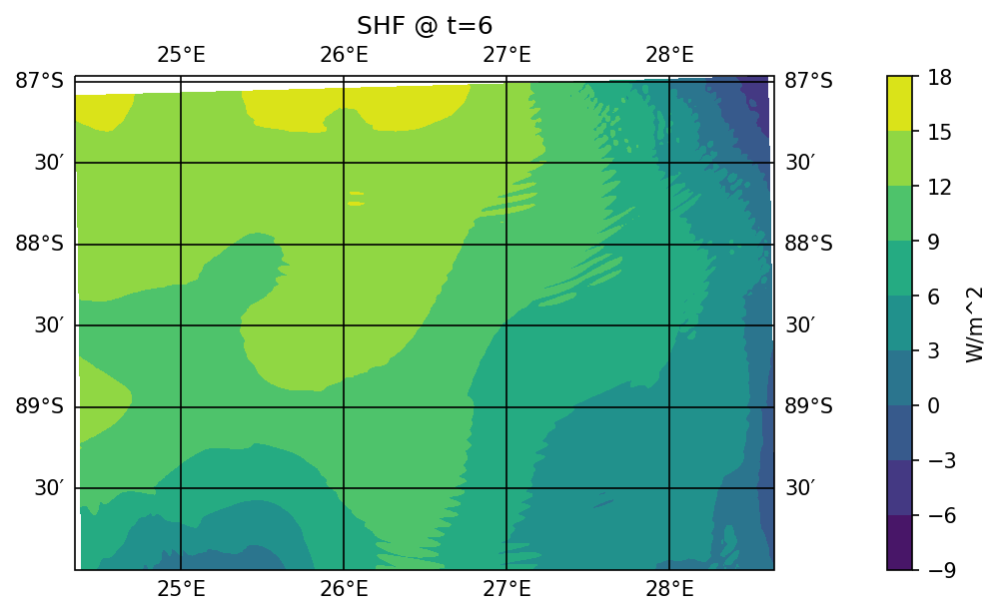

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


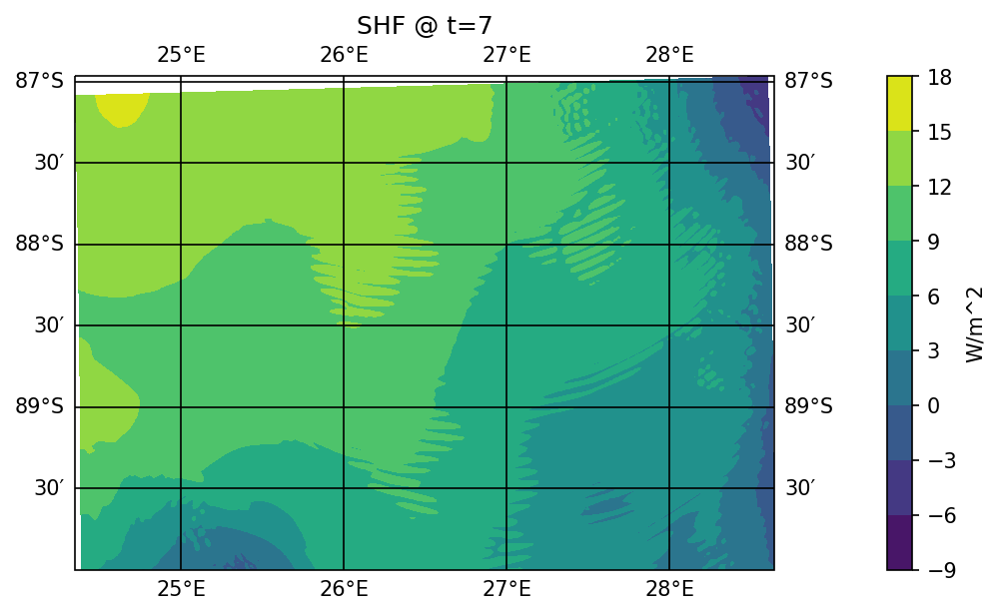

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


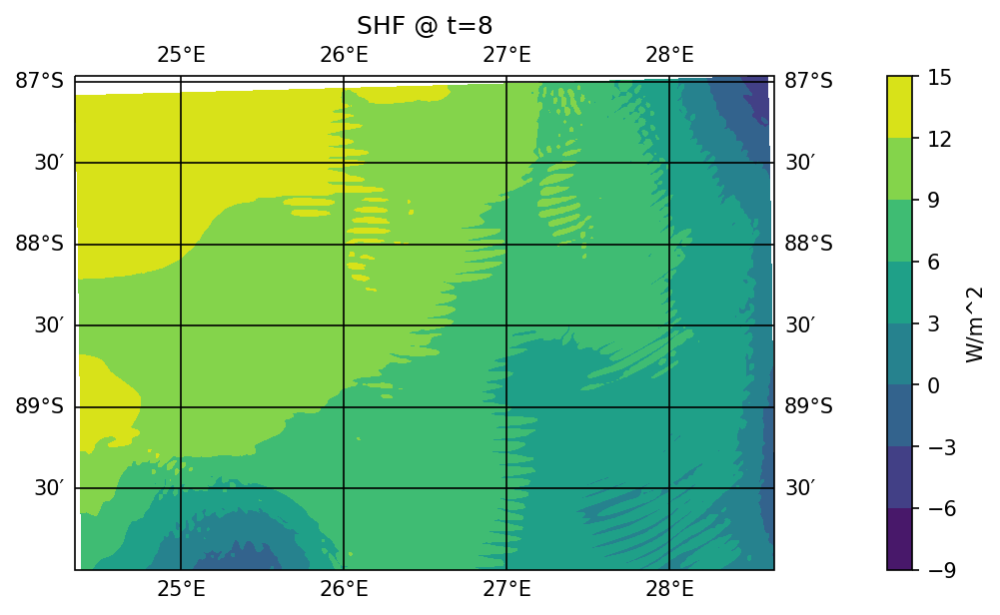

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


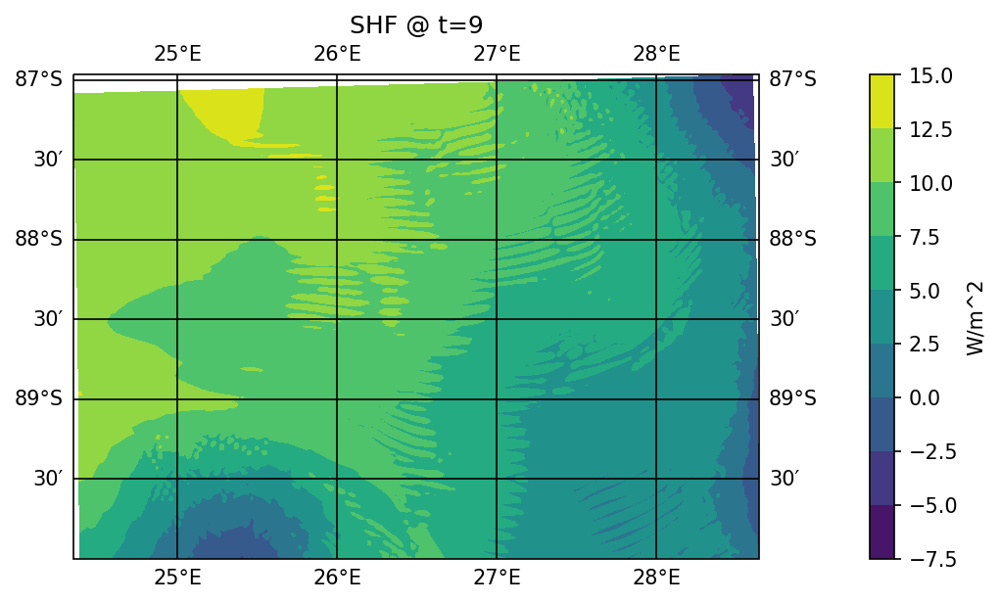

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


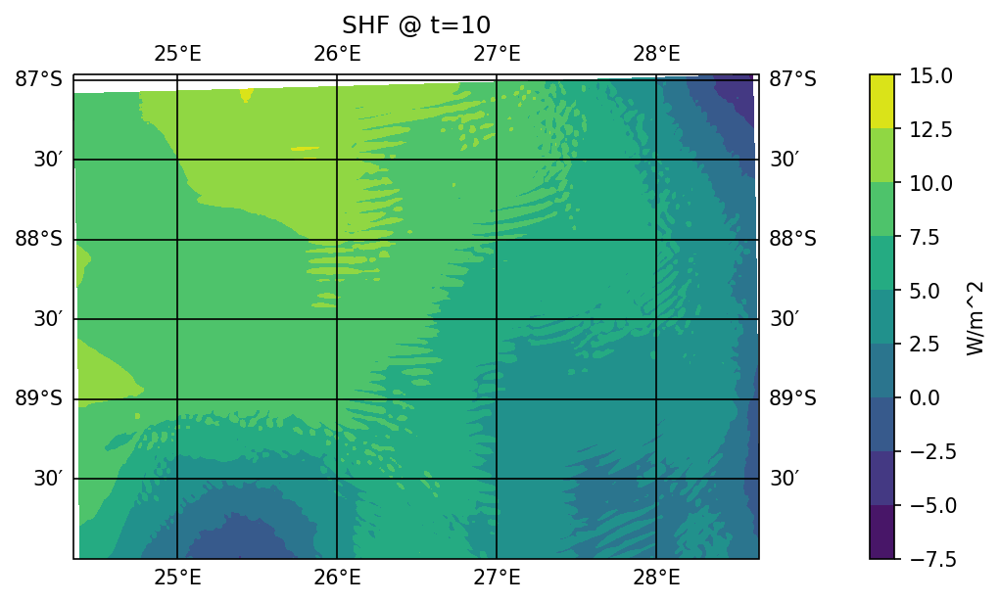

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


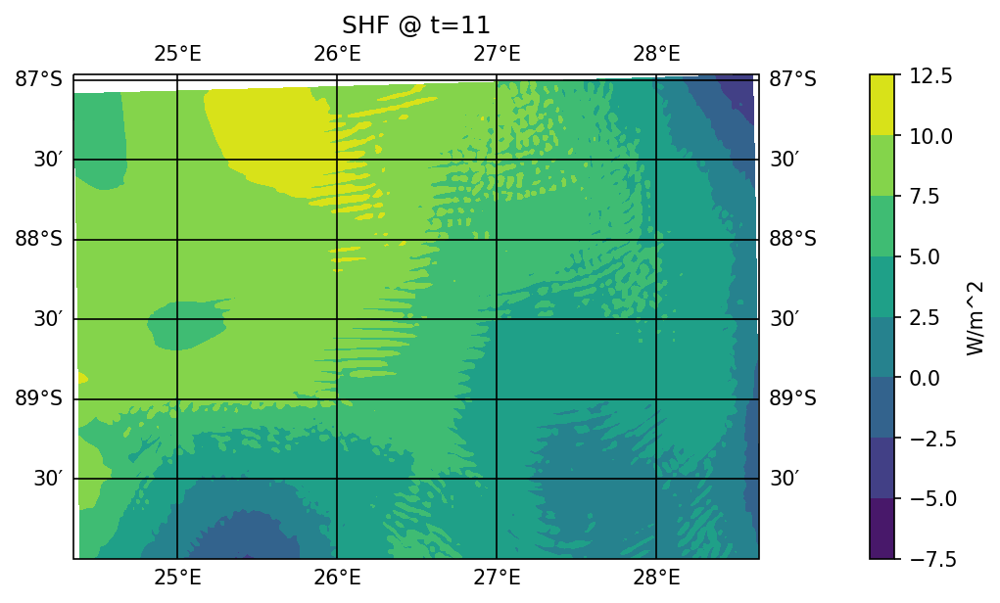

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


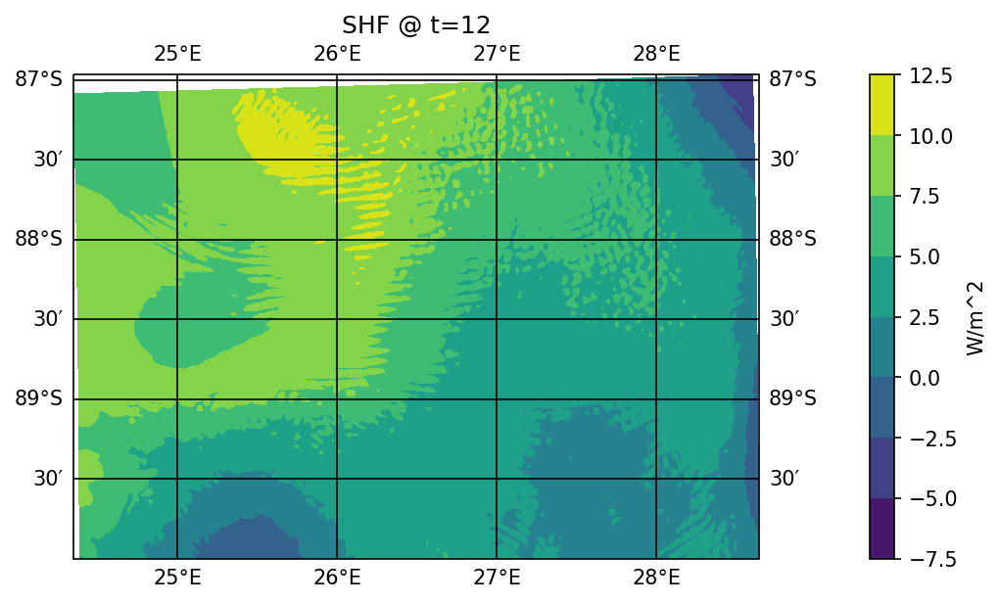

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


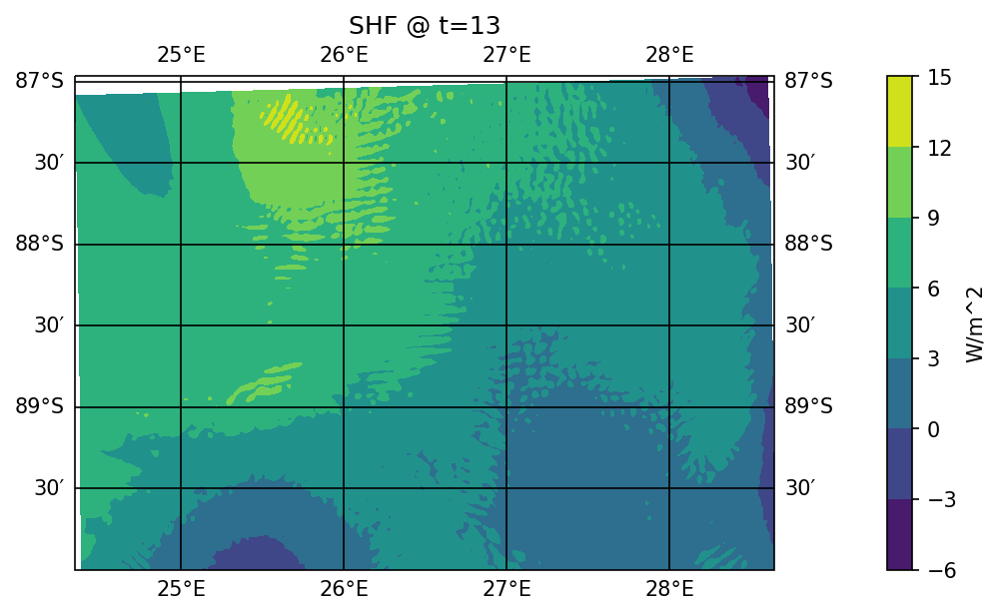

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


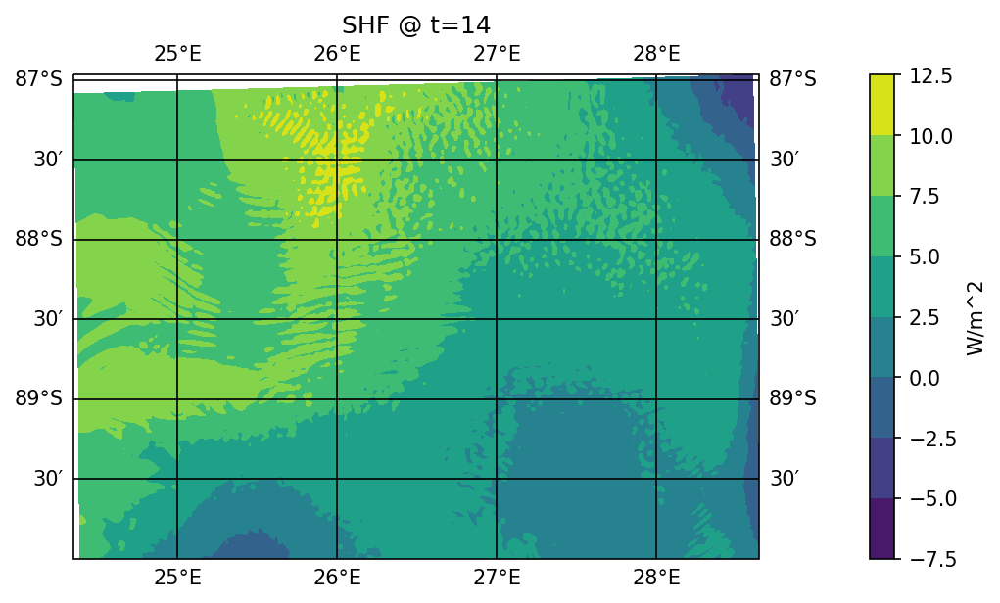

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


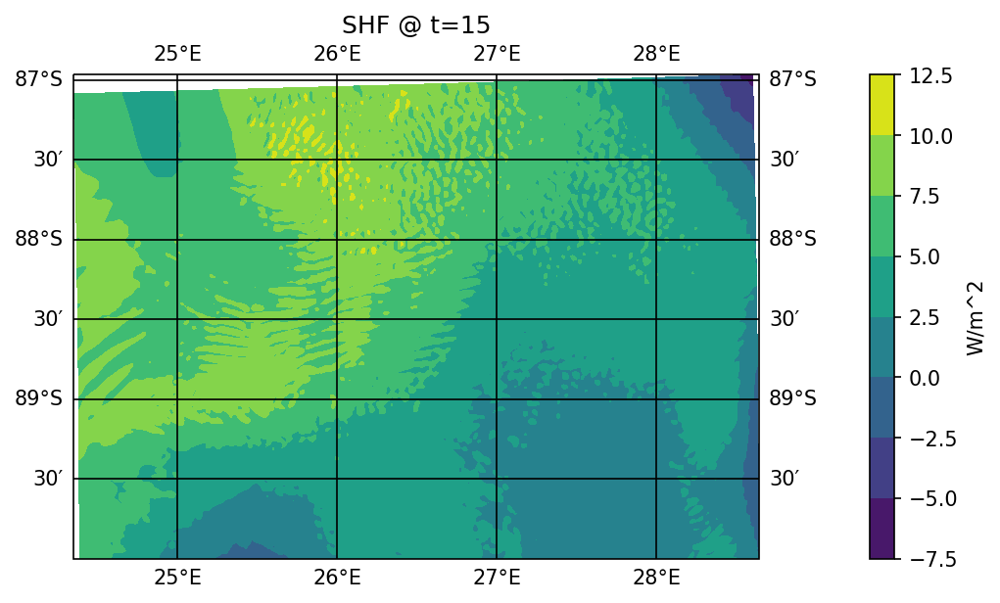

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


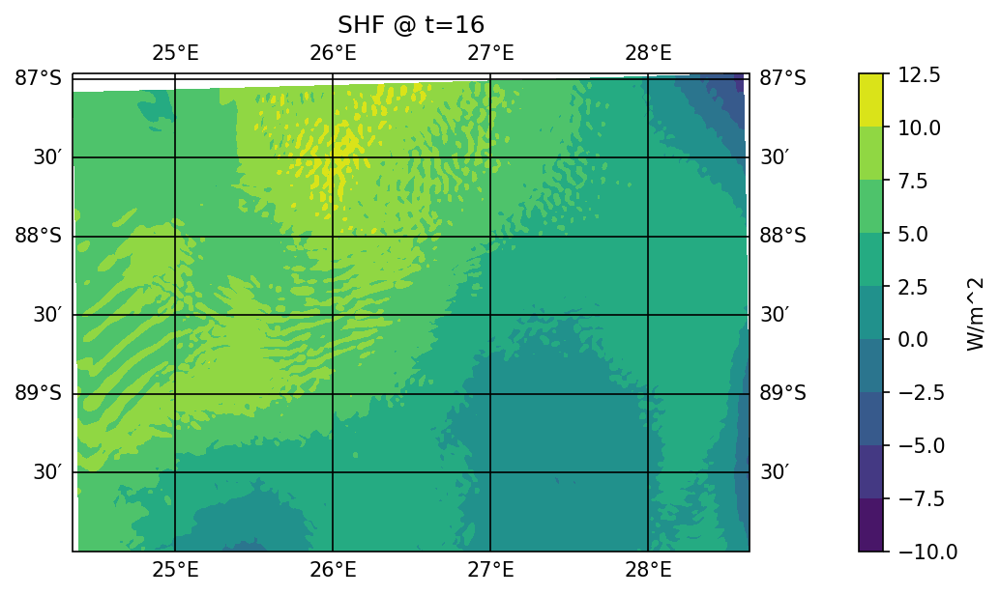

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


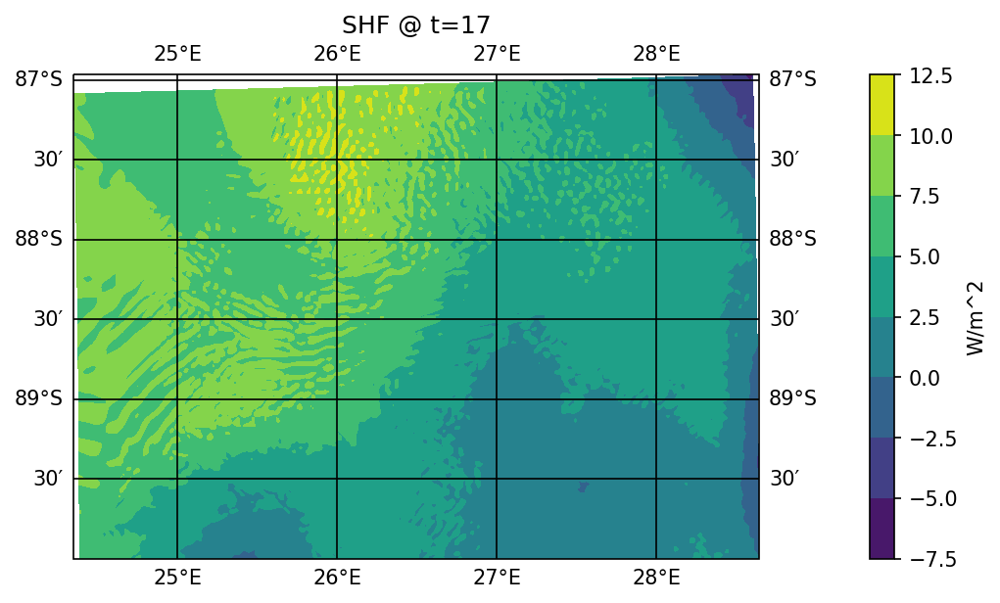

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


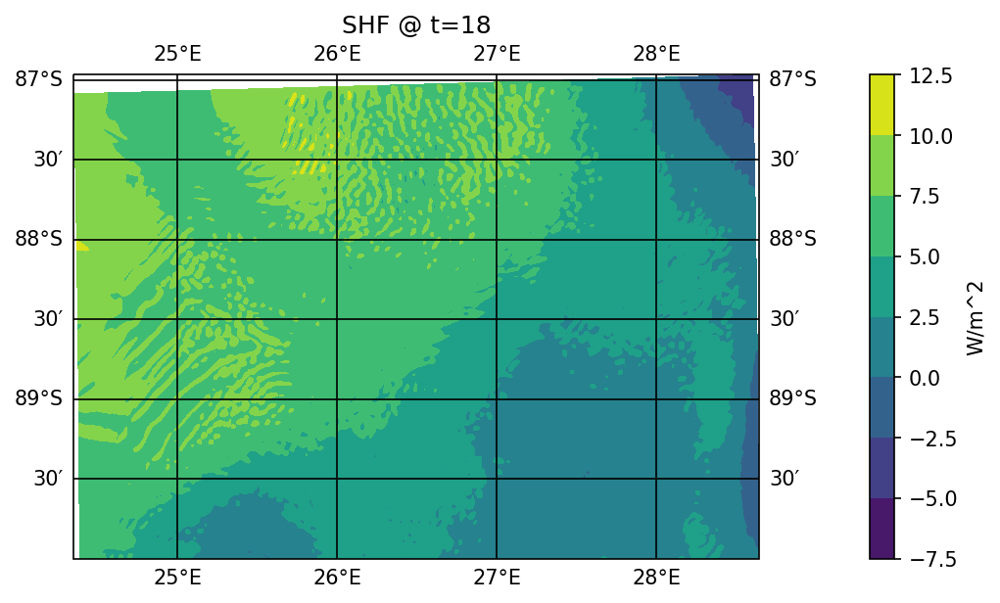

In [6]:
#SHF plots 
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], shf_6[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'W/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('SHF @ t=0')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'SHF_time0.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], shf_7[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'W/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('SHF @ t=1')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'SHF_time1.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], shf_8[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'W/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('SHF @ t=2')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'SHF_time2.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], shf_9[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'W/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('SHF @ t=3')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'SHF_time3.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], shf_10[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'W/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('SHF @ t=4')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'SHF_time4.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], shf_11[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'W/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('SHF @ t=5')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'SHF_time5.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], shf_12[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'W/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('SHF @ t=6')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'SHF_time6.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], shf_13[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'W/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('SHF @ t=7')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'SHF_time7.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], shf_14[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'W/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('SHF @ t=8')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'SHF_time8.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], shf_15[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'W/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('SHF @ t=9')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'SHF_time9.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], shf_16[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'W/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('SHF @ t=10')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'SHF_time10.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], shf_17[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'W/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('SHF @ t=11')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'SHF_time11.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], shf_18[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'W/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('SHF @ t=12')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'SHF_time12.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], shf_19[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'W/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('SHF @ t=13')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'SHF_time13.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], shf_20[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'W/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('SHF @ t=14')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'SHF_time14.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], shf_21[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'W/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('SHF @ t=15')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'SHF_time15.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], shf_22[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'W/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('SHF @ t=16')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'SHF_time16.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], shf_23[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'W/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('SHF @ t=17')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'SHF_time17.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], shf_24[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'W/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('SHF @ t=18')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'SHF_time18.png', bbox_inches = 'tight',dpi = 150)
plt.show()


C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


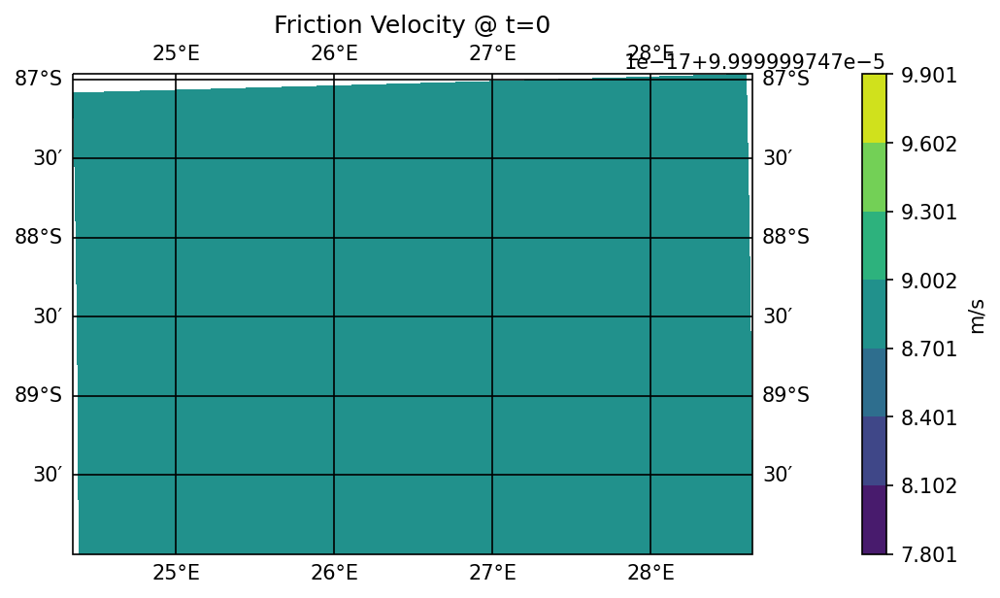

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


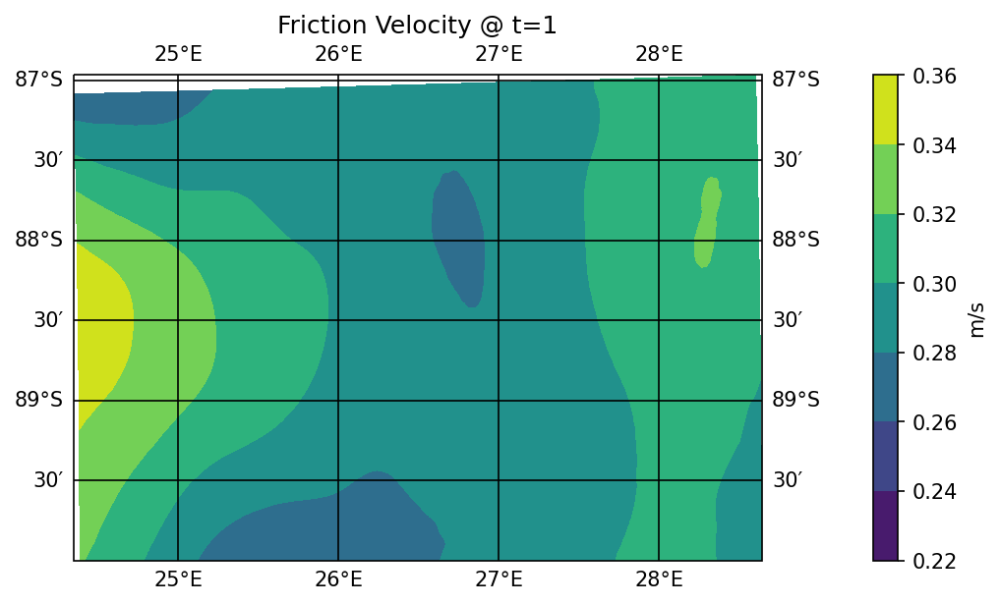

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


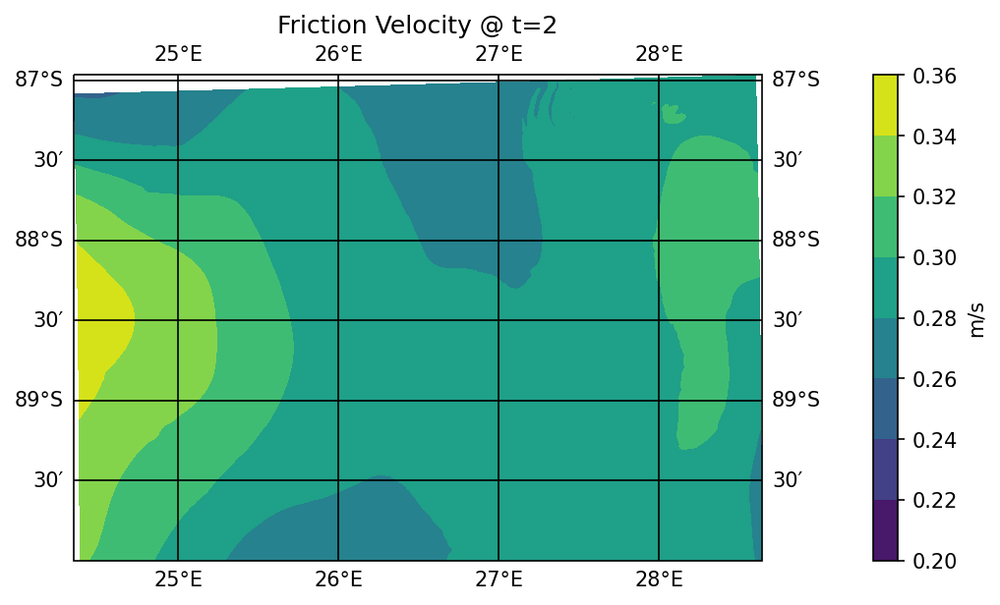

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


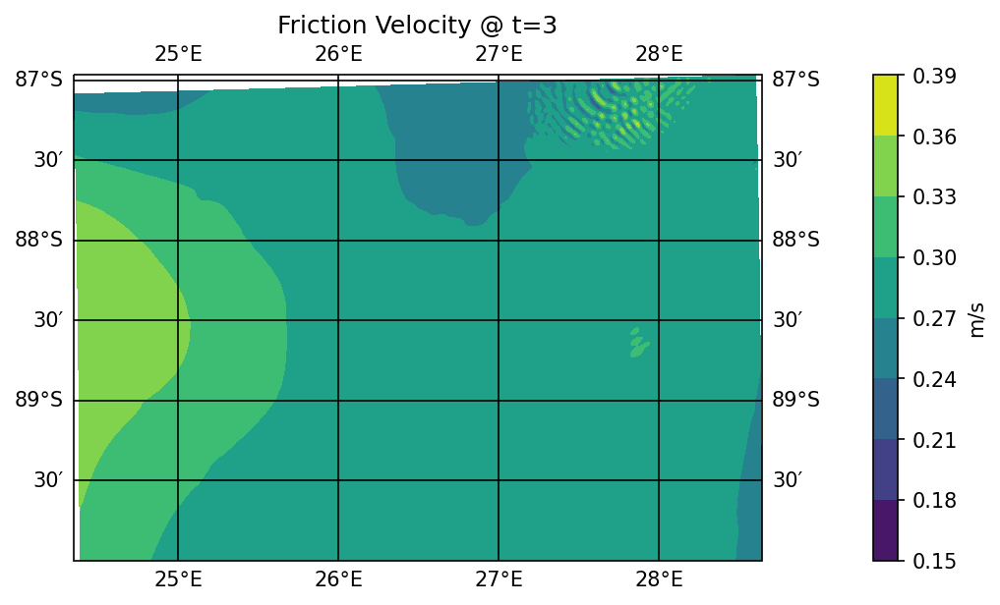

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


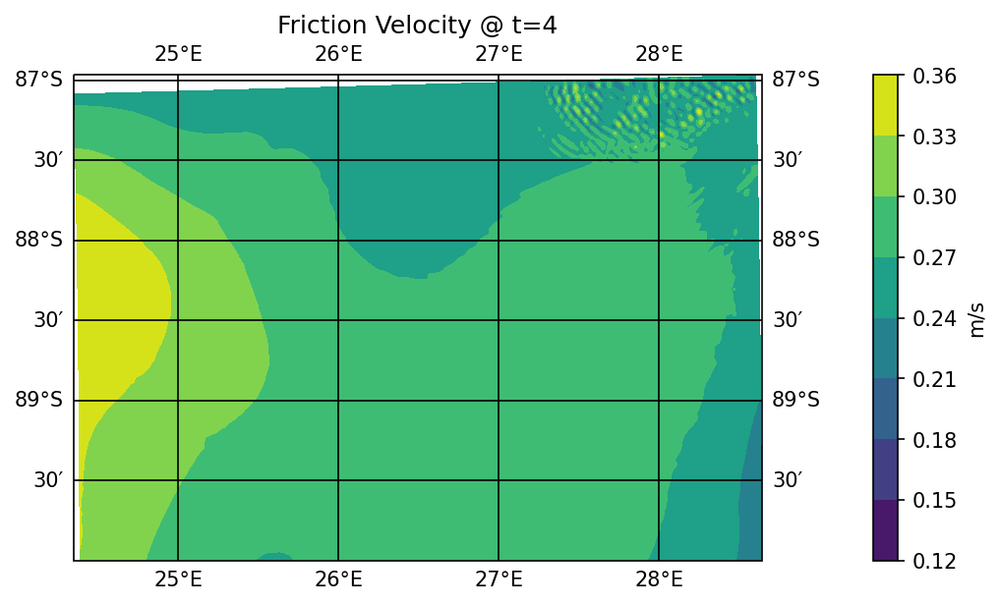

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


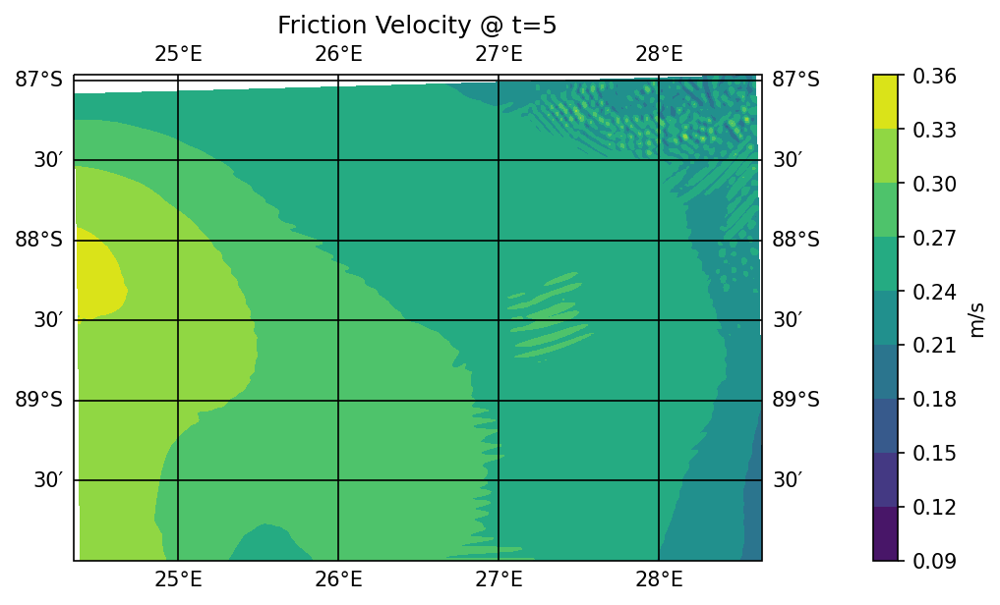

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


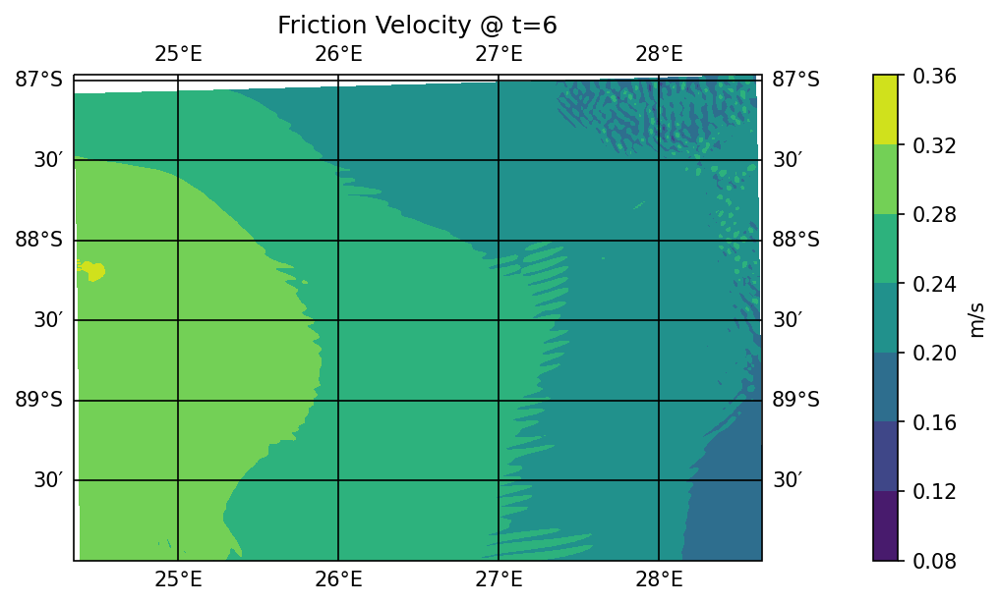

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


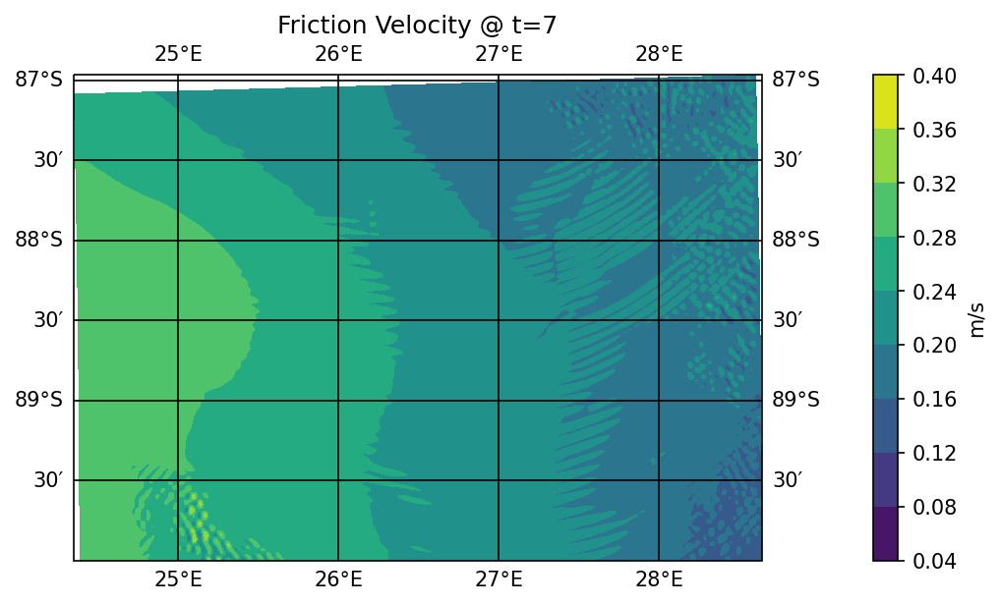

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


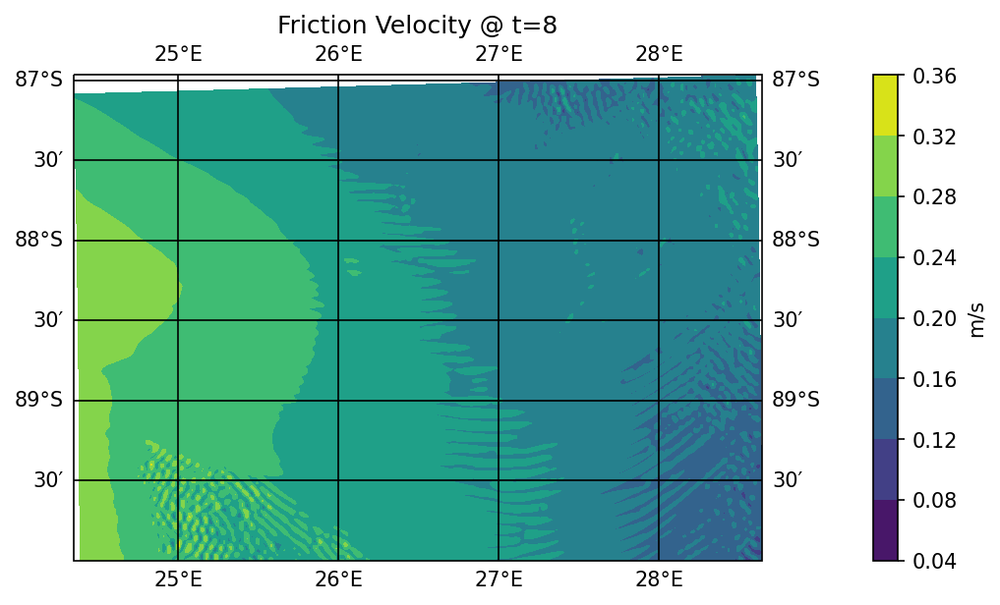

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


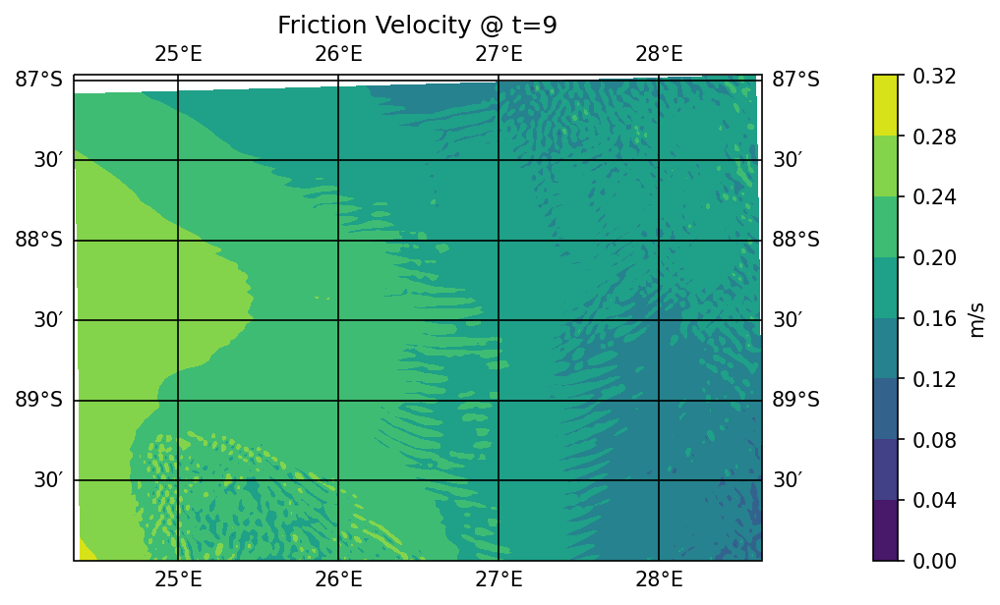

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


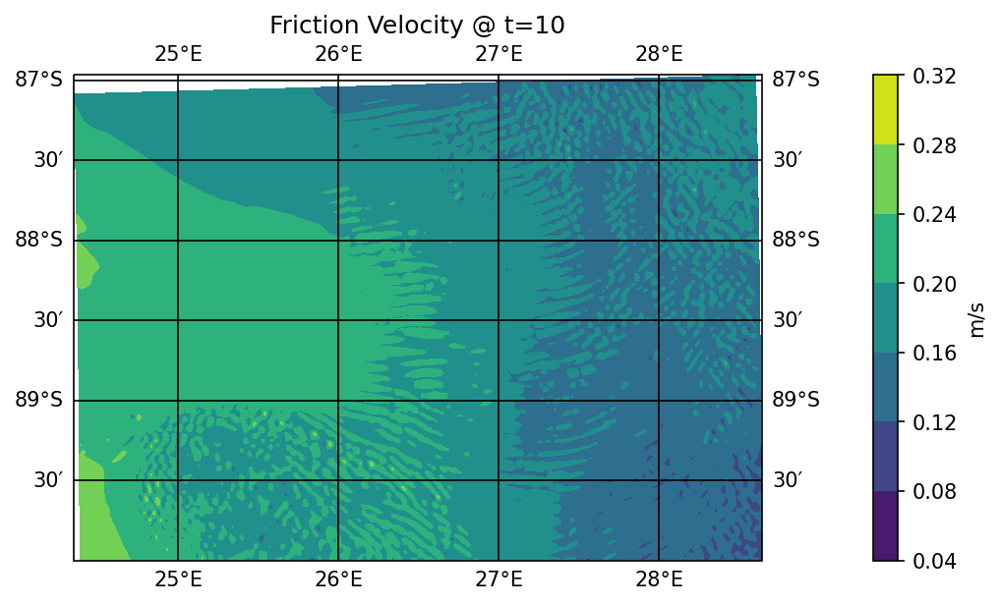

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


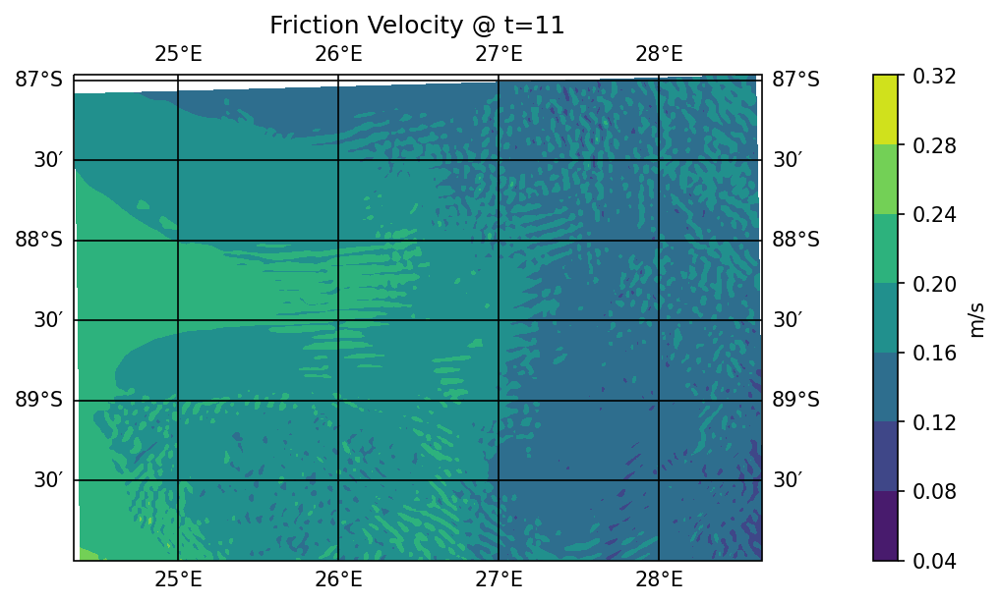

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


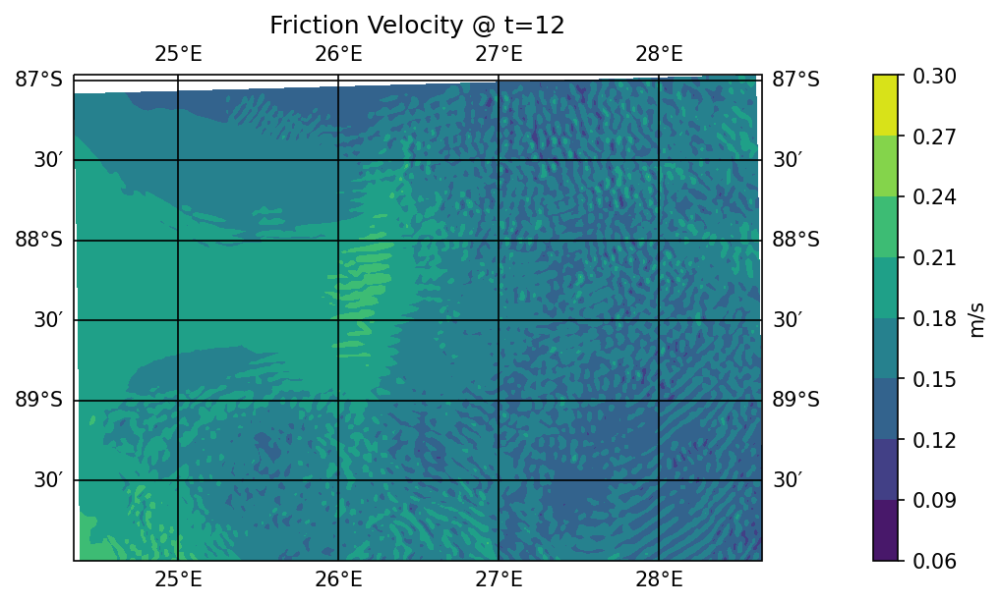

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


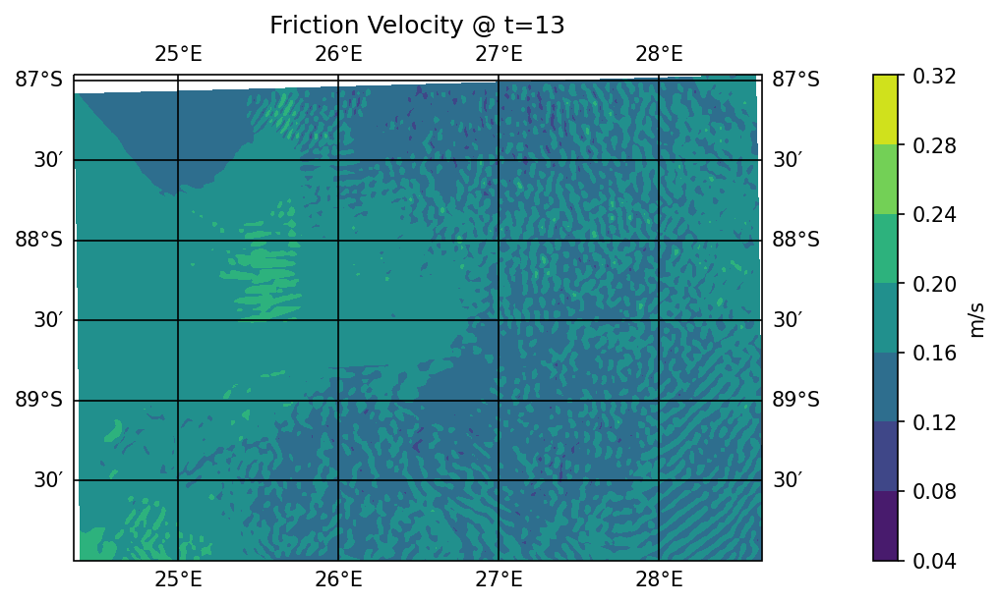

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


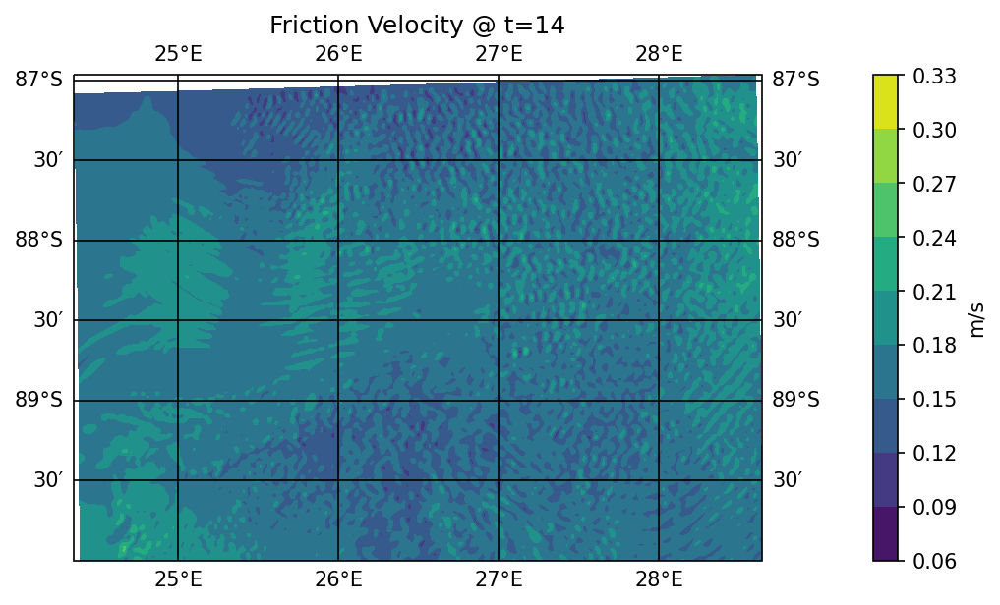

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


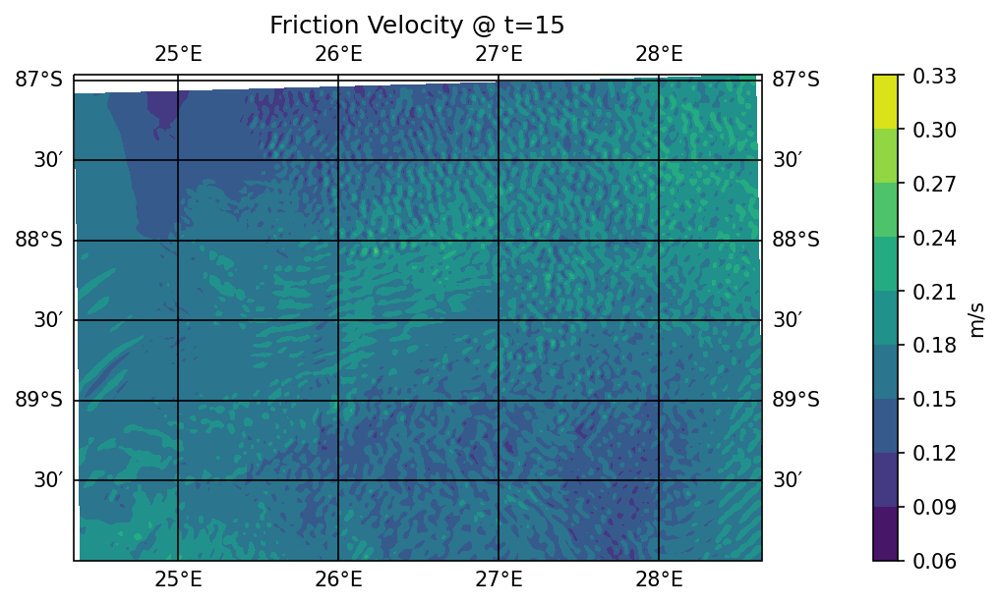

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


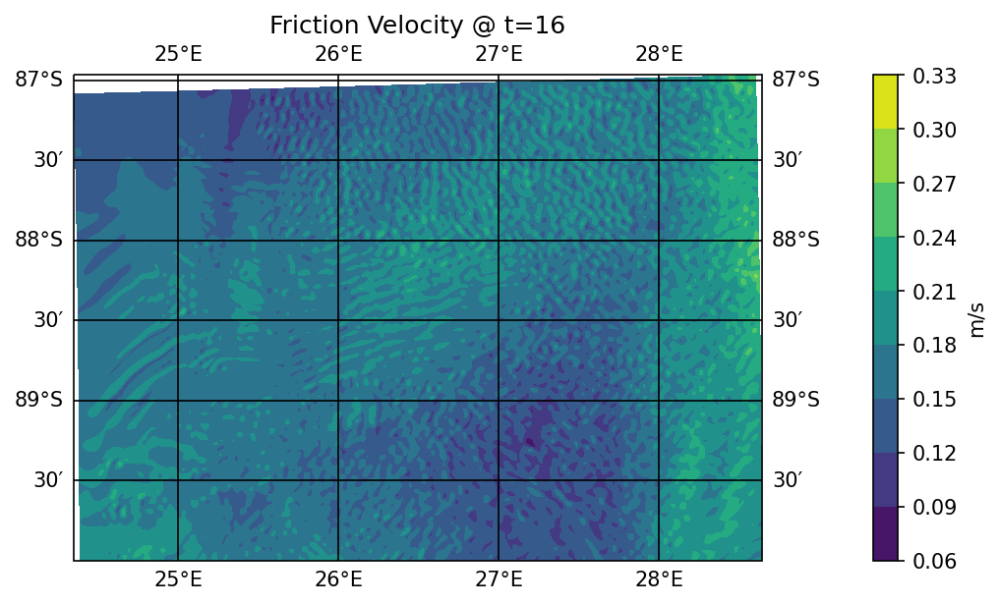

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


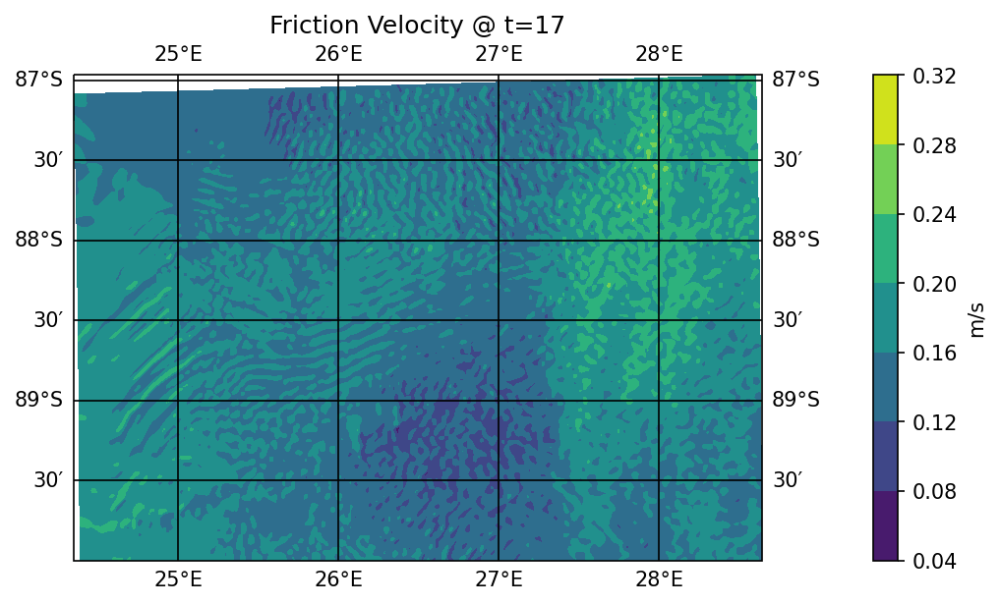

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


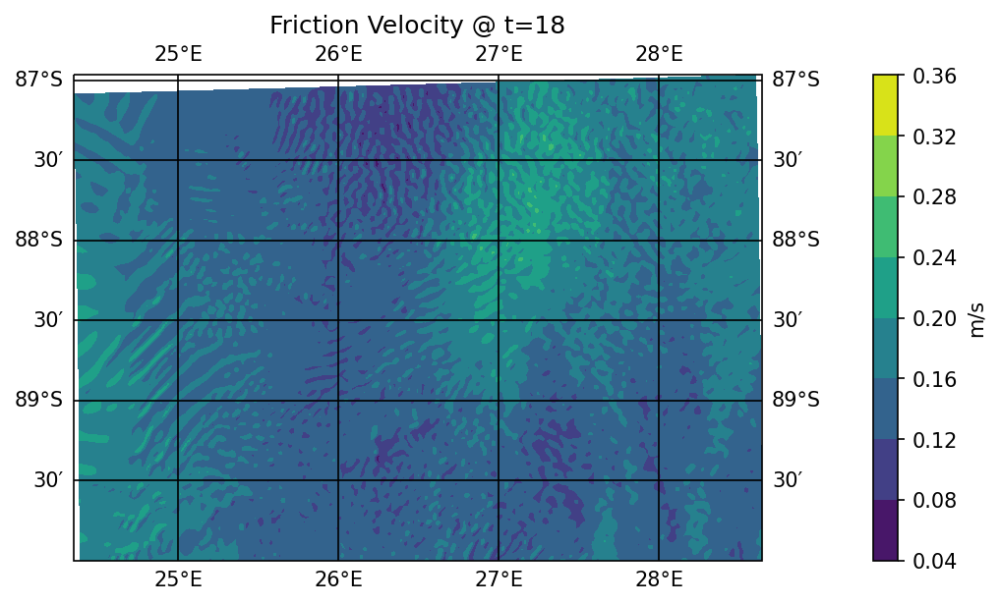

In [7]:
#ustar plots
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], ustar_6[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Friction Velocity @ t=0')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'USTAR_time0.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], ustar_7[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Friction Velocity @ t=1')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'USTAR_time1.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], ustar_8[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Friction Velocity @ t=2')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'USTAR_time2.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], ustar_9[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Friction Velocity @ t=3')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'USTAR_time3.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], ustar_10[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Friction Velocity @ t=4')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'USTAR_time4.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], ustar_11[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Friction Velocity @ t=5')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'USTAR_time5.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], ustar_12[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Friction Velocity @ t=6')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'USTAR_time6.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], ustar_13[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Friction Velocity @ t=7')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'USTAR_time7.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], ustar_14[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Friction Velocity @ t=8')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'USTAR_time8.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], ustar_15[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Friction Velocity @ t=9')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'USTAR_time9.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], ustar_16[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Friction Velocity @ t=10')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'USTAR_time10.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], ustar_17[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Friction Velocity @ t=11')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'USTAR_time11.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], ustar_18[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Friction Velocity @ t=12')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'USTAR_time12.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], ustar_19[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Friction Velocity @ t=13')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'USTAR_time13.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], ustar_20[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Friction Velocity @ t=14')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'USTAR_time14.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], ustar_21[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Friction Velocity @ t=15')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'USTAR_time15.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], ustar_22[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Friction Velocity @ t=16')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'USTAR_time16.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], ustar_23[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Friction Velocity @ t=17')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'USTAR_time17.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], ustar_24[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Friction Velocity @ t=18')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'USTAR_time18.png', bbox_inches = 'tight',dpi = 150)
plt.show()



C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


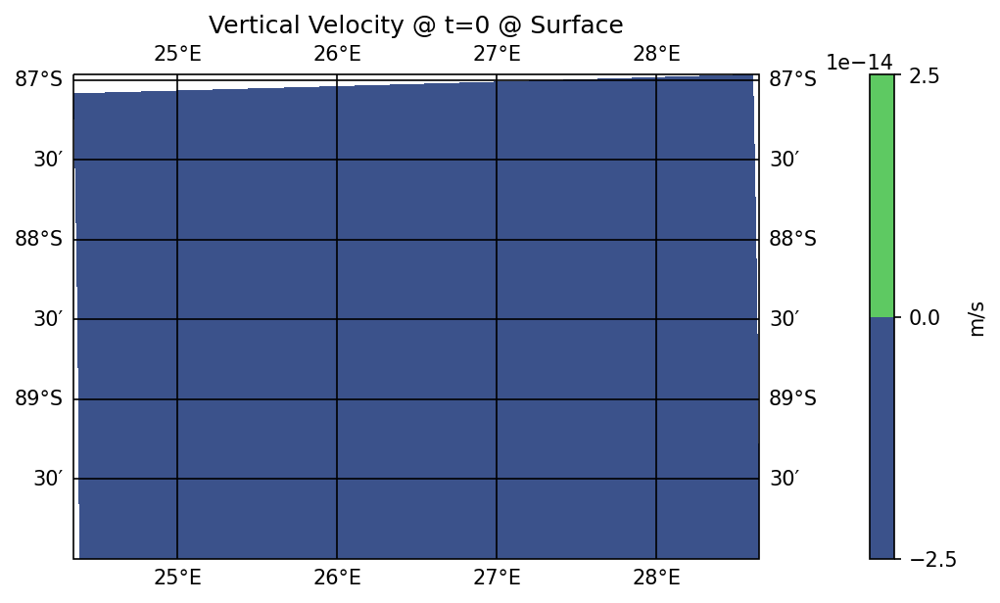

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


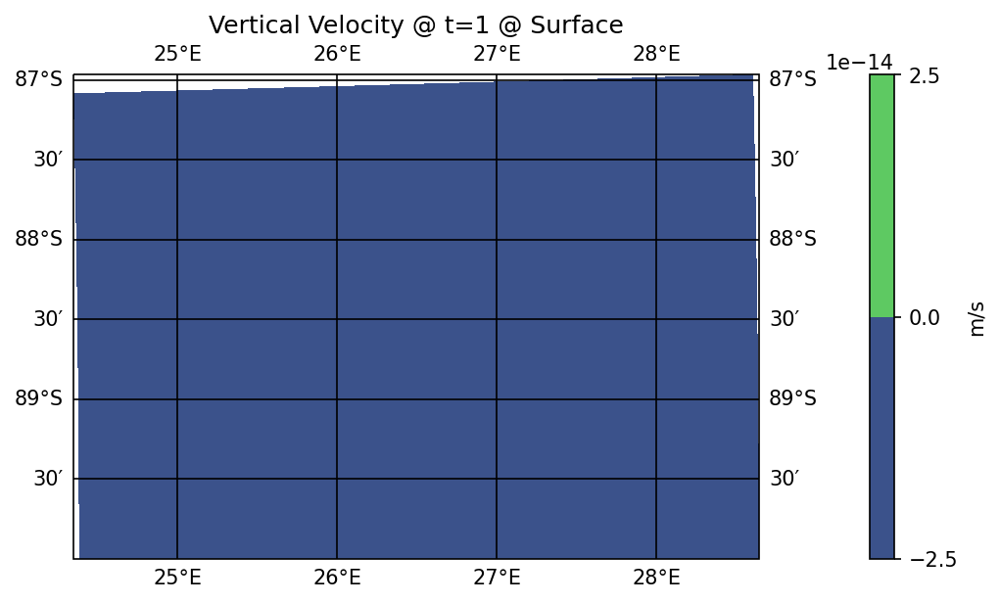

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


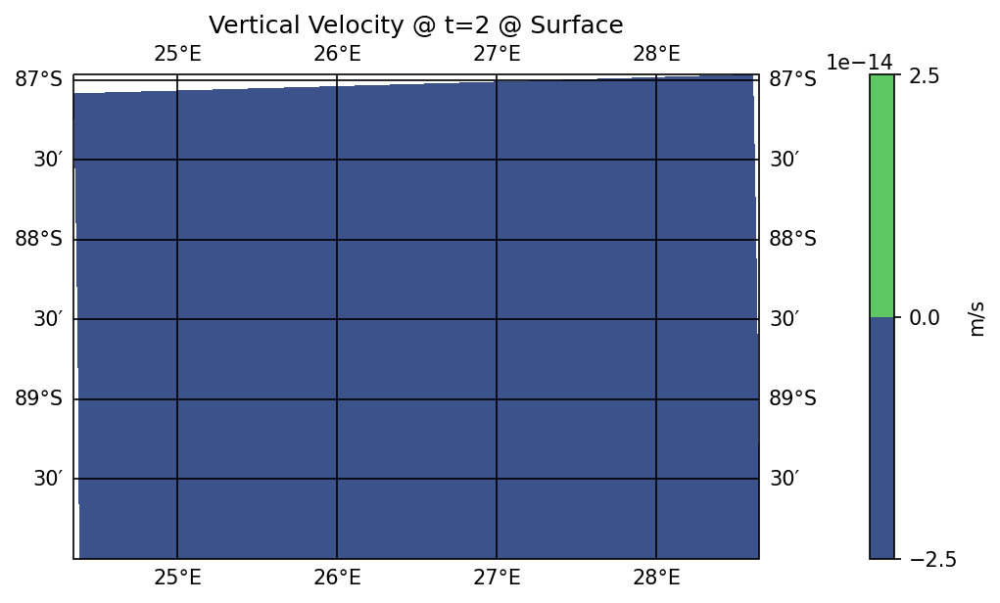

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


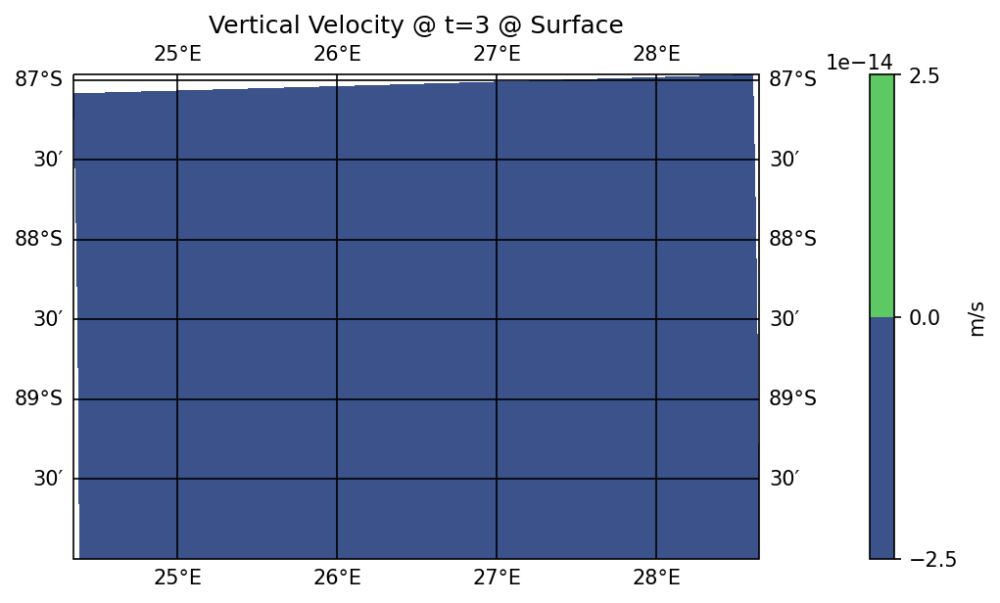

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


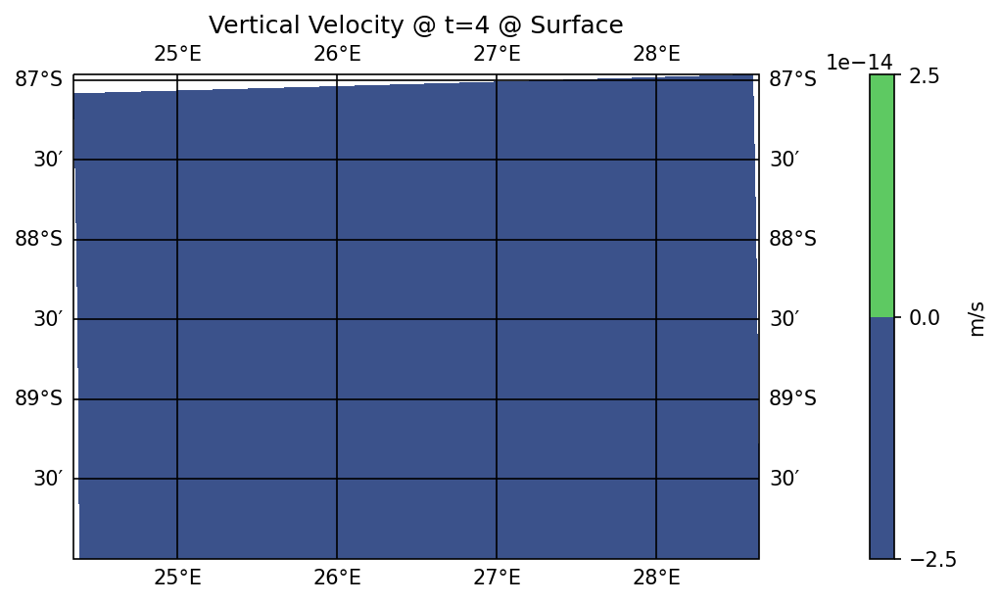

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


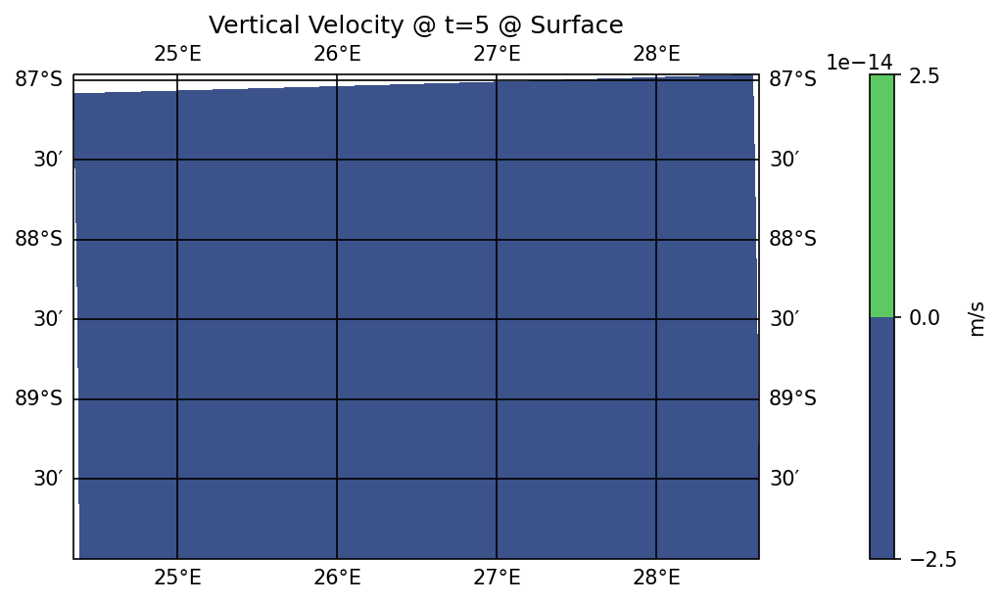

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


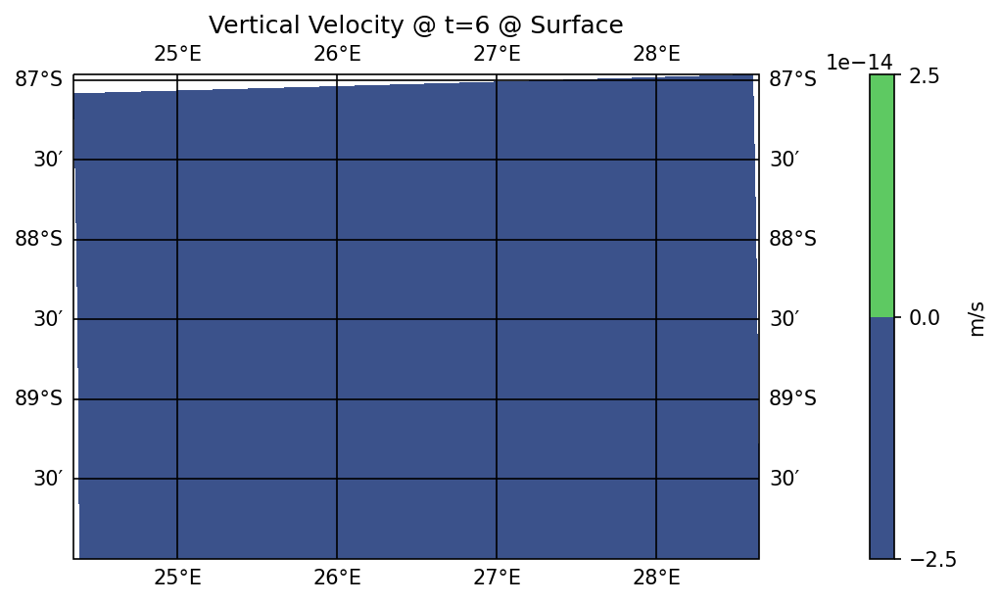

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


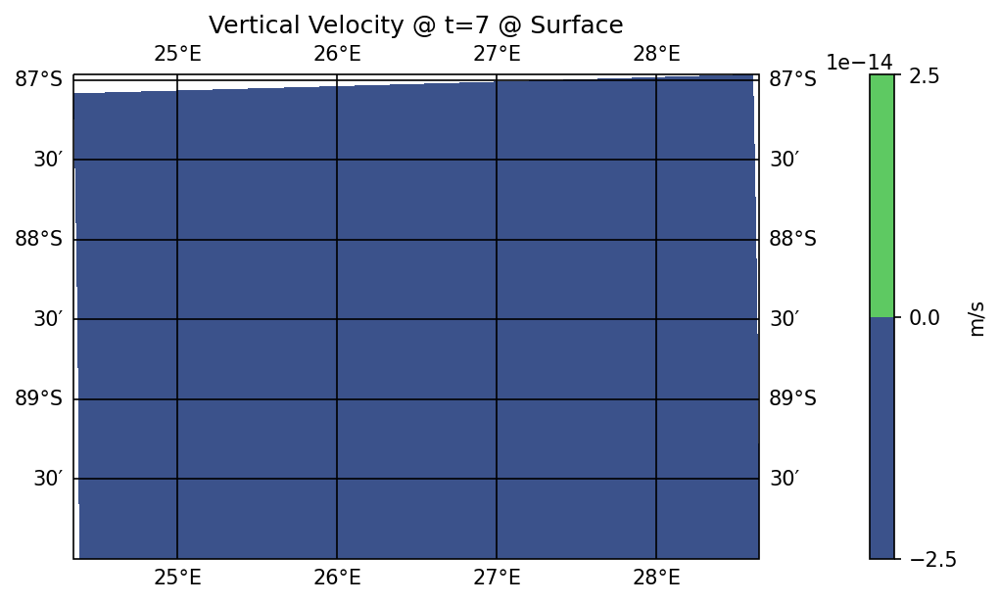

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


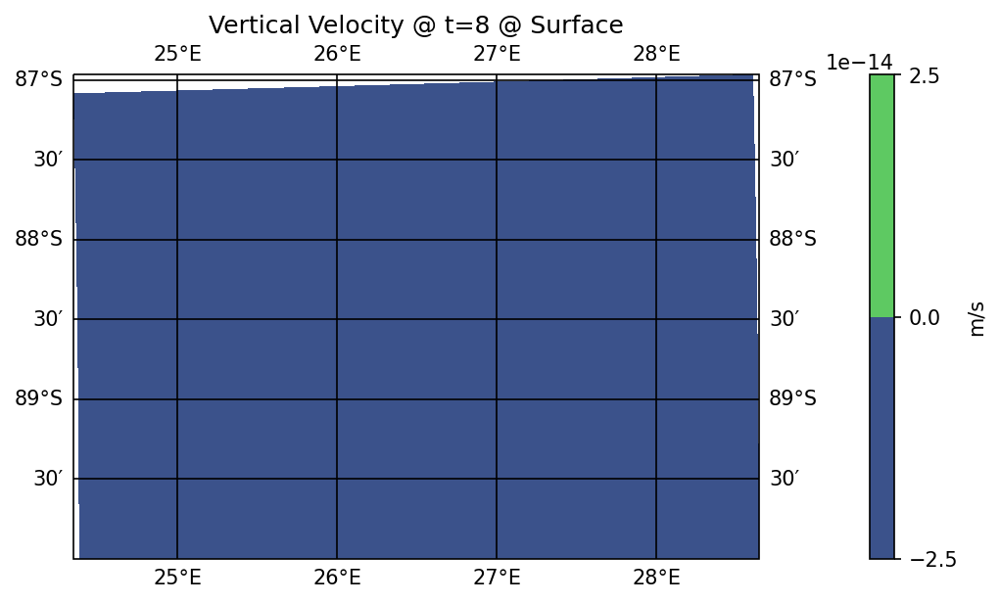

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


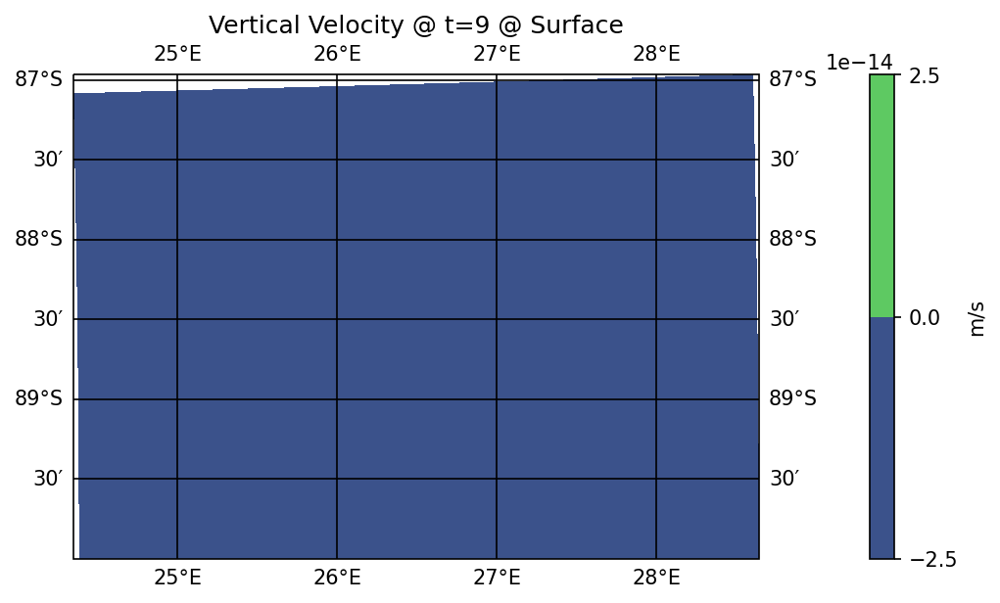

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


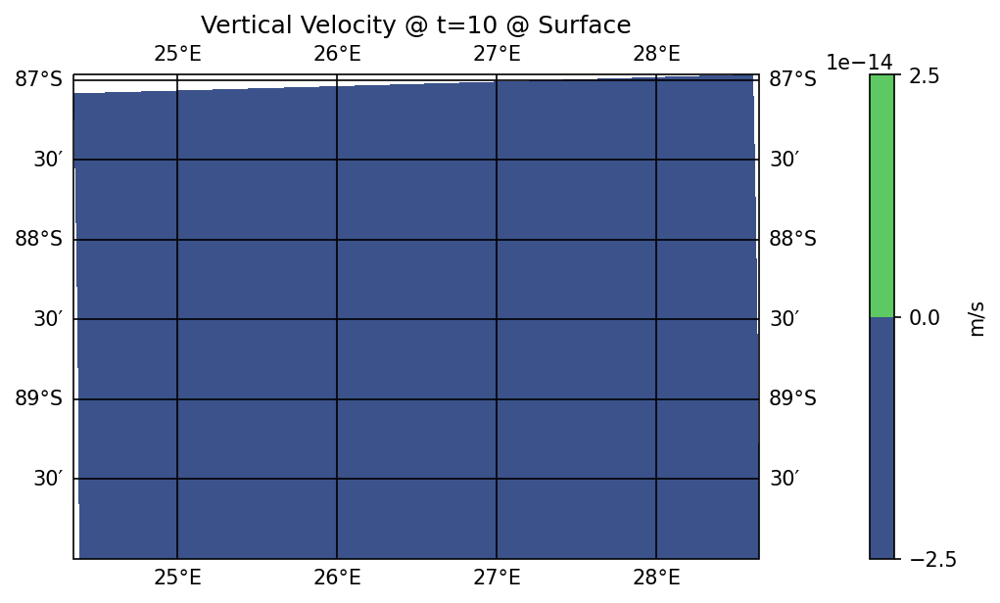

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '
C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


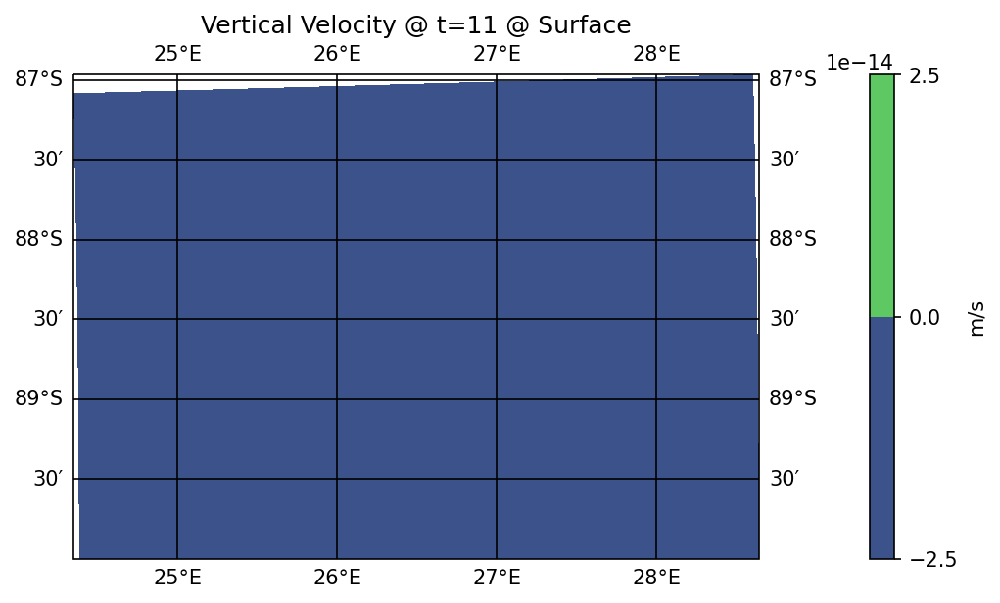

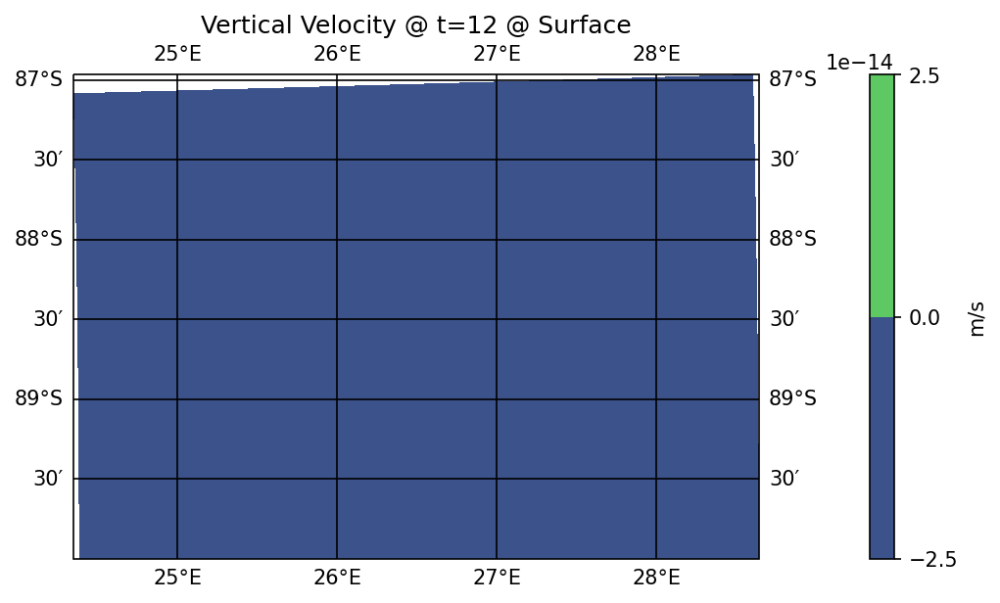

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


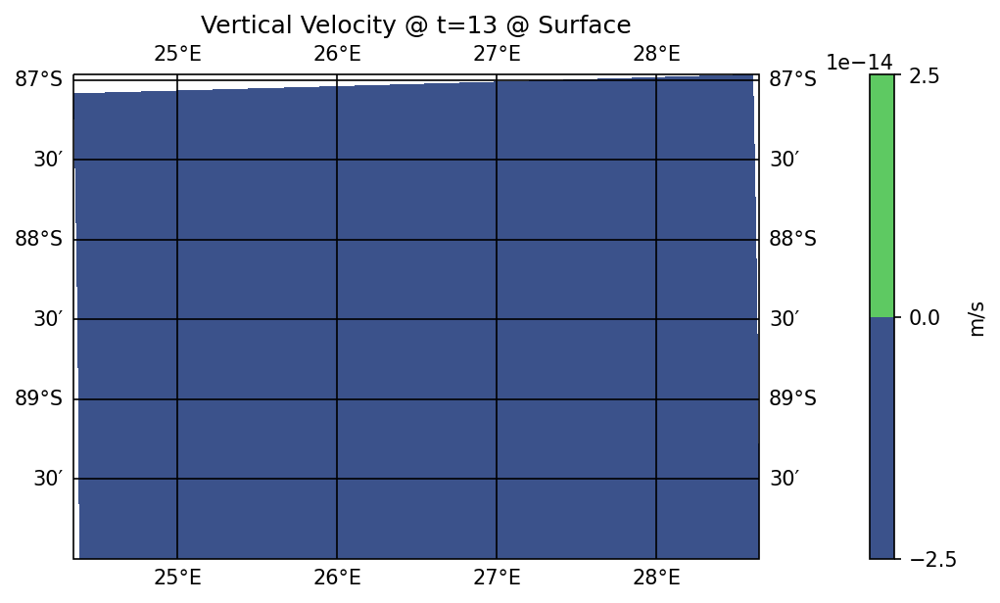

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


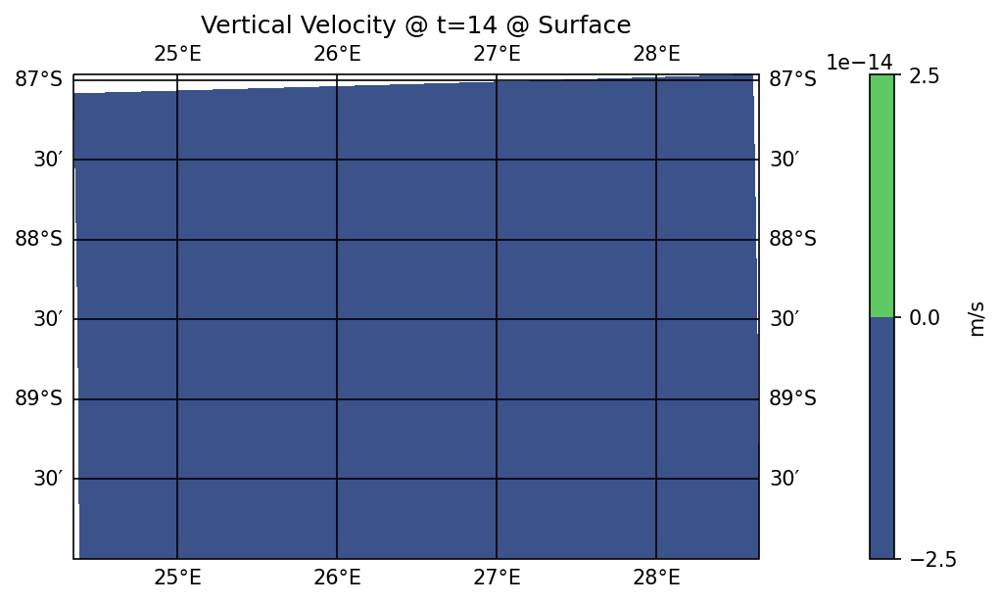

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


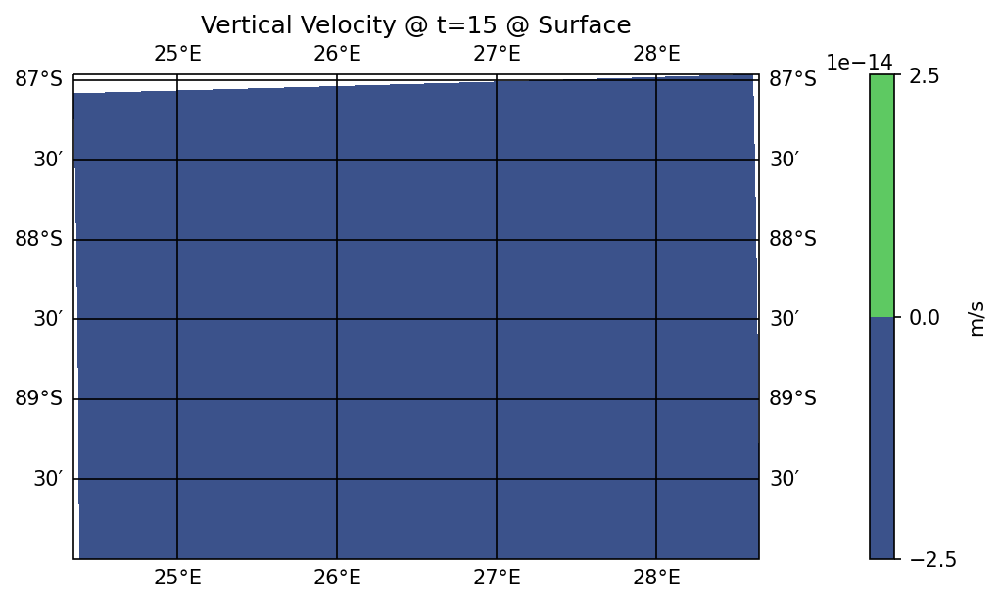

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


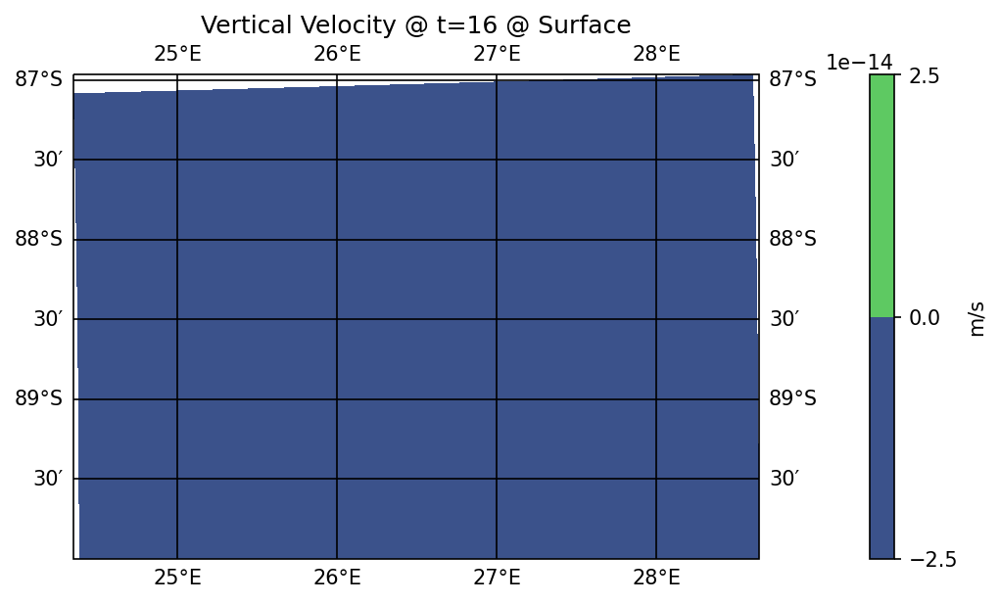

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


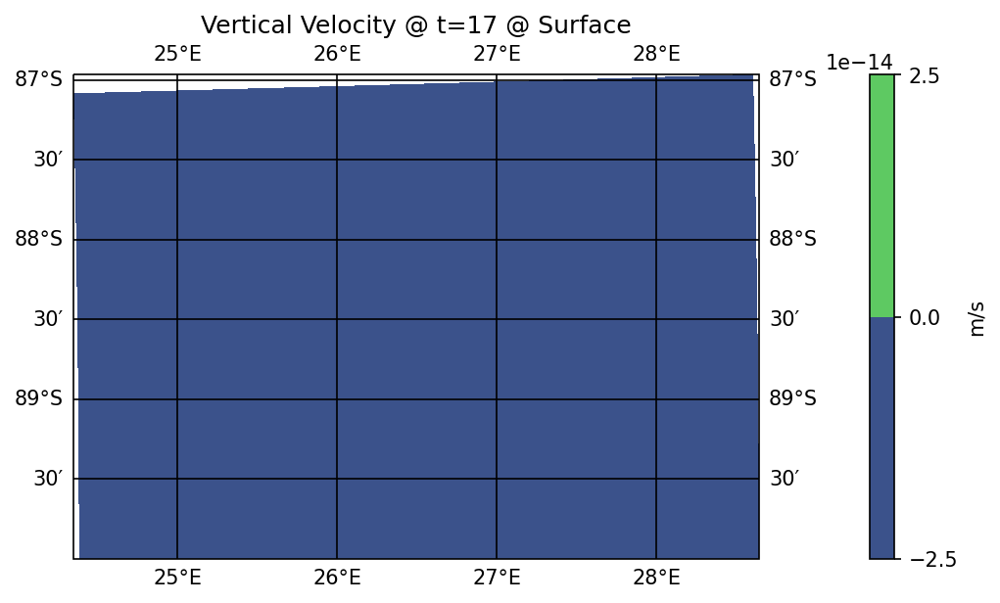

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


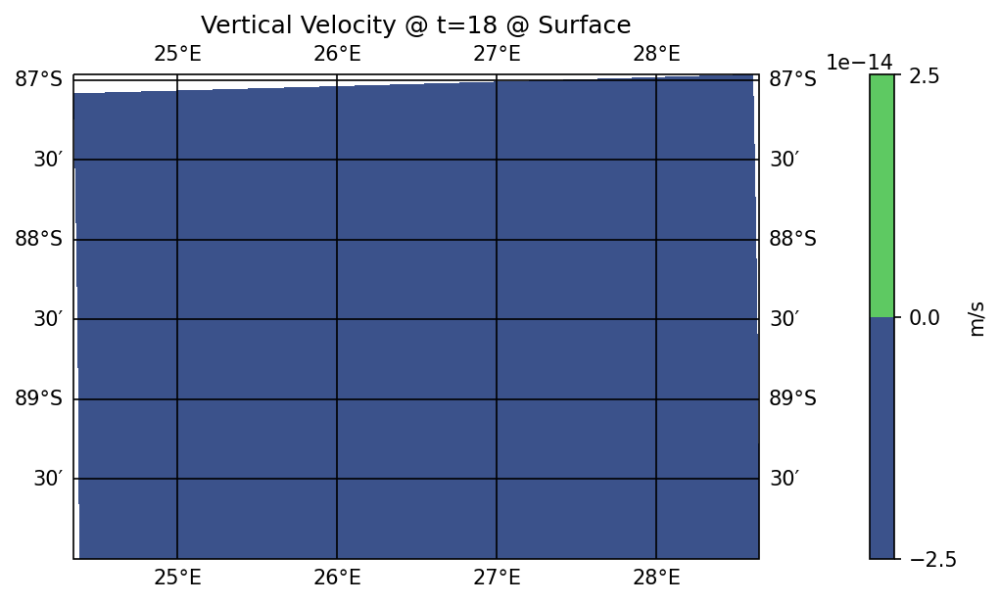

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


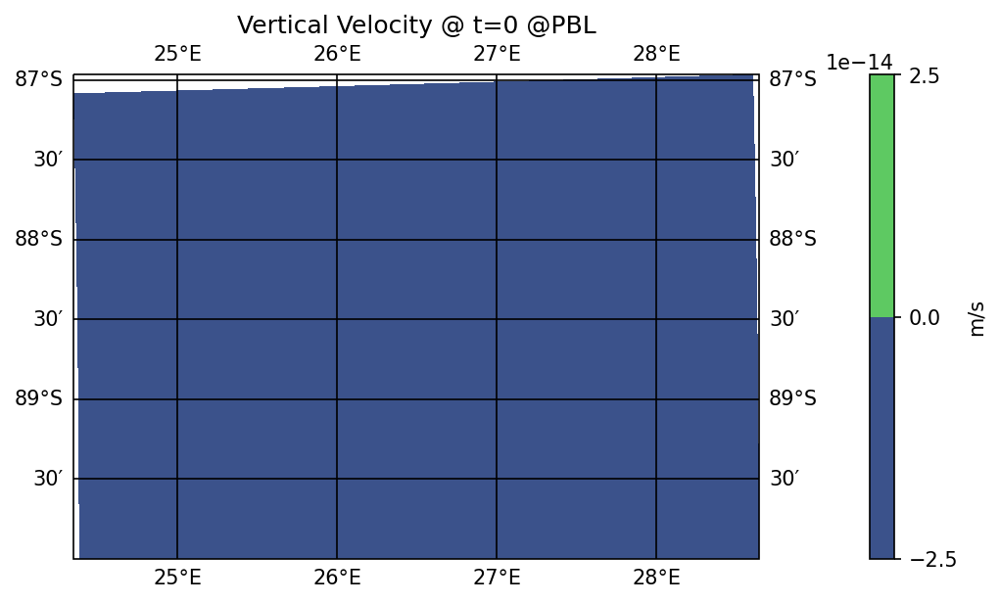

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


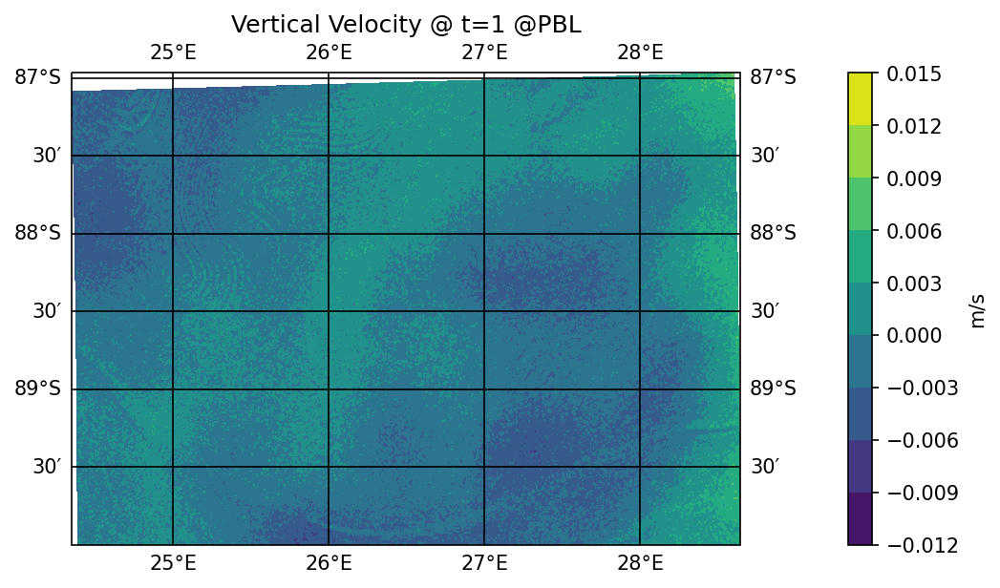

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


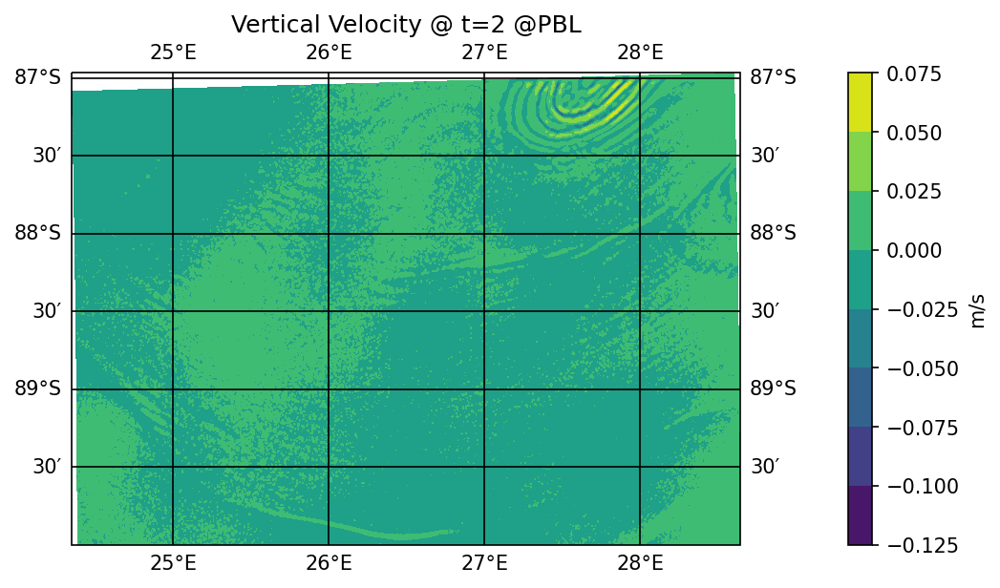

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


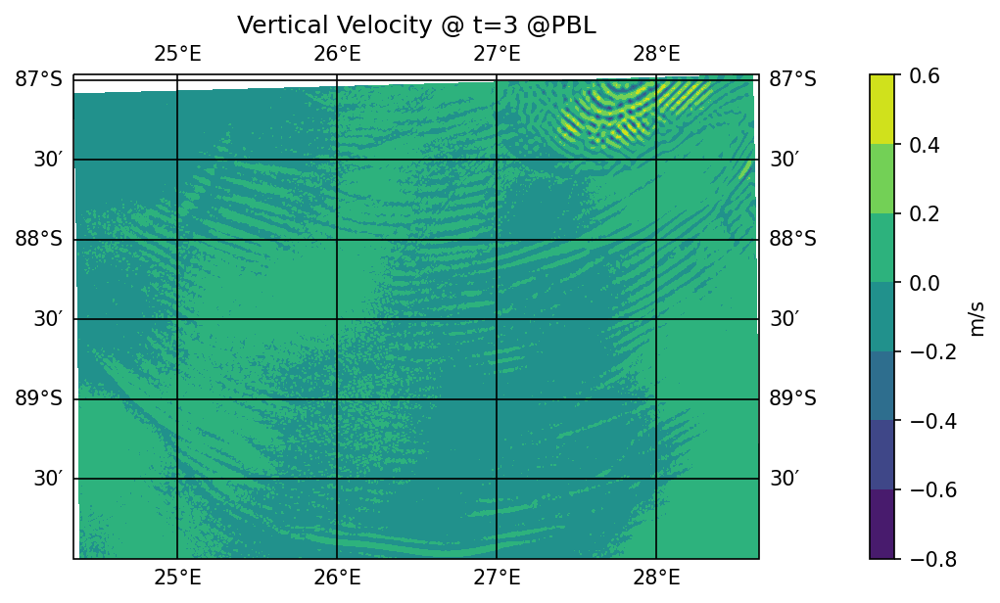

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


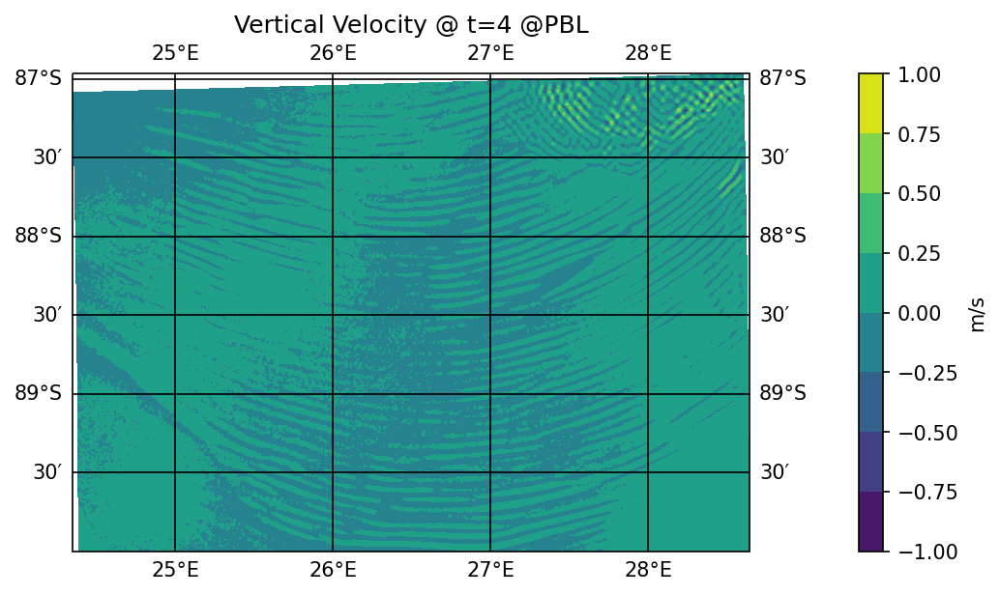

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


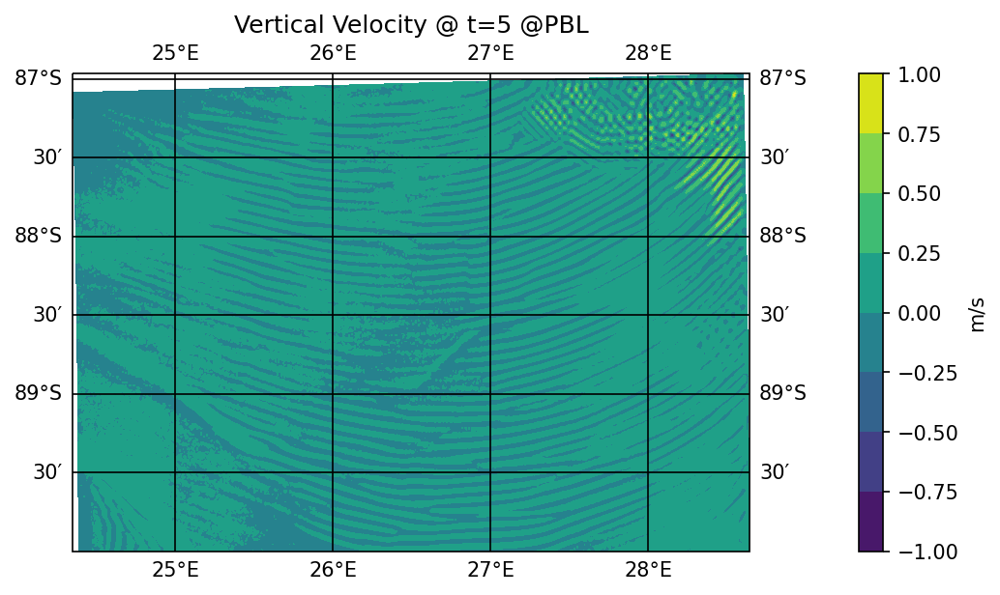

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


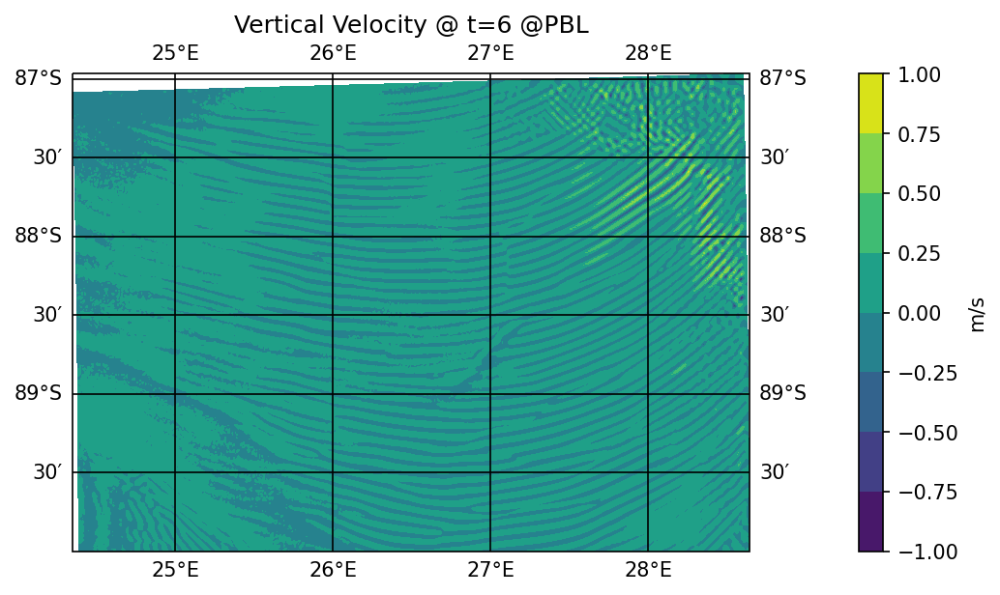

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


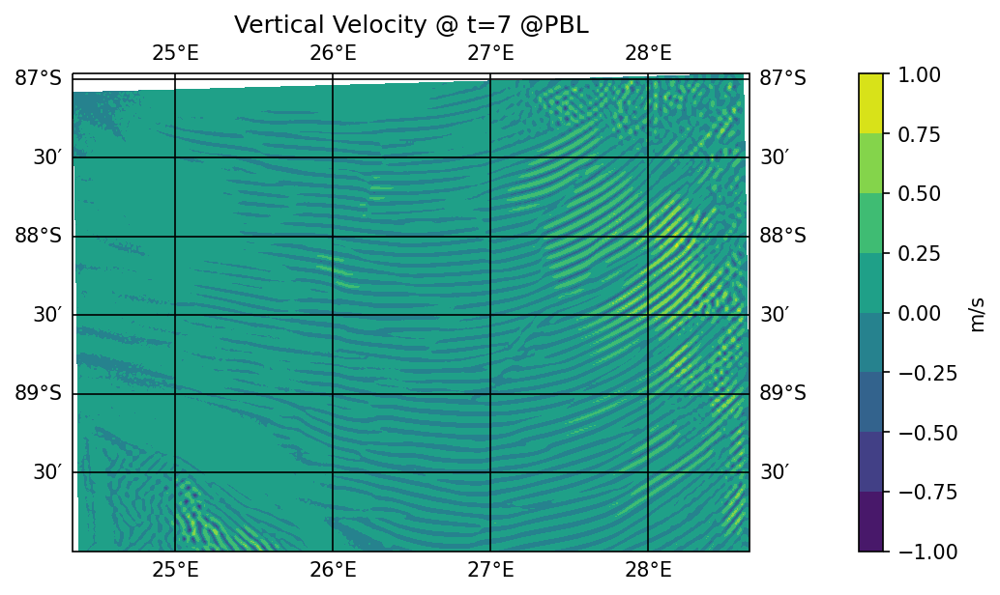

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


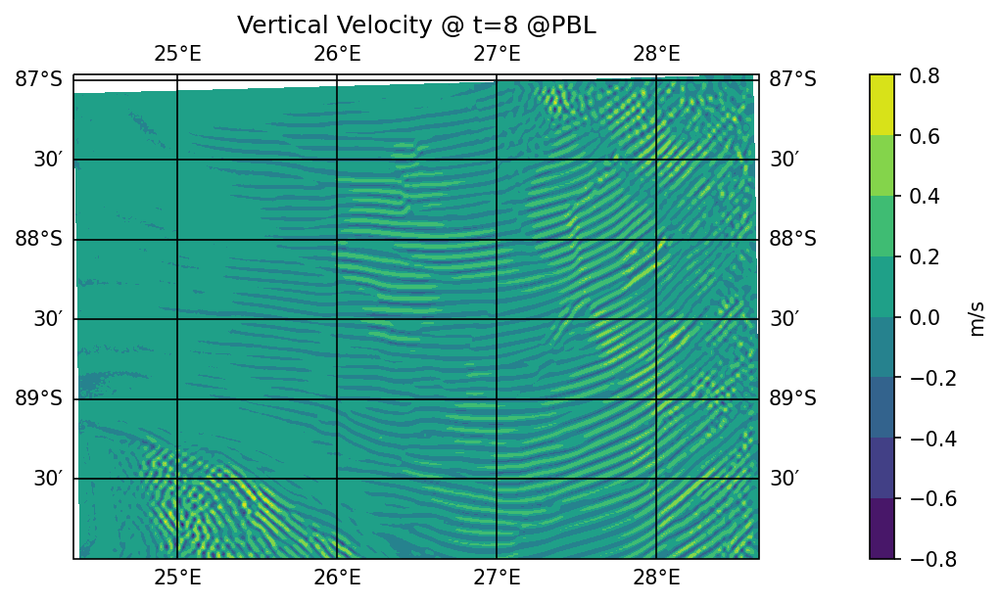

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


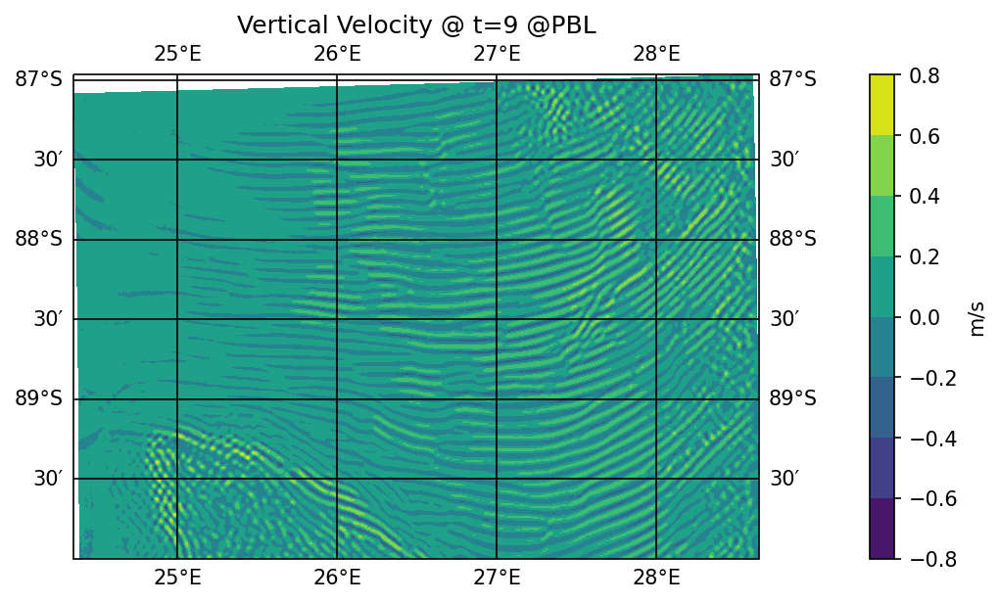

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


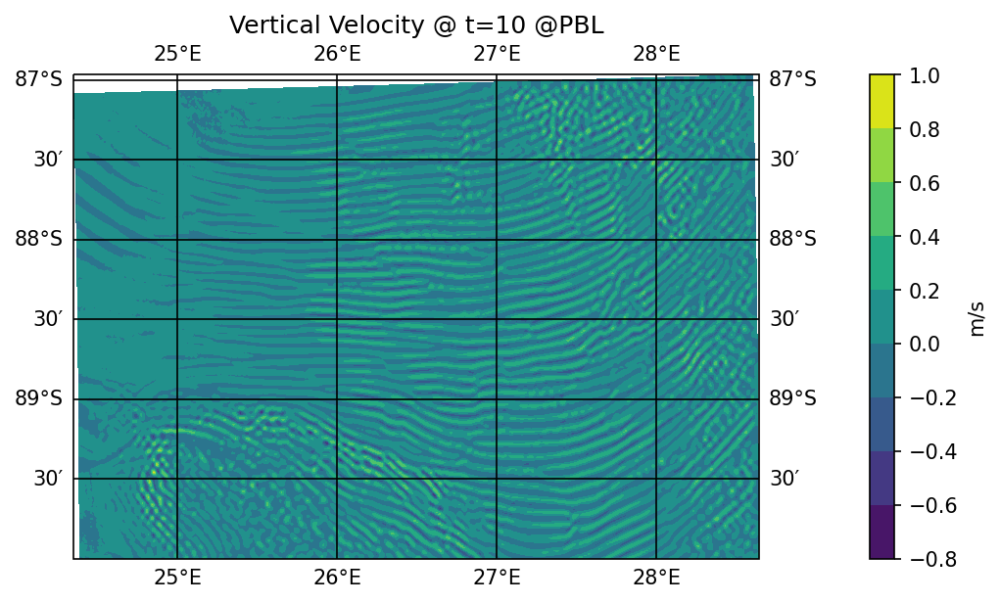

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


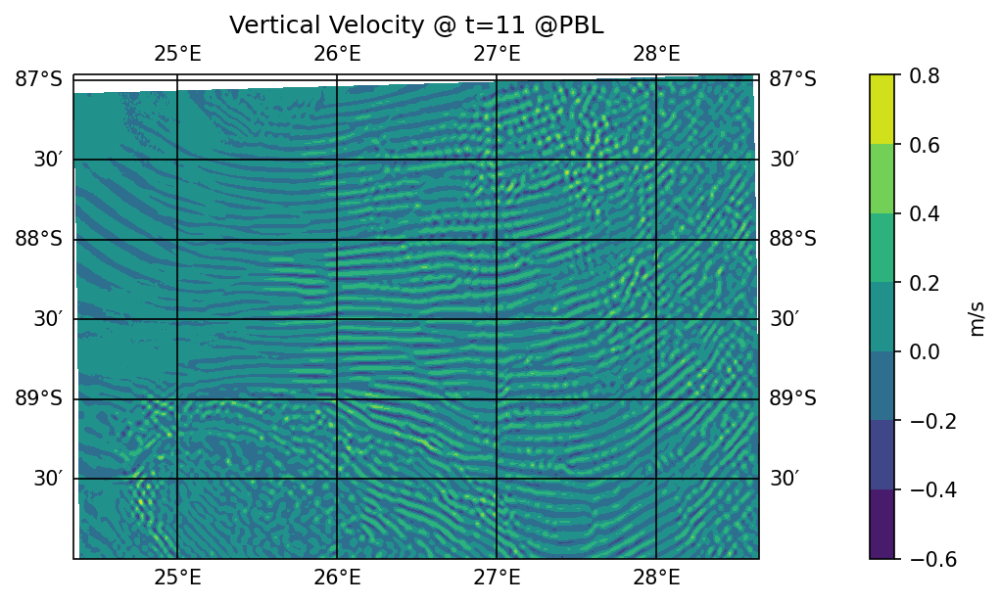

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


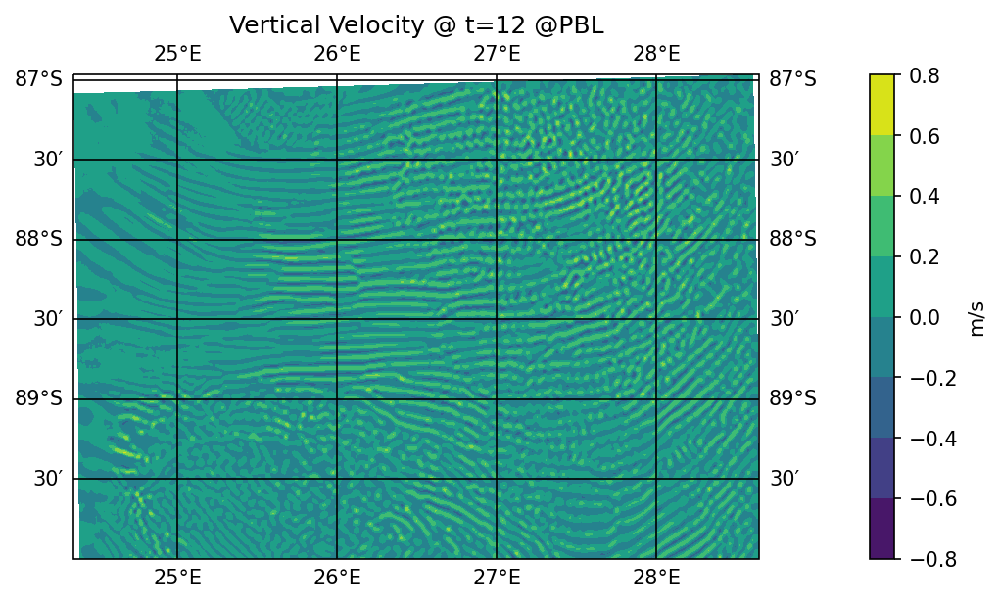

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


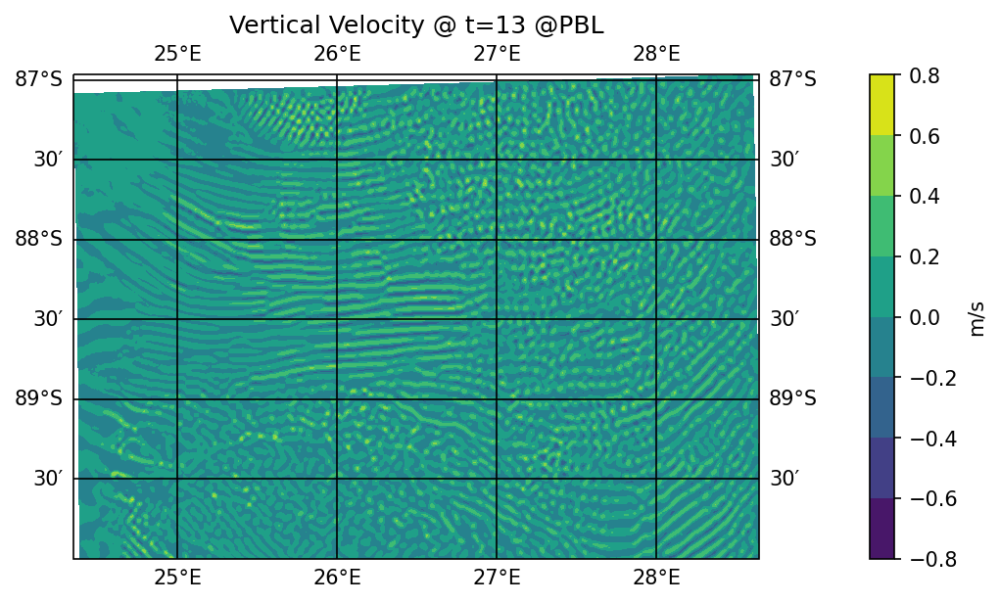

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


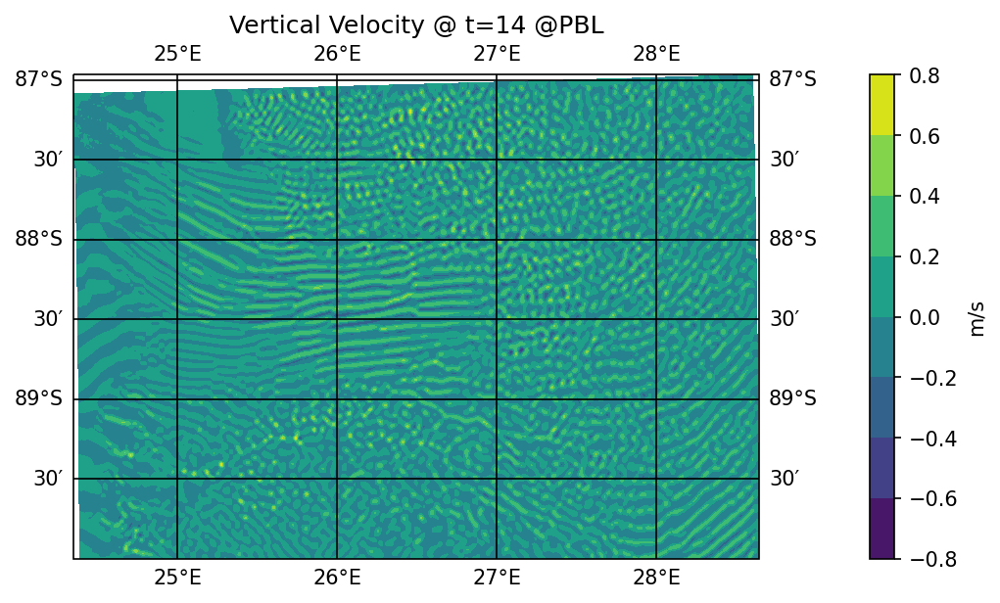

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


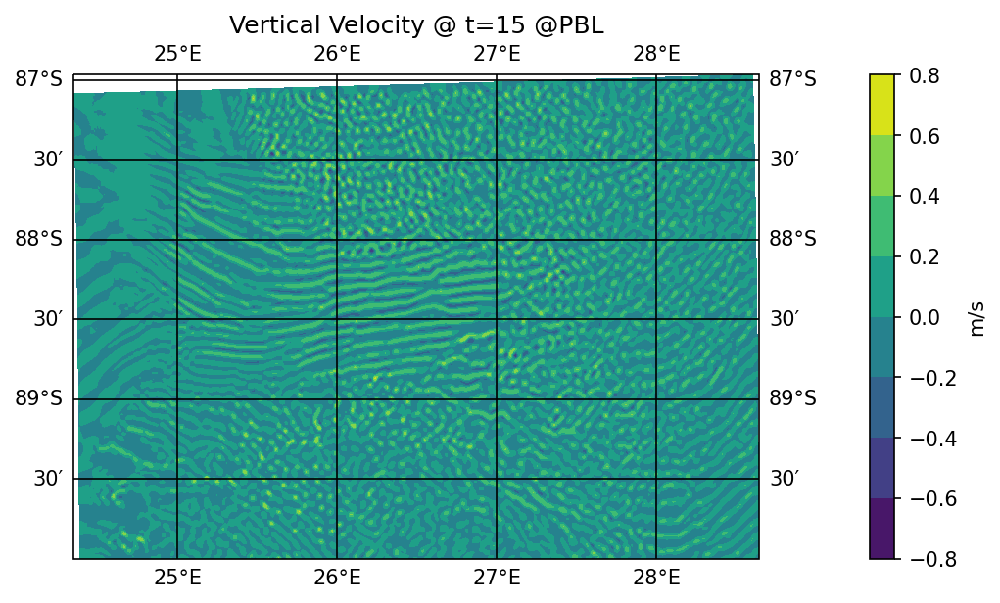

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


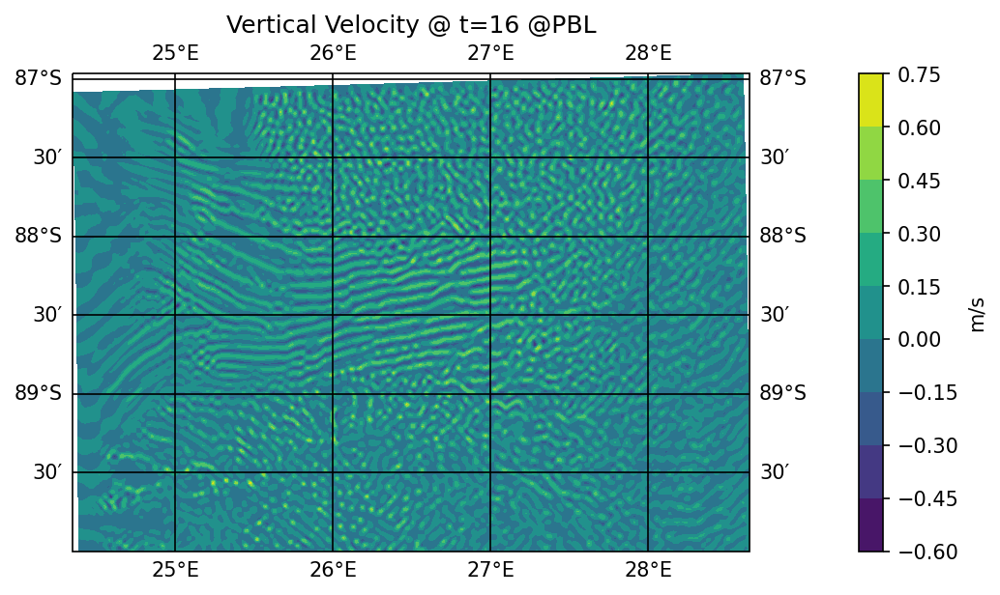

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


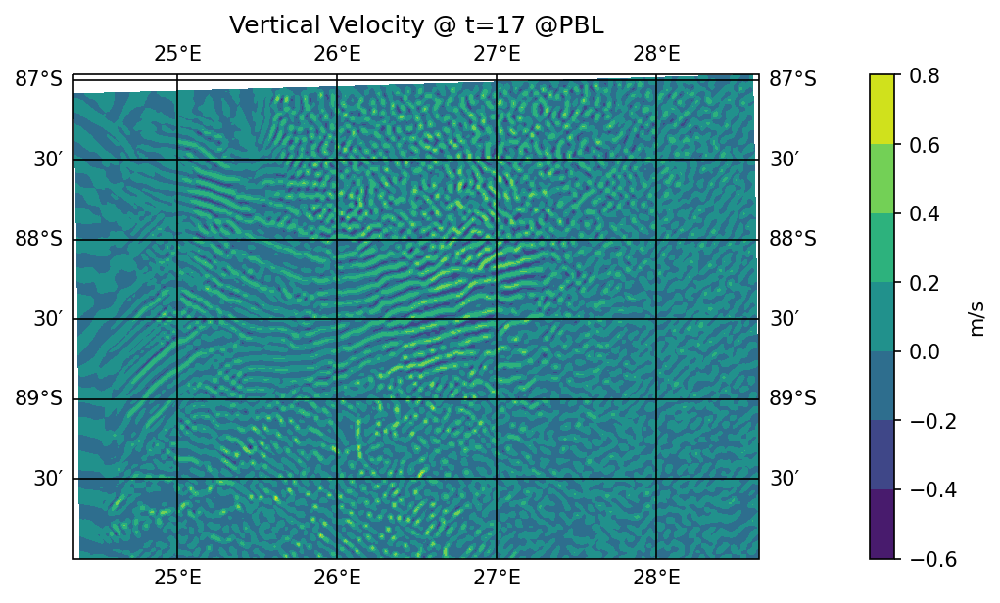

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


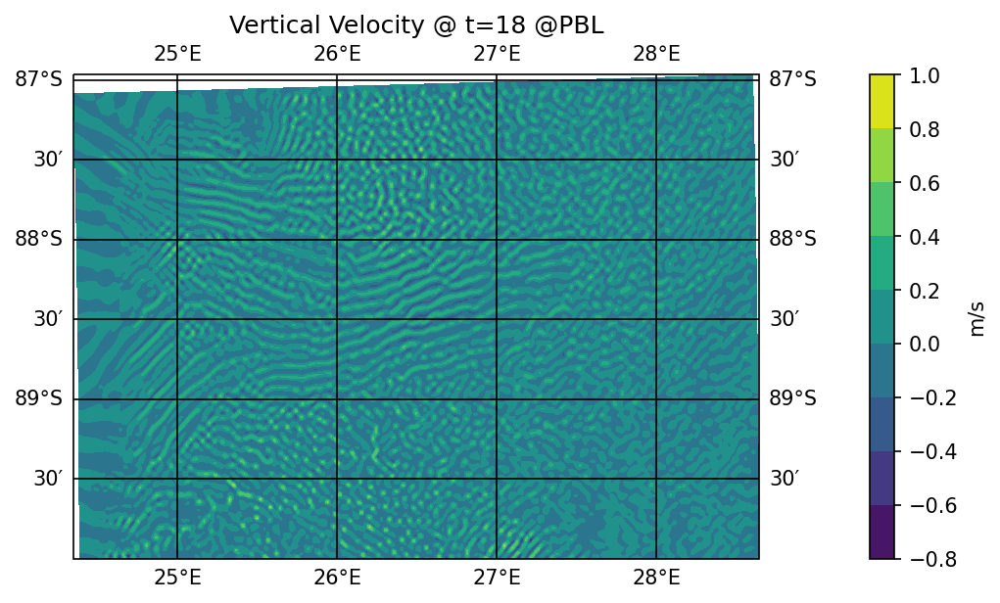

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


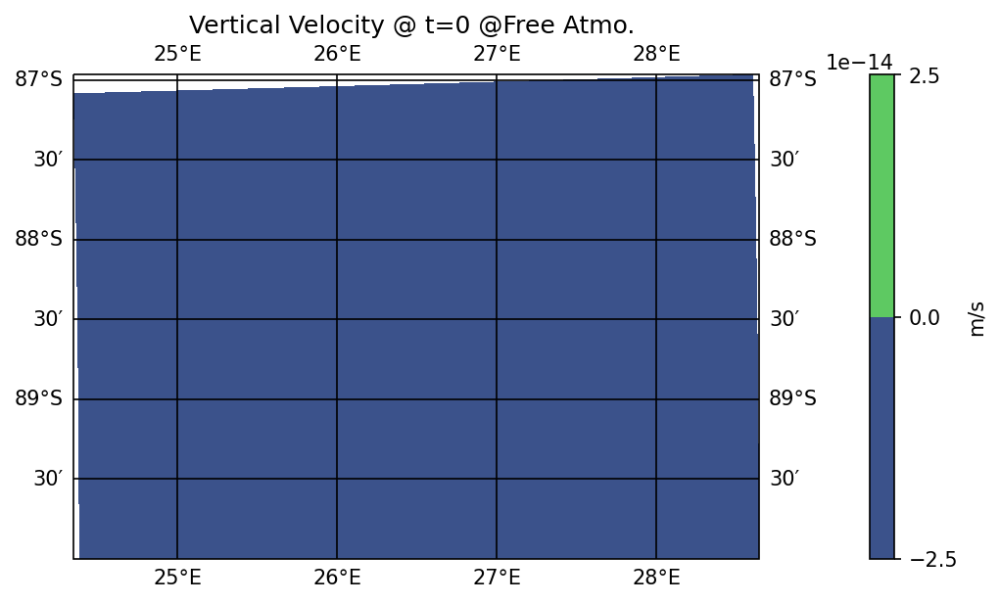

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


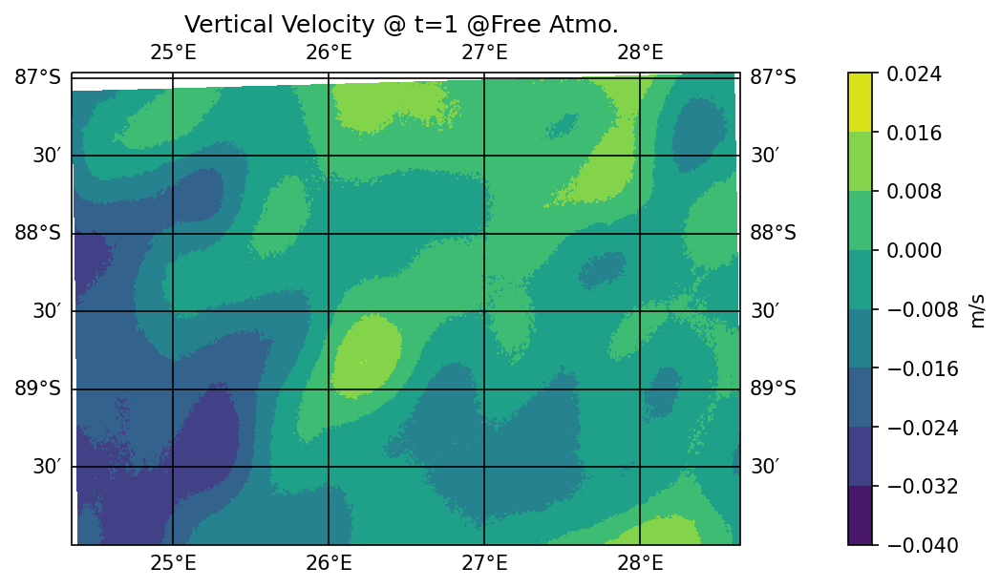

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


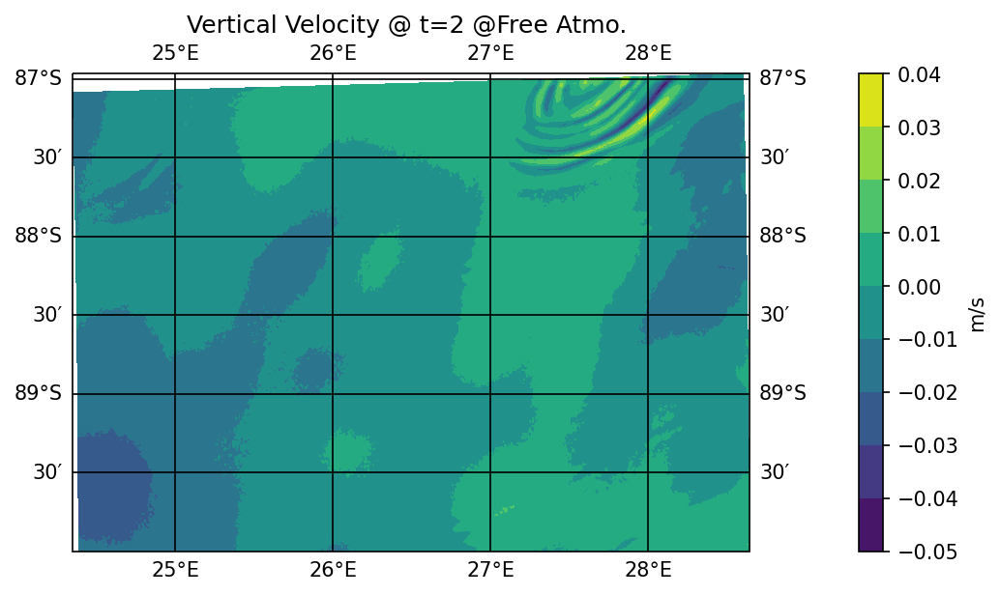

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


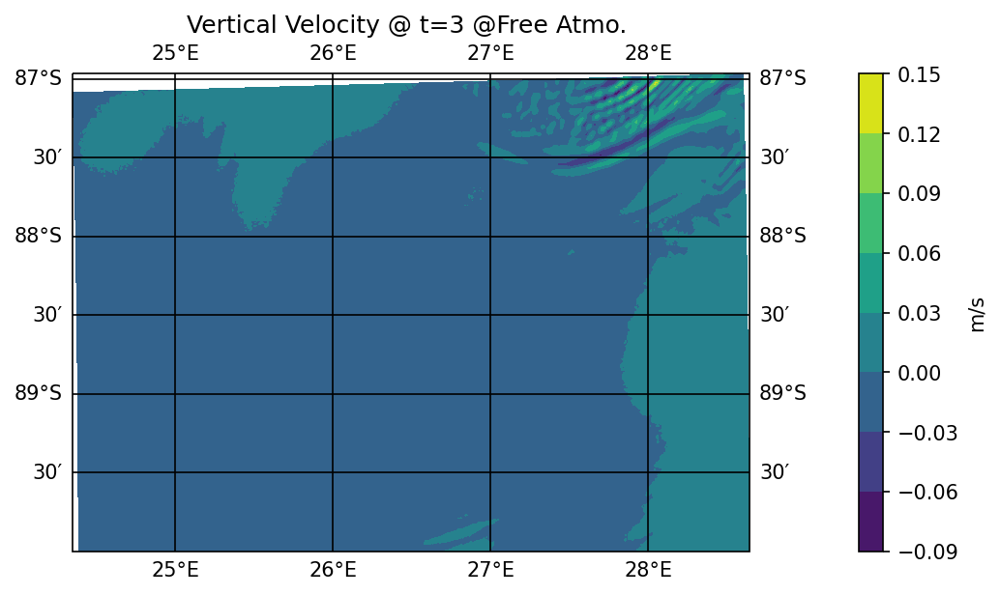

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


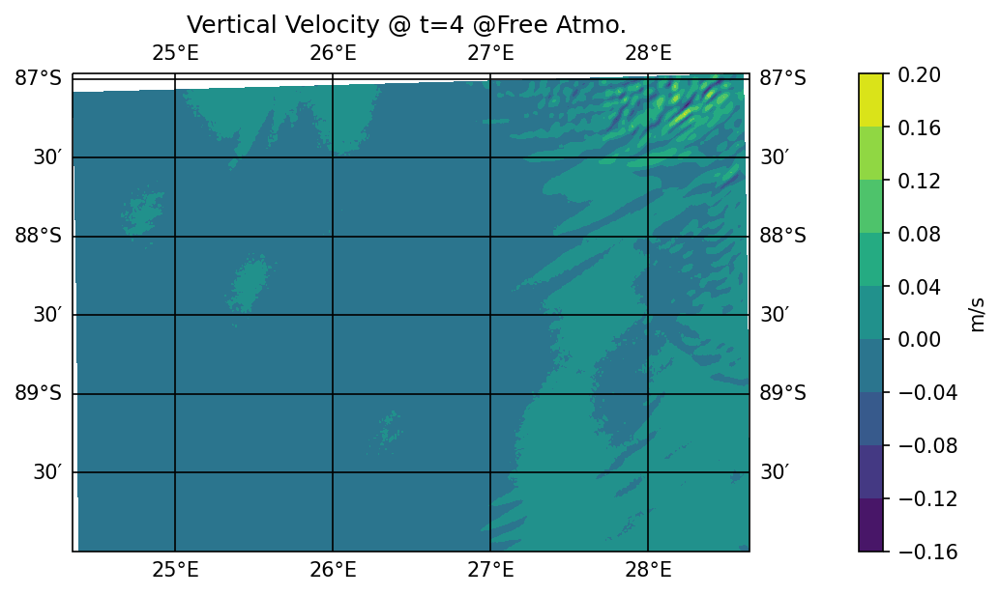

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


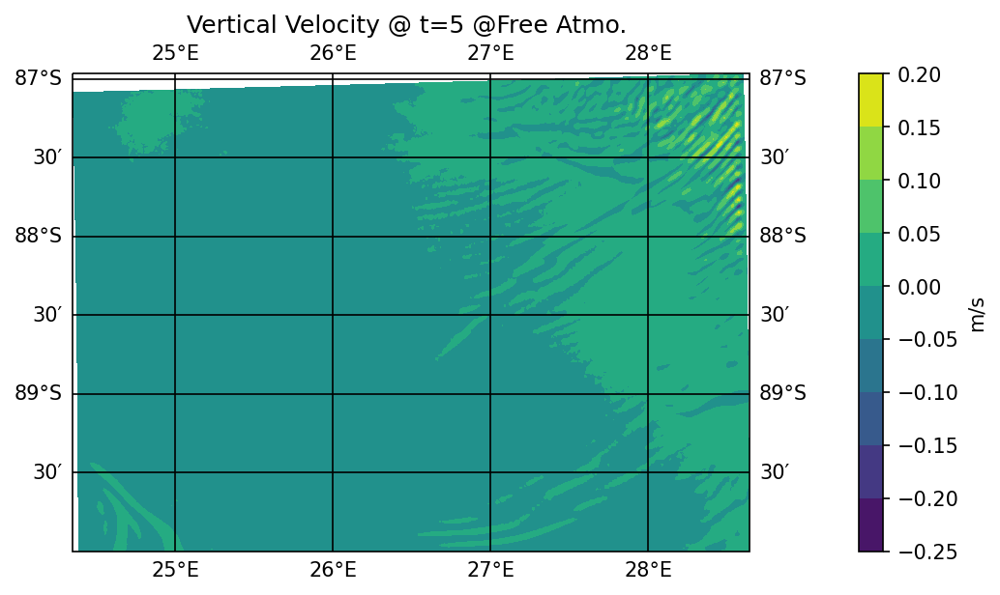

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


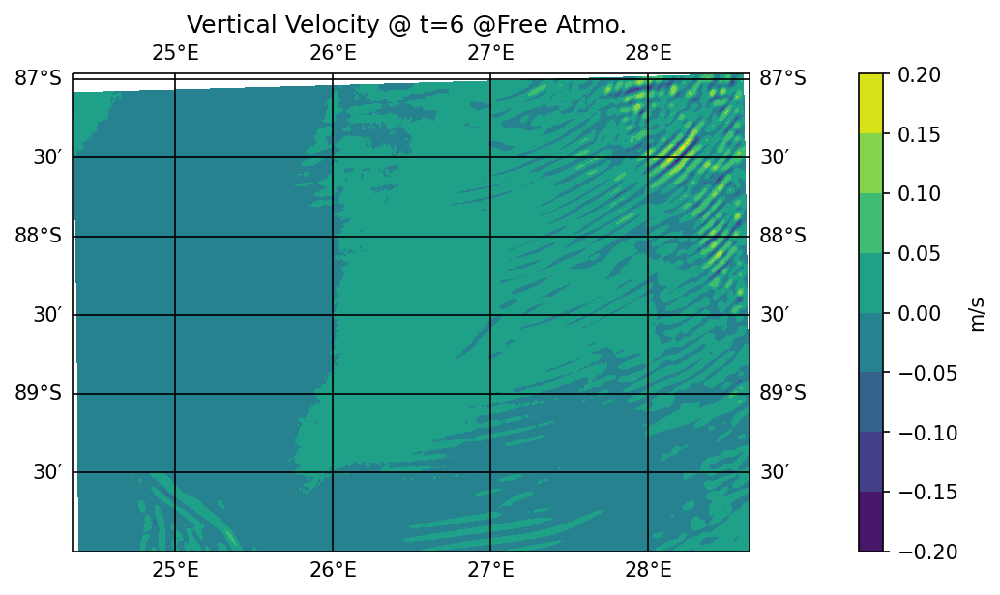

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


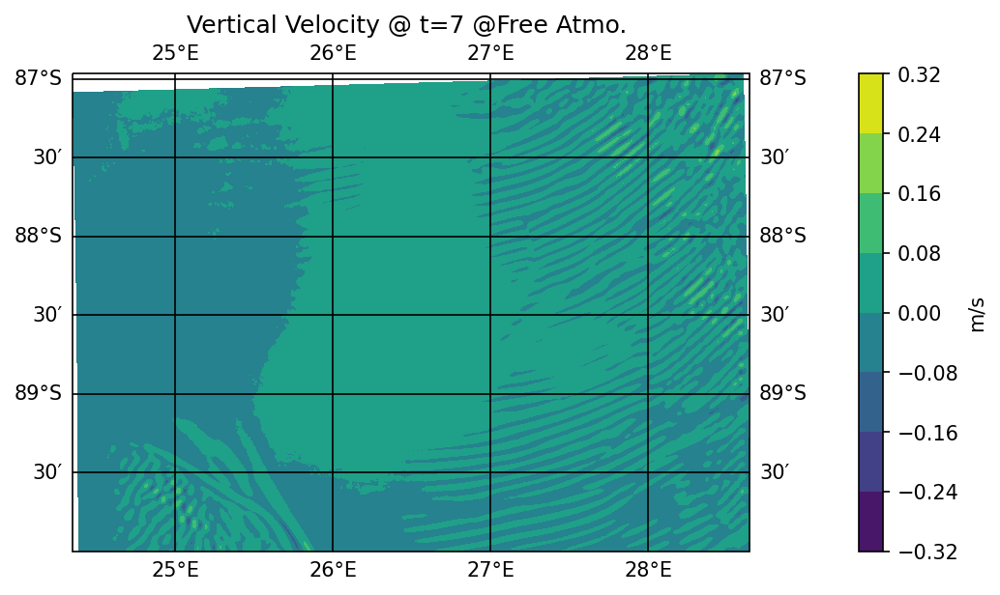

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


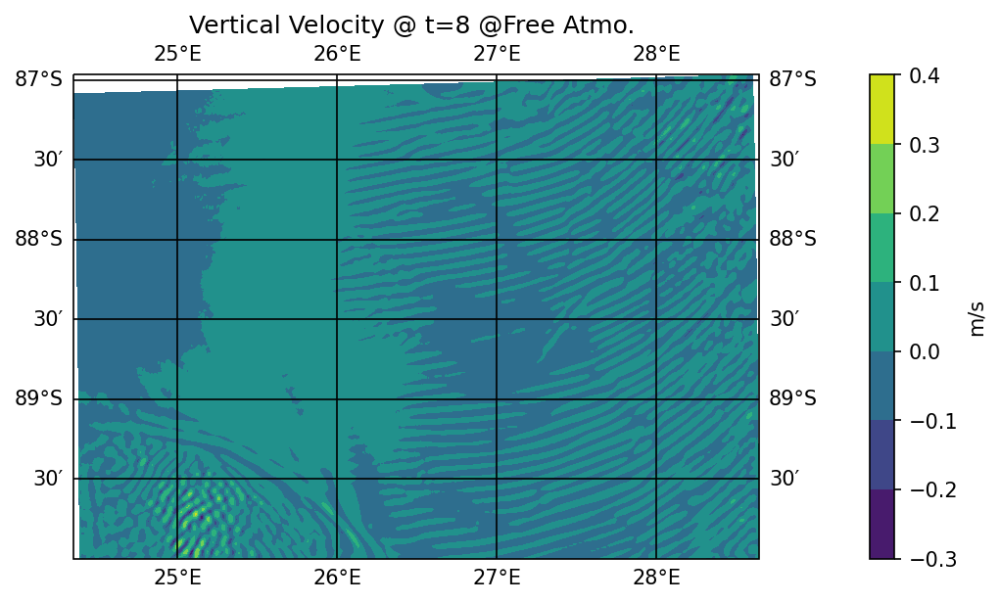

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


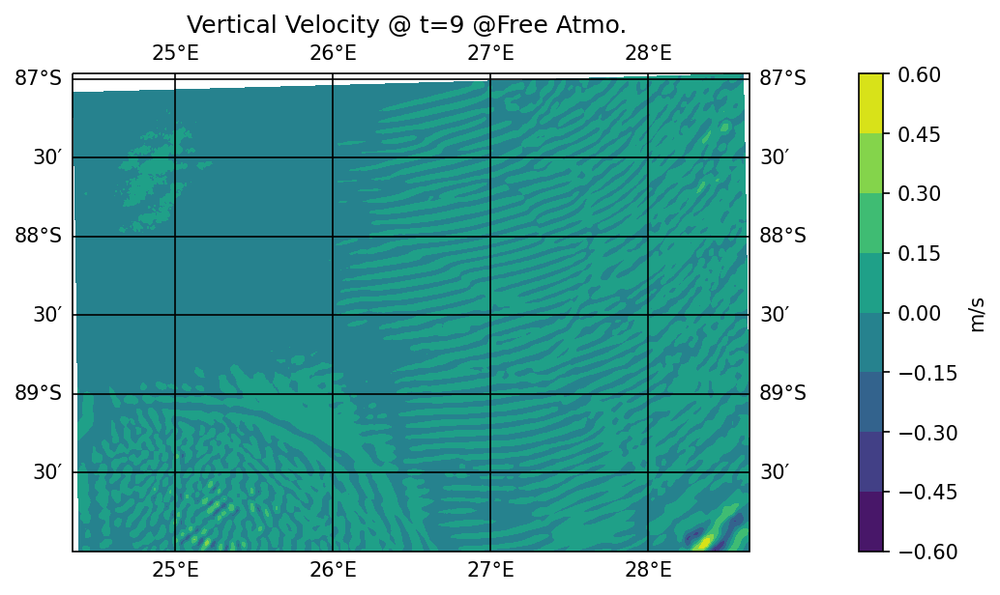

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


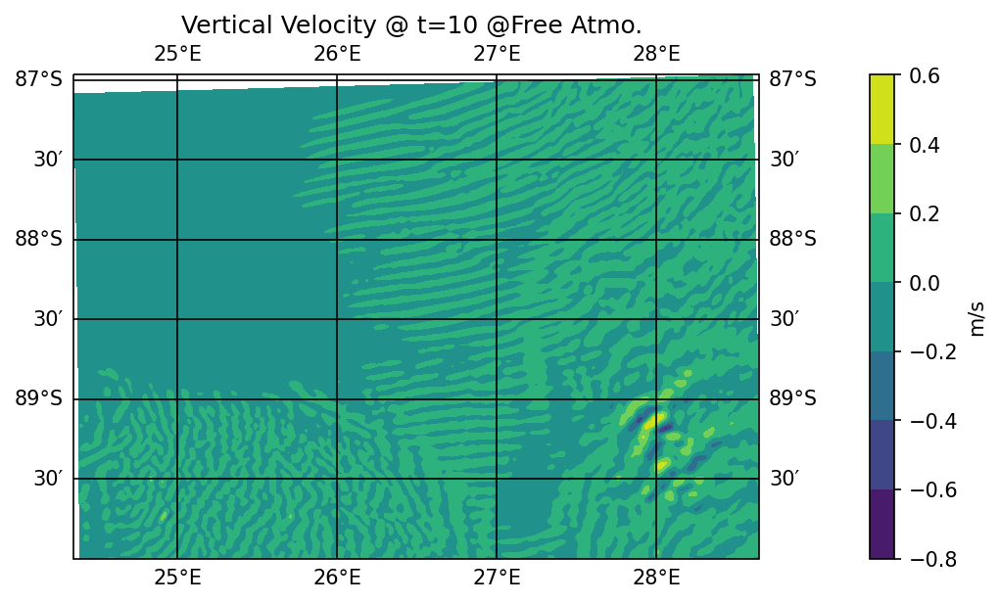

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


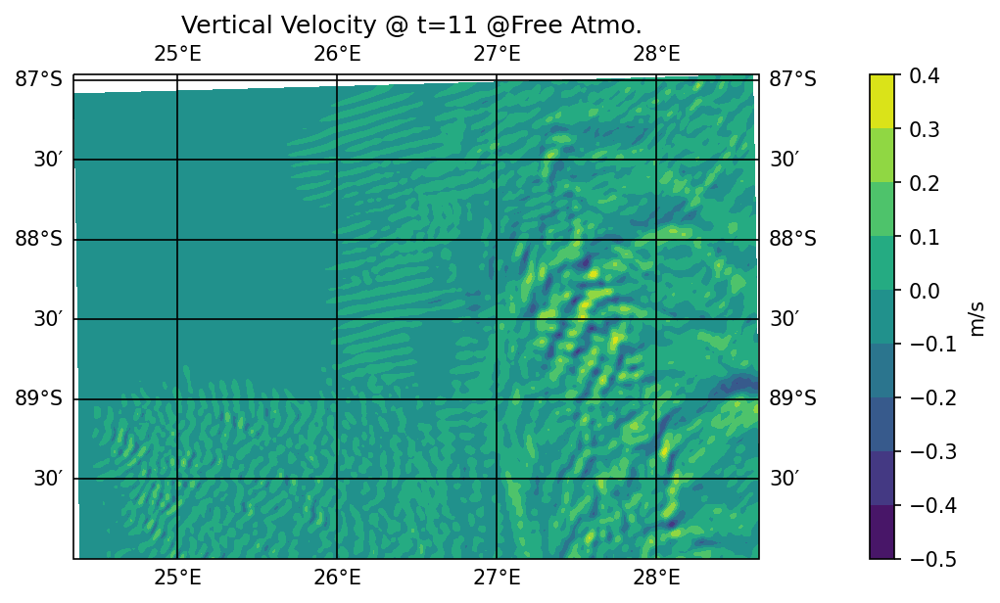

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


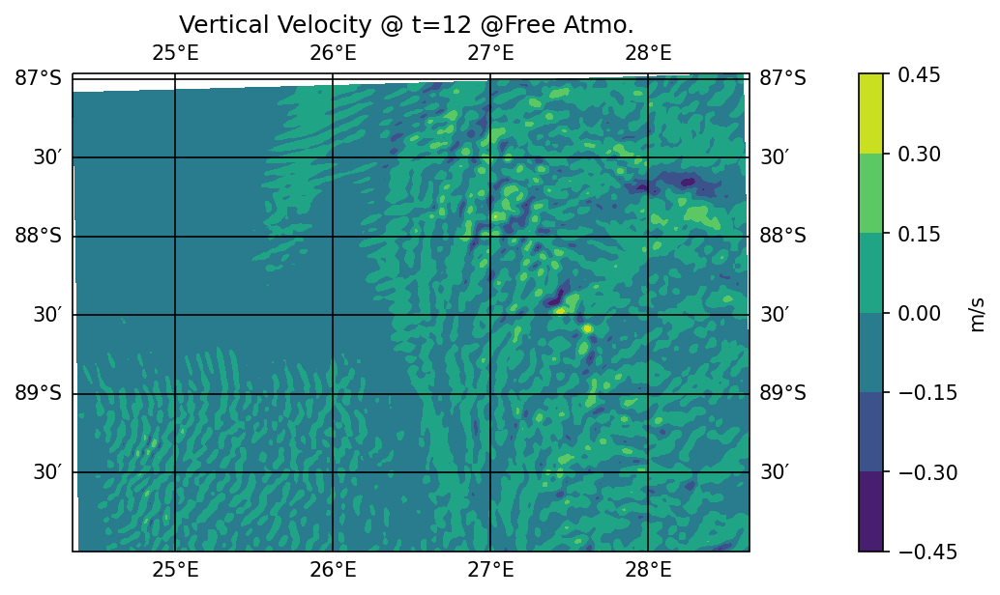

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


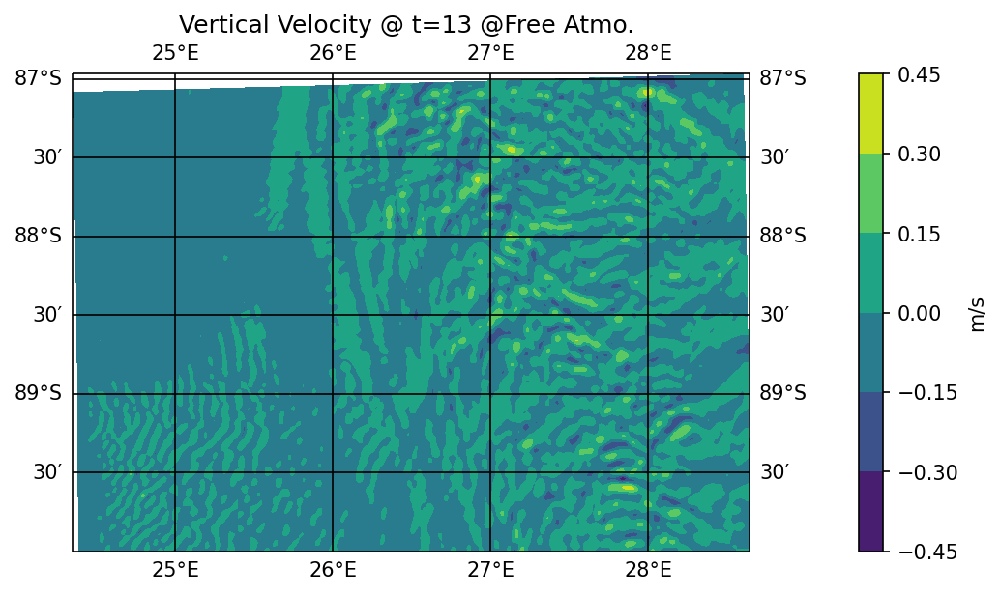

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


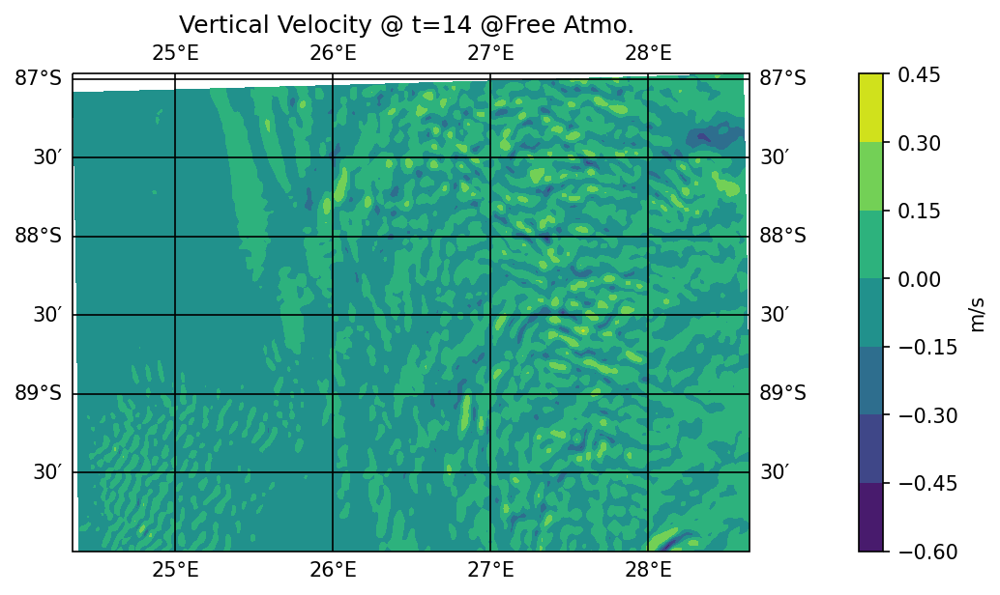

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


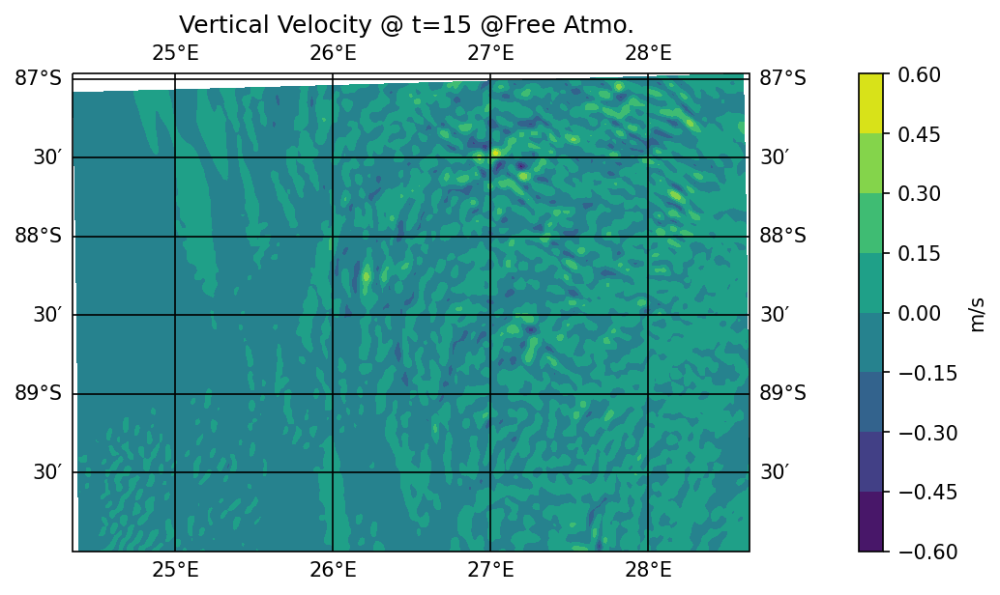

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


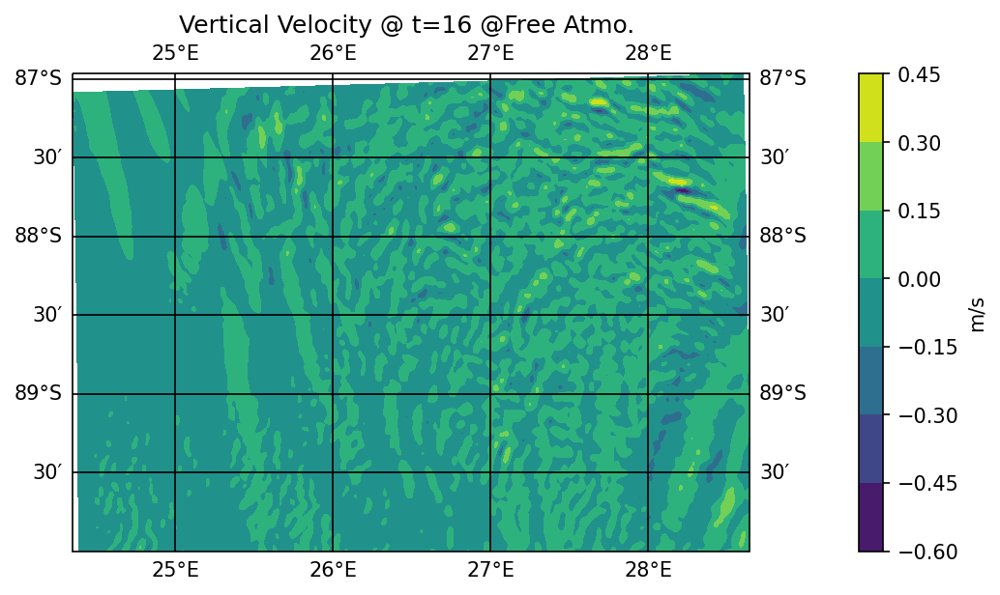

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


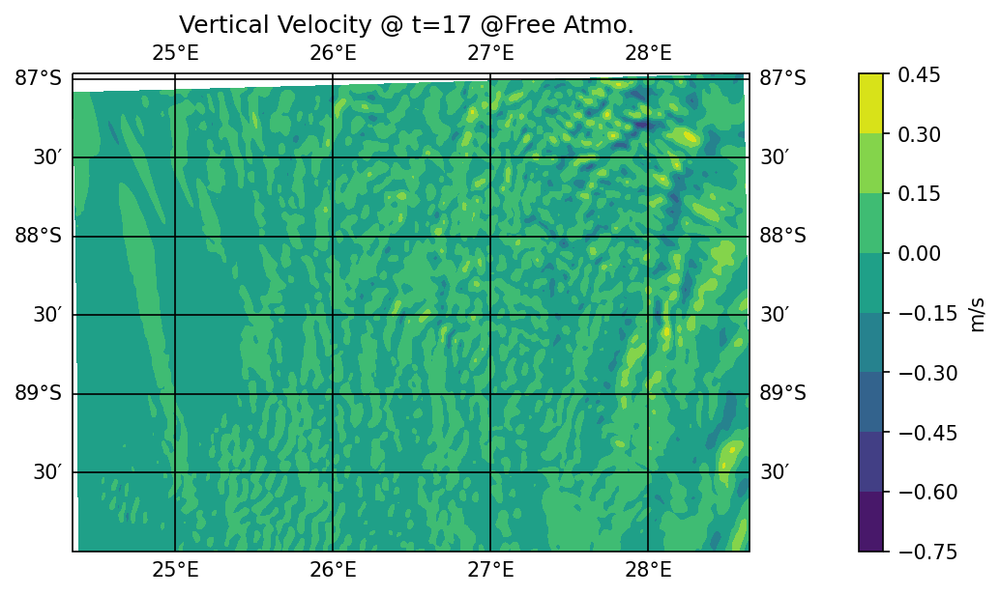

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


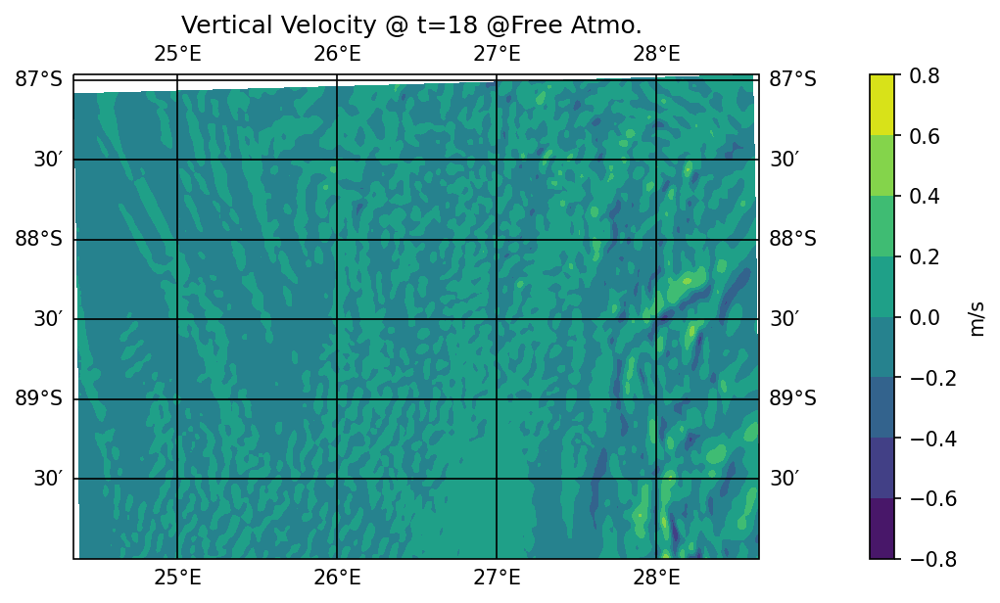

In [8]:
#w plots (eta = 5, 26)

#eta = 5##########################################################################
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], w_6[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vertical Velocity @ t=0 @PBL')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'w_eta5_time0.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], w_7[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vertical Velocity @ t=1 @PBL')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'w_eta5_time1.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], w_8[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vertical Velocity @ t=2 @PBL')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'w_eta5_time2.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], w_9[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vertical Velocity @ t=3 @PBL')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'w_eta5_time3.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], w_10[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vertical Velocity @ t=4 @PBL')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'w_eta5_time4.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], w_11[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vertical Velocity @ t=5 @PBL')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'w_eta5_time5.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], w_12[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vertical Velocity @ t=6 @PBL')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'w_eta5_time6.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], w_13[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vertical Velocity @ t=7 @PBL')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'w_eta5_time7.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], w_14[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vertical Velocity @ t=8 @PBL')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'w_eta5_time8.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], w_15[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vertical Velocity @ t=9 @PBL')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'w_eta5_time9.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], w_16[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vertical Velocity @ t=10 @PBL')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'w_eta5_time10.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], w_17[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vertical Velocity @ t=11 @PBL')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'w_eta5_time11.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], w_18[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vertical Velocity @ t=12 @PBL')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'w_eta5_time12.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], w_19[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vertical Velocity @ t=13 @PBL')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'w_eta5_time13.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], w_20[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vertical Velocity @ t=14 @PBL')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'w_eta5_time14.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], w_21[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vertical Velocity @ t=15 @PBL')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'w_eta5_time15.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], w_22[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vertical Velocity @ t=16 @PBL')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'w_eta5_time16.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], w_23[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vertical Velocity @ t=17 @PBL')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'w_eta5_time17.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], w_24[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vertical Velocity @ t=18 @PBL')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'w_eta5_time18.png', bbox_inches = 'tight',dpi = 150)
plt.show()

#eta = 26######################################################################
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], w_6[0,26,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vertical Velocity @ t=0 @Free Atmo. ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'w_eta26_time0.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], w_7[0,26,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vertical Velocity @ t=1 @Free Atmo. ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'w_eta26_time1.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], w_8[0,26,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vertical Velocity @ t=2 @Free Atmo. ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'w_eta26_time2.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], w_9[0,26,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vertical Velocity @ t=3 @Free Atmo. ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'w_eta26_time3.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], w_10[0,26,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vertical Velocity @ t=4 @Free Atmo. ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'w_eta26_time4.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], w_11[0,26,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vertical Velocity @ t=5 @Free Atmo. ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'w_eta26_time5.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], w_12[0,26,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vertical Velocity @ t=6 @Free Atmo. ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'w_eta26_time6.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], w_13[0,26,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vertical Velocity @ t=7 @Free Atmo. ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'w_eta26_time7.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], w_14[0,26,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vertical Velocity @ t=8 @Free Atmo. ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'w_eta26_time8.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], w_15[0,26,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vertical Velocity @ t=9 @Free Atmo. ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'w_eta26_time9.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], w_16[0,26,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vertical Velocity @ t=10 @Free Atmo. ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'w_eta26_time10.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], w_17[0,26,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vertical Velocity @ t=11 @Free Atmo. ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'w_eta26_time11.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], w_18[0,26,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vertical Velocity @ t=12 @Free Atmo. ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'w_eta26_time12.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], w_19[0,26,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vertical Velocity @ t=13 @Free Atmo. ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'w_eta26_time13.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], w_20[0,26,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vertical Velocity @ t=14 @Free Atmo. ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'w_eta26_time14.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], w_21[0,26,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vertical Velocity @ t=15 @Free Atmo. ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'w_eta26_time15.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], w_22[0,26,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vertical Velocity @ t=16 @Free Atmo. ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'w_eta26_time16.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], w_23[0,26,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vertical Velocity @ t=17 @Free Atmo. ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'w_eta26_time17.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], w_24[0,26,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'm/s')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Vertical Velocity @ t=18 @Free Atmo. ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'w_eta26_time18.png', bbox_inches = 'tight',dpi = 150)
plt.show()

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


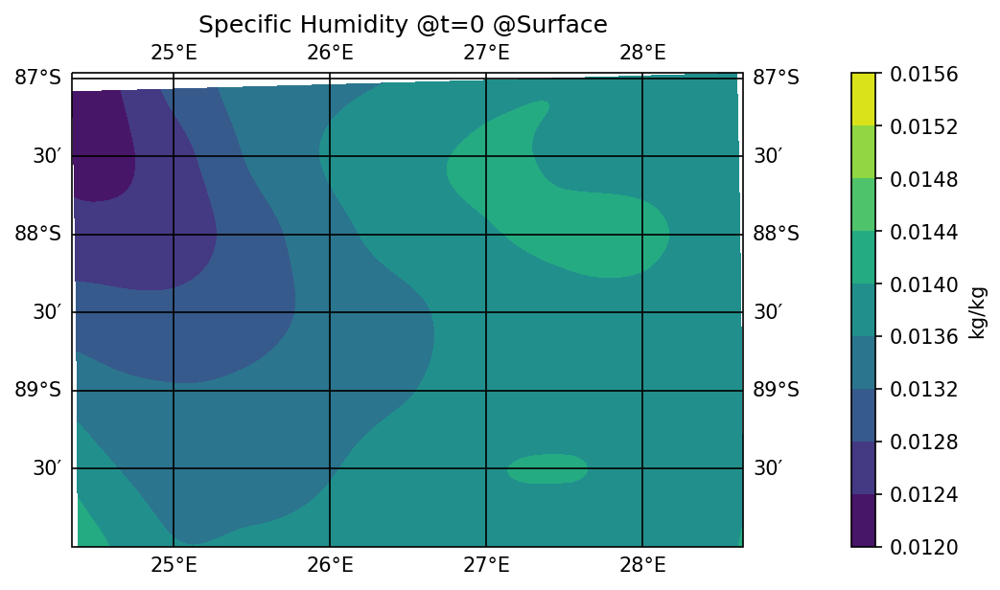

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


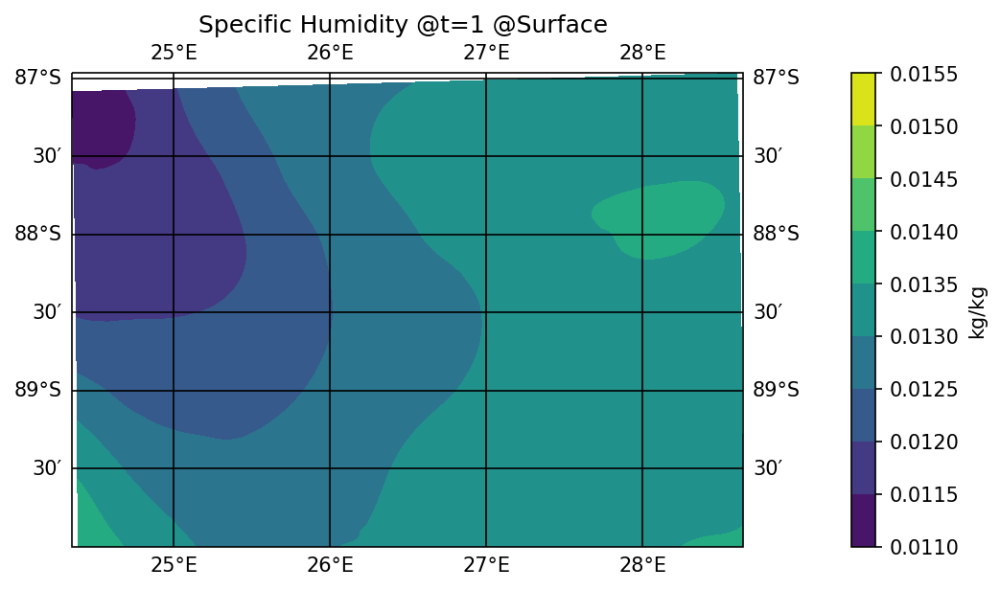

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


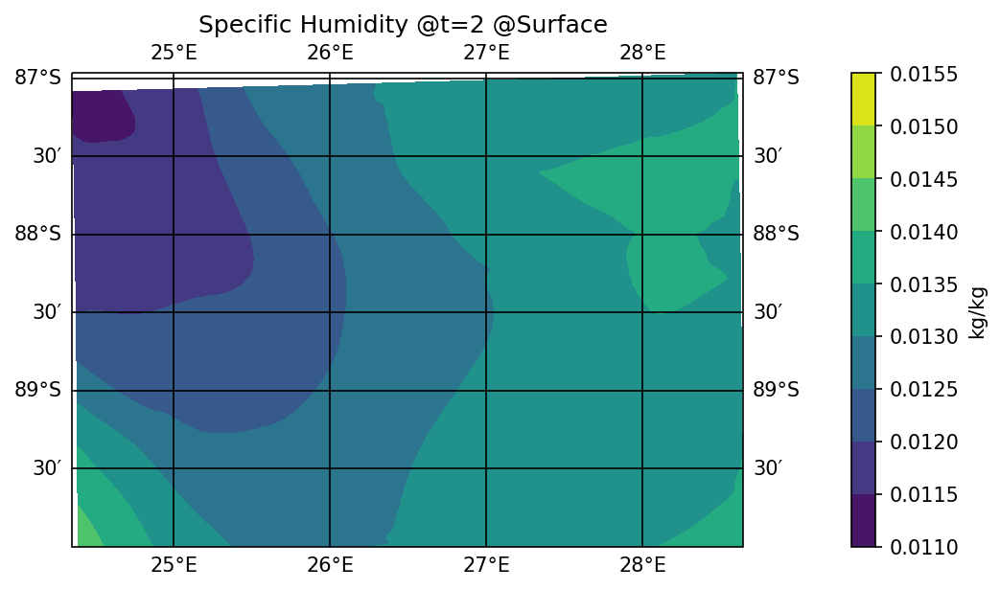

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


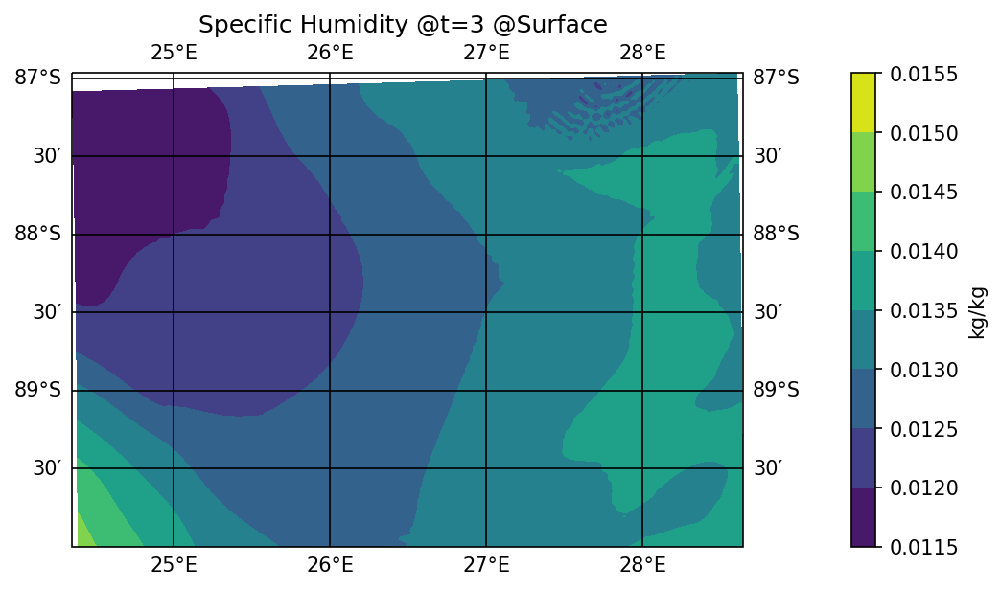

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


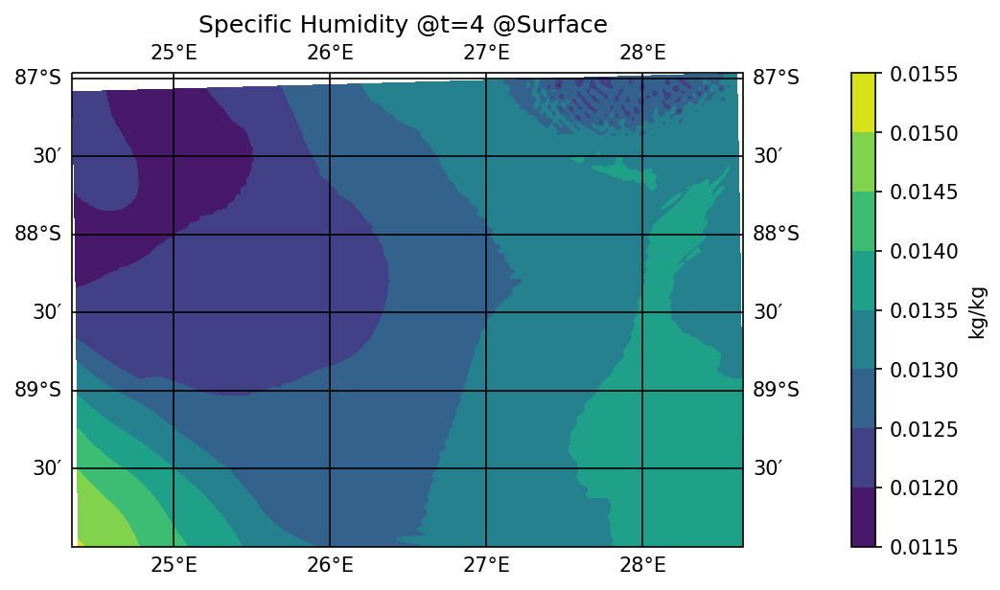

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


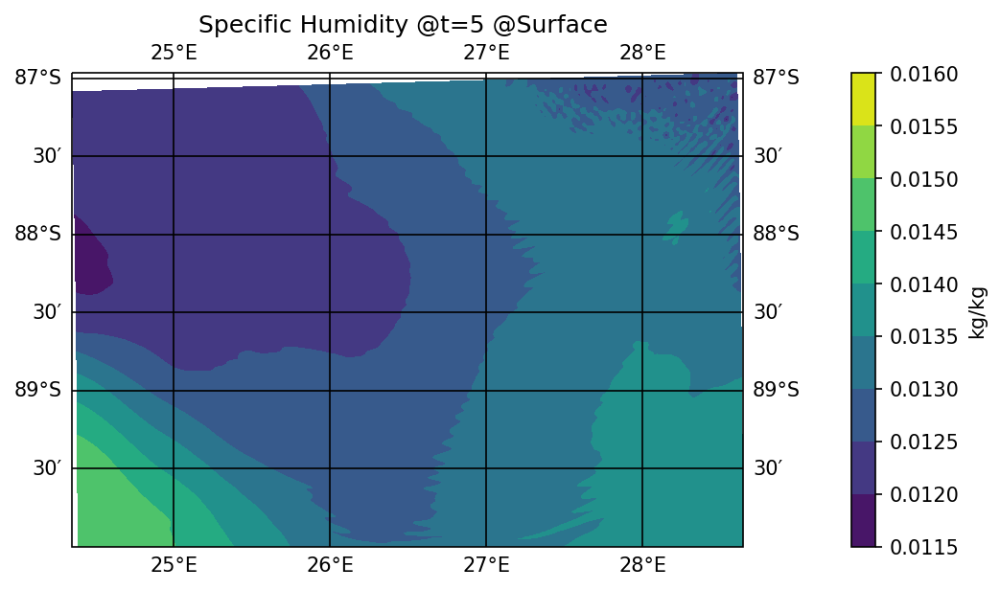

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


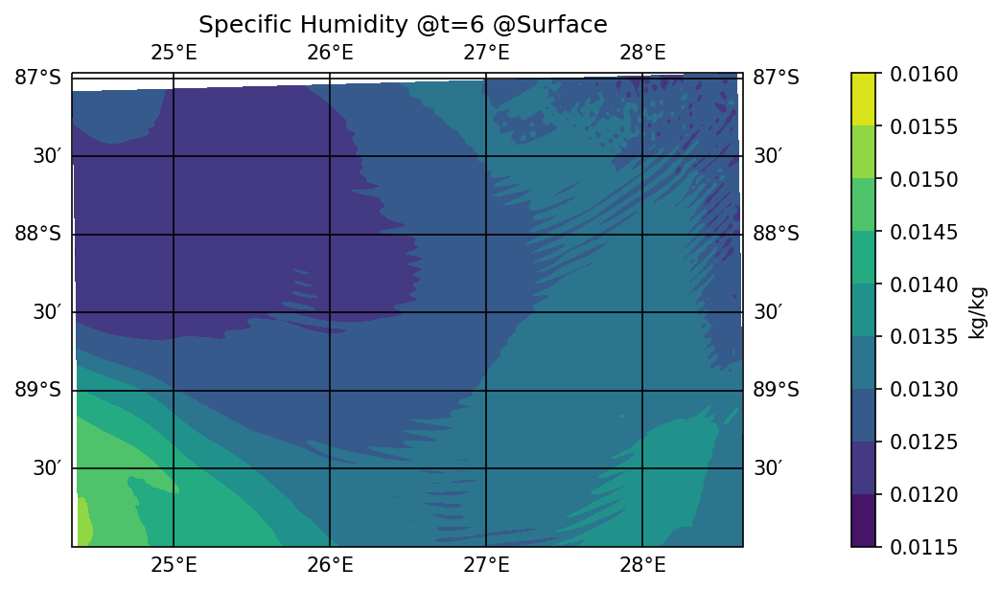

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


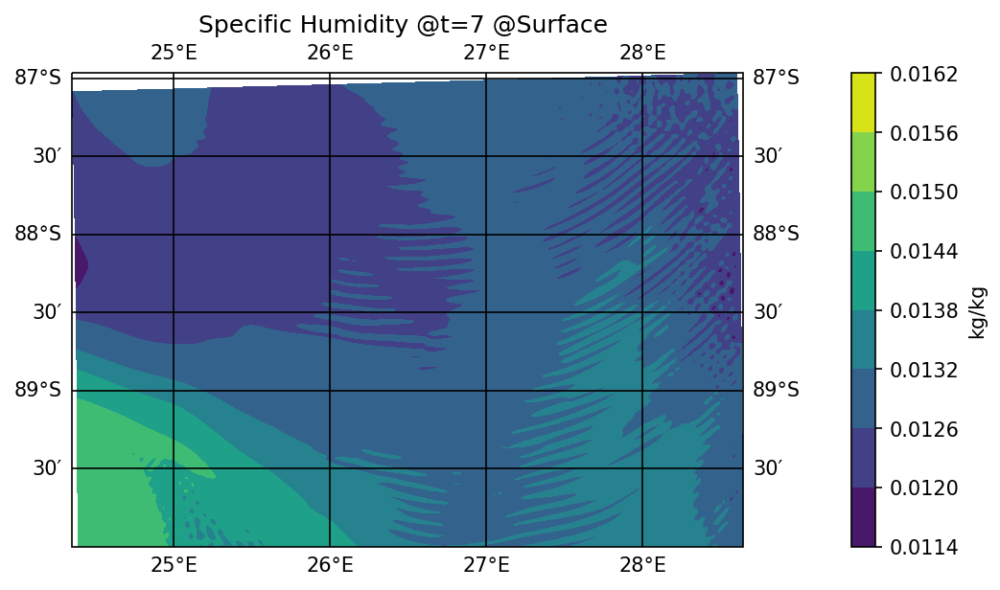

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


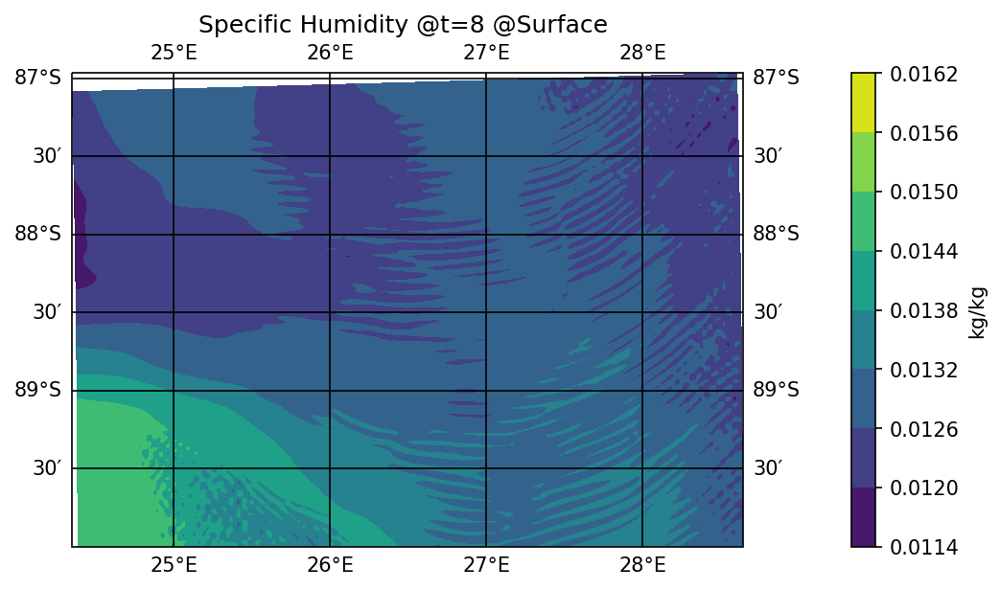

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


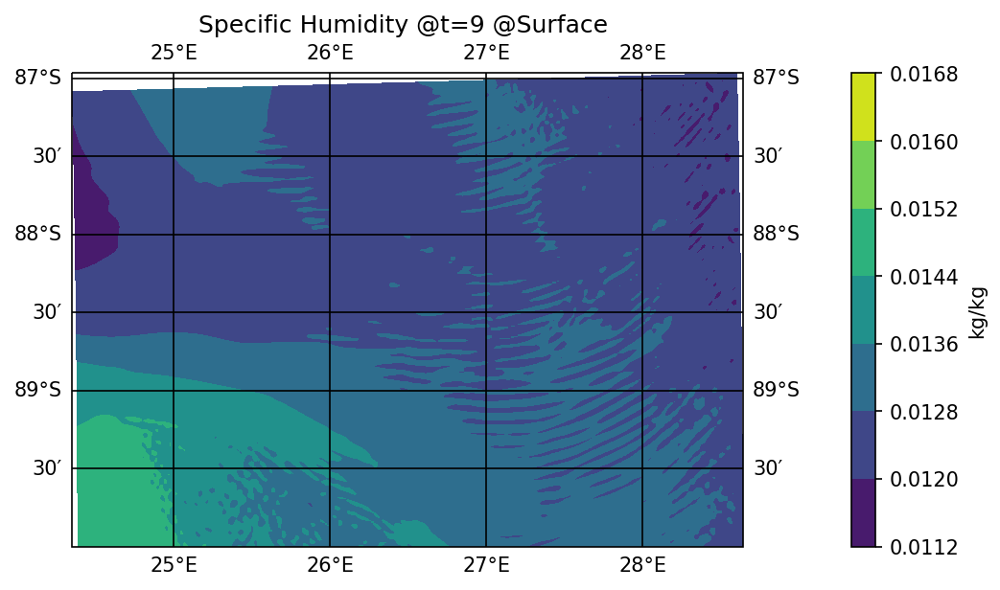

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


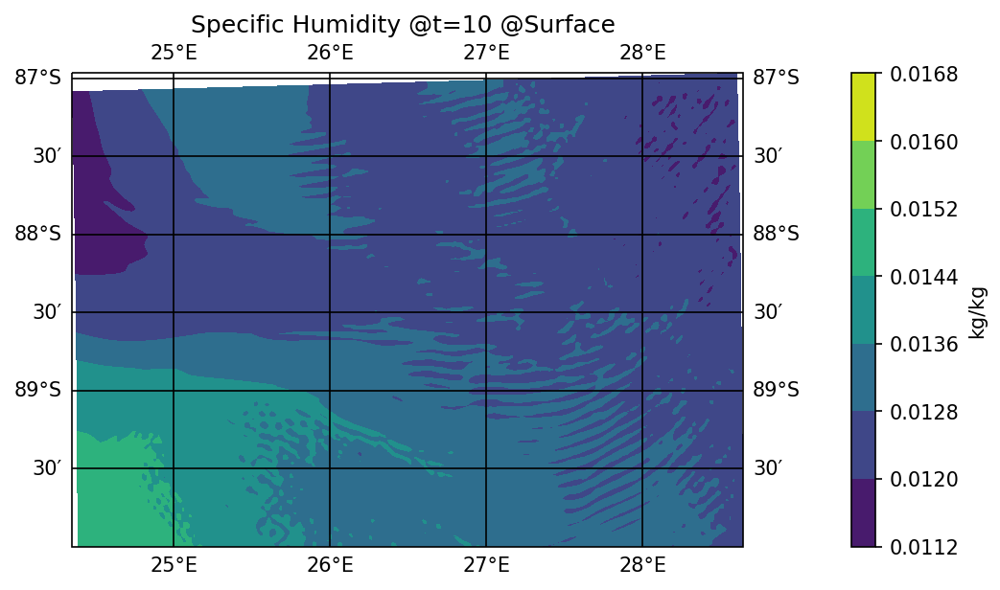

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


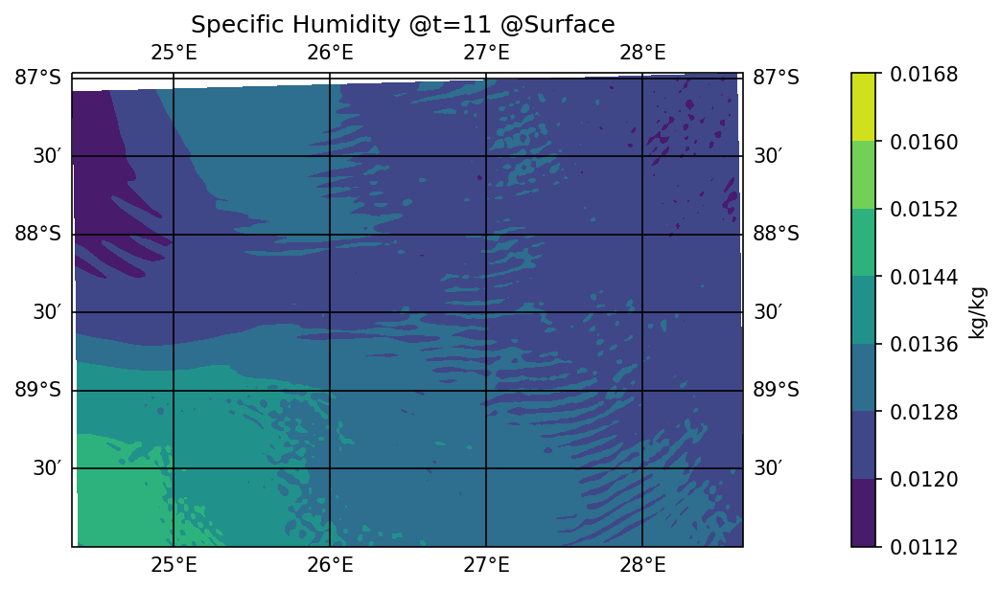

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


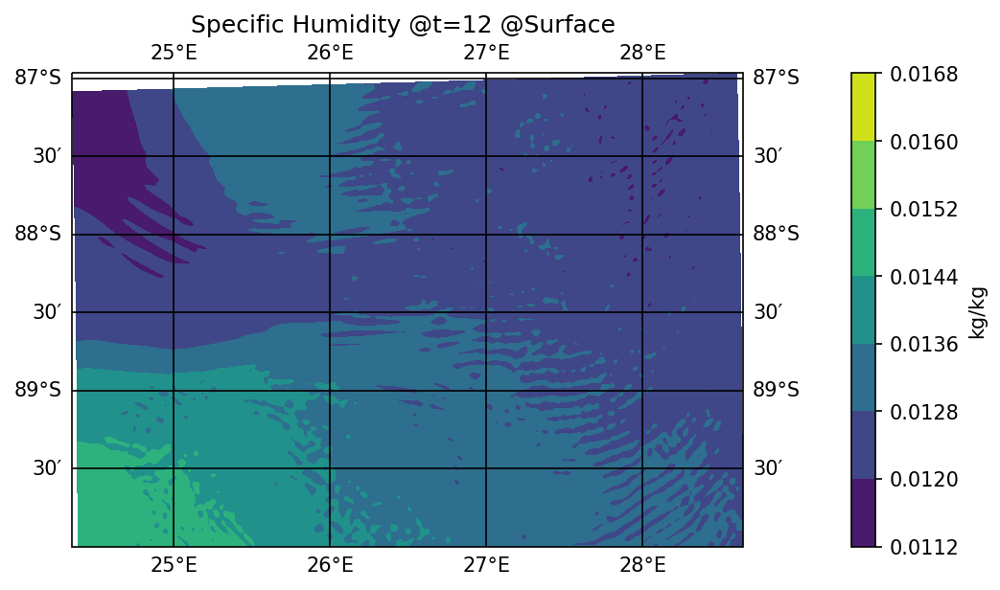

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


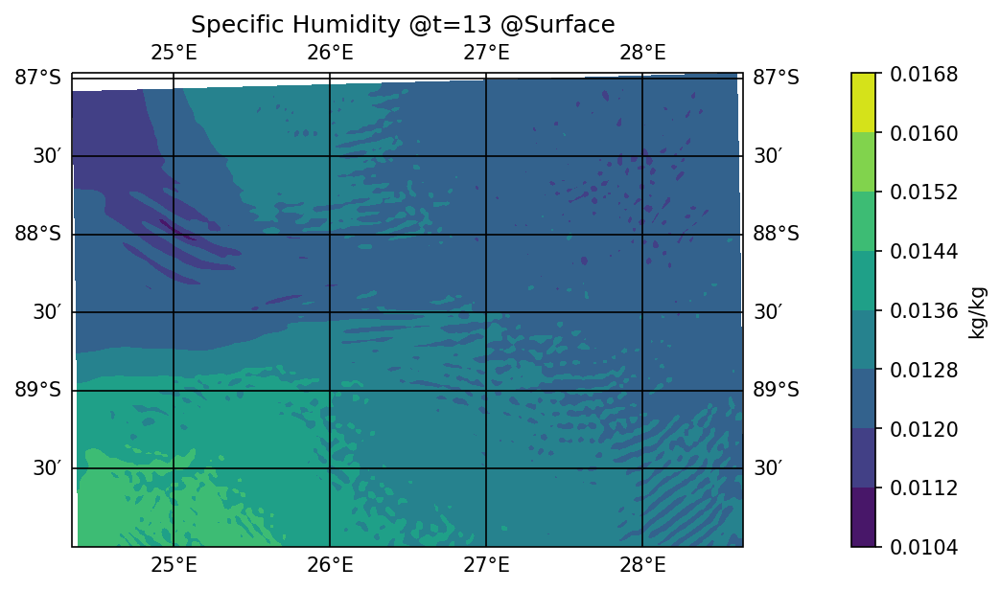

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


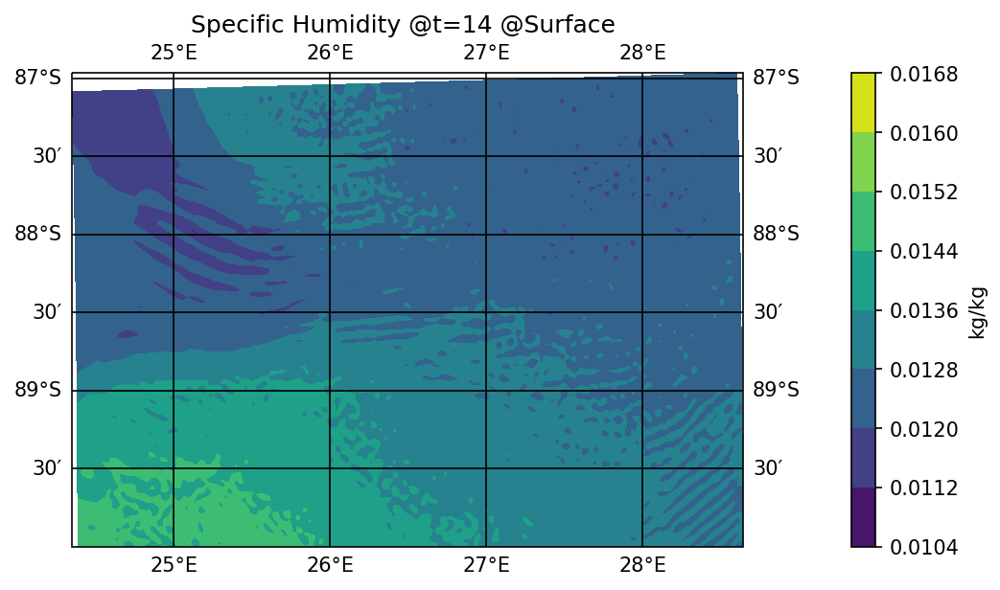

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


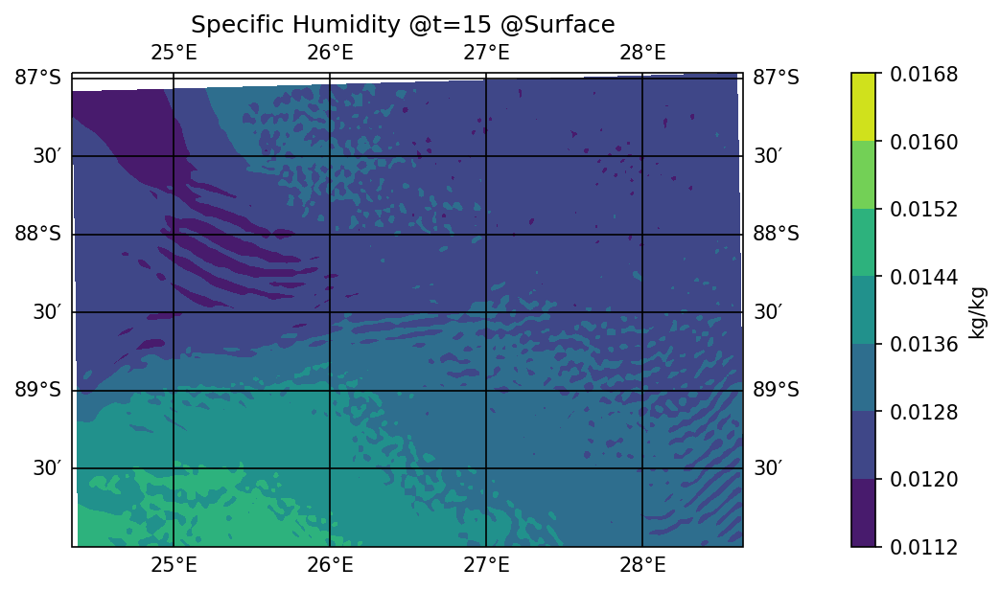

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


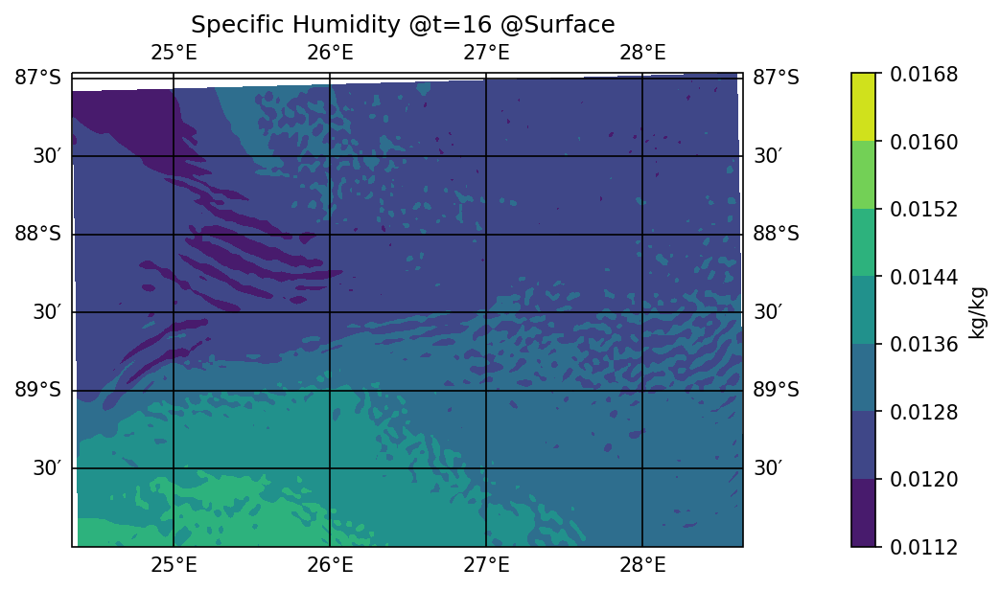

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


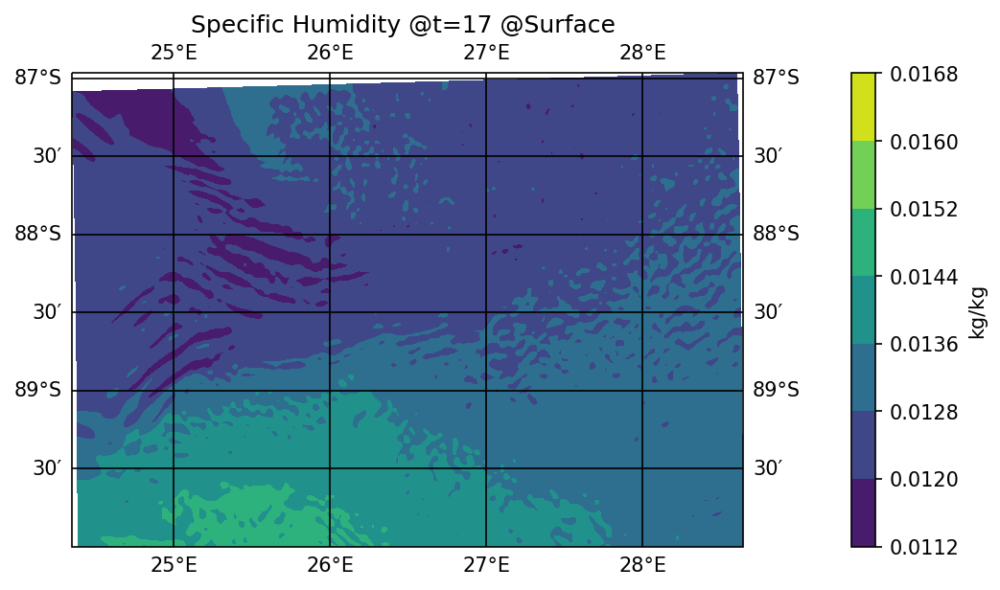

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


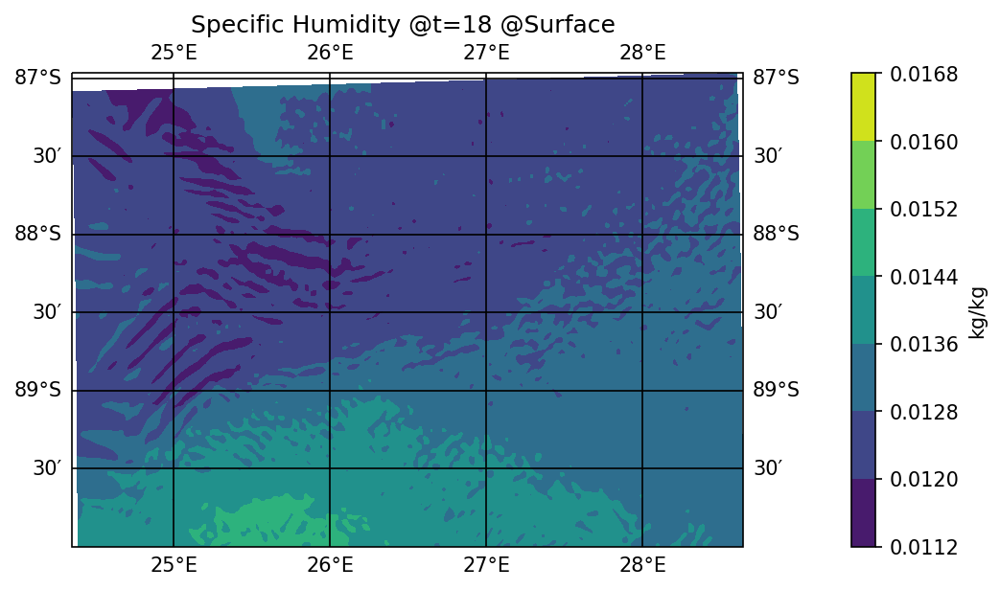

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


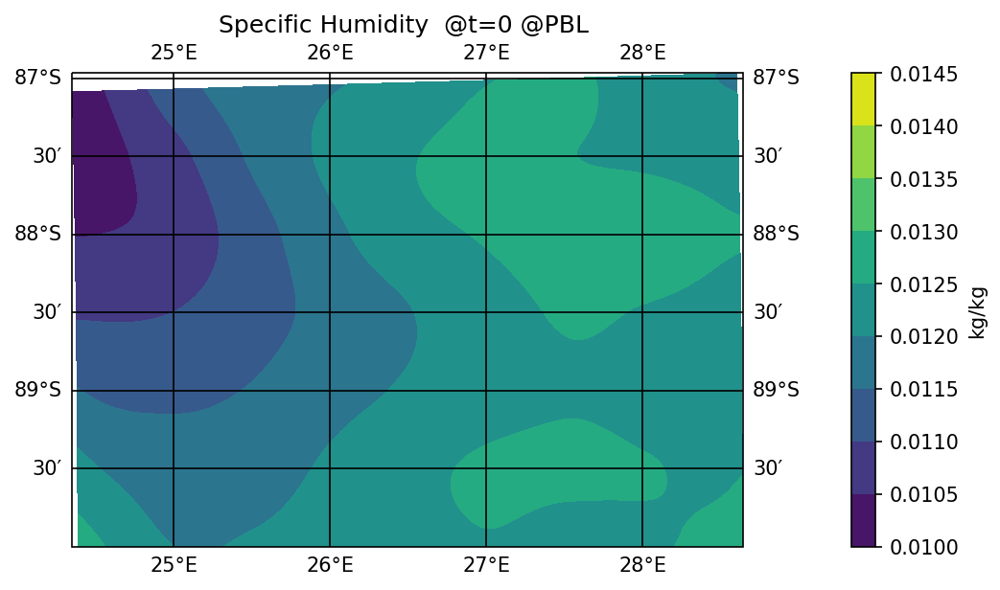

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


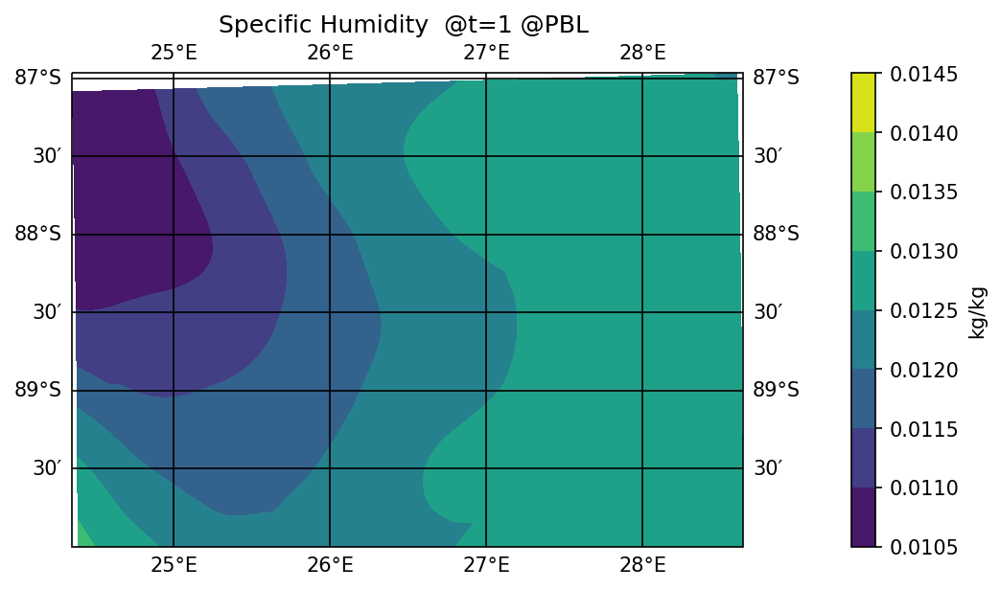

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


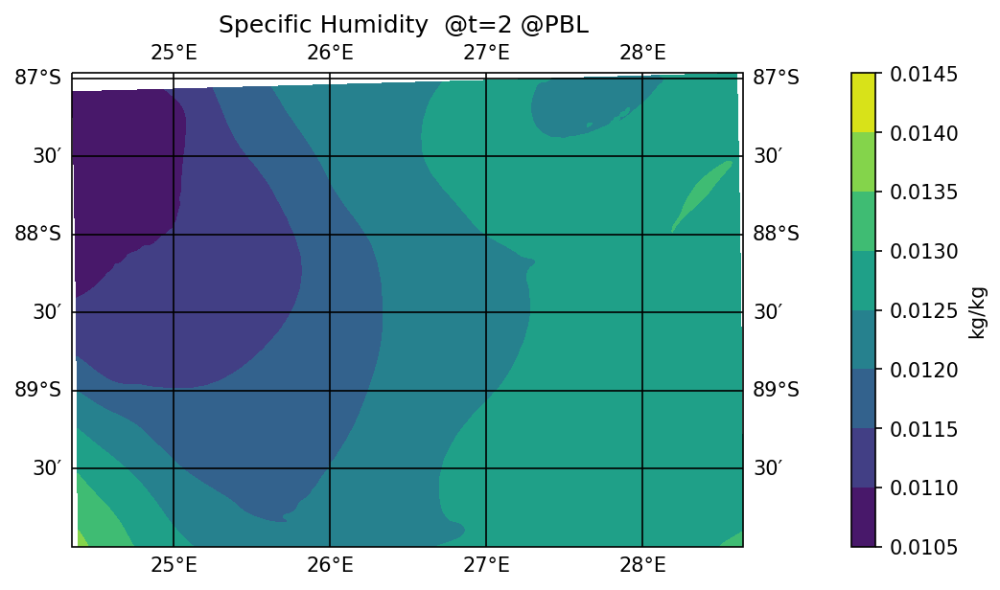

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


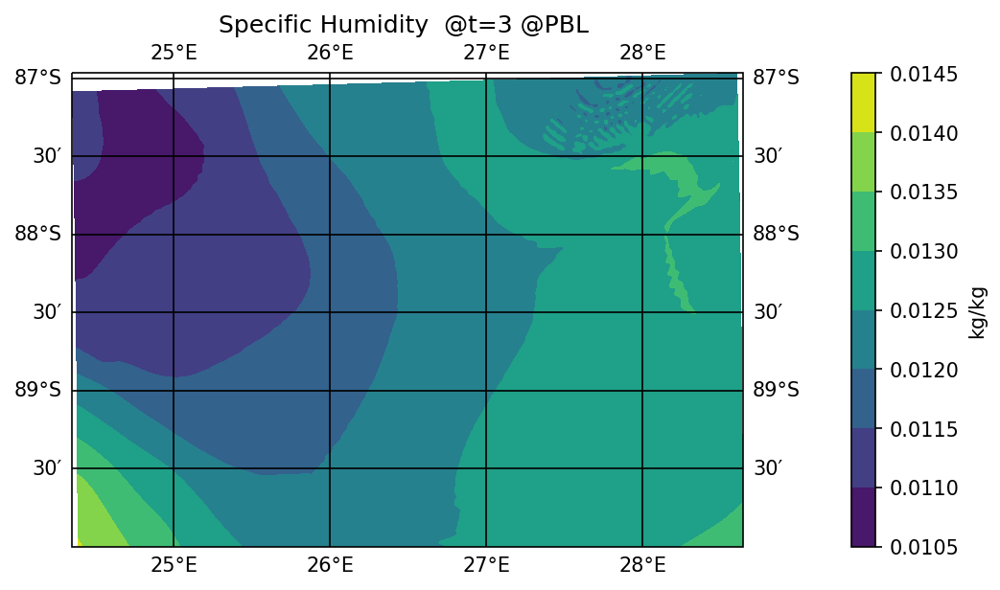

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


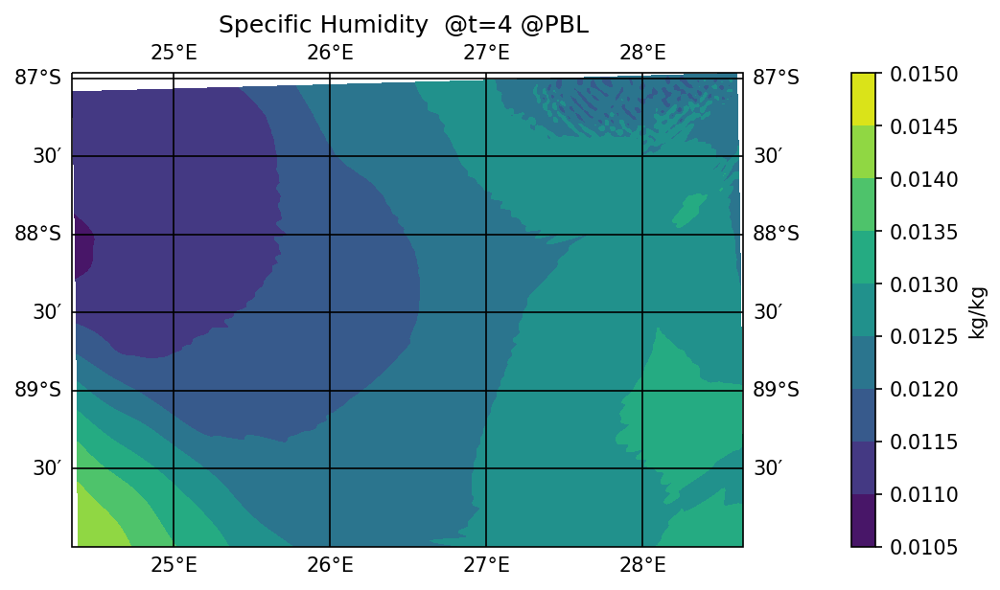

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


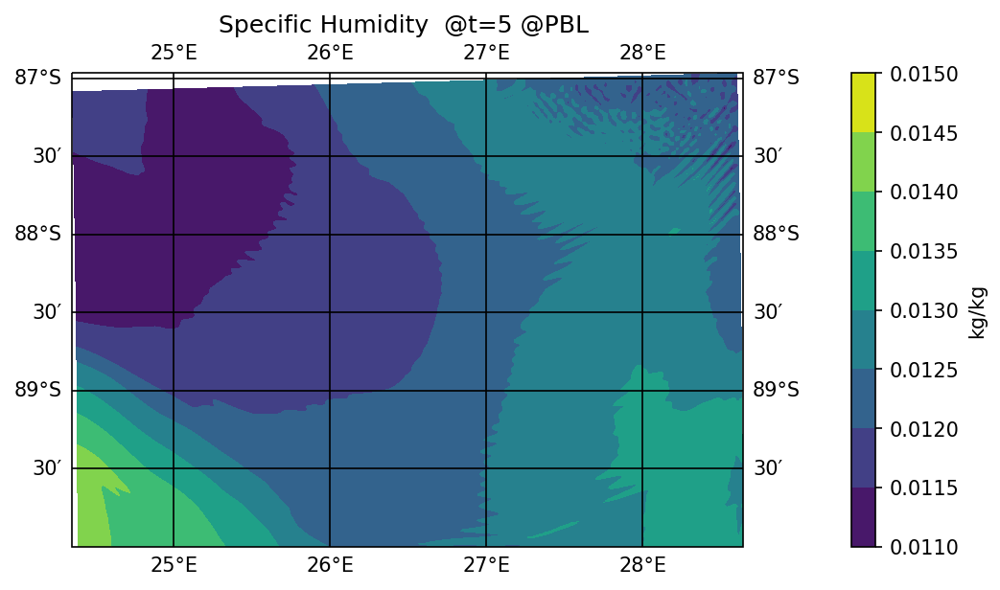

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


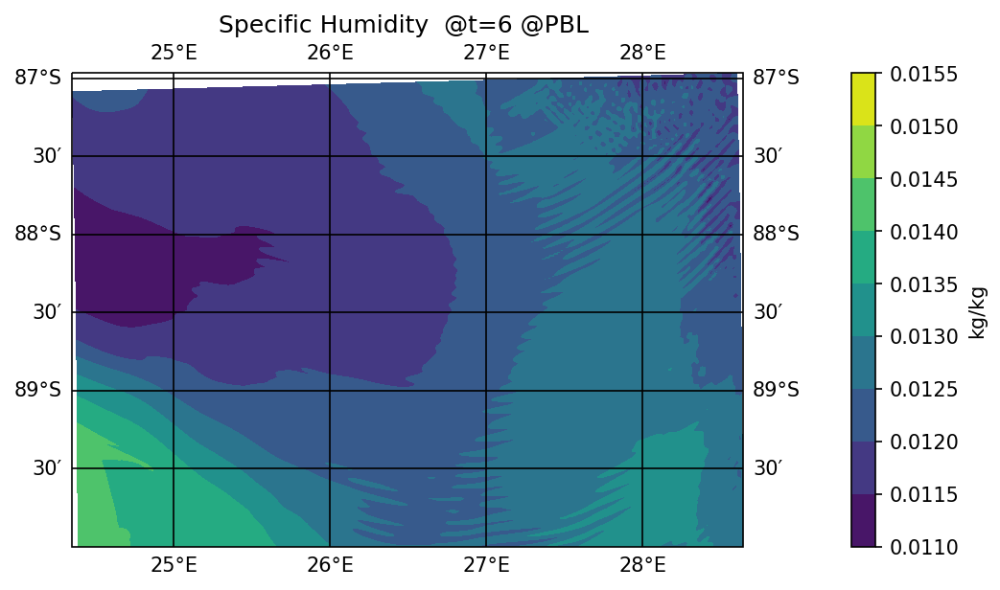

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


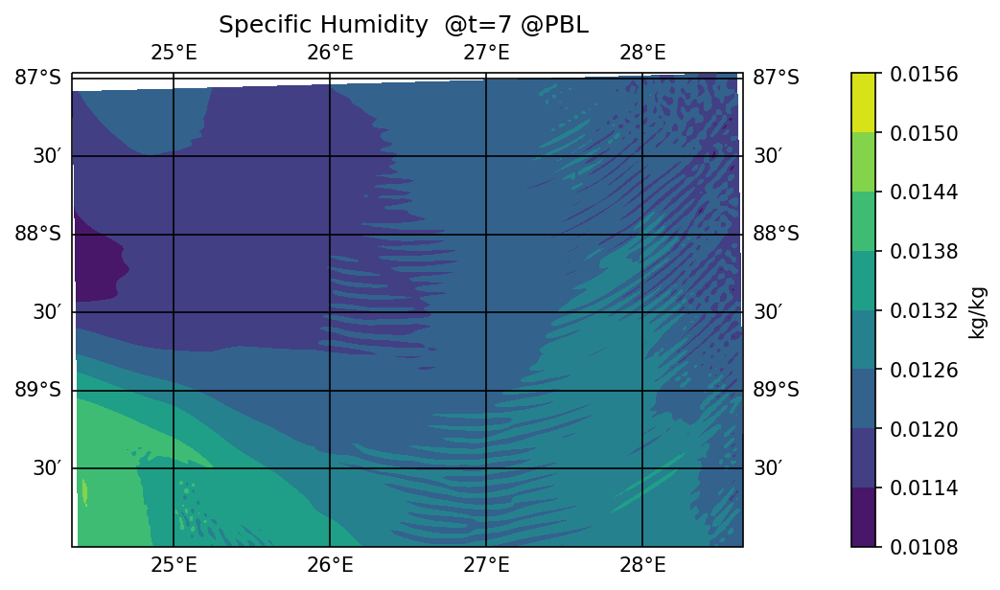

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


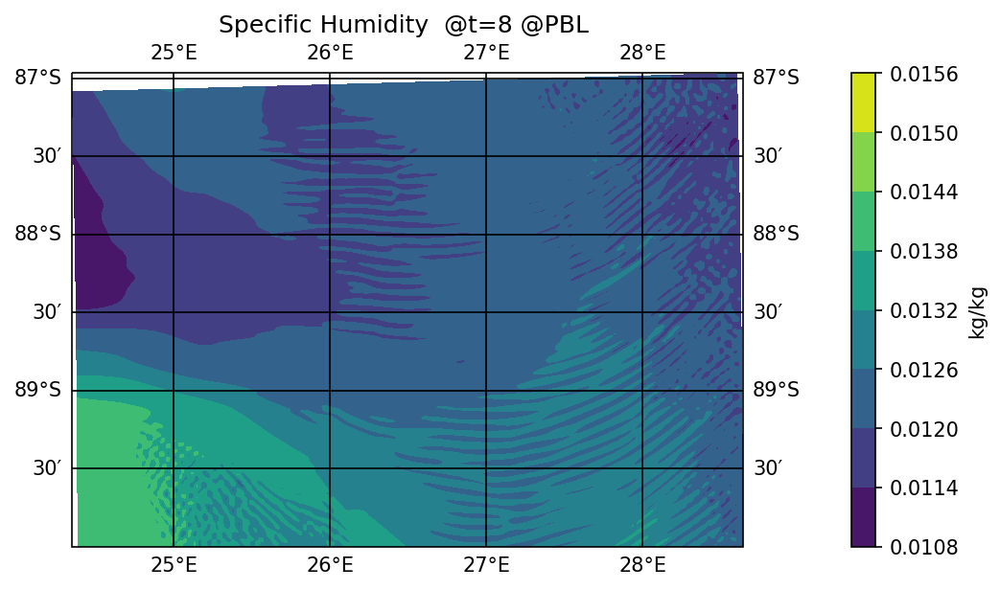

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


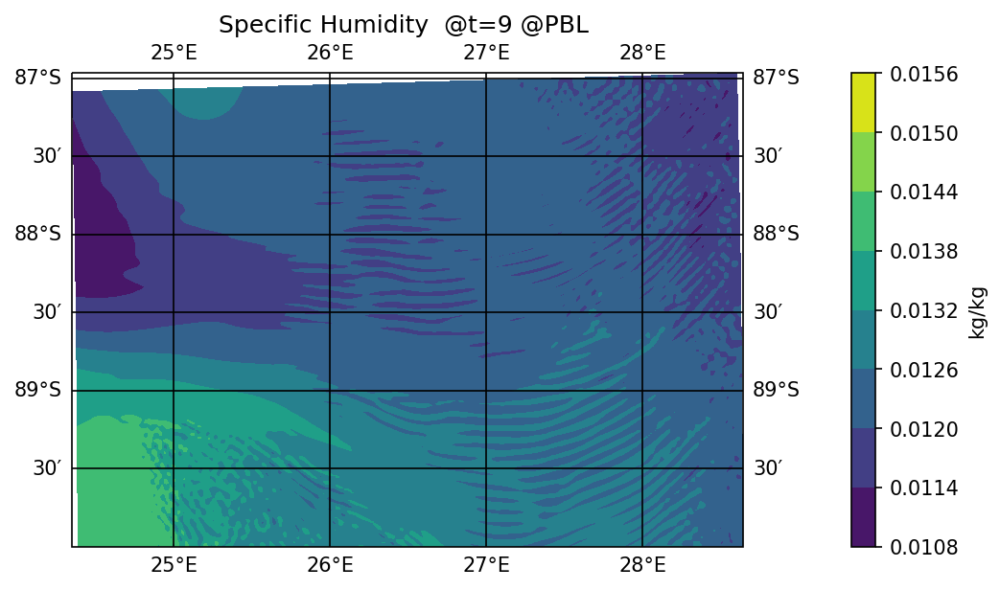

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


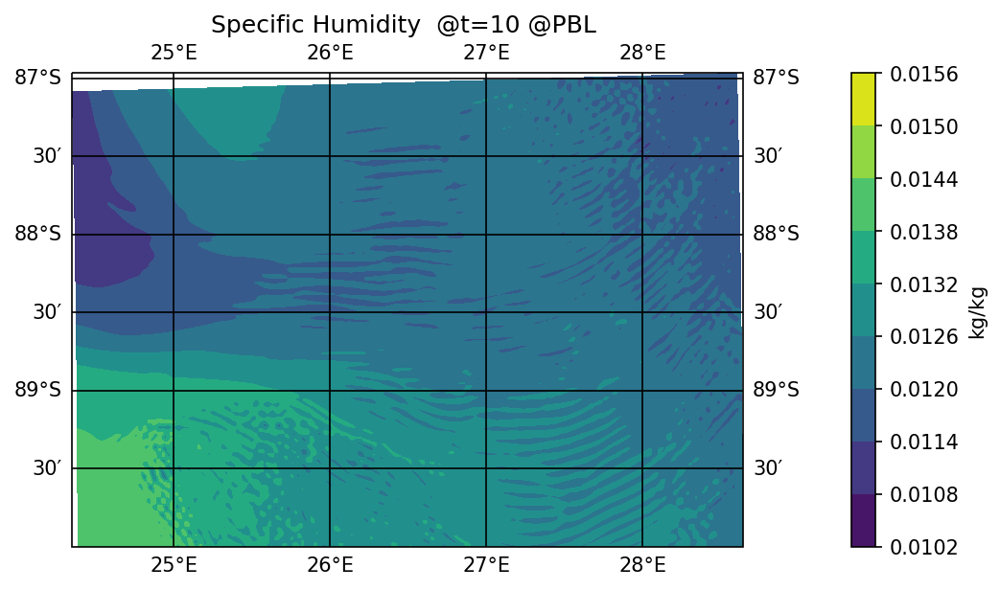

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


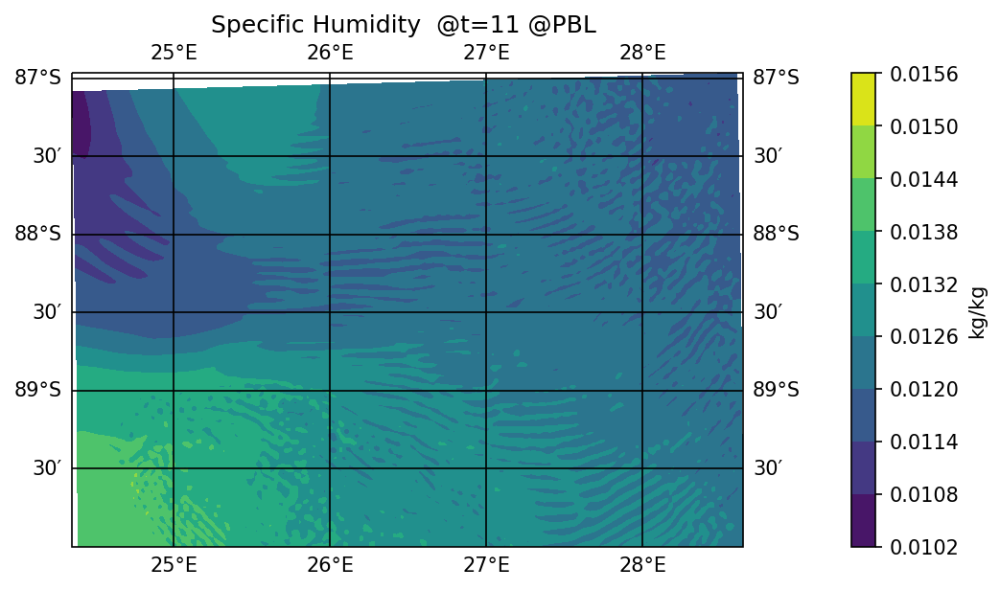

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


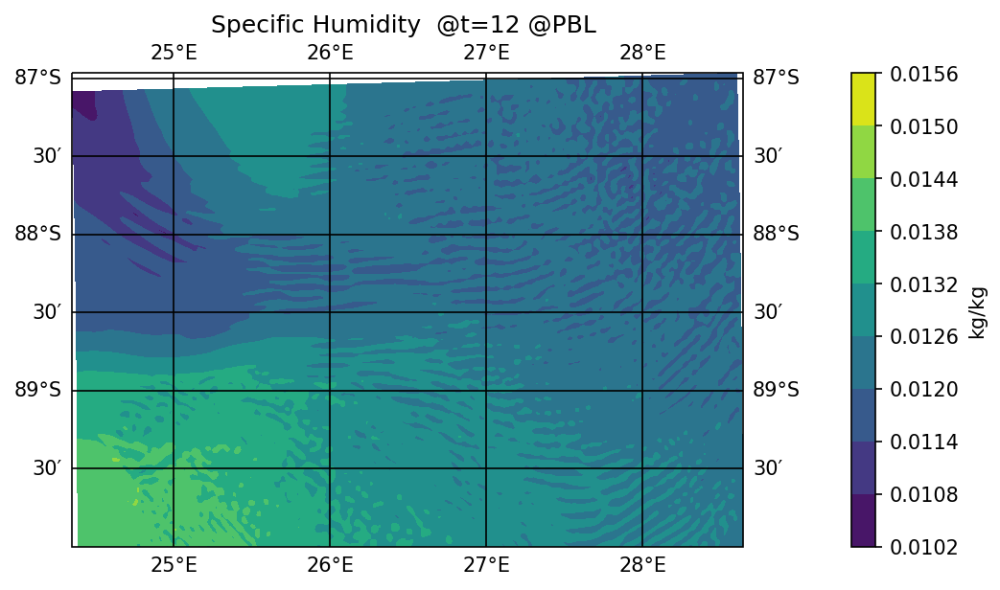

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


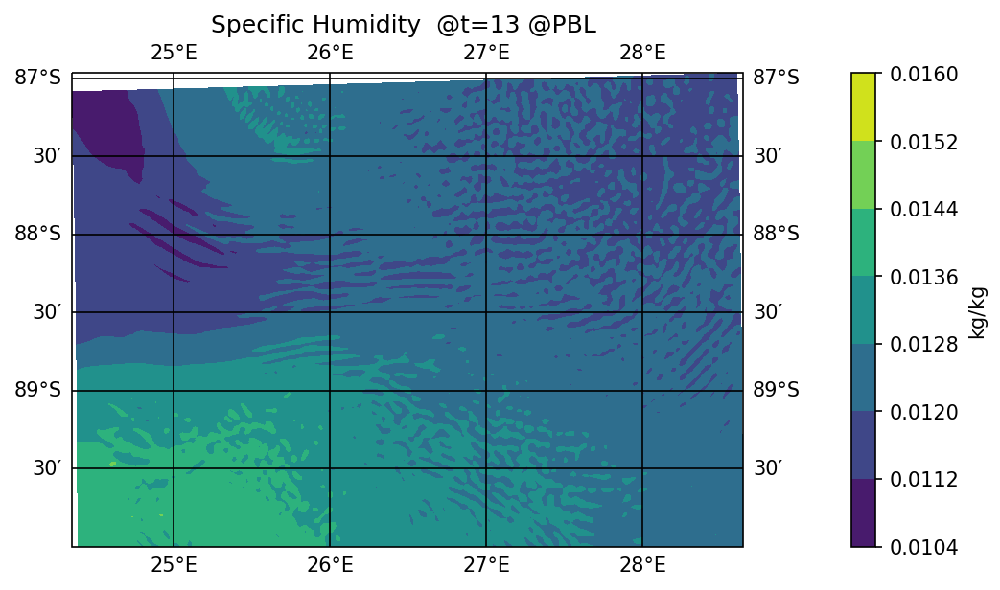

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


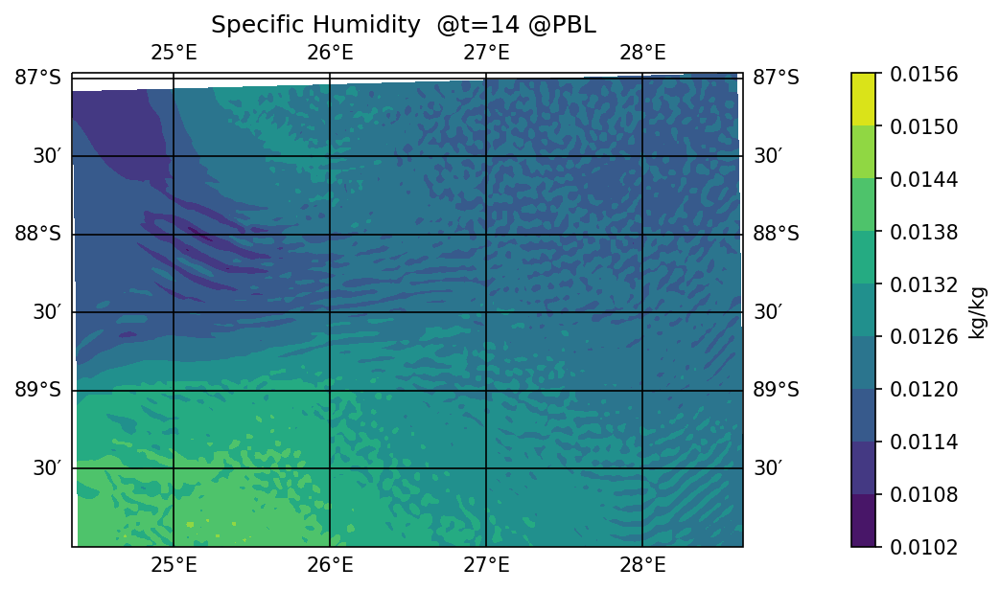

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


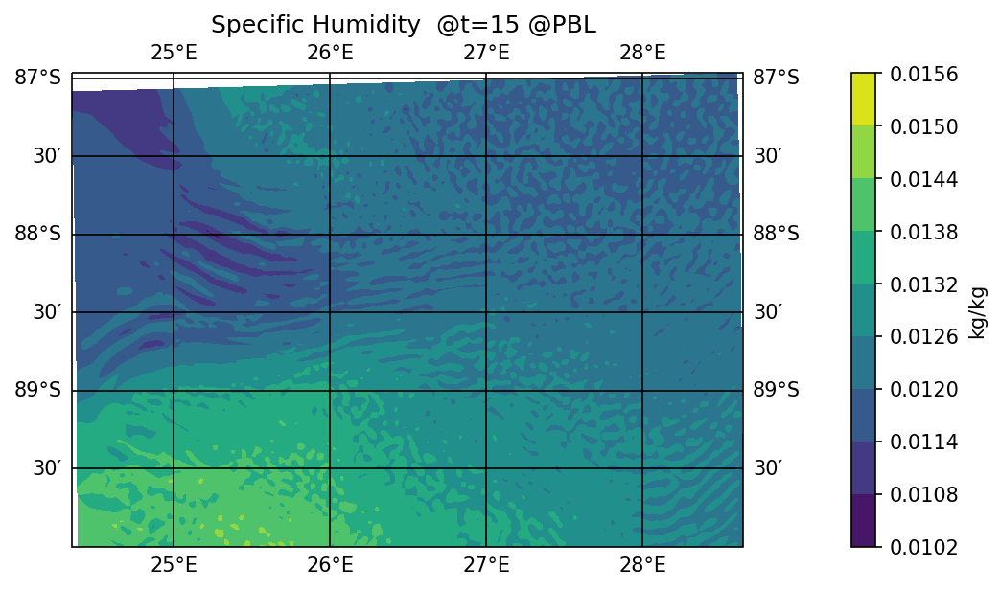

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


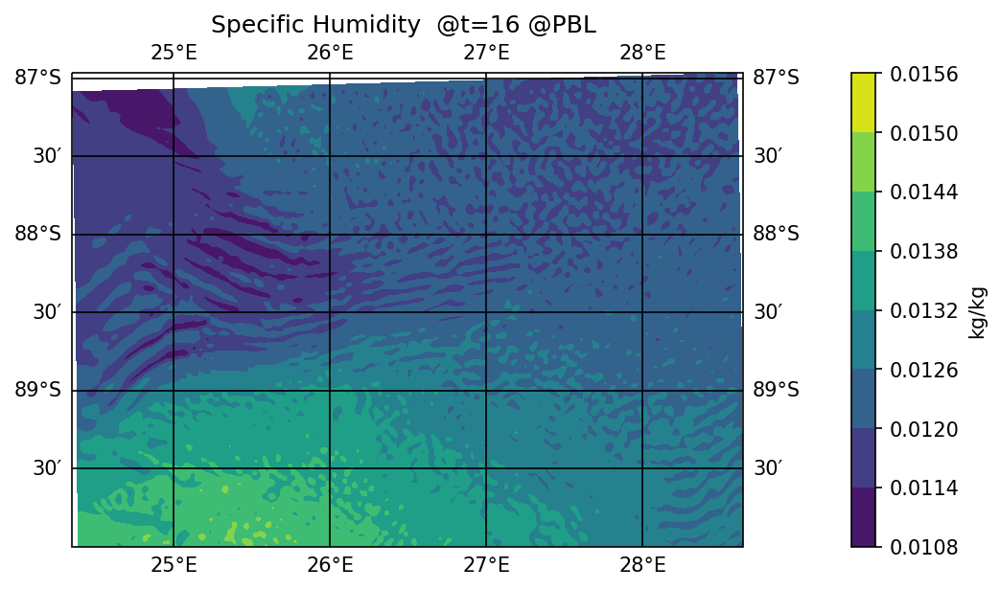

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


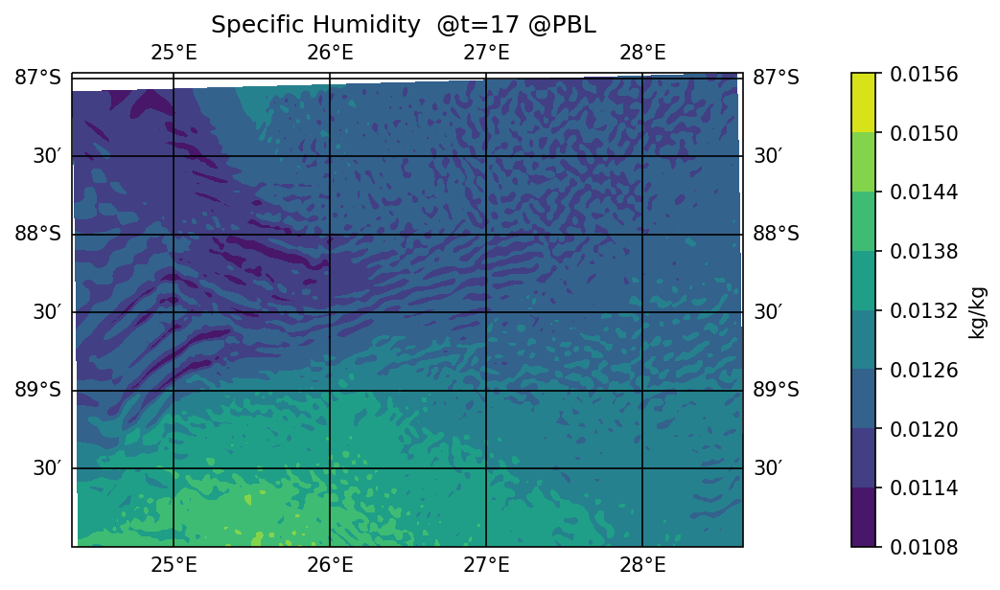

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


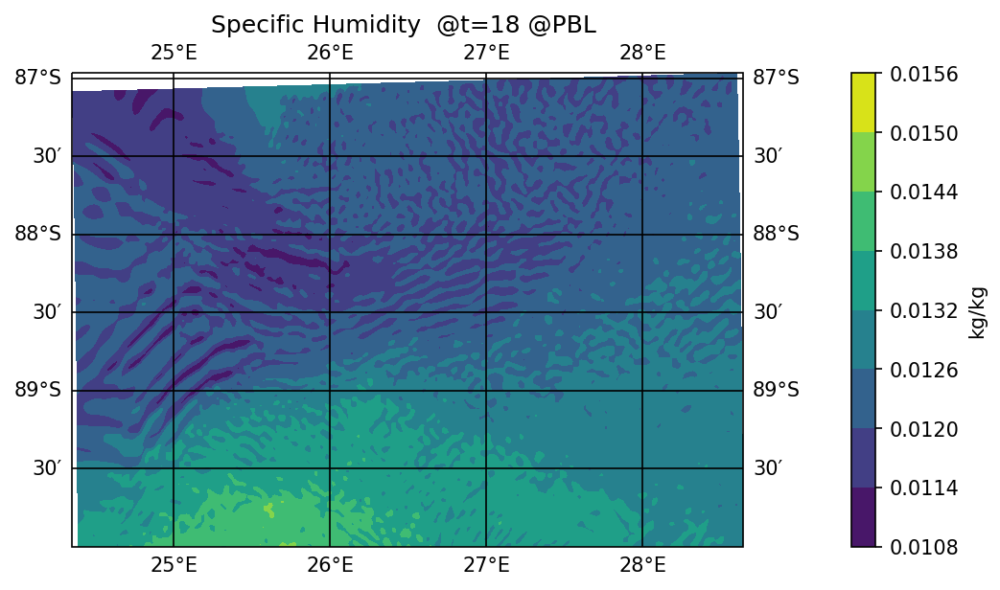

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


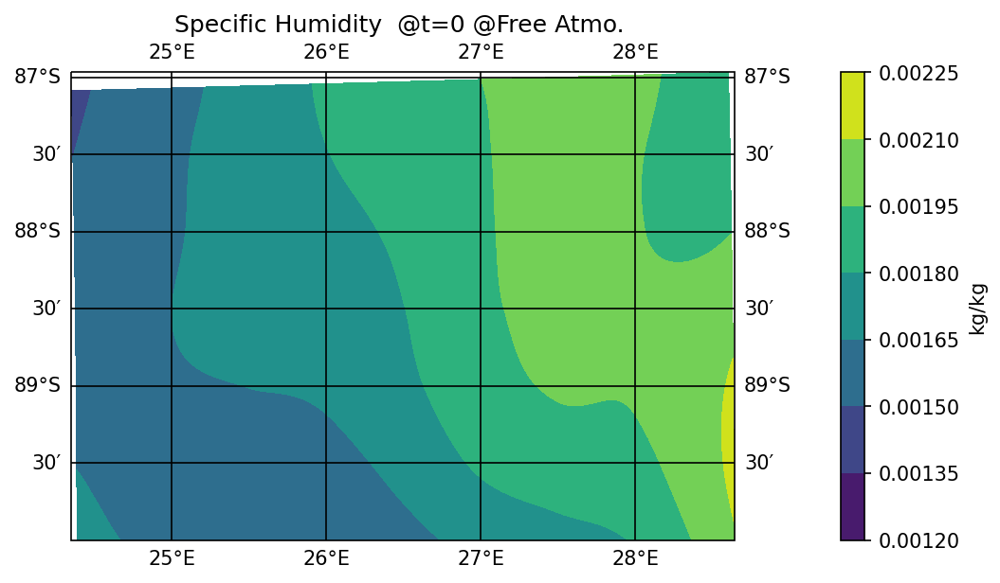

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


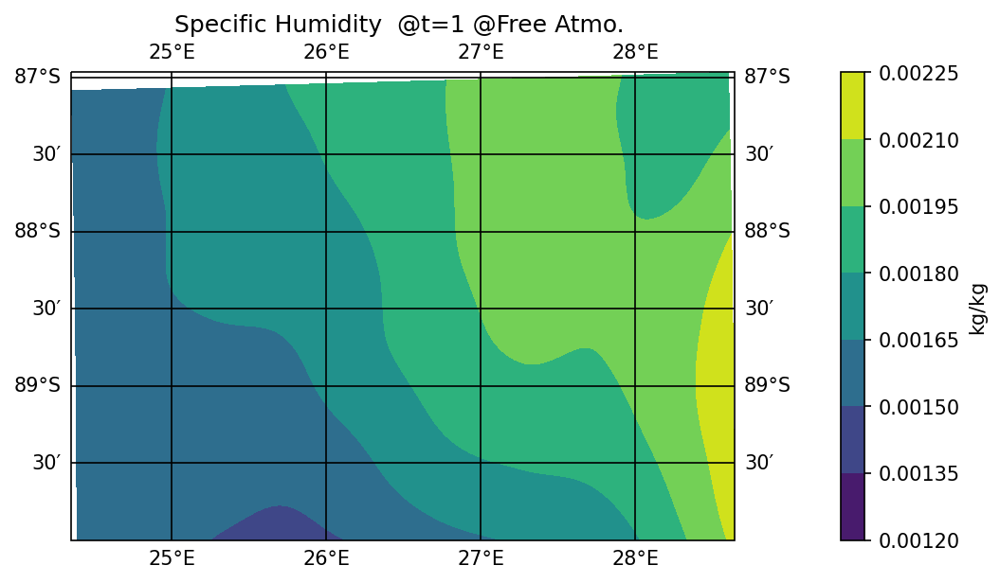

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


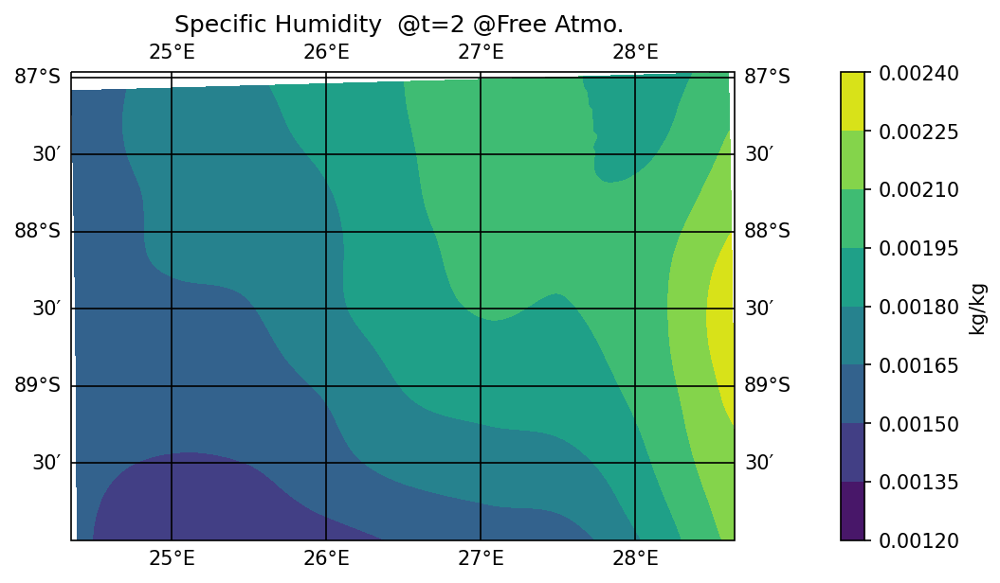

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


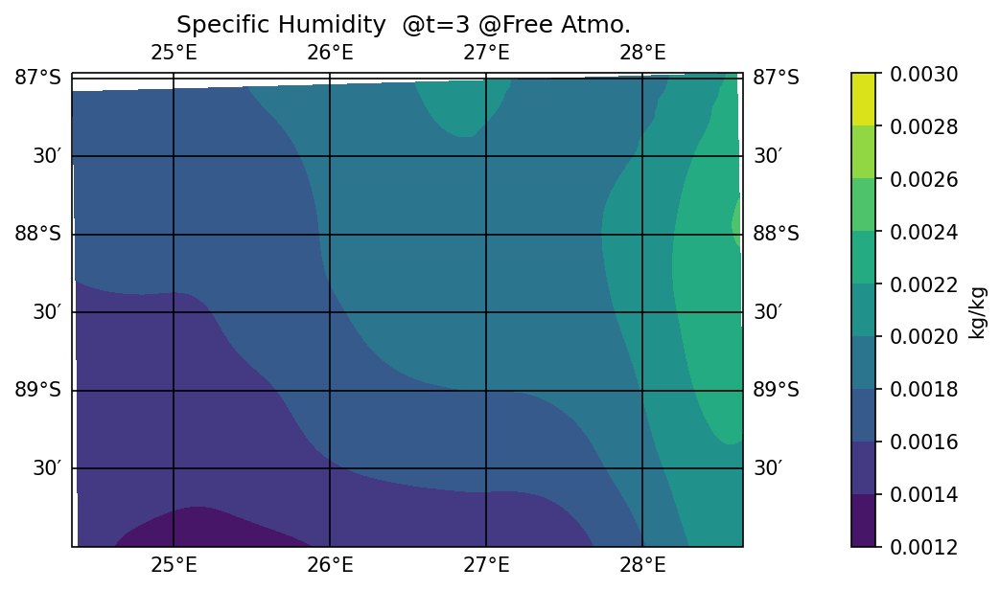

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


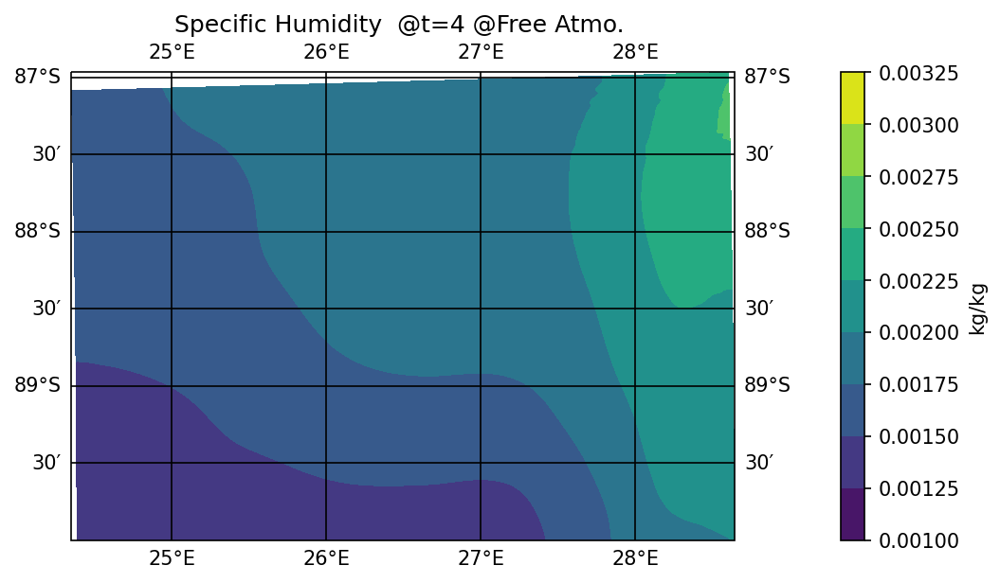

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


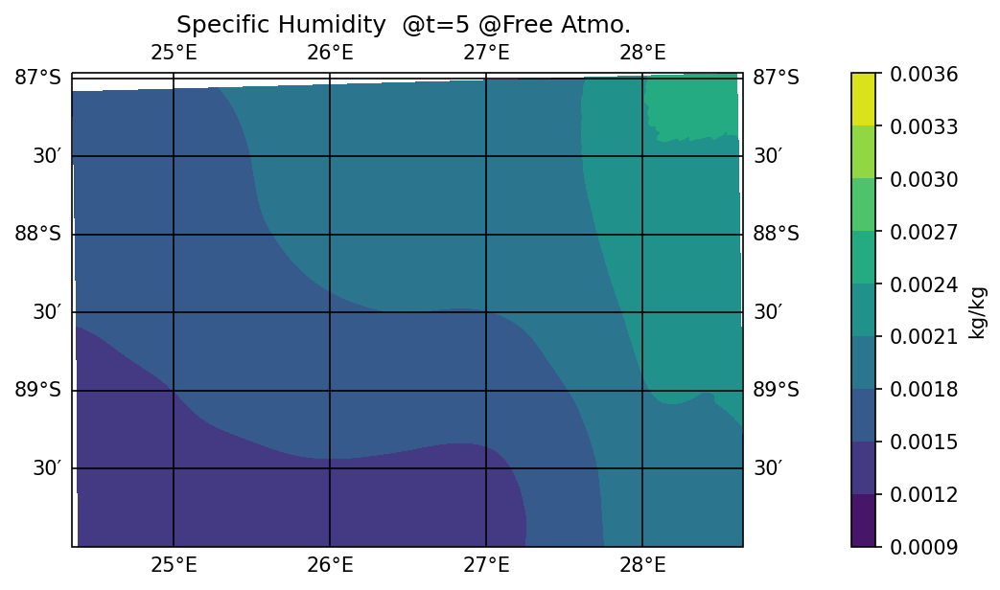

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


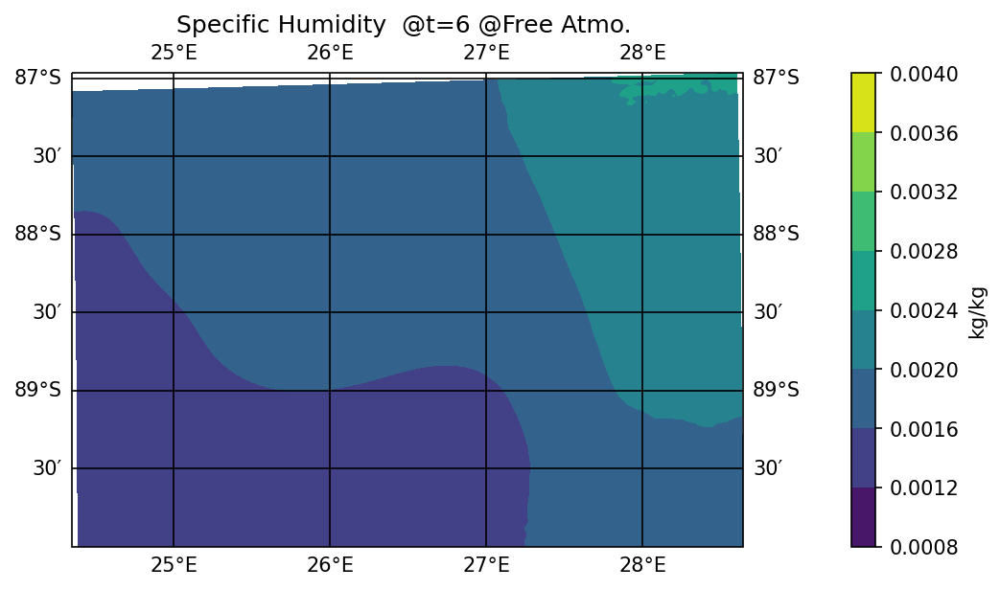

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


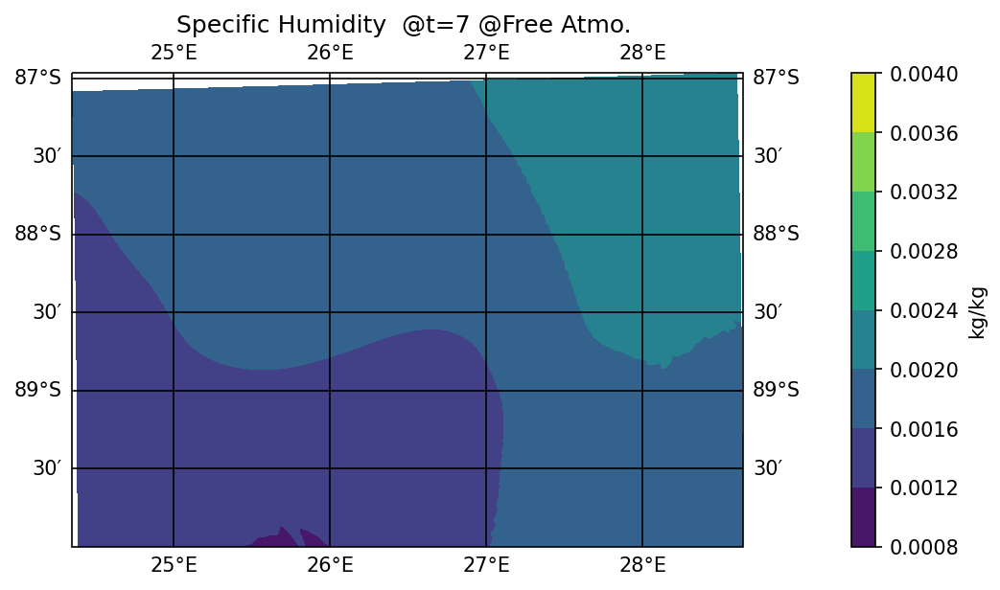

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


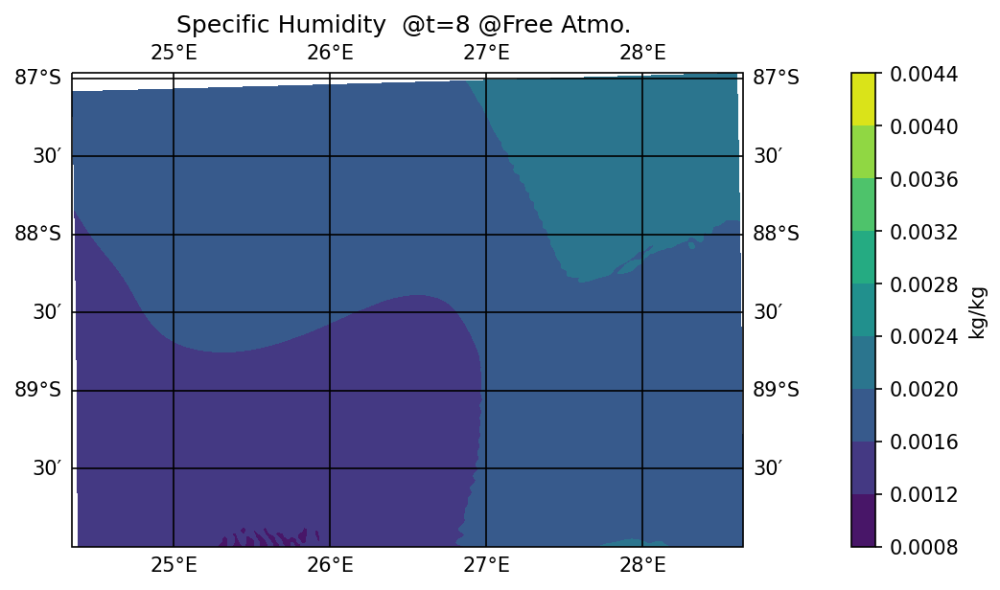

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


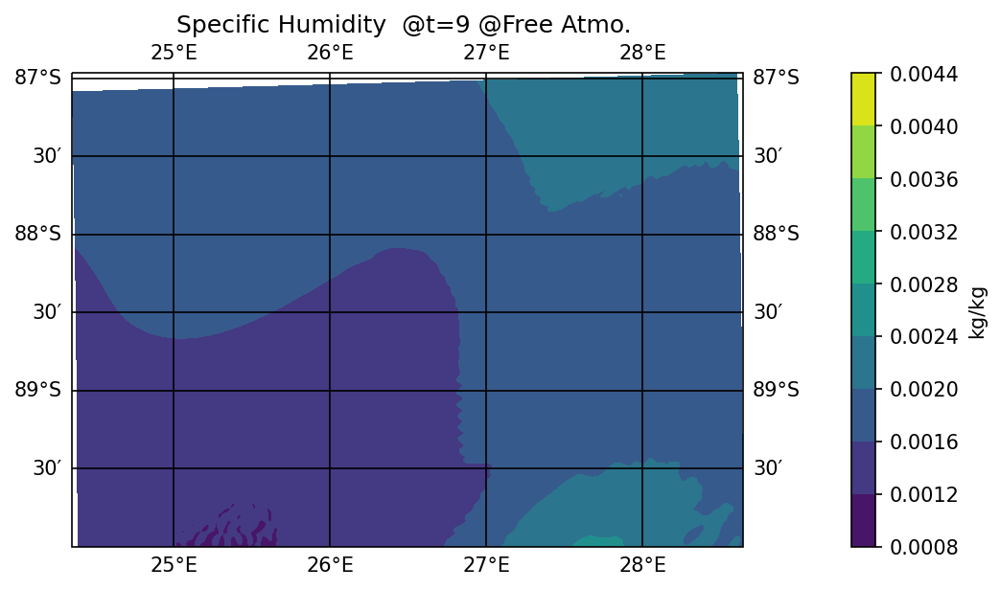

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


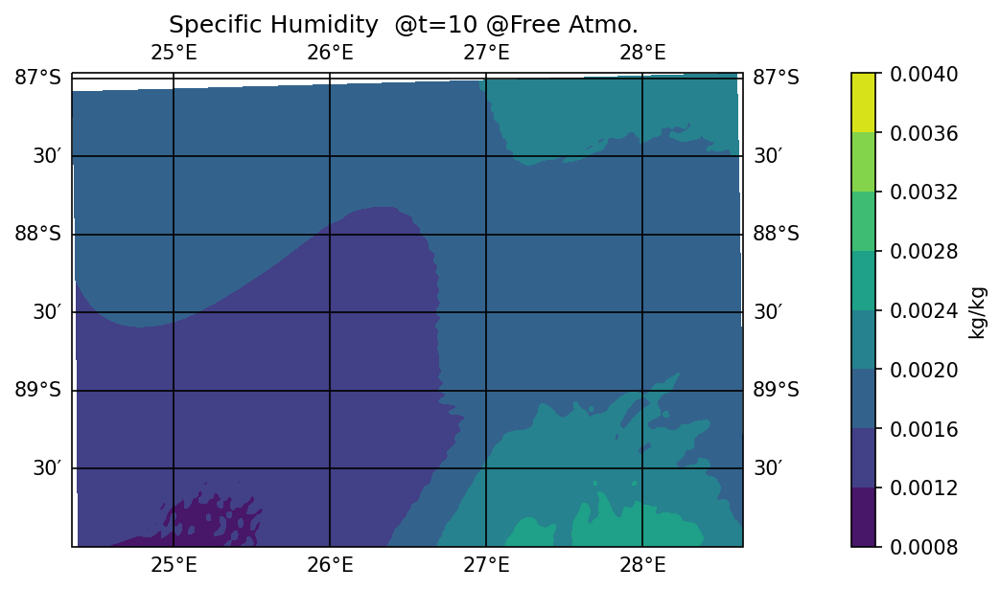

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


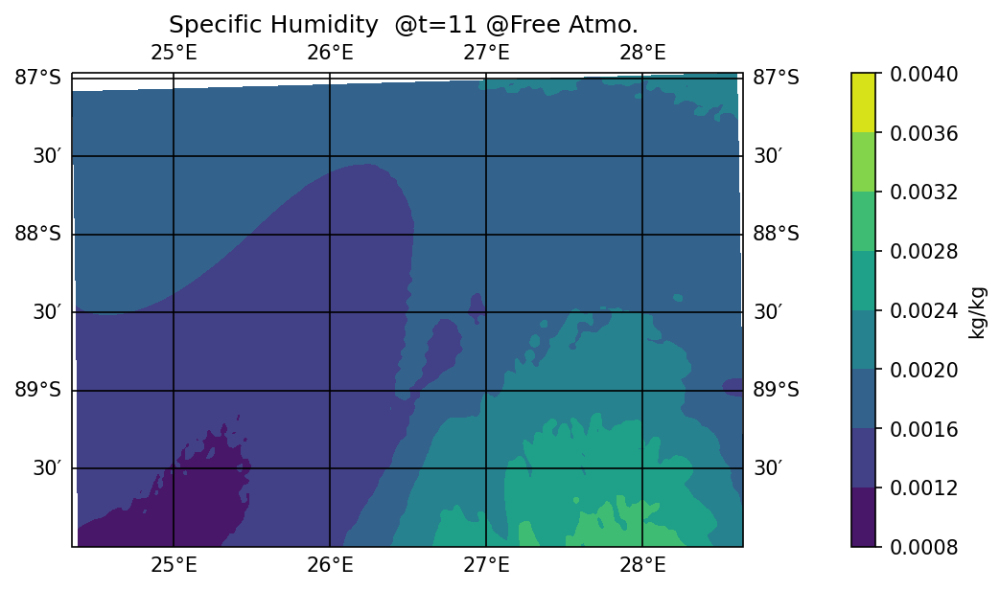

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


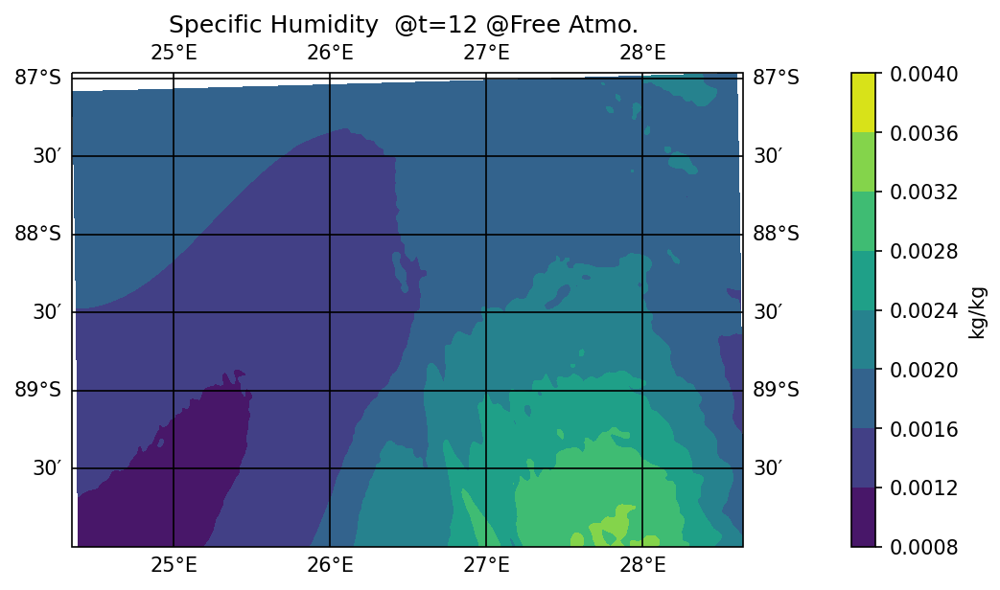

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


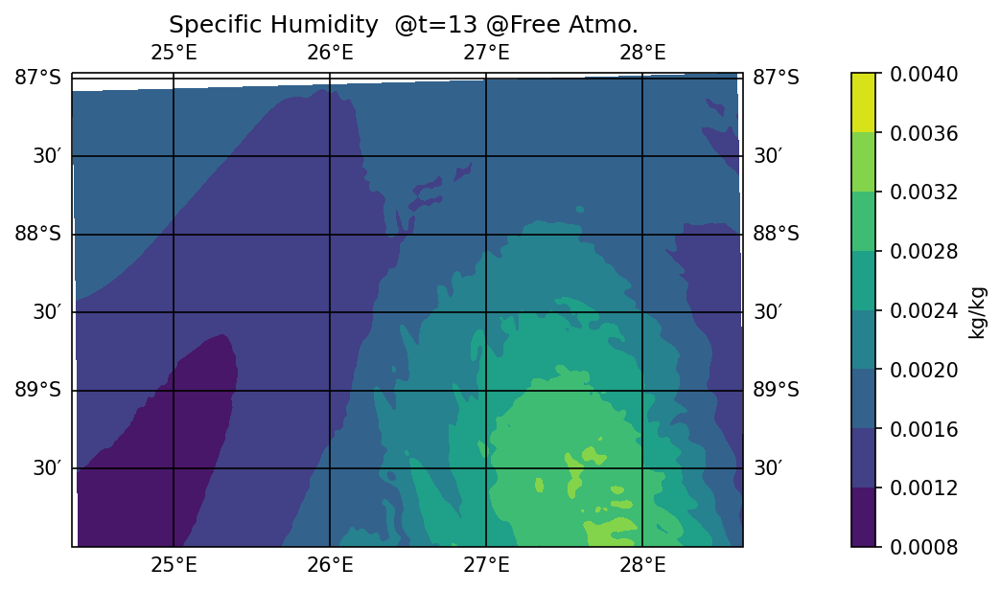

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


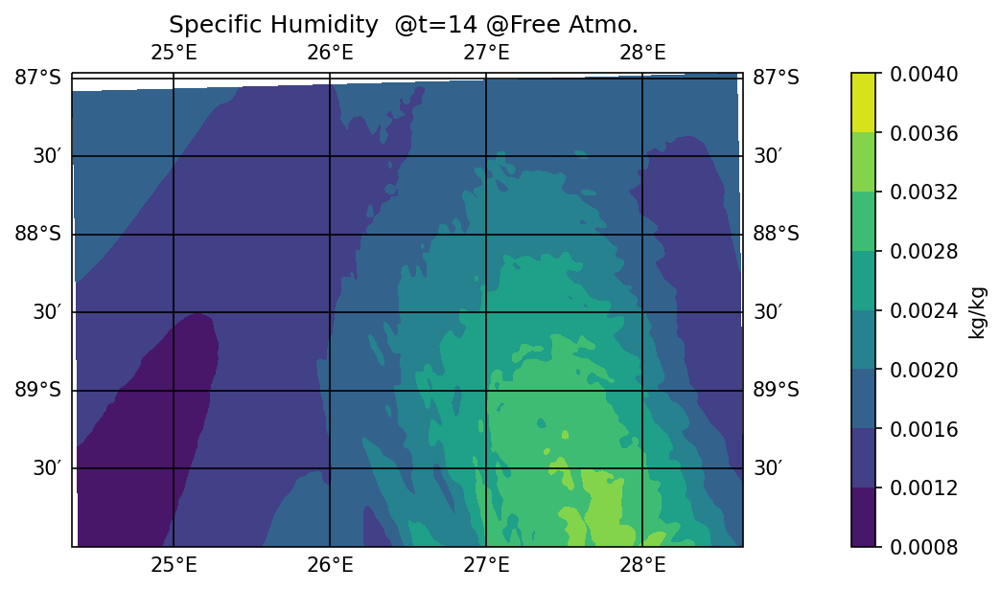

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


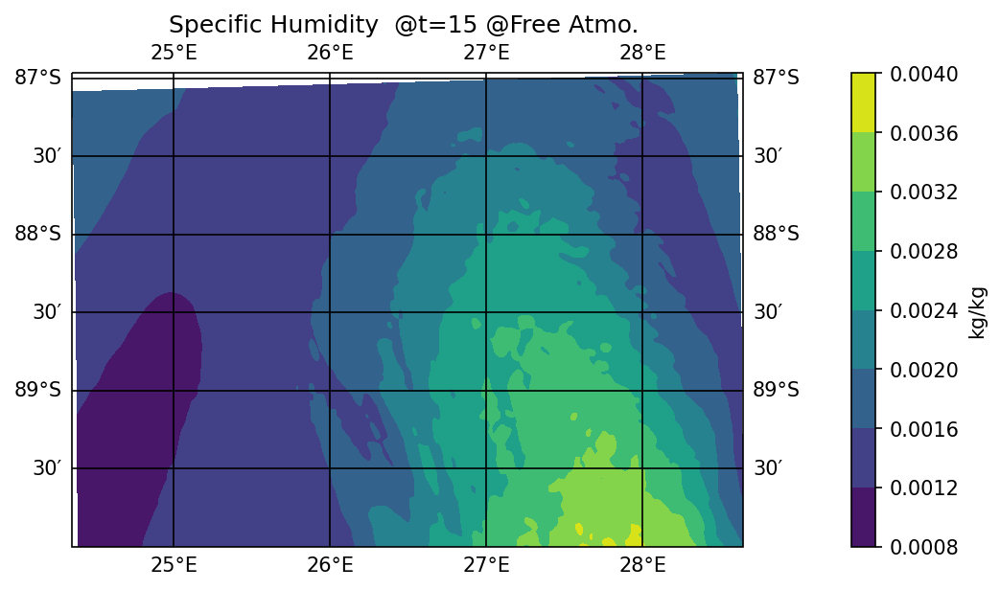

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


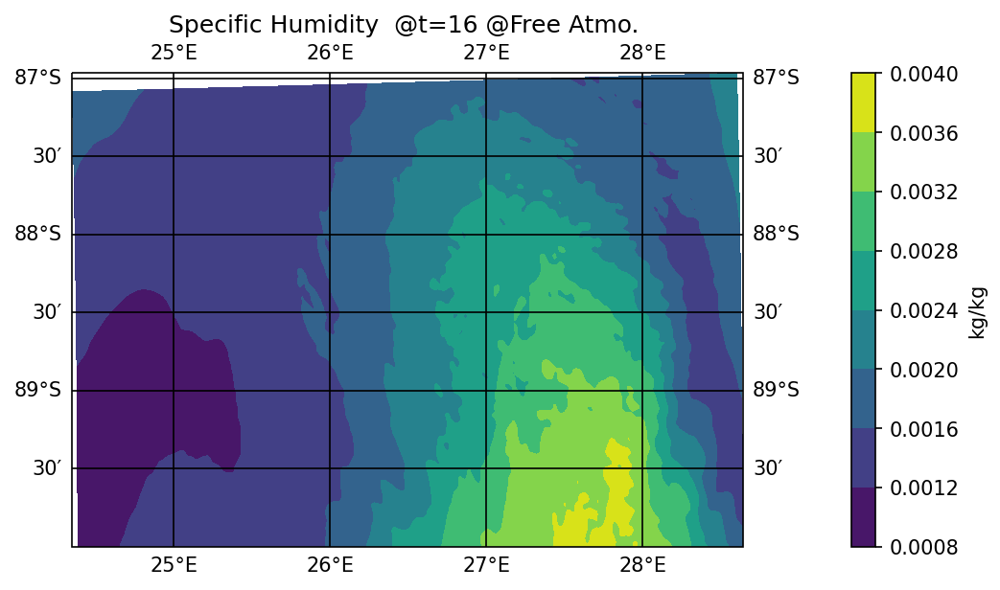

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


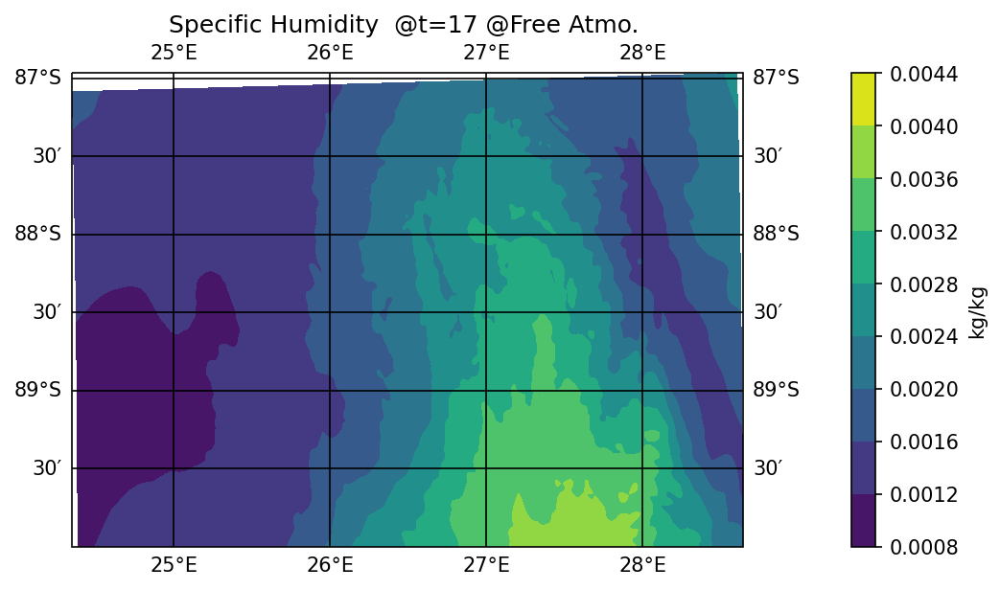

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


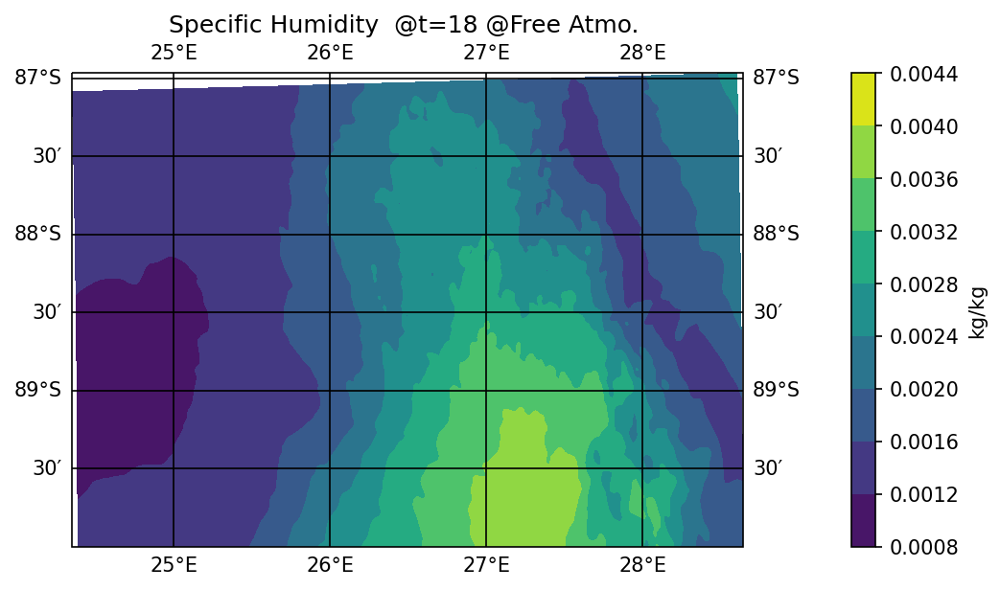

In [9]:
#qv plots (eta = 0, 5, 26)


#eta = 0
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_6[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity @t=0 @Surface ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta0_time0.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_7[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity @t=1 @Surface ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta0_time1.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_8[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity @t=2 @Surface ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta0_time2.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_9[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity @t=3 @Surface ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta0_time3.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_10[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity @t=4 @Surface ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta0_time4.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_11[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity @t=5 @Surface ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta0_time5.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_12[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity @t=6 @Surface ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta0_time6.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_13[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity @t=7 @Surface ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta0_time7.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_14[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity @t=8 @Surface ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta0_time8.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_15[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity @t=9 @Surface ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta0_time9.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_16[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity @t=10 @Surface ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta0_time10.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_17[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity @t=11 @Surface ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta0_time11.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_18[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity @t=12 @Surface ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta0_time12.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_19[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity @t=13 @Surface ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta0_time13.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_20[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity @t=14 @Surface ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta0_time14.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_21[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity @t=15 @Surface ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta0_time15.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_22[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity @t=16 @Surface ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta0_time16.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_23[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity @t=17 @Surface ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta0_time17.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_24[0,0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity @t=18 @Surface ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta0_time18.png', bbox_inches = 'tight',dpi = 150)
plt.show()

#eta = 5
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_6[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity  @t=0 @PBL ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta5_time0.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_7[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity  @t=1 @PBL ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta5_time1.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_8[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity  @t=2 @PBL ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta5_time2.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_9[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity  @t=3 @PBL ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta5_time3.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_10[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity  @t=4 @PBL ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta5_time4.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_11[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity  @t=5 @PBL ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta5_time5.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_12[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity  @t=6 @PBL ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta5_time6.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_13[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity  @t=7 @PBL ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta5_time7.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_14[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity  @t=8 @PBL ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta5_time8.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_15[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity  @t=9 @PBL ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta5_time9.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_16[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity  @t=10 @PBL ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta5_time10.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_17[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity  @t=11 @PBL ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta5_time11.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_18[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity  @t=12 @PBL ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta5_time12.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_19[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity  @t=13 @PBL ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta5_time13.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_20[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity  @t=14 @PBL ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta5_time14.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_21[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity  @t=15 @PBL ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta5_time15.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_22[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity  @t=16 @PBL ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta5_time16.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_23[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity  @t=17 @PBL ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta5_time17.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_24[0,5,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity  @t=18 @PBL ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta5_time18.png', bbox_inches = 'tight',dpi = 150)
plt.show()

#eta = 26 ######################################################
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_6[0,26,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity  @t=0 @Free Atmo. ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta26_time0.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_7[0,26,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity  @t=1 @Free Atmo. ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta26_time1.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_8[0,26,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity  @t=2 @Free Atmo. ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta26_time2.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_9[0,26,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity  @t=3 @Free Atmo. ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta26_time3.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_10[0,26,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity  @t=4 @Free Atmo. ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta26_time4.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_11[0,26,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity  @t=5 @Free Atmo. ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta26_time5.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_12[0,26,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity  @t=6 @Free Atmo. ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta26_time6.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_13[0,26,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity  @t=7 @Free Atmo. ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta26_time7.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_14[0,26,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity  @t=8 @Free Atmo. ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta26_time8.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_15[0,26,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity  @t=9 @Free Atmo. ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta26_time9.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_16[0,26,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity  @t=10 @Free Atmo. ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta26_time10.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_17[0,26,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity  @t=11 @Free Atmo. ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta26_time11.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_18[0,26,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity  @t=12 @Free Atmo. ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta26_time12.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_19[0,26,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity  @t=13 @Free Atmo. ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta26_time13.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_20[0,26,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity  @t=14 @Free Atmo. ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta26_time14.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_21[0,26,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity  @t=15 @Free Atmo. ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta26_time15.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_22[0,26,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity  @t=16 @Free Atmo. ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta26_time16.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_23[0,26,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity  @t=17 @Free Atmo. ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta26_time17.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], qv_24[0,26,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'kg/kg')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Specific Humidity  @t=18 @Free Atmo. ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'qv_eta26_time18.png', bbox_inches = 'tight',dpi = 150)
plt.show()


In [4]:
#calculate wind stress 

roh = 1.225 #kg/m^3

stress_6 = roh*ustar_6**2
stress_7 = roh*ustar_7**2
stress_8 = roh*ustar_8**2
stress_9 = roh*ustar_9**2
stress_10 = roh*ustar_10**2
stress_11 = roh*ustar_11**2
stress_12 = roh*ustar_12**2
stress_13 = roh*ustar_13**2
stress_14 = roh*ustar_14**2
stress_15 = roh*ustar_15**2
stress_16 = roh*ustar_16**2
stress_17 = roh*ustar_17**2
stress_18 = roh*ustar_19**2
stress_19 = roh*ustar_19**2
stress_20 = roh*ustar_20**2
stress_21 = roh*ustar_21**2
stress_22 = roh*ustar_22**2
stress_23 = roh*ustar_23**2
stress_24 = roh*ustar_24**2


C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


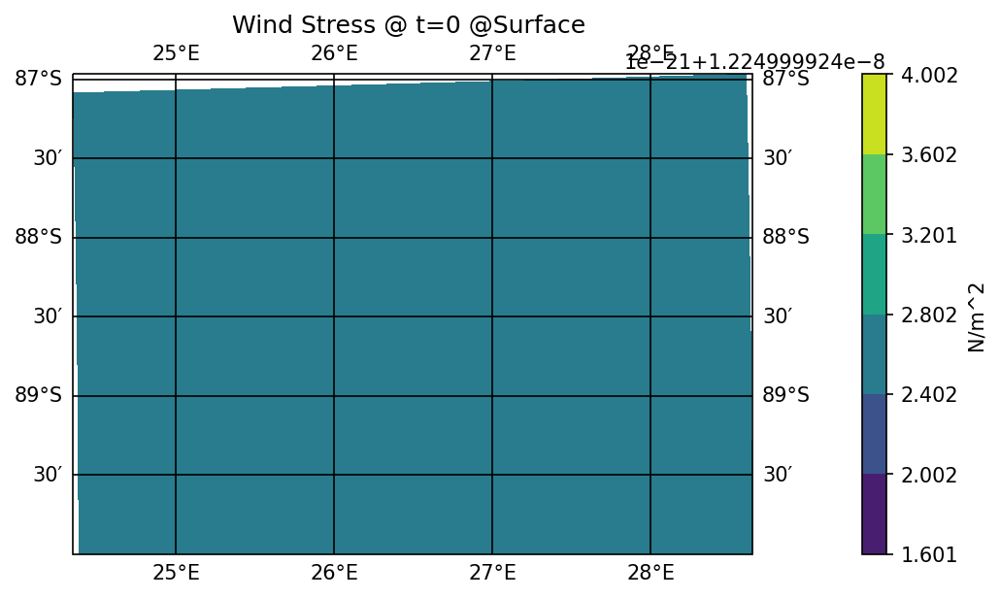

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


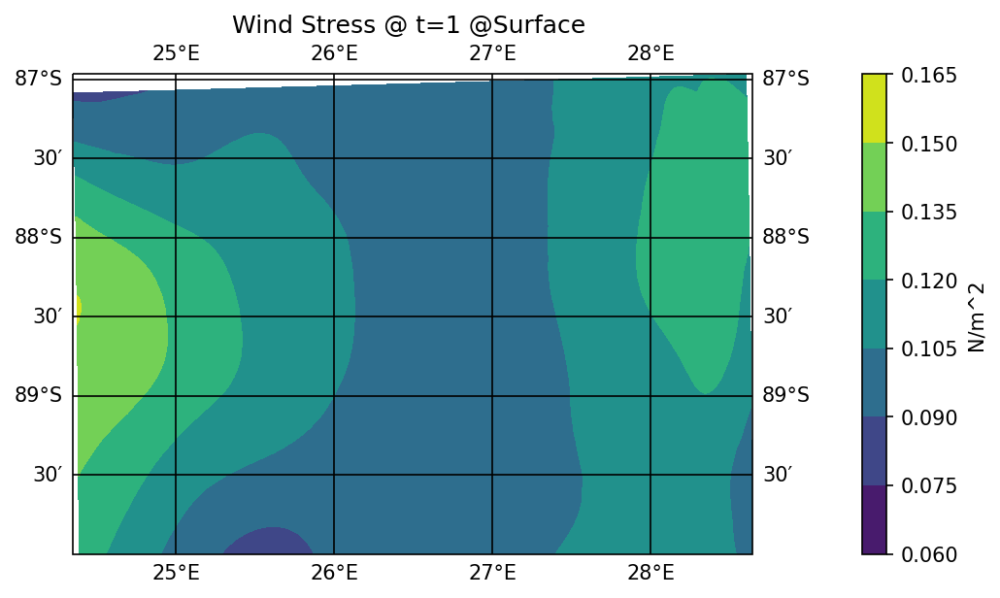

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


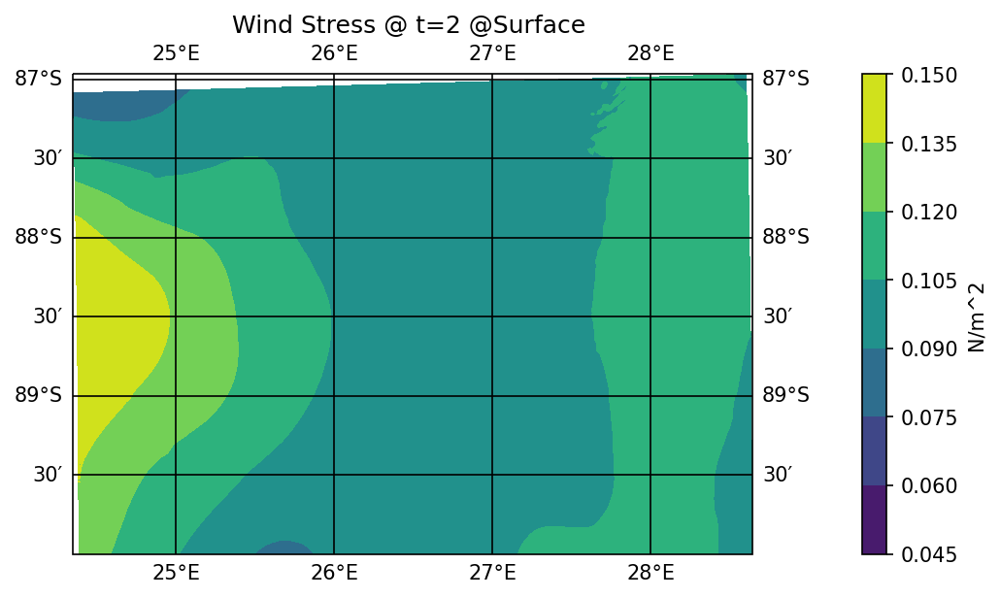

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


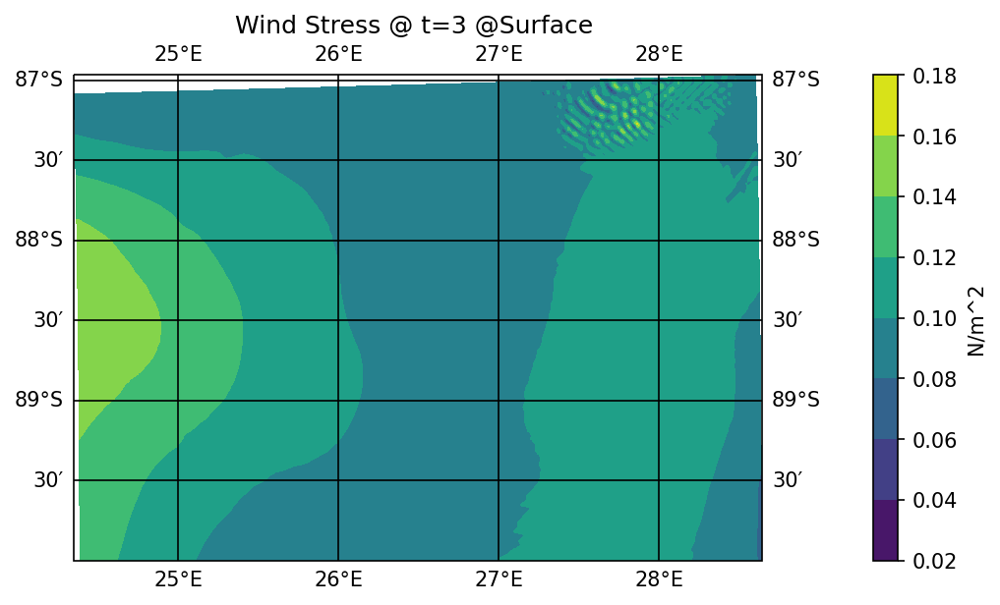

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


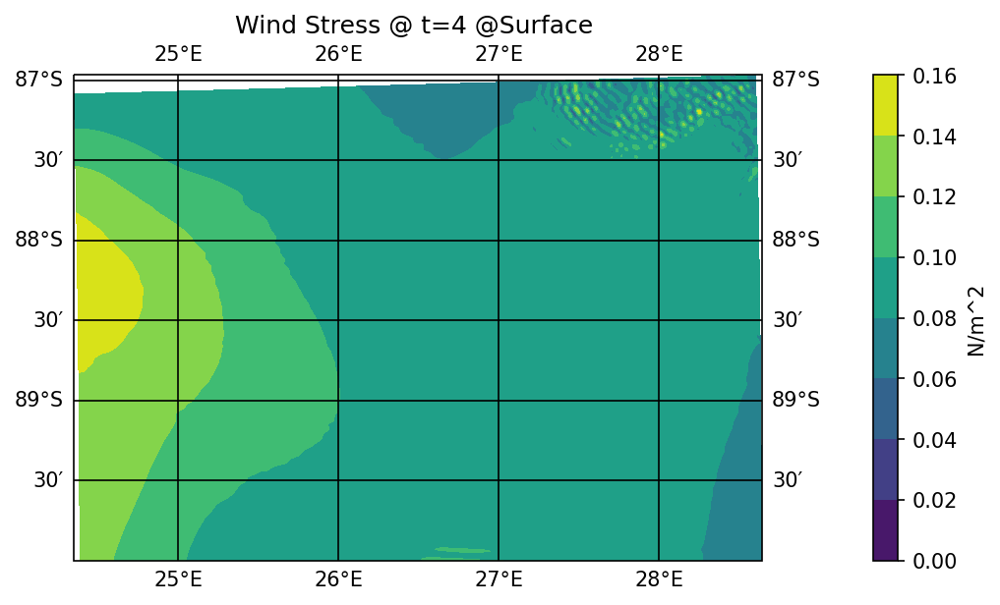

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


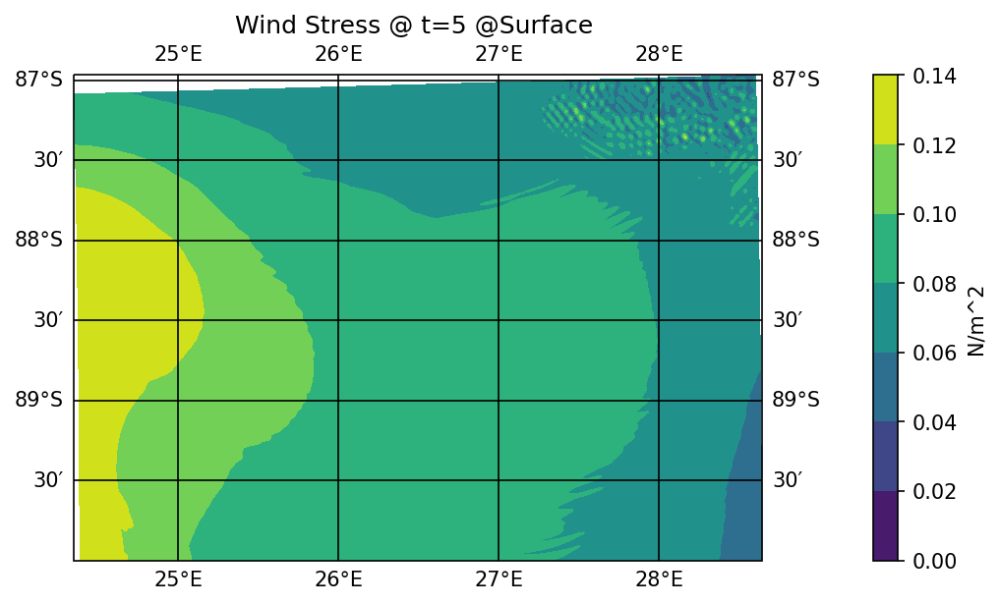

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


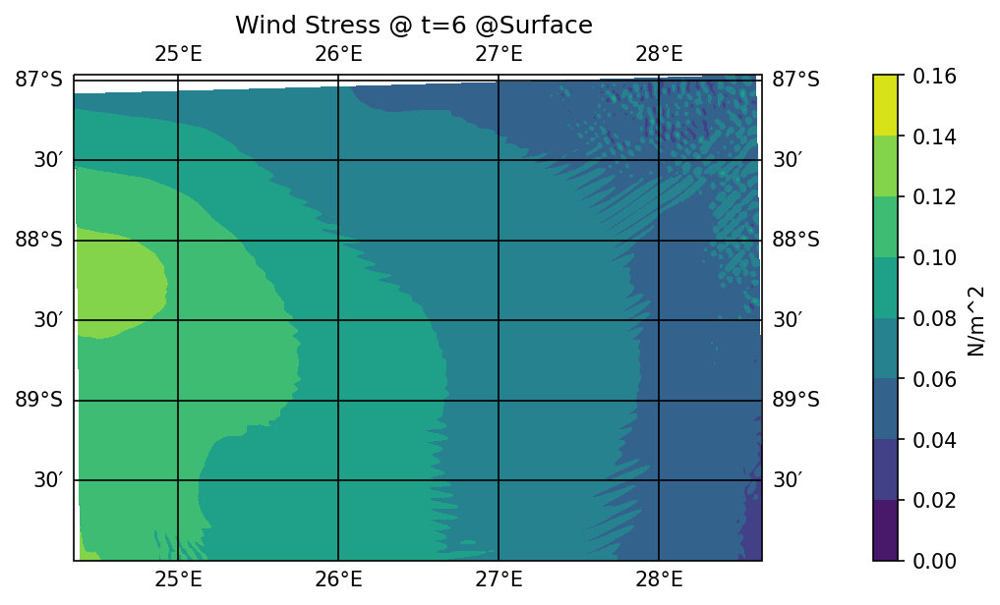

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


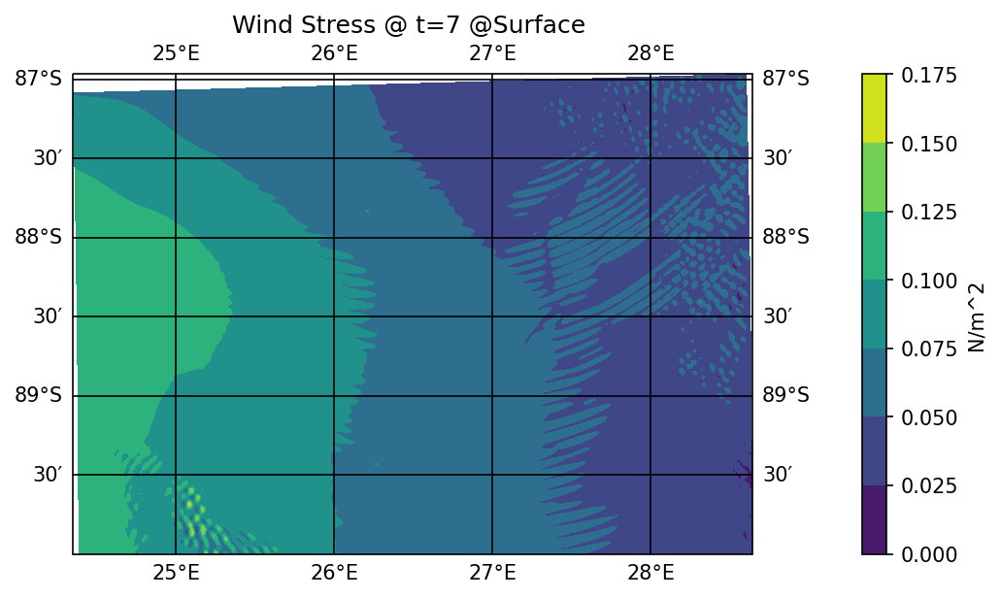

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


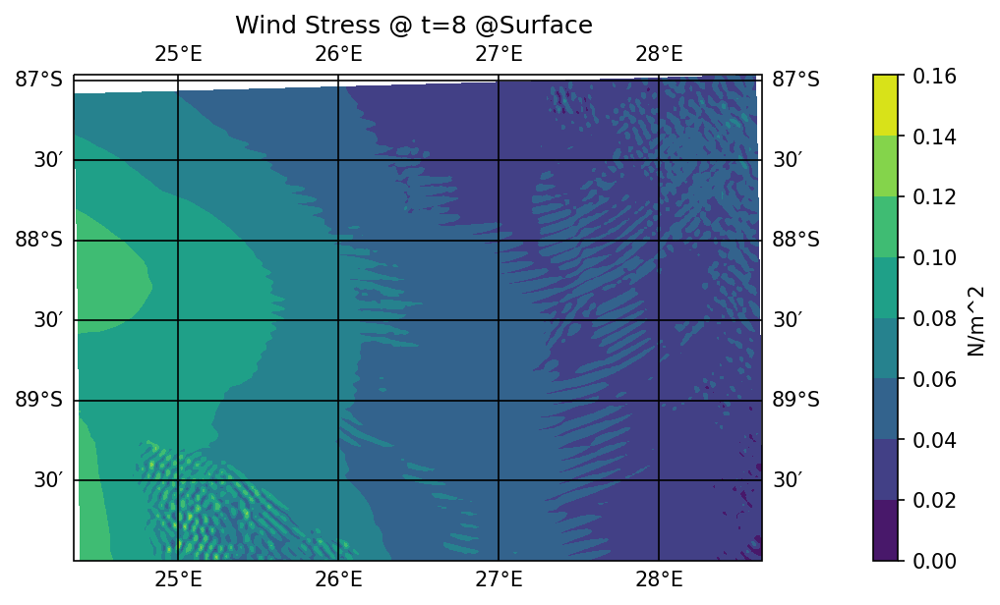

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


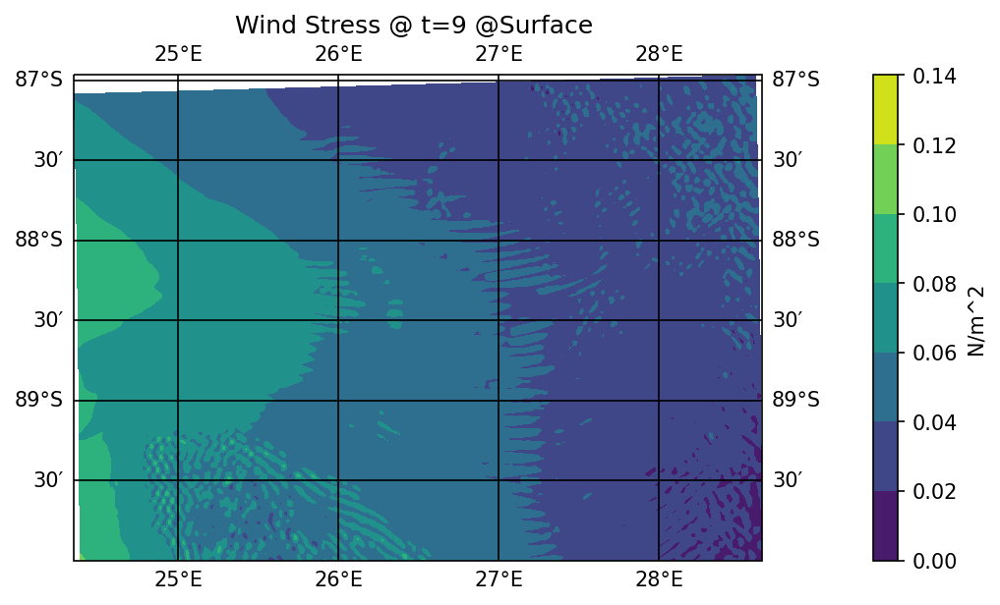

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


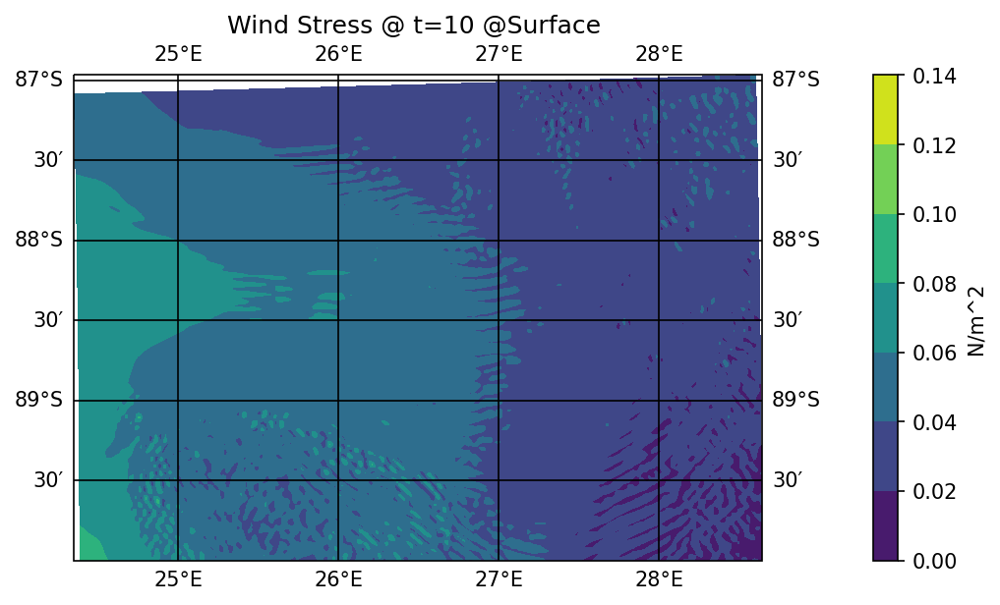

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


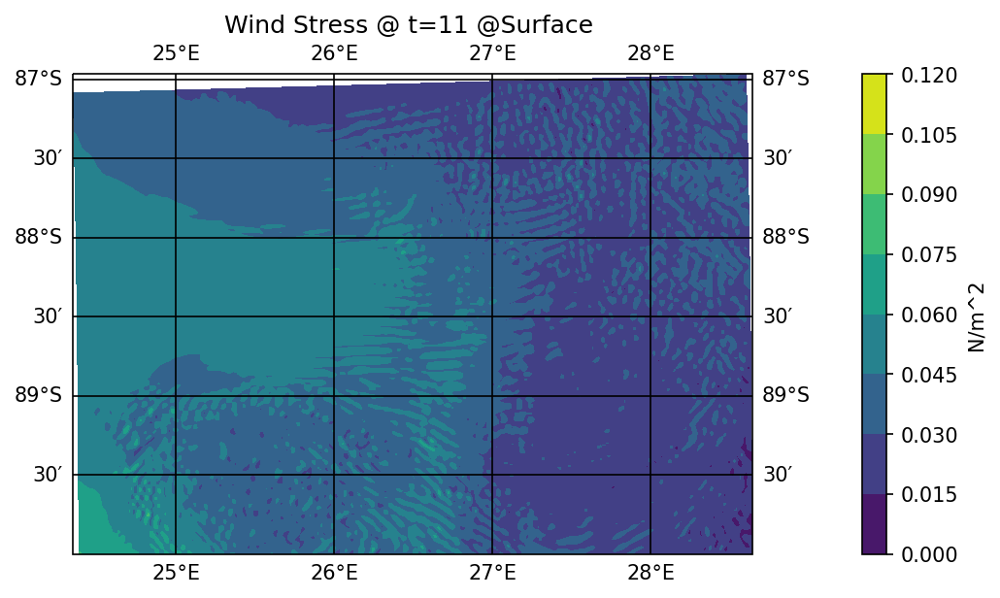

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


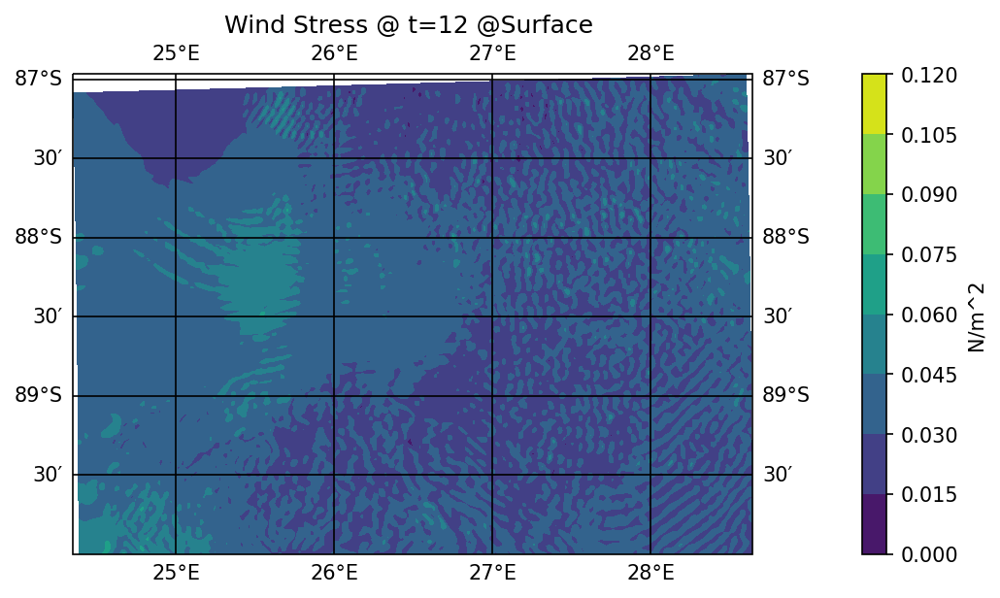

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


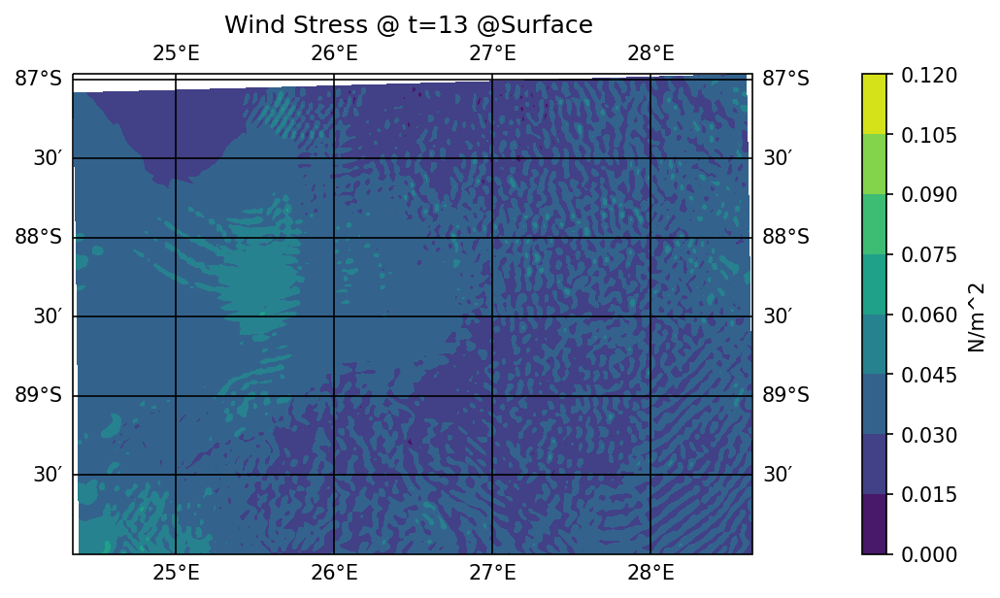

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


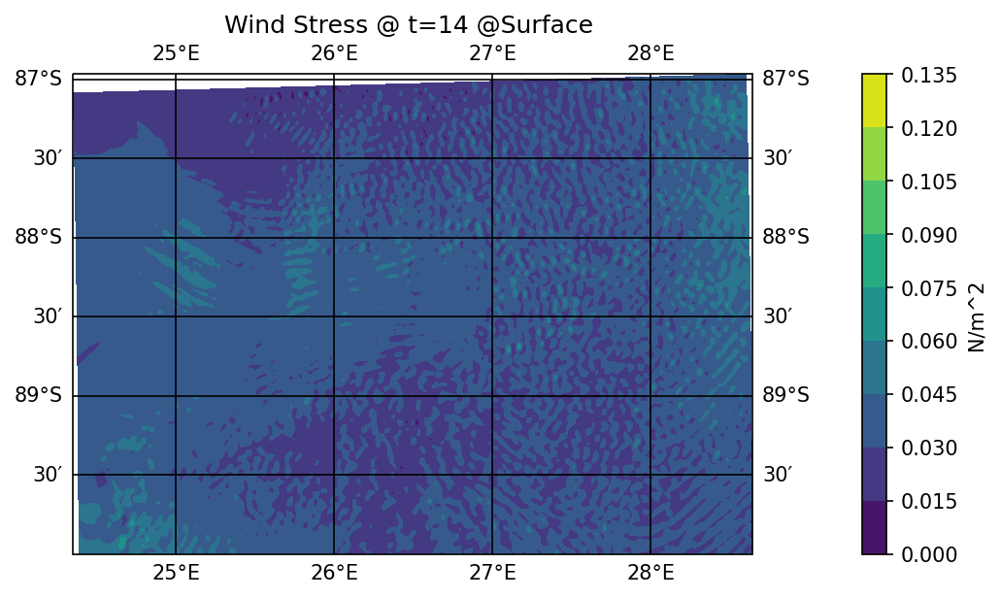

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


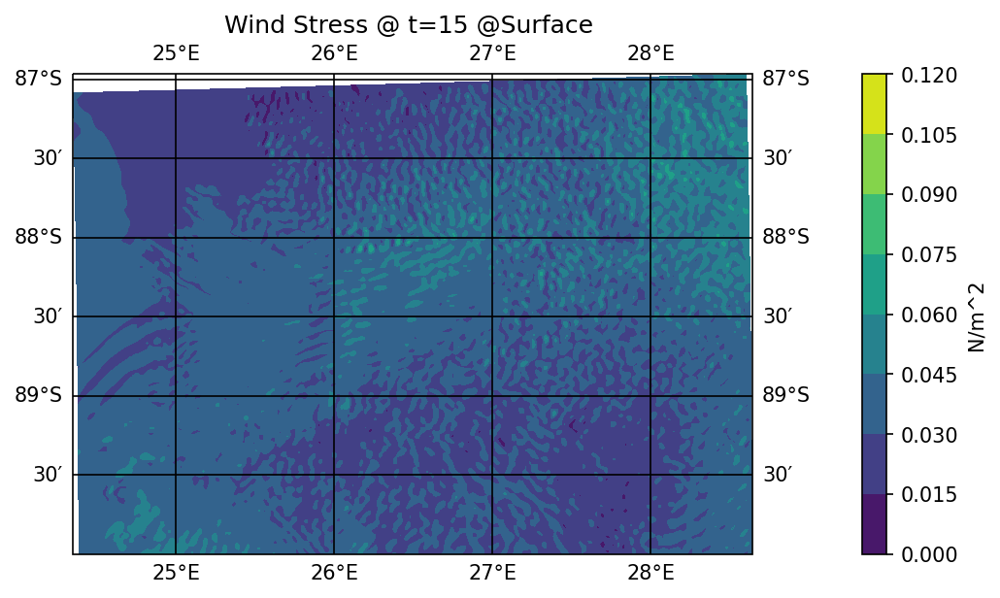

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


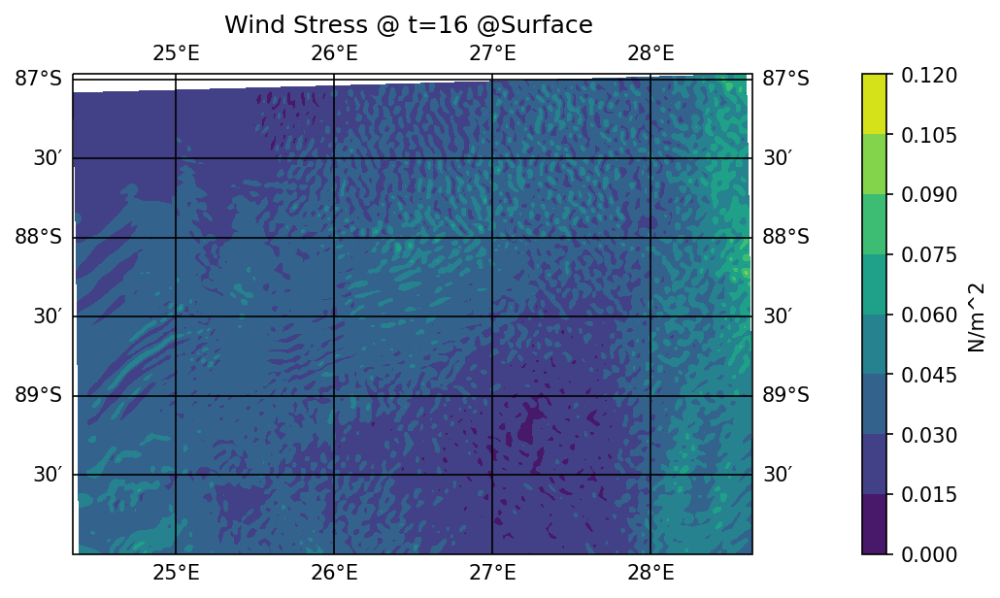

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


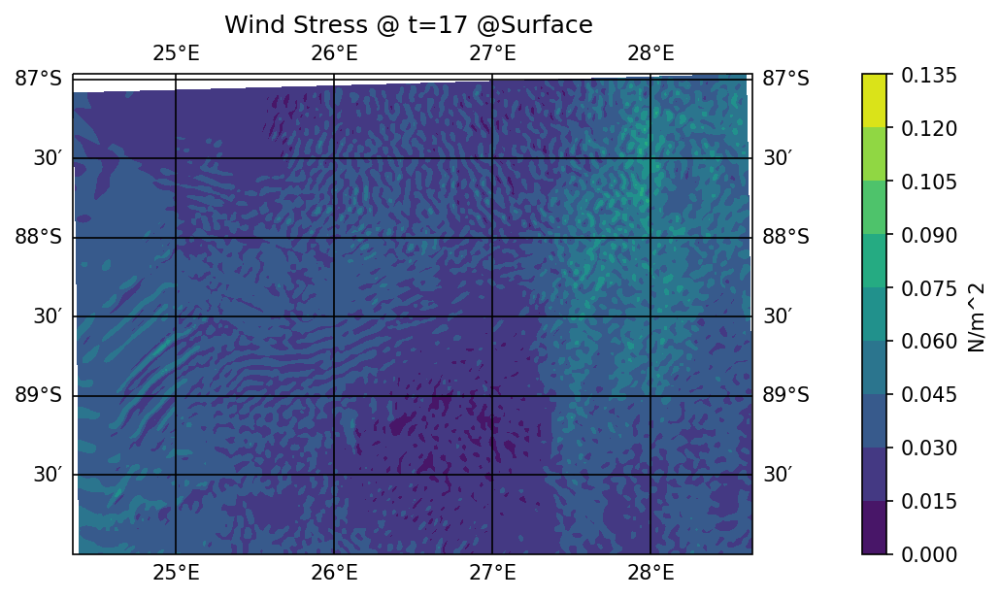

C:\Users\Anna\anaconda3\envs\metpy\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '


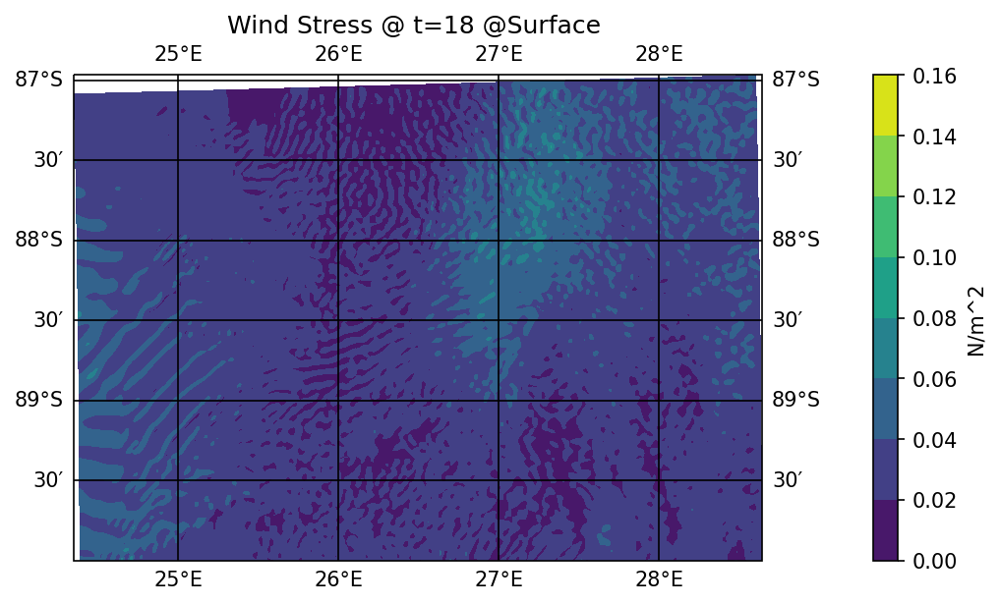

In [6]:
#plot wind stress

#0 eta
mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], stress_6[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'N/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Wind Stress @ t=0 @Surface ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'stress_eta0_time0.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], stress_7[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'N/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Wind Stress @ t=1 @Surface ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'stress_eta0_time1.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], stress_8[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'N/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Wind Stress @ t=2 @Surface ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'stress_eta0_time2.png', bbox_inches = 'tight',dpi = 150)
plt.show()


mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], stress_9[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'N/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Wind Stress @ t=3 @Surface ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'stress_eta0_time3.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], stress_10[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'N/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Wind Stress @ t=4 @Surface ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'stress_eta0_time4.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], stress_11[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'N/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Wind Stress @ t=5 @Surface ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'stress_eta0_time5.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], stress_12[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'N/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Wind Stress @ t=6 @Surface ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'stress_eta0_time6.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], stress_13[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'N/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Wind Stress @ t=7 @Surface ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'stress_eta0_time7.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], stress_14[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'N/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Wind Stress @ t=8 @Surface ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'stress_eta0_time8.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], stress_15[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'N/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Wind Stress @ t=9 @Surface ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'stress_eta0_time9.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], stress_16[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'N/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Wind Stress @ t=10 @Surface ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'stress_eta0_time10.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], stress_17[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'N/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Wind Stress @ t=11 @Surface ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'stress_eta0_time11.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], stress_18[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'N/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Wind Stress @ t=12 @Surface ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'stress_eta0_time12.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], stress_19[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'N/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Wind Stress @ t=13 @Surface ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'stress_eta0_time13.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], stress_20[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'N/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Wind Stress @ t=14 @Surface ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'stress_eta0_time14.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], stress_21[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'N/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Wind Stress @ t=15 @Surface ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'stress_eta0_time15.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], stress_22[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'N/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Wind Stress @ t=16 @Surface ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'stress_eta0_time16.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], stress_23[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'N/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Wind Stress @ t=17 @Surface ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'stress_eta0_time17.png', bbox_inches = 'tight',dpi = 150)
plt.show()

mapcrs = ccrs.PlateCarree()
fig = plt.figure(figsize=(8, 4), dpi=150)
ax = fig.add_subplot(111, projection=mapcrs)
ax.coastlines()
cs = ax.contourf(xlat[0,:,:], xlon[0,:,:], stress_24[0,:,:])
PCM=ax.get_children()[2]
plt.colorbar(cs, ax=ax, pad = 0.1, label = 'N/m^2')
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, color = 'black')
plt.tight_layout()
gl.top_labels = False
gl.ylabels_right = False
plt.title('Wind Stress @ t=18 @Surface ')
save_results_to = '/Users/Anna/Desktop/WRF/shortRunSST/'
plt.savefig(save_results_to + 'stress_eta0_time18.png', bbox_inches = 'tight',dpi = 150)
plt.show()

